# 1.0 Introdução

---


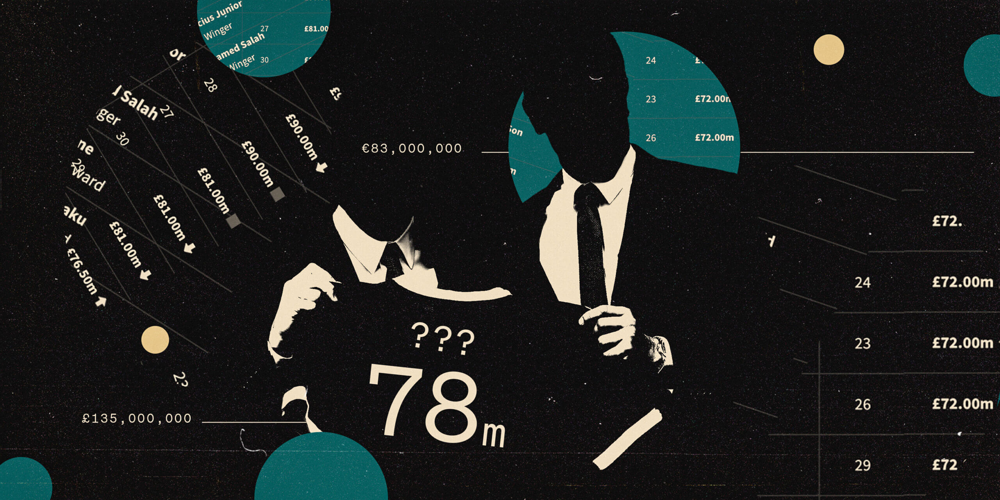

A ascensão da inteligência artificial revolucionou a análise de dados no mundo do futebol, permitindo a previsão precisa do valor dos jogadores com base em uma miríade de variáveis. Este projeto se concentrou em explorar o pipeline de dados para prever os valores de jogadores nas temporadas 2017/18, 2018/19 e 2019/20 do futebol europeu, utilizando uma base robusta disponível no [Kaggle](https://www.kaggle.com/datasets/kriegsmaschine/soccer-players-values-and-their-statistics).

Além de mergulhar na complexidade dos algoritmos preditivos, o trabalho destaca o crescente interesse global pelo futebol, evidenciado pelo aumento exponencial na audiência ao longo dos anos. A capacidade de estimar o valor de um jogador tornou-se crucial para os clubes, influenciando estratégias de transferência, investimentos e formação de equipes competitivas. Este estudo não apenas oferece insights sobre a valoração de jogadores, mas também lança luz sobre o papel essencial da análise de dados no cenário do futebol moderno.

# 2.0 Bibliotecas Utilizadas

---

Na execução deste projeto, empregamos bibliotecas Python que disponibilizam uma ampla gama de funcionalidades essenciais para a ciência de dados, incluindo `scikit-learn`, `pandas` e `numpy`. Além disso, aproveitamos as diretrizes de visualização gráfica através de bibliotecas como `Matplotlib` e `Seaborn`.

In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
import lightgbm as lgb
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import json

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, HuberRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVR

from lightgbm import LGBMRegressor

from IPython.display import display, HTML

from matplotlib.ticker import FuncFormatter

from google.colab import drive

warnings.filterwarnings('ignore')
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 3.0 Análise Exploratória

---

O primeiro e crucial estágio no pipeline de dados da inteligência artificial é a profunda compreensão do conjunto de dados a ser analisado e processado. Esta fase engloba uma exploração detalhada da estrutura, qualidade e composição dos dados, estabelecendo uma base robusta para as análises subsequentes no pipeline de IA. A compreensão abrangente dos dados é essencial para identificar padrões, tendências e insights valiosos que impulsionarão as decisões e descobertas ao longo do projeto de inteligência artificial. Assim, a análise inicial e a familiarização completa com os dados representam os alicerces fundamentais para o sucesso em qualquer empreendimento dentro do pipeline de dados da inteligência artificial.

## 3.1 Leitura dos Dados


A leitura da base de dados é o processo inicial de importação e carregamento dos dados para análise.

In [ ]:
PATH_SEASON1718 = '/content/drive/MyDrive/Kaggle/PlayerValue/transfermarkt_fbref_201718.csv'
PATH_SEASON1819 = '/content/drive/MyDrive/Kaggle/PlayerValue/transfermarkt_fbref_201819.csv'
PATH_SEASON1920 = '/content/drive/MyDrive/Kaggle/PlayerValue/transfermarkt_fbref_2019.csv'

In [ ]:
df1718 = pd.read_csv(PATH_SEASON1718, delimiter=';', index_col=0)
df1819 = pd.read_csv(PATH_SEASON1819, delimiter=';', index_col=0)
df1920 = pd.read_csv(PATH_SEASON1920, delimiter=';', index_col=0)

print(f'Shape season 17/18:\t{df1718.shape}')
print(f'Shape season 18/19:\t{df1819.shape}')
print(f'Shape season 19/20:\t{df1920.shape}')

Shape season 17/18:	 (2232, 399)
Shape season 18/19:	 (2232, 399)
Shape season 19/20:	 (2644, 399)


In [ ]:
def get_data():
  return pd.concat([df1718, df1819, df1920])

In [ ]:
df_all = get_data()

print(f'Shape all:\t{df_all.shape}')

Shape all:	 (7108, 399)


In [ ]:
df_all.head(5)

,player,nationality,position,squad,age,birth_year,value,height,position2,foot,...,Pts/G,xG,xGA,xGDiff,xGDiff/90,Attendance,CL,WinCL,CLBestScorer,Season
379.0,Burgui,es ESP,"FW,MF",Alavés,23.0,1993.0,1800000.0,186.0,attack - Left Winger,right,...,1.24,39.0,53.2,-14.2,-0.37,"16,819",0.0,0.0,0.0,201718#
2530.0,Raphaël Varane,fr FRA,DF,Real Madrid,24.0,1993.0,70000000.0,191.0,Defender - Centre-Back,right,...,2.00,83.3,45.4,37.9,1.00,66161,1.0,1.0,0.0,201718#
721.0,Rubén Duarte,es ESP,DF,Alavés,21.0,1995.0,2000000.0,179.0,Defender - Left-Back,left,...,1.24,39.0,53.2,-14.2,-0.37,"16,819",0.0,0.0,0.0,201718#
2512.0,Samuel Umtiti,fr FRA,DF,Barcelona,23.0,1993.0,60000000.0,182.0,Defender - Centre-Back,left,...,2.45,78.3,41.1,37.2,0.98,66603,1.0,0.0,0.0,201718#
882.0,Manu García,es ESP,MF,Alavés,31.0,1986.0,1800000.0,183.0,midfield - Defensive Midfield,left,...,1.24,39.0,53.2,-14.2,-0.37,"16,819",0.0,0.0,0.0,201718#


## 3.2 Valores dos Registros

Para manter a qualidade dos dados, faremos uma análise cuidadosa de tuplas nulas e duplicadas no dataset, assegurando a integridade e consistência dos dados. Qualquer decisão será transparentemente documentada, garantindo a confiabilidade do nosso trabalho com os dados.

### 3.2.1 Dados Nulos

In [ ]:
df_all.isna().sum()

player          132
nationality     132
position        132
squad           132
age             132
               ... 
Attendance      132
CL              132
WinCL           132
CLBestScorer    412
Season          132
Length: 399, dtype: int64

Tuplas com valores nulos podem introduzir inconsistências na base de dados, impactando análises e prejudicando a qualidade dos resultados, por isso são excluídas para preservar a integridade dos dados analisados.

In [ ]:
df_all = df_all.dropna()

print(f'Shape all:\t{df_all.shape}')

Shape all:	 (6409, 399)


### 3.2.2 Dados duplicados

In [ ]:
df_all.duplicated().sum()

0

Não havendo tuplas duplicadas na base de dados, não é necessário tomar nenhuma medida adicional, uma vez que não há duplicações a serem tratadas ou corrigidas.

## 3.3 Variáveis Categóricas

In [ ]:
data = {
    'Name': df_all.columns,
    'Type': [df_all[column].dtype for column in df_all.columns],
}

resume_type = pd.DataFrame(data)

In [ ]:
objs = resume_type[resume_type['Type'] == 'object']

objs.head()

,Name,Type
0,player,object
1,nationality,object
2,position,object
3,squad,object
8,position2,object


#### 3.3.1 Nome do Jogador (`player`)

A coluna `player` não será considerada na análise e será descartada do conjunto de dados.

In [ ]:
df_all = df_all.drop(['player'], axis=1)

#### 3.3.2 Nacionalidade (`nationality`)

O campo `nationality` será ajustado para remover os três primeiros caracteres durante o processo de formatação.

In [ ]:
df_all['nationality'] = df_all['nationality'].str.slice(3)

df_all.head(5)

,nationality,position,squad,age,birth_year,value,height,position2,foot,league,...,Pts/G,xG,xGA,xGDiff,xGDiff/90,Attendance,CL,WinCL,CLBestScorer,Season
379.0,ESP,"FW,MF",Alavés,23.0,1993.0,1800000.0,186.0,attack - Left Winger,right,La Liga,...,1.24,39.0,53.2,-14.2,-0.37,"16,819",0.0,0.0,0.0,201718#
2530.0,FRA,DF,Real Madrid,24.0,1993.0,70000000.0,191.0,Defender - Centre-Back,right,La Liga,...,2.00,83.3,45.4,37.9,1.00,66161,1.0,1.0,0.0,201718#
721.0,ESP,DF,Alavés,21.0,1995.0,2000000.0,179.0,Defender - Left-Back,left,La Liga,...,1.24,39.0,53.2,-14.2,-0.37,"16,819",0.0,0.0,0.0,201718#
2512.0,FRA,DF,Barcelona,23.0,1993.0,60000000.0,182.0,Defender - Centre-Back,left,La Liga,...,2.45,78.3,41.1,37.2,0.98,66603,1.0,0.0,0.0,201718#
882.0,ESP,MF,Alavés,31.0,1986.0,1800000.0,183.0,midfield - Defensive Midfield,left,La Liga,...,1.24,39.0,53.2,-14.2,-0.37,"16,819",0.0,0.0,0.0,201718#


#### 3.3.3 Cotas de Televisão (`Attendance`)

A variável `attendance` terá seu tipo alterado de objeto para numérico, uma vez que contém apenas números.

In [ ]:
print(f'dType before:\t{df_all['Attendance'].dtype}')

df_all['Attendance'] = df_all['Attendance'].str.replace(',', '.')
df_all['Attendance'] = df_all['Attendance'].astype(float)

print(f'dType before:\t{df_all['Attendance'].dtype}')

dType before:	 object
dType before:	 float64


In [ ]:
df_all['Attendance'].isnull().sum()

52

Considerando a mudança de tipo da variável e a presença de valores nulos, estes serão preenchidos pela mediana dos dados.

In [ ]:
df_all['Attendance'] = df_all['Attendance'].fillna(df_all['Attendance'].median())

#### 3.3.4 Temporada (`Season`)

A variável `Season` também passará por alterações, juntamente com `Attendance`, durante o processo de análise e ajuste dos dados.

In [ ]:
print(f'dType before:\t{df_all['Season'].dtype}')

old_list = ['201718#', '201819#', '201920#']
new_list = ['2017', '2018', '2019']

for old, new in zip(old_list, new_list):
  df_all['Season'] = df_all['Season'].str.replace(old, new)

df_all['Season'] = df_all['Season'].astype(float)

print(f'dType before:\t{df_all['Season'].dtype}')

dType before:	 object
dType before:	 float64


In [ ]:
df_all['Season'].isnull().sum()

0

### 3.3.5 Posição (`position`)

Será aplicado o hot encoding na variável `posição` para facilitar a exploração gráfica e a compreensão das relações entre as diferentes posições dos jogadores, permitindo uma visualização mais clara das distribuições e interações entre esses dados.

In [ ]:
dummies = df_all['position'].str.get_dummies(',')

position_labels = dummies.columns

print(f'Shape all:\t{df_all.shape}')
print(f'Shape dummies:\t{dummies.shape}')

Shape all:	 (6409, 398)
Shape dummies:	 (6409, 4)


In [ ]:
dummies.head(5)

,DF,FW,GK,MF
379.0,0,1,0,1
2530.0,1,0,0,0
721.0,1,0,0,0
2512.0,1,0,0,0
882.0,0,0,0,1


In [ ]:
df_all = pd.concat([df_all, dummies], axis=1)

## 3.4 Exploração gráfica

A exploração de gráficos e tabelas é um componente crucial na análise de dados, proporcionando uma representação visual que permite a identificação rápida de padrões, tendências e discrepâncias nos conjuntos de dados. Essa abordagem combinada não apenas ajuda a compreender a natureza dos dados, mas também simplifica a comunicação de insights complexos para diversos públicos, tornando-os acessíveis e compreensíveis para tomadas de decisões embasadas e estratégicas.

In [ ]:
df_all.describe()

,age,birth_year,value,height,games,games_starts,minutes,goals,assists,pens_made,...,xGDiff/90,Attendance,CL,WinCL,CLBestScorer,Season,DF,FW,GK,MF
count,6409.000000,6409.000000,6.409000e+03,6409.000000,6409.000000,6409.000000,6409.000000,6409.000000,6409.000000,6409.000000,...,6409.000000,6409.000000,6409.000000,6409.000000,6409.000000,6409.000000,6409.000000,6409.000000,6409.000000,6409.000000
mean,25.436886,1991.296146,1.044778e+07,181.945701,19.138867,15.067093,1351.831799,1.872991,1.288657,0.172726,...,0.012250,26221.371275,0.194726,0.009830,0.000468,2018.019036,0.380403,0.356218,0.075831,0.479794
std,4.439999,43.328673,1.689078e+07,9.126017,11.177327,11.206614,973.268340,3.505983,2.060644,0.750134,...,0.529944,17725.322222,0.396021,0.098665,0.021632,0.820089,0.485524,0.478918,0.264748,0.499631
min,0.000000,0.000000,5.000000e+01,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,-1.090000,7.539000,0.000000,0.000000,0.000000,2017.000000,0.000000,0.000000,0.000000,0.000000
25%,22.000000,1989.000000,1.500000e+06,178.000000,9.000000,5.000000,468.000000,0.000000,0.000000,0.000000,...,-0.360000,12707.000000,0.000000,0.000000,0.000000,2017.000000,0.000000,0.000000,0.000000,0.000000
50%,25.000000,1992.000000,4.000000e+06,183.000000,20.000000,14.000000,1249.000000,1.000000,0.000000,0.000000,...,-0.070000,22310.000000,0.000000,0.000000,0.000000,2018.000000,0.000000,0.000000,0.000000,0.000000
75%,29.000000,1996.000000,1.200000e+07,187.000000,29.000000,24.000000,2136.000000,2.000000,2.000000,0.000000,...,0.300000,37325.000000,0.000000,0.000000,0.000000,2019.000000,1.000000,1.000000,0.000000,1.000000
max,41.000000,2004.000000,2.000000e+08,203.000000,38.000000,38.000000,3420.000000,36.000000,21.000000,14.000000,...,1.780000,80841.000000,1.000000,1.000000,1.000000,2019.000000,1.000000,1.000000,1.000000,1.000000


### 3.4.1 Distribuição de `value` por `Season`

In [ ]:
def millions(x, pos):
    return '%1.1fM' % (x * 1e-6)

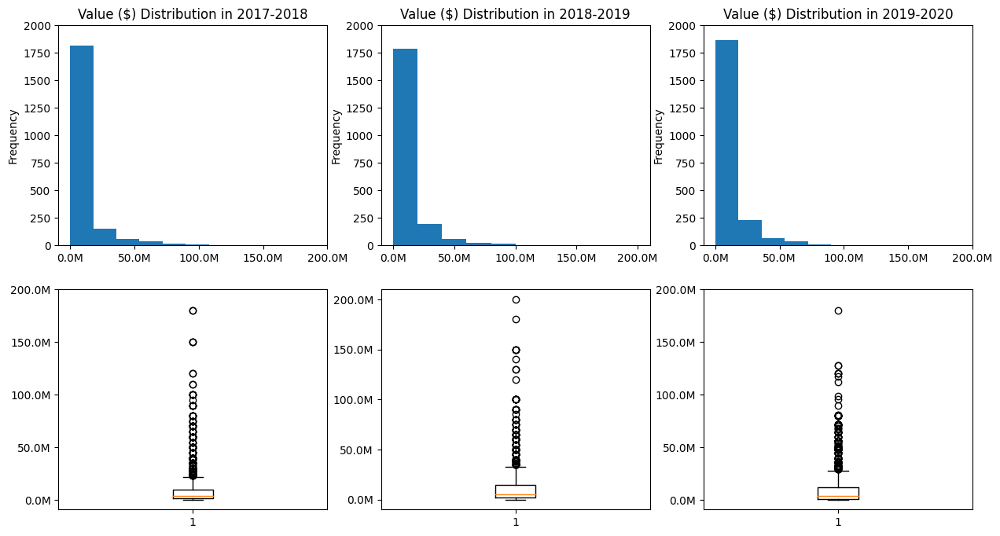

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(15,8))

formatter = FuncFormatter(millions)

for i, yr in enumerate([2017, 2018, 2019]):
    df_yr = df_all[df_all['Season'] == yr]

    ax[0,i].hist(df_yr.value)
    ax[0,i].set_title('Value ($) Distribution in %i-%i' % (yr, yr+1))
    ax[0,i].set_xticks(np.arange(df_all['value'].min(), df_all['value'].max() + 50000000, 50_000_000))
    ax[0,i].set_ylabel('Frequency')
    ax[0,i].set_yticks(np.arange(0, 2250, 250))
    ax[0,i].xaxis.set_major_formatter(formatter)

    ax[1,i].boxplot(df_yr.value)
    ax[1,i].yaxis.set_major_formatter(formatter)
    ax[1,i].set_yticks(np.arange(df_all['value'].min(), df_all['value'].max() + 50000000, 50_000_000))

Os gráficos provam que indepentemente da temporada a distribuição de valor se mantem que a esmagadora maioria dos jogadores possuem um valor entre 0 e 20 milhões enquanto apenas poucos chegam na cauda de 100 milhões. Dessa forma os dados confirmam uma observação intuitiva.

### 3.4.2 Distribuição de `value` por `league`

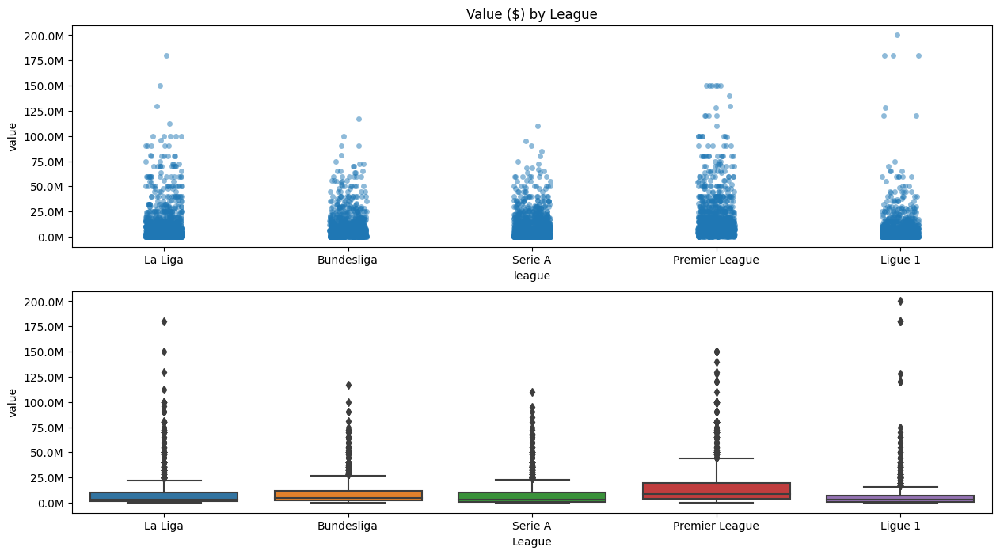

In [ ]:
fig, ax = plt.subplots(2,1, figsize=(15,8))

g = sns.stripplot(x='league', y='value', data=df_all, ax=ax[0], alpha=0.5, jitter=True,)

g.set_title('Value ($) by League')

ax[0].yaxis.set_major_formatter(formatter)
g = sns.boxplot(x='league', y='value', data=df_all, ax=ax[1])

ax[1].yaxis.set_major_formatter(formatter)
g.set_xlabel('League')

plt.show()

Observando os dados aparenta-se que a `Premier League` possui o  maior valor médio de jogadores sendo a `La Liga` um concorrente próximo. Pelo o outro lado esta a `Ligue 1` que aparenta possuir o menor valor médio entre as 5 ligas disponíveis no dataset, porém possui certos outliers que chegam nos maiores picos de valores presentes nos dados, com uma olhada mais profunda descobrimos que o Neymar esta entre esses outliers.

### 3.4.3 Distribuição de `Ligas`, `Attendance` e `value`

In [ ]:
def calculate_attribute_sum_by_league(df, attribute):
  league_counts = df['league'].value_counts()
  attribute_sum_by_league = []

  for league in league_counts.index:
    league_data = df[df['league'] == league]
    attribute_sum = league_data[attribute].sum()
    attribute_sum_by_league.append(attribute_sum)

  return attribute_sum_by_league

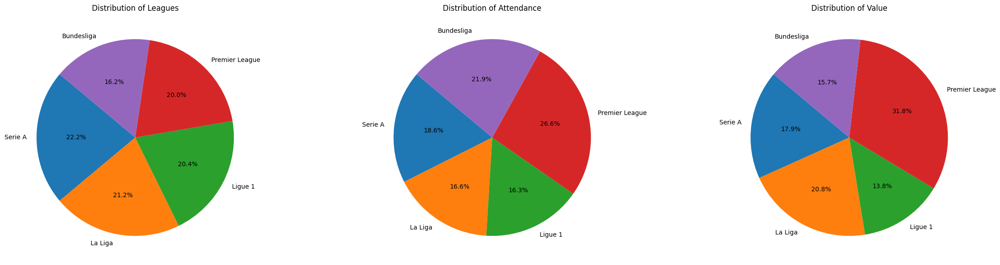

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

league_counts = df_all['league'].value_counts()

axes[0].pie(league_counts, labels=league_counts.index, autopct='%1.1f%%', startangle=140)
axes[0].set_title('Distribution of Leagues')

attendance_count = calculate_attribute_sum_by_league(df_all, 'Attendance')
axes[1].pie(attendance_count, labels=league_counts.index, autopct='%1.1f%%', startangle=140)
axes[1].set_title('Distribution of Attendance')

value_count = calculate_attribute_sum_by_league(df_all, 'value')
axes[2].pie(value_count, labels=league_counts.index, autopct='%1.1f%%', startangle=140)
axes[2].set_title('Distribution of Value')

plt.tight_layout()
plt.show()

Os gráficos acima mostram novamente a superioridade em valor médio de `Premier League`, apesar de ter a segunda menor presença no dataset em 20% os jogadores a soma das métricas de `Attendance` e `Value` de seus jogadores ainda são claramente os maiores dos dados, sendo que que no segundo caso ela se encontra chocantes 10% acima do que o segundo lugar.

### 3.4.4 Distribuição de número de atletas por `nationality`

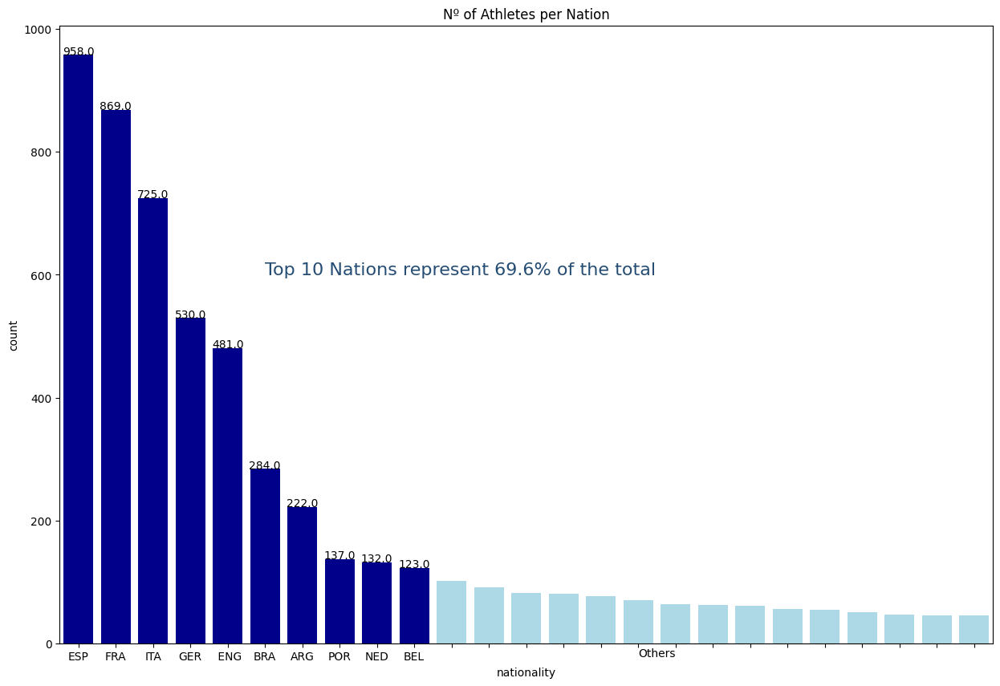

In [ ]:
plt.figure(figsize=(15, 10))

nacionality_count = df_all['nationality'].value_counts()

ax = sns.countplot(data=df_all, x='nationality', order=nacionality_count[0:25].index, palette='Blues_r')

ax.set_title('Nº of Athletes per Nation')

plt.text(5, 600, 'Top 10 Nations represent %.1f%% of the total' % (nacionality_count[0:10].sum() / nacionality_count.sum() * 100), color='#264d73', fontsize=16)

maxCount = df_all['nationality'].value_counts().max()

plt.text(15, -22, "Others")

for ind, label in enumerate(ax.get_xticklabels()):
    if ind < 10:
        label.set_visible(True)
    else:
        label.set_visible(False)

for p in ax.patches:
    if p.get_height() >= maxCount / 9:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='baseline')
        p.set_fc('darkblue')
    else:
        p.set_fc('lightblue')

plt.show()

Aqui apresentamos uma visualização da presença dos jogadores no dataset de acordo com a nacionalidade, a majoritaria presença de jogadores europeus é esperada considerando as informações que quais ligas o Dataset possui.

### 3.4.5 Correlações entre os dados e `value`

In [ ]:
def corr_plot(corr, bool_pair_plot=False):
  fig, axes = plt.subplots(1, 2, figsize=(26, 8))

  top_corr = corr.head(10).append(corr.tail(4))
  colors = ['skyblue' if c >= 0 else 'salmon' for c in top_corr]
  ax = sns.barplot(x=top_corr.index, y=top_corr.values, palette=colors, ax=axes[0])

  for p in ax.patches:
      ax.annotate(f'{round(p.get_height(), 4)}',
                  (p.get_x() + p.get_width() / 2., p.get_height()),
                  ha='center', va='baseline')

  ax.set_title('Correlation of Features')
  ax.set_xlabel('Features')
  ax.set_ylabel('Correlation')
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

  top_corr_matrix = top_corr.to_frame()
  cmap = sns.diverging_palette(240, 10, as_cmap=True)
  sns.heatmap(top_corr_matrix.transpose(), annot=True, fmt='.2f', cmap=cmap, center=0, ax=axes[1])
  axes[1].set_title('Correlation Heatmap')
  axes[1].set_xlabel('Features')
  axes[1].set_ylabel('Correlation')
  axes[1].tick_params(axis='x', rotation=45)
  plt.tight_layout()

  print()

  if bool_pair_plot:
    df_corr = df_all[top_corr.index]
    sns.pairplot(df_corr, diag_kind='kde', palette='pastel')

  plt.show()


value              1.000000
gca                0.556504
gca_passes_live    0.543053
shots_on_target    0.519015
pass_targets       0.516473
                     ...   
D                 -0.172102
xGA               -0.334631
GA                -0.338012
L                 -0.409032
LgRk              -0.429299
Name: value, Length: 396, dtype: float64



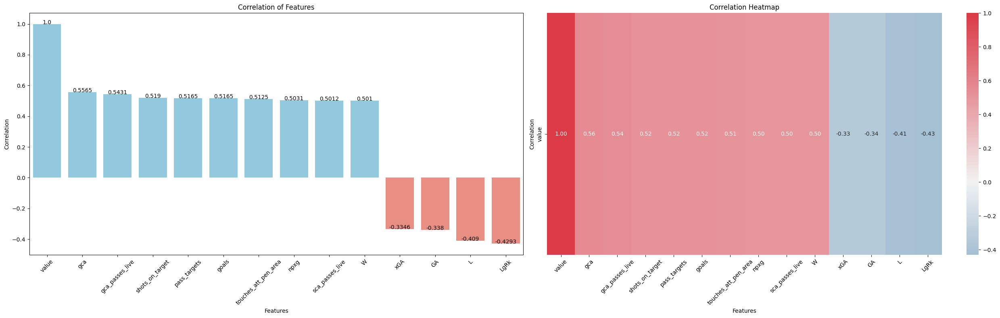

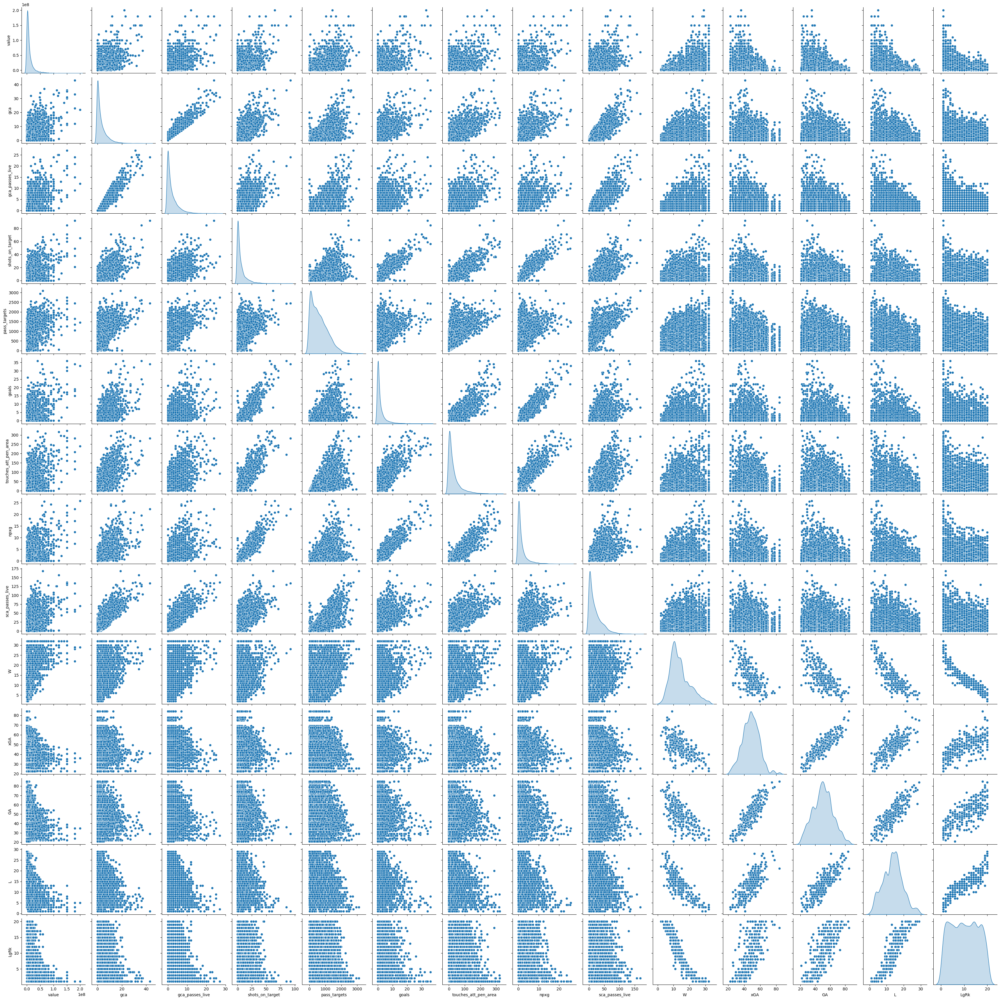

In [ ]:
corr_value = df_all.corr()['value'].sort_values(ascending=False)

print(corr_value)

corr_plot(corr_value, bool_pair_plot=True)

Aqui foi apresentada a correlação de diversos dados do Dataset explorado em relação ao valor de cada jogador. Obviamente Value possui uma correlação direta de 1:1, em segundo lugar esta a métrica gca que representa a presença do jogador no campo quando parte de um time, pelo o outro lado as métricas `xGA`, `GA`, `L` e `LgRK` possuem uma correlação negativa, isso se alinha com a lógica intuitiva, por exemplo o `L` que apresenta o número de derrotas do jogador e é natural pensar que quantos mais um jogador perde jogos menor é o seu valor.

#### 3.4.5.1 Correlação entre `value`e `position`

In [ ]:
positions = ['FW', 'MF', 'DF', 'GK']

for pos in positions:
  print(f'{pos}: {corr_value[pos]}')

FW: 0.11203294401117665
MF: 0.0059794687028763465
DF: -0.08644075019436451
GK: -0.04860513130885943


Aqui é calculada uma correlação entre as 4 posições diferentes no dataset e seu valor como jogadores, nenhuma apresenta uma correlação tão forte quanto os dados anteriores porém demonstra que Atacantes(`FW`) tendem a valor mais entre as posições enquanto Defensores(`DF`) tendem a valer menos.

### 3.4.6 Correlação entre dados e `position`



############################ FW ############################
FW                             1.000000
xg_xa_per90                    0.564611
npxg_xa_per90                  0.556548
xg_per90                       0.514601
shots_total_per90              0.506538
                                 ...   
passes_progressive_distance   -0.410526
touches_def_3rdm              -0.431973
touches_def_3rd               -0.463939
DF                            -0.517748
passes_received_pct           -0.691930
Name: FW, Length: 396, dtype: float64



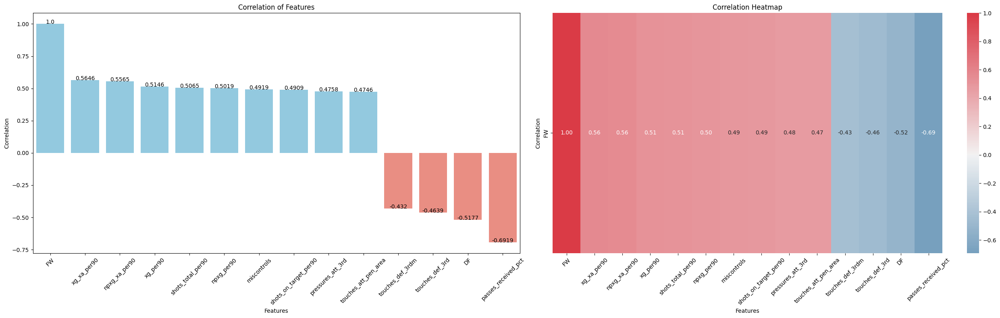



############################ MF ############################
MF                      1.000000
pressures_mid_3rd       0.364317
dribbled_past           0.283358
pressures               0.273330
sca_per90               0.271601
                          ...   
GK                     -0.273918
clearances             -0.293375
touches_def_pen_area   -0.303128
touches_def_3rd        -0.326036
DF                     -0.475235
Name: MF, Length: 396, dtype: float64



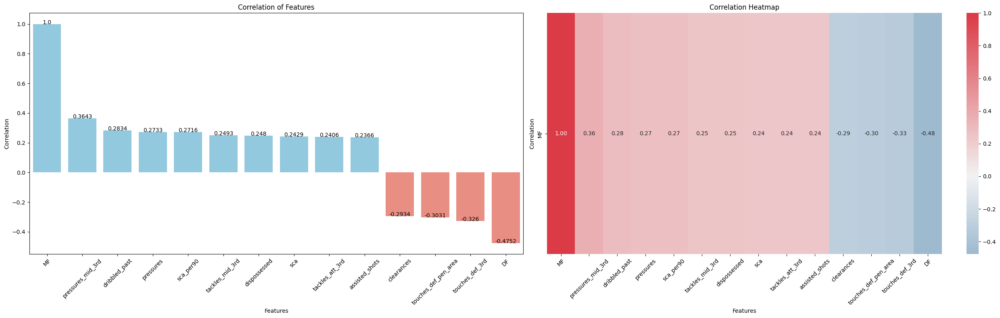



############################ DF ############################
DF                     1.000000
clearances             0.554749
dribble_tackles_pct    0.486446
throw_ins              0.485514
blocked_shots          0.455303
                         ...   
shots_total_per90     -0.331444
xg_xa_per90           -0.336685
pressures_att_3rd     -0.346021
MF                    -0.475235
FW                    -0.517748
Name: DF, Length: 396, dtype: float64



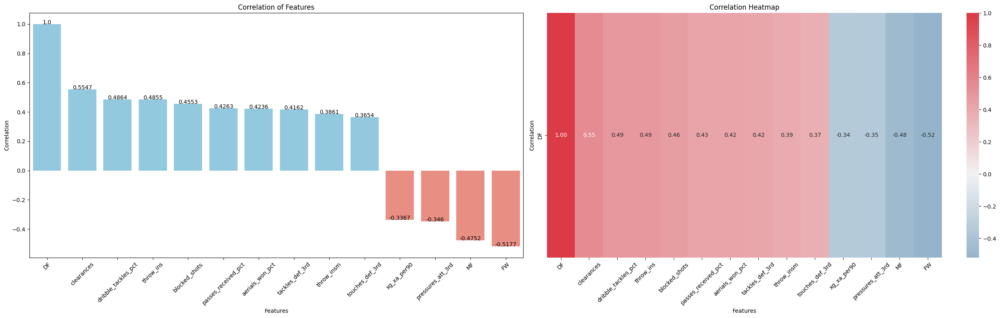



############################ GK ############################
GK                             1.000000
avg_distance_def_actions_gk    0.972215
passes_length_avg_gk           0.969872
save_pct                       0.967724
goal_kick_length_avg           0.958600
                                 ...   
dribbles_completed_pct        -0.327892
touches_mid_3rdm              -0.330295
pressure_regain_pct           -0.350231
dribble_tackles_pct           -0.362213
aerials_won_pct               -0.444733
Name: GK, Length: 396, dtype: float64



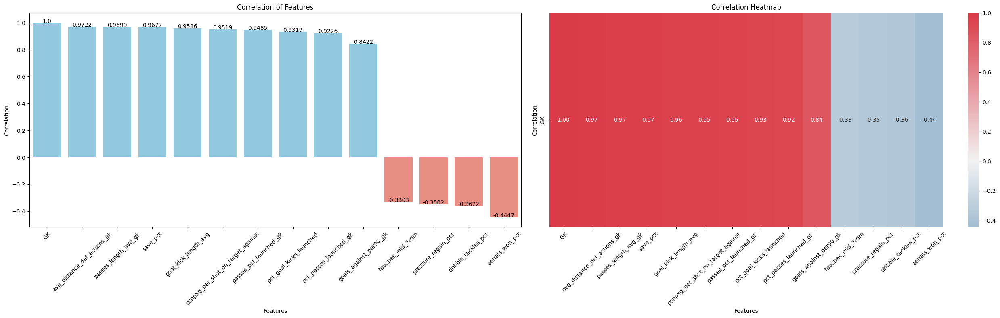

In [ ]:
for pos in positions:
  print(f'\n\n############################ {pos} ############################')
  corr_pos = df_all.corr()[pos].sort_values(ascending=False)
  print(corr_pos)
  corr_plot(corr_pos, bool_pair_plot=False)

Acima são apresentados quatro gráficos de correlação, um para cada posição de jogador na qual foi atentado extrair quais características tendem a influenciar o preço de diferentes tipos de jogadores. É interessante observar que todas as 4 posições tiverem um segundo maior valor de correlação único, para observações das posições em si temos que como goleiros são apreciados por habilidades especifícas várias métricas possuem alto correlação com seus valores, no lado oposto meios de campo apreciados por habilidades variadas não tem seu valor associado com métricas em altos níveis de correlação.

### 3.4.7 Distribuição entre `value` e dados mais correlacionados

In [ ]:
n_rows, n_columns = df_all.shape

positions = []
values = []
goals = []
gca = []
gca_passes_live = []
ages = []
shots_on_target = []

for index in range(n_rows):
  for pos in ['FW', 'MF', 'DF', 'GK']:
    if df_all.iloc[index][pos] == 1:
      positions.append(pos)
      values.append(df_all.iloc[index]['value'])
      goals.append(df_all.iloc[index]['goals'])
      gca.append(df_all.iloc[index]['gca'])
      gca_passes_live.append(df_all.iloc[index]['gca_passes_live'])
      ages.append(df_all.iloc[index]['age'])
      shots_on_target.append(df_all.iloc[index]['shots_on_target'])

data = {
    'position': positions,
    'value': values,
    'goals': goals,
    'gca': gca,
    'gca_passes_live': gca_passes_live,
    'shots_on_target': shots_on_target,
    'age': ages,
}

val_per_pos = pd.DataFrame(data)

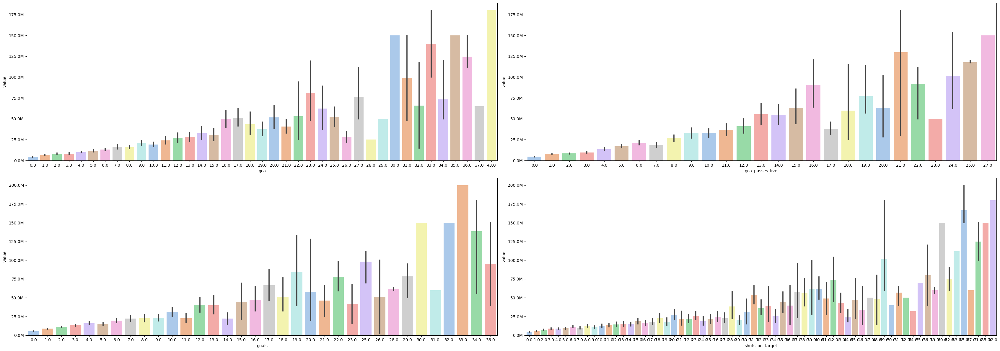

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(34, 12))

variables = ['gca', 'gca_passes_live', 'goals', 'shots_on_target']

for i, var in enumerate(variables):
    row = i // 2
    col = i % 2
    ax = axs[row, col]

    sns.barplot(x=var, y='value', data=val_per_pos, palette='pastel', ax=ax)
    ax.yaxis.set_major_formatter(formatter)

plt.tight_layout()
plt.show()

Acima é apresentada a distribuição de valores com relação as 4 métricas com maior correlação a eles, essa relação é bem representada em todos os gráficos sendo que em médio quando a métrica aumenta o valor também tende a aumentar.

### 3.4.8 Distribuição entre position e dados mais relacionados com `value`

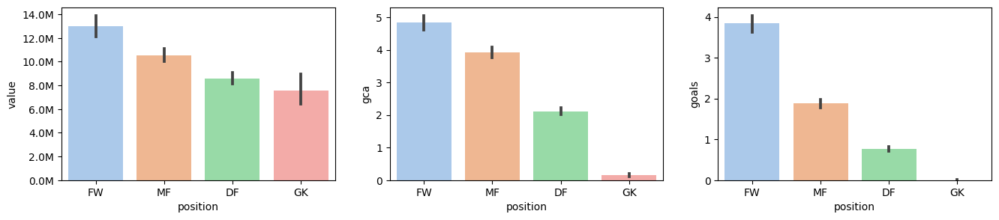

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(16, 3))

sns.barplot(x='position', y='value', data=val_per_pos, palette='pastel', ax=ax[0])
sns.barplot(x='position', y='gca',   data=val_per_pos, palette='pastel', ax=ax[1])
sns.barplot(x='position', y='goals', data=val_per_pos, palette='pastel', ax=ax[2])

ax[0].yaxis.set_major_formatter(formatter)

plt.show()

Acima são apresentadas as distribuiões das posições dos jogadores com relação a Value e as duas métricas mais correlacionadas a ele. É visível uma clara hierarquia nos valores entre diferentes posições com Atacantes previsivelmente tendo maior valor médio, a distribuição com relação a métrica de gols também mostra o fato óbvio de goleiros não fazem gols em geral.

### 3.4.8 Distribuição entre `age` e `value` para cada posição

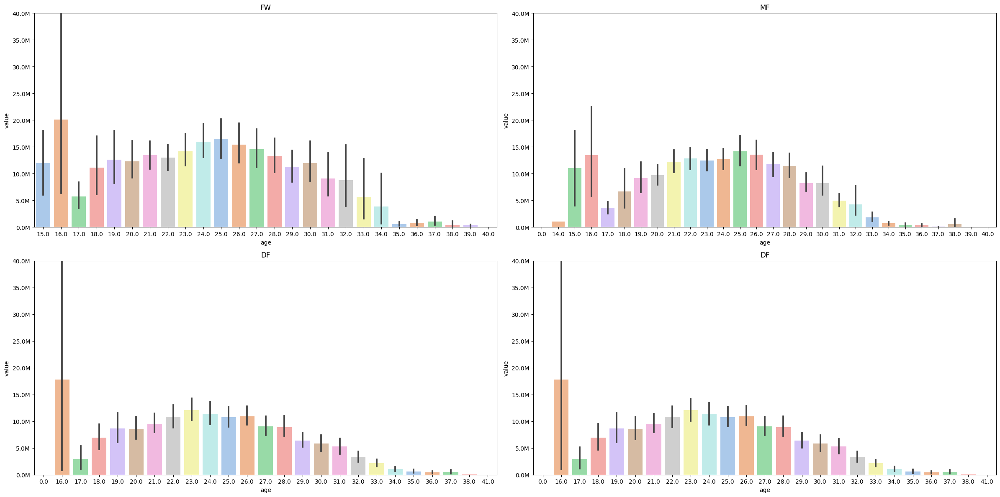

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(24, 12))

chosen_palette = 'pastel'

for i, ax in enumerate(axs.flat):
    position = positions[i]
    ax.set_title(position)
    ax.yaxis.set_major_formatter(formatter)
    sns.barplot(x='age', y='value', data=val_per_pos[val_per_pos['position'] == position], palette=chosen_palette, ax=ax)
    ax.set_ylim(0, 4e7)

plt.tight_layout()
plt.show()

Por fim, acima são apresentadas a distribuição de valores de acordo com a idade para cada posição de jogador, eles apresentam que em geral jogadores tendem a ter um pico curto de valor aos seus 16 anos antes de uma queda aos 17 que vai crescendo e se estabilizando durante oos vinte anos.

# 4.0 Pré-Processamento

---

o pré-processamento dos dados será responsável por aplicar técnicas de hot e label encoding para converter variáveis categóricas em formatos numéricos, além de identificar e remover os outliers mais relevantes. Essas etapas são cruciais para preparar os dados, garantindo que estejam prontos para análises detalhadas, ao mesmo tempo em que mantêm a integridade estatística das informações.

In [ ]:
df_pre = get_data()

df_pre.head(3)

,player,nationality,position,squad,age,birth_year,value,height,position2,foot,...,Pts/G,xG,xGA,xGDiff,xGDiff/90,Attendance,CL,WinCL,CLBestScorer,Season
379.0,Burgui,es ESP,"FW,MF",Alavés,23.0,1993.0,1800000.0,186.0,attack - Left Winger,right,...,1.24,39.0,53.2,-14.2,-0.37,"16,819",0.0,0.0,0.0,201718#
2530.0,Raphaël Varane,fr FRA,DF,Real Madrid,24.0,1993.0,70000000.0,191.0,Defender - Centre-Back,right,...,2.00,83.3,45.4,37.9,1.00,66161,1.0,1.0,0.0,201718#
721.0,Rubén Duarte,es ESP,DF,Alavés,21.0,1995.0,2000000.0,179.0,Defender - Left-Back,left,...,1.24,39.0,53.2,-14.2,-0.37,"16,819",0.0,0.0,0.0,201718#


## 4.1 Dados não necessários

In [ ]:
df_pre = df_pre.drop('player', axis=1)

## 4.2 Dados Nulos

In [ ]:
print(f'Shape before:\t {df_pre.shape}')

df_pre = df_pre.dropna()

print(f'Shape after:\t {df_pre.shape}')

Shape before:	 (7108, 398)
Shape after:	 (6409, 398)


## 4.3 Valores Categóricos

### 4.3.1 Hot encoding

Neste projeto, o hot encoding vai transformar variáveis categóricas em colunas binárias, ajudando algoritmos de aprendizado a compreender essas categorias sem criar hierarquias entre elas, sendo um passo essencial para as análises deste projeto.

#### 4.3.1.1 Posição (`position`)

In [ ]:
dummies = df_pre['position'].str.get_dummies(',')

position_labels = dummies.columns

print(f'Shape before:\t {df_pre.shape}')
print(f'Shape dummies:\t {dummies.shape}')

df_pre = pd.concat([df_pre.drop(['position'], axis=1), dummies], axis=1)

print(f'Shape after:\t {df_pre.shape}')

Shape before:	 (6409, 398)
Shape dummies:	 (6409, 4)
Shape after:	 (6409, 401)


#### 4.3.1.2 Posição Secundária

In [ ]:
for atribute in ['position2', 'foot']:
  print(f'\n############# {atribute} #############')

  dummies = df_pre[atribute].str.get_dummies()

  position2_labels = dummies.columns

  print(f'Shape before:\t{df_pre.shape}')
  print(f'Shape dummies:\t{dummies.shape}')

  df_pre = pd.concat([df_pre.drop([atribute], axis=1), dummies], axis=1)

  print(f'Shape after:\t{df_pre.shape}')


############# position2 #############
Shape before:	(6409, 401)
Shape dummies:	(6409, 23)
Shape after:	(6409, 423)

############# foot #############
Shape before:	(6409, 423)
Shape dummies:	(6409, 3)
Shape after:	(6409, 425)


### 4.3.2 Label encoding

No âmbito deste projeto, o label encoding traduzirá categorias em valores numéricos, útil para variáveis com ordem definida. É essencial aplicá-lo com cuidado para evitar interpretações hierárquicas falsas entre as categorias, preservando a precisão das análises de aprendizado de máquina.

In [ ]:
label_encoder = LabelEncoder()

for atribute in ['nationality', 'squad', 'league', 'Season']:
  print(f'Label encoding {atribute}...')

  df_pre[atribute] = label_encoder.fit_transform(df_pre[atribute])

  print()

Label encoding nationality...

Label encoding squad...

Label encoding league...

Label encoding Season...



## 4.5 Categórico para Numérico (`Attendance`)

In [ ]:
df_pre['Attendance'] = df_pre['Attendance'].str.replace(',', '.')
df_pre['Attendance'] = df_pre['Attendance'].astype(float)

df_pre['Attendance'] = df_pre['Attendance'].fillna(df_pre['Attendance'].median())

## 4.6 Valores Numéricos

### 4.6.1 Análise de outliers

A análise de outliers revela dados excepcionais, essenciais para detectar erros ou fenômenos importantes nos conjuntos de dados, assegurando a precisão das análises estatísticas realizadas.

In [ ]:
numerics = df_pre.select_dtypes(include=['int', 'float']).columns.tolist()

print(numerics)

['nationality', 'squad', 'age', 'birth_year', 'value', 'height', 'league', 'games', 'games_starts', 'minutes', 'goals', 'assists', 'pens_made', 'pens_att', 'cards_yellow', 'cards_red', 'goals_per90', 'assists_per90', 'goals_assists_per90', 'goals_pens_per90', 'goals_assists_pens_per90', 'xg', 'npxg', 'xa', 'xg_per90', 'xa_per90', 'xg_xa_per90', 'npxg_per90', 'npxg_xa_per90', 'minutes_90s', 'shots_total', 'shots_on_target', 'shots_free_kicks', 'shots_on_target_pct', 'shots_total_per90', 'shots_on_target_per90', 'goals_per_shot', 'goals_per_shot_on_target', 'npxg_per_shot', 'xg_net', 'npxg_net', 'passes_completed', 'passes', 'passes_pct', 'passes_total_distance', 'passes_progressive_distance', 'passes_completed_short', 'passes_short', 'passes_pct_short', 'passes_completed_medium', 'passes_medium', 'passes_pct_medium', 'passes_completed_long', 'passes_long', 'passes_pct_long', 'xa_net', 'assisted_shots', 'passes_into_final_third', 'passes_into_penalty_area', 'crosses_into_penalty_area', '

In [ ]:
outliers = {}

def plot_outliers(column):
  distribution = df_pre[column].tolist()
  distribution = sorted(distribution)
  Q1 = np.percentile(distribution, 25)
  Q3 = np.percentile(distribution, 75)
  IQR = np.abs(Q3 - Q1)
  superior = Q3 + 1.5*IQR
  inferior = Q1 - 1.5*IQR
  outliers[column] = df_pre[column].loc[(df_pre[column] > superior) | (df_pre[column] < inferior)].tolist()

  print(f'    OUTLIERS DA COLUNA {column}')
  print(f'Limite Inferior: {inferior:.3f} \nLimite Superior: {superior:.3f}')
  print(f'Outliers da coluna "{column}": {sorted(outliers[column])}')
  plt.figure(figsize=(8, 1))
  sns.boxplot(distribution, orient='h');
  plt.axvline(inferior, color='red')
  plt.axvline(superior, color='red')
  plt.title(f'Demarcação de Outliers - Coluna: {column} - Quantidade: {len(outliers[column])}')
  plt.show()
  print('\n')

    OUTLIERS DA COLUNA nationality
Limite Inferior: -8.000 
Limite Superior: 96.000
Outliers da coluna "nationality": [97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 97, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 99, 99, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 101, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 102, 103, 104, 105, 105, 105, 105, 105, 105, 105,

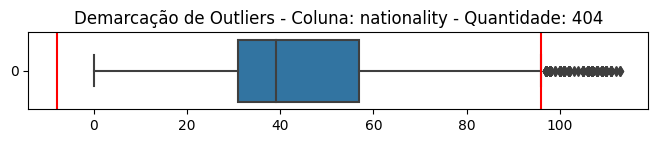



    OUTLIERS DA COLUNA squad
Limite Inferior: -65.500 
Limite Superior: 186.500
Outliers da coluna "squad": []


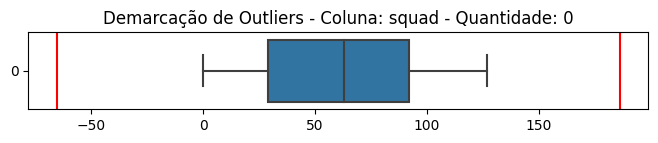



    OUTLIERS DA COLUNA age
Limite Inferior: 11.500 
Limite Superior: 39.500
Outliers da coluna "age": [0.0, 0.0, 0.0, 40.0, 40.0, 41.0, 41.0]


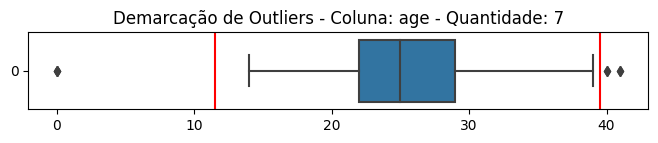



    OUTLIERS DA COLUNA birth_year
Limite Inferior: 1978.500 
Limite Superior: 2006.500
Outliers da coluna "birth_year": [0.0, 0.0, 0.0, 1977.0, 1977.0, 1977.0, 1978.0, 1978.0, 1978.0, 1978.0, 1978.0]


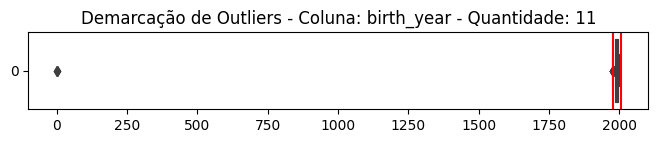



    OUTLIERS DA COLUNA value
Limite Inferior: -14250000.000 
Limite Superior: 27750000.000
Outliers da coluna "value": [28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 28000000.0, 29000000.0, 29000000.0, 29000000.0, 29000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30000000.0, 30

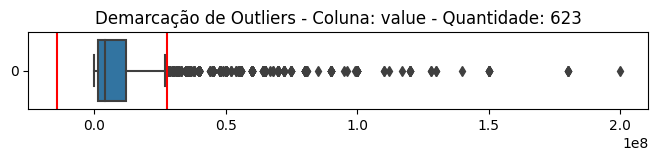



    OUTLIERS DA COLUNA height
Limite Inferior: 164.500 
Limite Superior: 200.500
Outliers da coluna "height": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 162.0, 162.0, 162.0, 162.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 164.0, 164.0, 164.0, 164.0, 164.0, 201.0, 201.0, 201.0, 201.0, 201.0, 202.0, 202.0, 203.0]


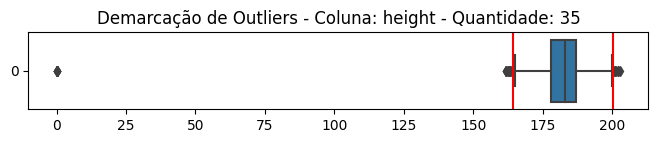



    OUTLIERS DA COLUNA league
Limite Inferior: -2.000 
Limite Superior: 6.000
Outliers da coluna "league": []


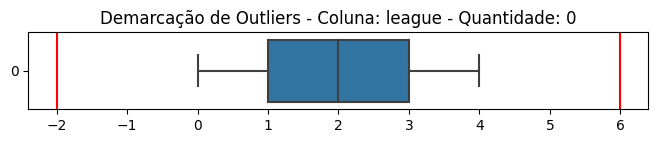



    OUTLIERS DA COLUNA games
Limite Inferior: -21.000 
Limite Superior: 59.000
Outliers da coluna "games": []


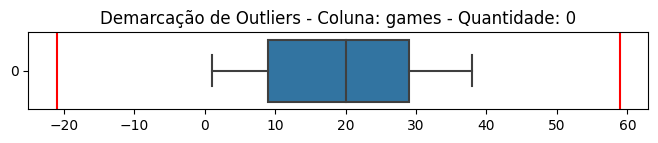



    OUTLIERS DA COLUNA games_starts
Limite Inferior: -23.500 
Limite Superior: 52.500
Outliers da coluna "games_starts": []


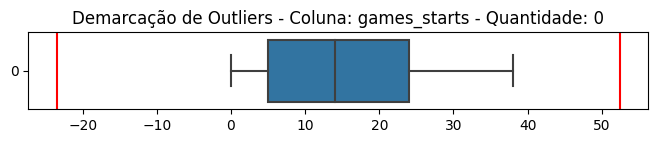



    OUTLIERS DA COLUNA minutes
Limite Inferior: -2034.000 
Limite Superior: 4638.000
Outliers da coluna "minutes": []


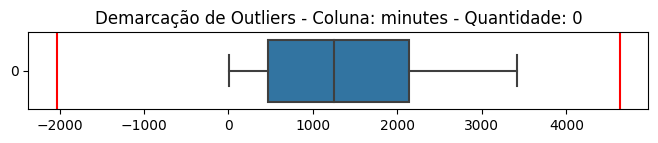



    OUTLIERS DA COLUNA goals
Limite Inferior: -3.000 
Limite Superior: 5.000
Outliers da coluna "goals": [6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.

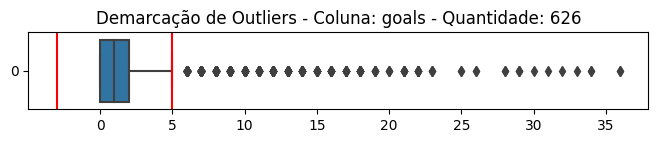



    OUTLIERS DA COLUNA assists
Limite Inferior: -3.000 
Limite Superior: 5.000
Outliers da coluna "assists": [6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0

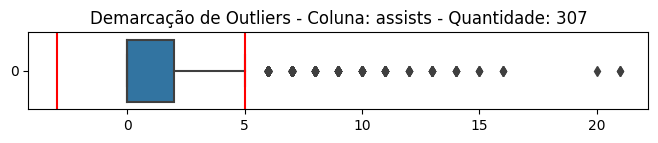



    OUTLIERS DA COLUNA pens_made
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_made": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 

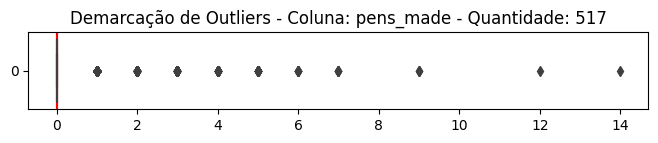



    OUTLIERS DA COLUNA pens_att
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_att": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.

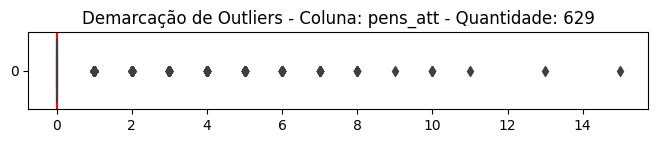



    OUTLIERS DA COLUNA cards_yellow
Limite Inferior: -3.500 
Limite Superior: 8.500
Outliers da coluna "cards_yellow": [9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10

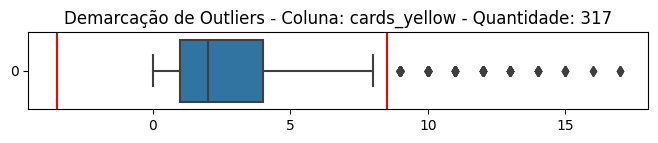



    OUTLIERS DA COLUNA cards_red
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "cards_red": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 

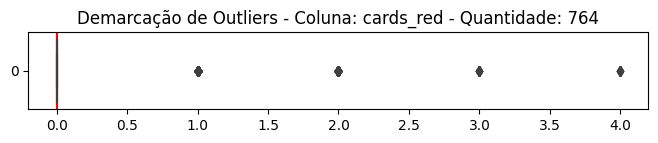



    OUTLIERS DA COLUNA goals_per90
Limite Inferior: -0.225 
Limite Superior: 0.375
Outliers da coluna "goals_per90": [0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43,

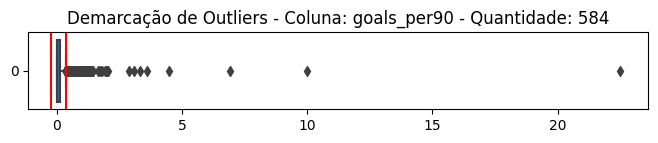



    OUTLIERS DA COLUNA assists_per90
Limite Inferior: -0.180 
Limite Superior: 0.300
Outliers da coluna "assists_per90": [0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 

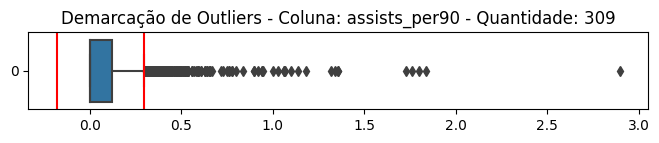



    OUTLIERS DA COLUNA goals_assists_per90
Limite Inferior: -0.435 
Limite Superior: 0.725
Outliers da coluna "goals_assists_per90": [0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.78, 0.78, 0.78, 0.78, 0.78, 0.78, 0.79, 0.79, 0.79, 0.79, 0.79, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.81, 0.81, 0.81, 0.81, 0.81, 0.81, 0.81, 0.82, 0.82, 0.82, 0.82, 0.82, 0.82, 0.82, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.85, 0.85, 0.85, 0.85, 0.85, 0.86, 0.86, 0.86, 0.86, 0.86, 0.86, 0.86, 0.87, 0.87, 0.88, 0.88, 0.88, 0.89, 0.89, 0.89, 0.89, 0.89, 0.89, 0.89, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.91, 0.91, 0.91, 0.91, 0.

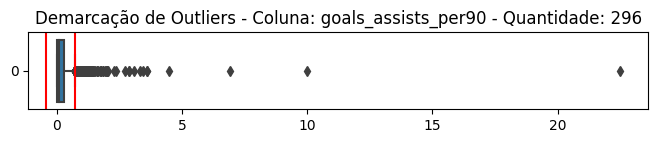



    OUTLIERS DA COLUNA goals_pens_per90
Limite Inferior: -0.210 
Limite Superior: 0.350
Outliers da coluna "goals_pens_per90": [0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.

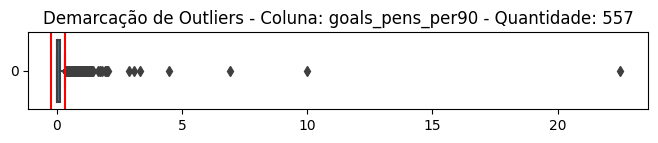



    OUTLIERS DA COLUNA goals_assists_pens_per90
Limite Inferior: -0.405 
Limite Superior: 0.675
Outliers da coluna "goals_assists_pens_per90": [0.68, 0.68, 0.68, 0.68, 0.68, 0.68, 0.68, 0.69, 0.69, 0.69, 0.69, 0.69, 0.69, 0.69, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.71, 0.71, 0.71, 0.71, 0.71, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.78, 0.78, 0.78, 0.78, 0.78, 0.78, 0.79, 0.79, 0.79, 0.79, 0.79, 0.79, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.81, 0.81, 0.81, 0.81, 0.81, 0.82, 0.82, 0.82, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.85, 0.85, 0.85, 0.85, 0.85, 

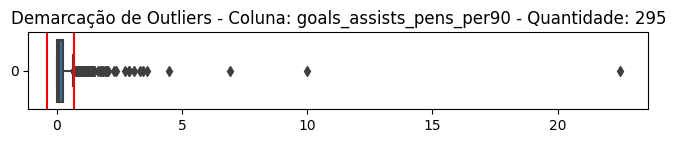



    OUTLIERS DA COLUNA xg
Limite Inferior: -3.050 
Limite Superior: 5.350
Outliers da coluna "xg": [5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.6, 5.6, 5.6, 5.6, 5.6, 5.6, 5.6, 5.6, 5.6, 5.6, 5.6, 5.6, 5.6, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.8, 5.8, 5.8, 5.8, 5.8, 5.8, 5.8, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.1, 6.1, 6.1, 6.1, 6.1, 6.1, 6.1, 6.2, 6.2, 6.2, 6.2, 6.2, 6.2, 6.2, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.4, 6.4, 6.4, 6.4, 6.4, 6.4, 6.5, 6.5, 6.5, 6.5, 6.5, 6.5, 6.5, 6.5, 6.5, 6.5, 6.5, 6.5, 6.5, 6.5, 6.6, 6.6, 6.6, 6.6, 6.6, 6.6, 6.6, 6.6, 6.6, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.8, 6.8, 6.8, 6.8, 6.8, 6.9, 6.9, 6.9, 6.9, 6.9, 6.9, 6.9, 6.9, 6.9

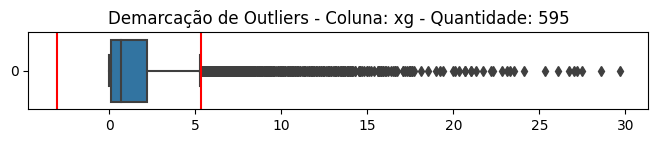



    OUTLIERS DA COLUNA npxg
Limite Inferior: -2.750 
Limite Superior: 4.850
Outliers da coluna "npxg": [4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.3, 5.3, 5.3, 5.3, 5.3, 5.3, 5.3, 5.3, 5.3, 5.3, 5.3, 5.3, 5.3, 5.3, 5.3, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.4, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.5, 5.6, 5.6, 5.6, 5.6, 5.6, 5.6, 5.6, 5.6, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.7, 5.8, 5.8, 5.8, 5.8, 5.8, 5.8, 5.8, 5.8, 5.8, 5.8, 5.8, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 5.9, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.1, 6.1, 6.1, 6.1, 6.1, 6.1, 6.1, 6.1,

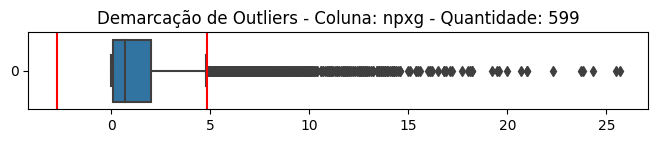



    OUTLIERS DA COLUNA xa
Limite Inferior: -2.300 
Limite Superior: 4.100
Outliers da coluna "xa": [4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.2, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.3, 4.4, 4.4, 4.4, 4.4, 4.4, 4.4, 4.4, 4.4, 4.4, 4.4, 4.4, 4.4, 4.4, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.5, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.6, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.7, 4.8, 4.8, 4.8, 4.8, 4.8, 4.8, 4.8, 4.8, 4.8, 4.8, 4.8, 4.8, 4.8, 4.8, 4.8, 4.8, 4.8, 4.8, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 4.9, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.1, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2

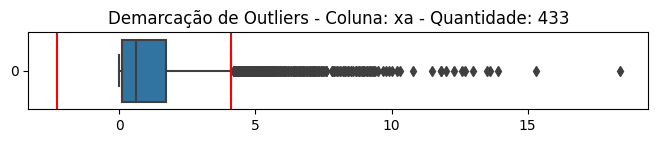



    OUTLIERS DA COLUNA xg_per90
Limite Inferior: -0.205 
Limite Superior: 0.395
Outliers da coluna "xg_per90": [0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.

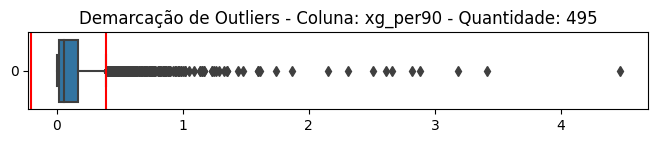



    OUTLIERS DA COLUNA xa_per90
Limite Inferior: -0.155 
Limite Superior: 0.285
Outliers da coluna "xa_per90": [0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.35, 0.35, 0.35, 0.35, 0.35, 0.36, 0.36, 0.36, 0.36, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.39, 0.39, 0.39, 0.4, 0.4, 0.4, 0.4, 0.4, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.42, 0.42, 0.42,

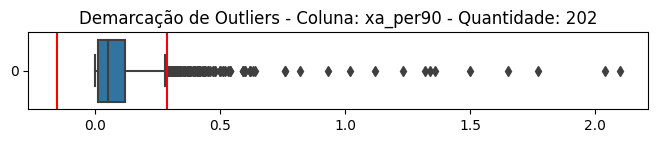



    OUTLIERS DA COLUNA xg_xa_per90
Limite Inferior: -0.340 
Limite Superior: 0.700
Outliers da coluna "xg_xa_per90": [0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.75, 0.75, 0.75, 0.75, 0.75, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.78, 0.78, 0.79, 0.79, 0.79, 0.79, 0.79, 0.79, 0.79, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.81, 0.81, 0.82, 0.82, 0.82, 0.82, 0.82, 0.82, 0.82, 0.82, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.85, 0.85, 0.85, 0.86, 0.86, 0.87, 0.87, 0.87, 0.88, 0.88, 0.88, 0.88, 0.88, 0.89, 0.89, 0.89, 0.89, 0.89, 0.9, 0.91, 0.91, 0.91, 0.91, 0.91, 0.92, 0.93, 0.93, 0.94, 0.94, 0.94, 0.95, 0.95, 0.95, 0.95, 0.96, 0.96, 0.96, 0.96, 0.96, 0.

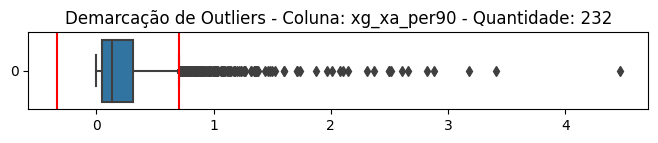



    OUTLIERS DA COLUNA npxg_per90
Limite Inferior: -0.190 
Limite Superior: 0.370
Outliers da coluna "npxg_per90": [0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.44, 0.44, 0.44, 0.44, 

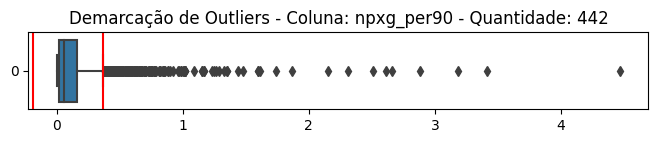



    OUTLIERS DA COLUNA npxg_xa_per90
Limite Inferior: -0.325 
Limite Superior: 0.675
Outliers da coluna "npxg_xa_per90": [0.68, 0.68, 0.68, 0.68, 0.68, 0.68, 0.68, 0.68, 0.68, 0.68, 0.69, 0.69, 0.69, 0.69, 0.69, 0.69, 0.69, 0.69, 0.69, 0.69, 0.69, 0.69, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.78, 0.78, 0.78, 0.79, 0.79, 0.79, 0.79, 0.79, 0.79, 0.79, 0.79, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.81, 0.82, 0.82, 0.82, 0.82, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.85, 0.85, 0.85, 0.85, 0.87, 0.87, 0.88, 0.88, 0.88, 0.88, 0.88, 0.89, 0.89, 0.89, 0.89, 0.89, 0.89, 0.9, 0.91, 0.91, 0.91, 0.91, 0.91, 0.91, 0.92, 0.93, 0.93, 0.93, 0.94, 0.94, 0.94, 0.95, 0.95, 0.95, 0.95, 0.96, 0.96, 0

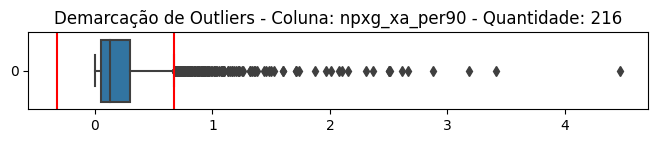



    OUTLIERS DA COLUNA minutes_90s
Limite Inferior: -22.550 
Limite Superior: 51.450
Outliers da coluna "minutes_90s": []


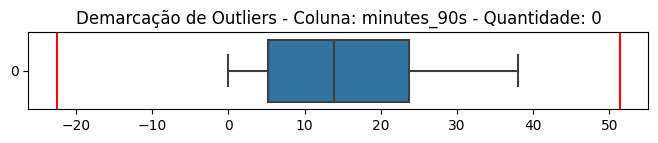



    OUTLIERS DA COLUNA shots_total
Limite Inferior: -31.000 
Limite Superior: 57.000
Outliers da coluna "shots_total": [58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67

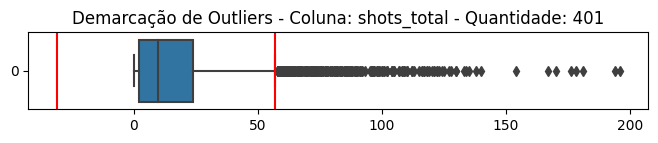



    OUTLIERS DA COLUNA shots_on_target
Limite Inferior: -10.500 
Limite Superior: 17.500
Outliers da coluna "shots_on_target": [18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 

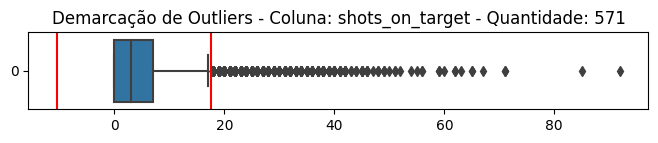



    OUTLIERS DA COLUNA shots_free_kicks
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "shots_free_kicks": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1

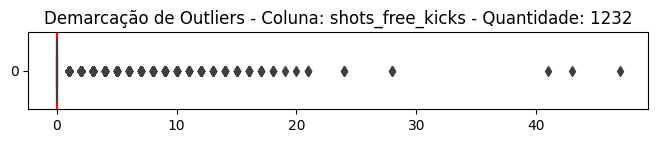



    OUTLIERS DA COLUNA shots_on_target_pct
Limite Inferior: -56.850 
Limite Superior: 94.750
Outliers da coluna "shots_on_target_pct": [100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 1

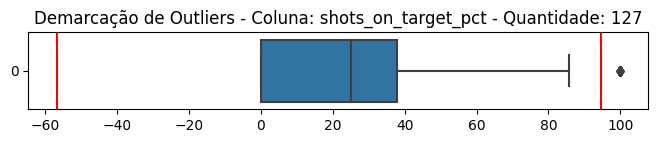



    OUTLIERS DA COLUNA shots_total_per90
Limite Inferior: -1.990 
Limite Superior: 4.170
Outliers da coluna "shots_total_per90": [4.18, 4.18, 4.19, 4.19, 4.19, 4.2, 4.2, 4.21, 4.22, 4.22, 4.22, 4.23, 4.23, 4.24, 4.25, 4.25, 4.26, 4.29, 4.29, 4.29, 4.29, 4.29, 4.29, 4.3, 4.32, 4.33, 4.36, 4.37, 4.37, 4.38, 4.38, 4.38, 4.39, 4.39, 4.39, 4.41, 4.46, 4.48, 4.5, 4.5, 4.5, 4.5, 4.52, 4.52, 4.52, 4.55, 4.57, 4.62, 4.64, 4.65, 4.69, 4.7, 4.74, 4.74, 4.74, 4.8, 4.8, 4.81, 4.82, 4.82, 4.85, 4.86, 4.86, 4.86, 4.91, 4.92, 4.93, 5.0, 5.0, 5.0, 5.01, 5.04, 5.08, 5.14, 5.16, 5.18, 5.19, 5.23, 5.26, 5.28, 5.29, 5.3, 5.35, 5.37, 5.49, 5.54, 5.56, 5.57, 5.63, 5.63, 5.65, 5.69, 5.82, 5.91, 5.92, 6.0, 6.0, 6.0, 6.0, 6.05, 6.07, 6.07, 6.14, 6.21, 6.24, 6.43, 6.43, 6.43, 6.67, 6.72, 6.92, 6.92, 6.92, 6.92, 6.92, 6.92, 6.92, 6.92, 7.14, 7.26, 7.3, 7.5, 8.44, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.59, 11.25, 11.25, 11.25, 11.25, 11.74, 12.27, 13.24, 13.5, 15.0, 15.0, 18.0, 22.5, 24.55, 30.0

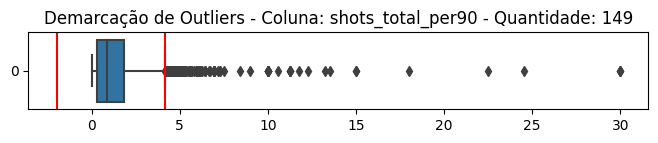



    OUTLIERS DA COLUNA shots_on_target_per90
Limite Inferior: -0.885 
Limite Superior: 1.475
Outliers da coluna "shots_on_target_per90": [1.48, 1.48, 1.48, 1.48, 1.48, 1.49, 1.49, 1.49, 1.49, 1.5, 1.5, 1.5, 1.5, 1.5, 1.51, 1.51, 1.51, 1.51, 1.52, 1.53, 1.53, 1.53, 1.53, 1.53, 1.54, 1.54, 1.54, 1.54, 1.54, 1.55, 1.55, 1.55, 1.55, 1.56, 1.56, 1.56, 1.56, 1.56, 1.58, 1.58, 1.58, 1.58, 1.58, 1.58, 1.59, 1.59, 1.59, 1.59, 1.59, 1.59, 1.6, 1.6, 1.61, 1.61, 1.61, 1.62, 1.62, 1.63, 1.64, 1.64, 1.64, 1.64, 1.66, 1.66, 1.66, 1.66, 1.66, 1.67, 1.67, 1.67, 1.68, 1.68, 1.69, 1.69, 1.69, 1.69, 1.7, 1.7, 1.7, 1.71, 1.71, 1.71, 1.71, 1.72, 1.72, 1.72, 1.73, 1.73, 1.74, 1.74, 1.75, 1.76, 1.77, 1.78, 1.79, 1.8, 1.8, 1.81, 1.81, 1.82, 1.82, 1.86, 1.87, 1.88, 1.89, 1.89, 1.9, 1.9, 1.9, 1.91, 1.91, 1.91, 1.91, 1.92, 1.93, 1.93, 1.94, 1.95, 1.97, 1.98, 1.99, 1.99, 2.0, 2.0, 2.01, 2.05, 2.05, 2.07, 2.08, 2.08, 2.08, 2.08, 2.09, 2.12, 2.14, 2.17, 2.2, 2.23, 2.26, 2.28, 2.33, 2.35, 2.37, 2.37, 2.4, 2.41, 2.4

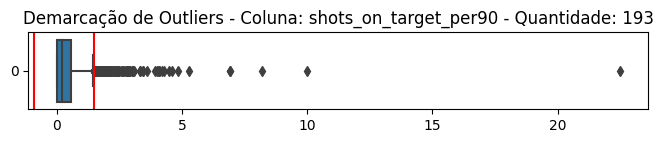



    OUTLIERS DA COLUNA goals_per_shot
Limite Inferior: -0.165 
Limite Superior: 0.275
Outliers da coluna "goals_per_shot": [0.28, 0.28, 0.28, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.31, 0.31, 0.32, 0.32, 0.32, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.36, 0.36, 0.36, 0.37, 0.37, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.43, 0.43, 0.43, 0.44, 0.45, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,

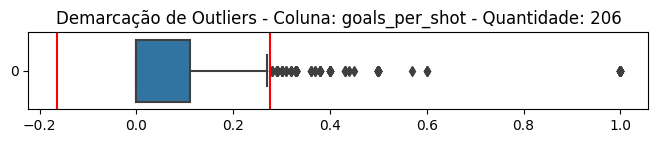



    OUTLIERS DA COLUNA goals_per_shot_on_target
Limite Inferior: -0.495 
Limite Superior: 0.825
Outliers da coluna "goals_per_shot_on_target": [0.83, 0.83, 0.83, 0.86, 0.86, 0.86, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0

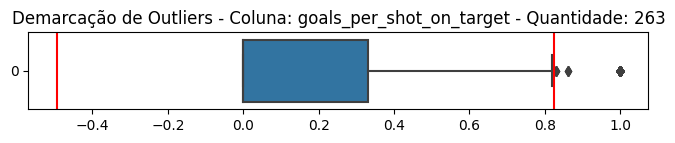



    OUTLIERS DA COLUNA npxg_per_shot
Limite Inferior: -0.075 
Limite Superior: 0.205
Outliers da coluna "npxg_per_shot": [0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.21, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.27, 0.27, 0.27, 0.27, 0.27, 0.27, 0.27, 0.28, 0.28, 0.28, 0.28, 0.28, 0.28, 0.29, 0.29, 0.29, 0.29, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.31, 0.31, 0.32, 0.32, 0.32, 0.33, 0.33, 0.34, 0.34, 0.34, 0.35, 0.35, 0.35, 0.36, 0.36, 0.3

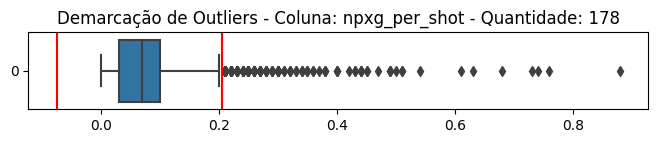



    OUTLIERS DA COLUNA xg_net
Limite Inferior: -1.450 
Limite Superior: 1.350
Outliers da coluna "xg_net": [-7.7, -6.6, -6.4, -6.3, -6.3, -5.9, -5.6, -5.3, -5.2, -5.1, -5.1, -5.0, -4.9, -4.9, -4.9, -4.9, -4.8, -4.8, -4.7, -4.6, -4.5, -4.5, -4.4, -4.3, -4.2, -4.1, -4.0, -3.9, -3.8, -3.8, -3.7, -3.7, -3.7, -3.7, -3.7, -3.6, -3.6, -3.6, -3.6, -3.6, -3.6, -3.6, -3.5, -3.5, -3.4, -3.4, -3.4, -3.4, -3.3, -3.3, -3.3, -3.3, -3.2, -3.2, -3.2, -3.2, -3.1, -3.1, -3.1, -3.1, -3.1, -3.0, -3.0, -3.0, -3.0, -3.0, -3.0, -3.0, -2.9, -2.9, -2.9, -2.9, -2.9, -2.9, -2.9, -2.9, -2.9, -2.8, -2.8, -2.8, -2.8, -2.8, -2.7, -2.7, -2.7, -2.7, -2.7, -2.7, -2.7, -2.6, -2.6, -2.6, -2.6, -2.6, -2.6, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2

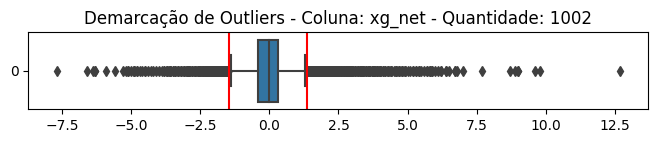



    OUTLIERS DA COLUNA npxg_net
Limite Inferior: -1.450 
Limite Superior: 1.350
Outliers da coluna "npxg_net": [-6.9, -6.5, -6.5, -6.2, -6.1, -6.1, -6.0, -5.7, -5.6, -5.4, -5.2, -5.1, -5.1, -4.8, -4.7, -4.7, -4.6, -4.6, -4.5, -4.4, -4.2, -4.1, -4.0, -4.0, -3.9, -3.9, -3.8, -3.7, -3.7, -3.7, -3.7, -3.7, -3.6, -3.6, -3.6, -3.6, -3.6, -3.6, -3.6, -3.5, -3.5, -3.4, -3.4, -3.4, -3.3, -3.3, -3.3, -3.2, -3.2, -3.2, -3.1, -3.1, -3.1, -3.0, -3.0, -3.0, -3.0, -3.0, -3.0, -3.0, -2.9, -2.9, -2.9, -2.9, -2.9, -2.9, -2.9, -2.9, -2.9, -2.9, -2.9, -2.9, -2.8, -2.8, -2.8, -2.8, -2.8, -2.8, -2.8, -2.7, -2.7, -2.7, -2.7, -2.7, -2.7, -2.7, -2.6, -2.6, -2.6, -2.6, -2.6, -2.6, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2

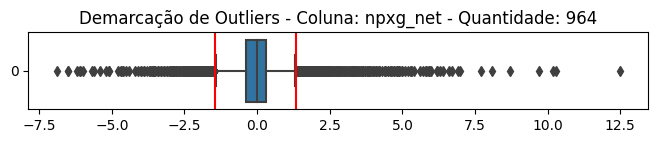



    OUTLIERS DA COLUNA passes_completed
Limite Inferior: -865.500 
Limite Superior: 1802.500
Outliers da coluna "passes_completed": [1804.0, 1805.0, 1806.0, 1809.0, 1816.0, 1818.0, 1819.0, 1820.0, 1826.0, 1830.0, 1831.0, 1838.0, 1840.0, 1843.0, 1846.0, 1852.0, 1858.0, 1860.0, 1864.0, 1864.0, 1865.0, 1865.0, 1868.0, 1884.0, 1886.0, 1887.0, 1898.0, 1899.0, 1900.0, 1905.0, 1905.0, 1906.0, 1911.0, 1913.0, 1919.0, 1920.0, 1921.0, 1931.0, 1933.0, 1936.0, 1939.0, 1945.0, 1945.0, 1951.0, 1955.0, 1955.0, 1963.0, 1964.0, 1966.0, 1967.0, 1967.0, 1974.0, 1978.0, 1981.0, 1981.0, 1985.0, 1985.0, 1987.0, 1989.0, 1993.0, 1997.0, 2003.0, 2034.0, 2042.0, 2053.0, 2055.0, 2058.0, 2067.0, 2077.0, 2088.0, 2093.0, 2110.0, 2118.0, 2127.0, 2136.0, 2147.0, 2157.0, 2163.0, 2196.0, 2208.0, 2217.0, 2223.0, 2230.0, 2233.0, 2242.0, 2250.0, 2254.0, 2259.0, 2267.0, 2283.0, 2293.0, 2293.0, 2303.0, 2305.0, 2310.0, 2318.0, 2331.0, 2337.0, 2363.0, 2370.0, 2371.0, 2404.0, 2417.0, 2440.0, 2469.0, 2471.0, 2584.0, 2614.0, 2

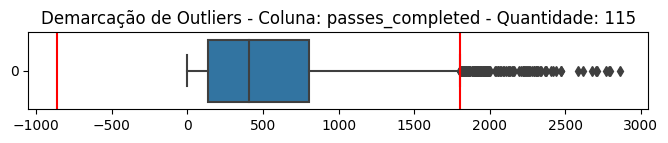



    OUTLIERS DA COLUNA passes
Limite Inferior: -1097.500 
Limite Superior: 2314.500
Outliers da coluna "passes": [2321.0, 2323.0, 2342.0, 2352.0, 2354.0, 2372.0, 2373.0, 2378.0, 2397.0, 2403.0, 2419.0, 2422.0, 2429.0, 2432.0, 2440.0, 2450.0, 2462.0, 2471.0, 2478.0, 2481.0, 2499.0, 2510.0, 2511.0, 2512.0, 2528.0, 2531.0, 2532.0, 2537.0, 2547.0, 2578.0, 2584.0, 2610.0, 2621.0, 2653.0, 2655.0, 2659.0, 2662.0, 2686.0, 2797.0, 2838.0, 2847.0, 2863.0, 2892.0, 2928.0, 2932.0, 2939.0, 2944.0, 2996.0, 3025.0, 3028.0, 3032.0, 3033.0, 3085.0, 3147.0, 3229.0]


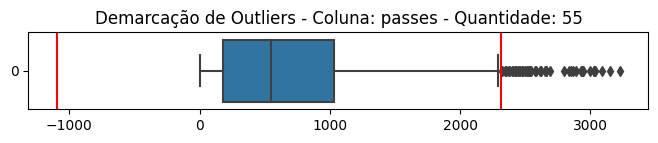



    OUTLIERS DA COLUNA passes_pct
Limite Inferior: 52.400 
Limite Superior: 102.000
Outliers da coluna "passes_pct": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 12.5, 20.0, 20.0, 25.0, 29.6, 32.4, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 35.0, 35.7, 35.7, 37.5, 37.5, 37.5, 38.8, 39.0, 39.6, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 41.0, 41.2, 41.8, 42.1, 42.4, 42.7, 42.9, 42.9, 42.9, 42.9, 42.9, 42.9, 43.0, 43.3, 43.4, 43.5, 43.5, 44.0, 44.4, 44.4, 44.4, 44.4, 44.4, 44.5, 45.0, 45.1, 45.2, 45.2, 45.3, 45.4, 45.4, 45.4, 45.5, 45.5, 45.5, 46.1, 46.2, 46.2, 46.5, 46.6, 46.8, 46.9, 47.3, 47.4, 47.4, 47.7, 47.8, 48.1, 48.1, 48.1, 48.3, 48.5, 48.5, 48.8, 49.1, 49.6, 49.9, 49.9, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 5

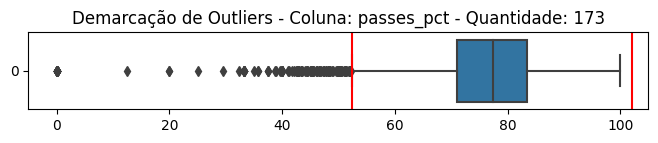



    OUTLIERS DA COLUNA passes_total_distance
Limite Inferior: -18202.000 
Limite Superior: 36614.000
Outliers da coluna "passes_total_distance": [36732.0, 36779.0, 36813.0, 36920.0, 37068.0, 37123.0, 37141.0, 37196.0, 37264.0, 37505.0, 37514.0, 37524.0, 37754.0, 37754.0, 37991.0, 37998.0, 38271.0, 38492.0, 38569.0, 38632.0, 38649.0, 38704.0, 38895.0, 38906.0, 38935.0, 38957.0, 39122.0, 39228.0, 39368.0, 39465.0, 39614.0, 39696.0, 39897.0, 40062.0, 40123.0, 40146.0, 40151.0, 40275.0, 40363.0, 40479.0, 40522.0, 40559.0, 40867.0, 41142.0, 41235.0, 41285.0, 41315.0, 41350.0, 41485.0, 41660.0, 41890.0, 41893.0, 41975.0, 42171.0, 42174.0, 42311.0, 42547.0, 42577.0, 42667.0, 42800.0, 42926.0, 42971.0, 43609.0, 44062.0, 44080.0, 44219.0, 44495.0, 44552.0, 44640.0, 44819.0, 44973.0, 45041.0, 45124.0, 45203.0, 45275.0, 46092.0, 46352.0, 46777.0, 46862.0, 46934.0, 47096.0, 47127.0, 47140.0, 47146.0, 47170.0, 48101.0, 48449.0, 48604.0, 49659.0, 49836.0, 49838.0, 50039.0, 50426.0, 51015.0, 51126.

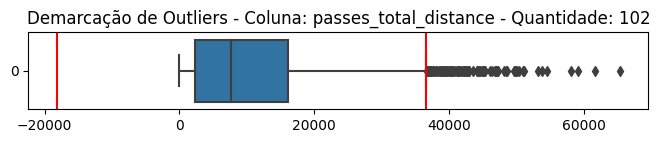



    OUTLIERS DA COLUNA passes_progressive_distance
Limite Inferior: -6515.000 
Limite Superior: 12541.000
Outliers da coluna "passes_progressive_distance": [12561.0, 12573.0, 12576.0, 12597.0, 12600.0, 12620.0, 12627.0, 12638.0, 12647.0, 12653.0, 12694.0, 12730.0, 12777.0, 12814.0, 12822.0, 12837.0, 12871.0, 12895.0, 12901.0, 12913.0, 12988.0, 12992.0, 13008.0, 13018.0, 13042.0, 13053.0, 13057.0, 13071.0, 13101.0, 13107.0, 13123.0, 13123.0, 13132.0, 13185.0, 13188.0, 13253.0, 13254.0, 13268.0, 13283.0, 13292.0, 13304.0, 13309.0, 13309.0, 13313.0, 13352.0, 13429.0, 13462.0, 13462.0, 13471.0, 13473.0, 13482.0, 13496.0, 13553.0, 13563.0, 13611.0, 13658.0, 13665.0, 13673.0, 13690.0, 13712.0, 13721.0, 13731.0, 13768.0, 13770.0, 13843.0, 13854.0, 13864.0, 13890.0, 13941.0, 13949.0, 13962.0, 13975.0, 13987.0, 14001.0, 14004.0, 14010.0, 14012.0, 14034.0, 14040.0, 14040.0, 14043.0, 14051.0, 14095.0, 14133.0, 14184.0, 14205.0, 14223.0, 14228.0, 14230.0, 14235.0, 14256.0, 14292.0, 14320.0, 1440

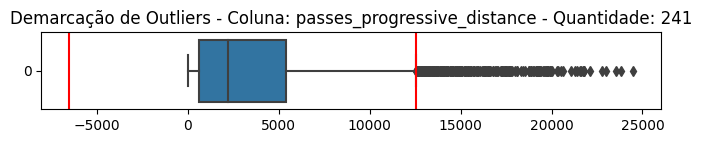



    OUTLIERS DA COLUNA passes_completed_short
Limite Inferior: -348.000 
Limite Superior: 716.000
Outliers da coluna "passes_completed_short": [720.0, 720.0, 721.0, 722.0, 723.0, 724.0, 725.0, 725.0, 727.0, 729.0, 729.0, 729.0, 731.0, 731.0, 733.0, 733.0, 734.0, 737.0, 739.0, 740.0, 740.0, 740.0, 741.0, 741.0, 742.0, 747.0, 749.0, 751.0, 753.0, 754.0, 759.0, 759.0, 759.0, 760.0, 761.0, 761.0, 763.0, 763.0, 765.0, 767.0, 770.0, 772.0, 772.0, 773.0, 773.0, 773.0, 778.0, 781.0, 781.0, 782.0, 785.0, 785.0, 785.0, 785.0, 788.0, 788.0, 789.0, 791.0, 792.0, 793.0, 795.0, 797.0, 799.0, 802.0, 802.0, 806.0, 807.0, 809.0, 810.0, 813.0, 814.0, 817.0, 819.0, 822.0, 823.0, 824.0, 825.0, 826.0, 828.0, 829.0, 831.0, 833.0, 835.0, 837.0, 839.0, 841.0, 843.0, 843.0, 844.0, 846.0, 848.0, 848.0, 848.0, 854.0, 861.0, 865.0, 865.0, 870.0, 877.0, 877.0, 877.0, 886.0, 893.0, 893.0, 893.0, 906.0, 909.0, 909.0, 910.0, 916.0, 919.0, 920.0, 920.0, 936.0, 936.0, 956.0, 962.0, 964.0, 968.0, 975.0, 976.0, 980.0, 

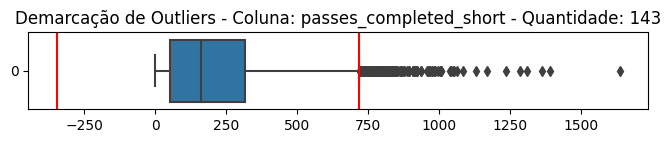



    OUTLIERS DA COLUNA passes_short
Limite Inferior: -400.500 
Limite Superior: 827.500
Outliers da coluna "passes_short": [828.0, 829.0, 829.0, 831.0, 832.0, 835.0, 835.0, 837.0, 837.0, 837.0, 838.0, 838.0, 840.0, 840.0, 841.0, 842.0, 842.0, 848.0, 848.0, 850.0, 850.0, 851.0, 854.0, 854.0, 856.0, 856.0, 856.0, 859.0, 861.0, 862.0, 863.0, 866.0, 874.0, 876.0, 876.0, 877.0, 877.0, 877.0, 879.0, 880.0, 883.0, 883.0, 883.0, 886.0, 888.0, 890.0, 891.0, 893.0, 903.0, 903.0, 903.0, 908.0, 912.0, 914.0, 915.0, 917.0, 917.0, 920.0, 920.0, 922.0, 926.0, 926.0, 927.0, 927.0, 928.0, 928.0, 929.0, 931.0, 931.0, 933.0, 935.0, 936.0, 938.0, 945.0, 947.0, 952.0, 953.0, 958.0, 958.0, 959.0, 962.0, 969.0, 977.0, 980.0, 990.0, 991.0, 997.0, 1006.0, 1010.0, 1022.0, 1030.0, 1031.0, 1039.0, 1039.0, 1040.0, 1046.0, 1051.0, 1051.0, 1055.0, 1068.0, 1068.0, 1071.0, 1075.0, 1077.0, 1084.0, 1087.0, 1090.0, 1108.0, 1113.0, 1115.0, 1132.0, 1153.0, 1157.0, 1183.0, 1195.0, 1295.0, 1359.0, 1393.0, 1434.0, 1467.0, 1

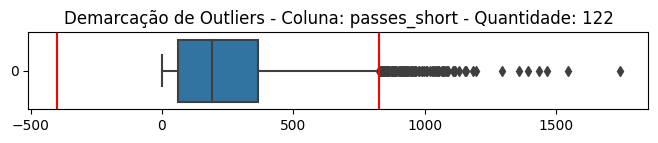



    OUTLIERS DA COLUNA passes_pct_short
Limite Inferior: 67.750 
Limite Superior: 104.950
Outliers da coluna "passes_pct_short": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 25.0, 25.0, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 40.0, 40.0, 40.0, 41.2, 42.9, 44.4, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 51.0, 54.5, 55.1, 55.3, 55.6, 55.6, 55.6, 55.6, 55.6, 55.6, 56.5, 57.1, 57.1, 57.6, 58.3, 58.3, 58.9, 59.2, 59.7, 60.0, 60.0, 60.0, 60.0, 60.0, 6

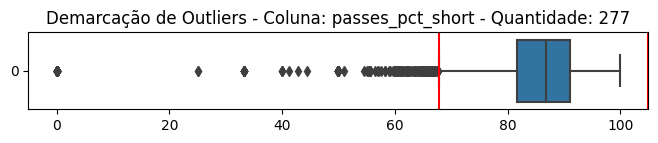



    OUTLIERS DA COLUNA passes_completed_medium
Limite Inferior: -392.000 
Limite Superior: 784.000
Outliers da coluna "passes_completed_medium": [785.0, 785.0, 786.0, 787.0, 787.0, 788.0, 788.0, 789.0, 793.0, 793.0, 794.0, 797.0, 797.0, 797.0, 798.0, 798.0, 798.0, 799.0, 799.0, 799.0, 800.0, 801.0, 801.0, 802.0, 802.0, 803.0, 804.0, 805.0, 805.0, 810.0, 811.0, 813.0, 814.0, 814.0, 815.0, 816.0, 818.0, 819.0, 820.0, 821.0, 821.0, 823.0, 823.0, 823.0, 825.0, 826.0, 829.0, 830.0, 835.0, 836.0, 838.0, 839.0, 839.0, 841.0, 841.0, 843.0, 846.0, 848.0, 851.0, 852.0, 852.0, 855.0, 856.0, 856.0, 856.0, 858.0, 859.0, 861.0, 870.0, 870.0, 871.0, 873.0, 875.0, 878.0, 878.0, 880.0, 881.0, 881.0, 884.0, 886.0, 888.0, 889.0, 889.0, 890.0, 892.0, 901.0, 902.0, 904.0, 905.0, 911.0, 914.0, 916.0, 917.0, 917.0, 920.0, 923.0, 924.0, 924.0, 924.0, 925.0, 928.0, 928.0, 932.0, 932.0, 944.0, 948.0, 954.0, 954.0, 958.0, 960.0, 965.0, 967.0, 968.0, 970.0, 973.0, 977.0, 977.0, 978.0, 978.0, 978.0, 984.0, 984.0

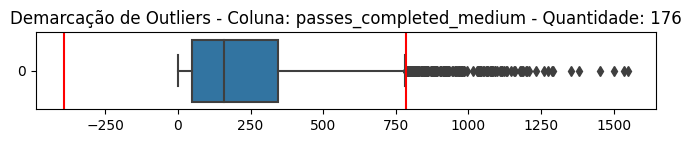



    OUTLIERS DA COLUNA passes_medium
Limite Inferior: -454.000 
Limite Superior: 922.000
Outliers da coluna "passes_medium": [926.0, 927.0, 928.0, 929.0, 929.0, 929.0, 930.0, 932.0, 932.0, 934.0, 936.0, 937.0, 937.0, 938.0, 943.0, 944.0, 946.0, 946.0, 946.0, 948.0, 948.0, 950.0, 955.0, 959.0, 965.0, 965.0, 966.0, 969.0, 970.0, 971.0, 971.0, 974.0, 974.0, 975.0, 978.0, 981.0, 981.0, 984.0, 985.0, 986.0, 986.0, 987.0, 988.0, 989.0, 997.0, 997.0, 1008.0, 1010.0, 1015.0, 1015.0, 1016.0, 1017.0, 1017.0, 1021.0, 1025.0, 1026.0, 1028.0, 1030.0, 1030.0, 1032.0, 1033.0, 1039.0, 1039.0, 1041.0, 1045.0, 1051.0, 1051.0, 1060.0, 1066.0, 1075.0, 1082.0, 1084.0, 1086.0, 1093.0, 1096.0, 1103.0, 1111.0, 1115.0, 1116.0, 1123.0, 1123.0, 1130.0, 1141.0, 1147.0, 1158.0, 1160.0, 1163.0, 1166.0, 1171.0, 1176.0, 1177.0, 1180.0, 1186.0, 1189.0, 1190.0, 1197.0, 1197.0, 1204.0, 1205.0, 1210.0, 1214.0, 1219.0, 1229.0, 1237.0, 1247.0, 1254.0, 1254.0, 1256.0, 1275.0, 1275.0, 1277.0, 1281.0, 1292.0, 1317.0, 1336.0

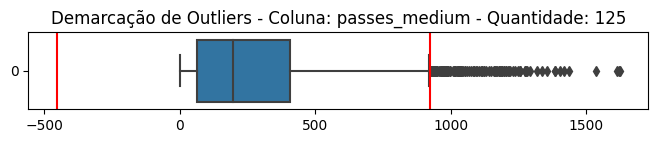



    OUTLIERS DA COLUNA passes_pct_medium
Limite Inferior: 54.100 
Limite Superior: 112.500
Outliers da coluna "passes_pct_medium": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 20.0, 20.0, 20.0, 25.0, 25.0, 25.0, 25.0, 25.0, 25.0, 28.6, 30.0, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 37.5, 38.5, 39.4, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 42.9, 42.9, 42.9, 42.9, 42.9, 43.7, 43.8, 45.5, 45.5, 46.0, 46.4, 46.7, 47.1, 47.6, 47.6, 47.6, 47.8, 48.2, 48.7, 48.8, 49.6, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 

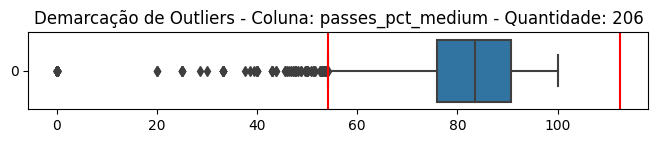



    OUTLIERS DA COLUNA passes_completed_long
Limite Inferior: -143.000 
Limite Superior: 273.000
Outliers da coluna "passes_completed_long": [274.0, 274.0, 275.0, 275.0, 276.0, 276.0, 276.0, 277.0, 277.0, 277.0, 277.0, 277.0, 277.0, 278.0, 278.0, 278.0, 278.0, 278.0, 279.0, 279.0, 280.0, 280.0, 281.0, 281.0, 281.0, 281.0, 281.0, 281.0, 281.0, 281.0, 282.0, 282.0, 282.0, 282.0, 283.0, 284.0, 285.0, 285.0, 285.0, 286.0, 286.0, 286.0, 287.0, 287.0, 287.0, 288.0, 288.0, 288.0, 289.0, 290.0, 290.0, 290.0, 291.0, 291.0, 291.0, 291.0, 292.0, 292.0, 292.0, 292.0, 293.0, 293.0, 293.0, 293.0, 294.0, 294.0, 294.0, 294.0, 294.0, 294.0, 294.0, 295.0, 295.0, 295.0, 295.0, 295.0, 295.0, 296.0, 296.0, 297.0, 297.0, 298.0, 299.0, 299.0, 299.0, 300.0, 300.0, 301.0, 301.0, 301.0, 302.0, 302.0, 302.0, 302.0, 303.0, 304.0, 304.0, 305.0, 305.0, 306.0, 306.0, 306.0, 307.0, 307.0, 307.0, 308.0, 308.0, 308.0, 309.0, 309.0, 310.0, 310.0, 311.0, 312.0, 312.0, 312.0, 312.0, 312.0, 312.0, 312.0, 312.0, 313.0, 31

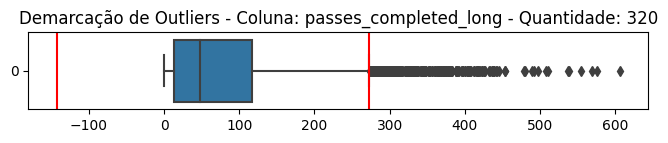



    OUTLIERS DA COLUNA passes_long
Limite Inferior: -238.500 
Limite Superior: 461.500
Outliers da coluna "passes_long": [462.0, 462.0, 462.0, 462.0, 463.0, 463.0, 463.0, 464.0, 465.0, 465.0, 467.0, 467.0, 468.0, 468.0, 469.0, 469.0, 471.0, 471.0, 472.0, 472.0, 473.0, 473.0, 474.0, 474.0, 475.0, 476.0, 476.0, 477.0, 477.0, 478.0, 478.0, 478.0, 479.0, 479.0, 480.0, 481.0, 482.0, 483.0, 483.0, 483.0, 484.0, 484.0, 485.0, 486.0, 487.0, 487.0, 487.0, 488.0, 488.0, 489.0, 489.0, 490.0, 492.0, 492.0, 493.0, 493.0, 493.0, 496.0, 497.0, 499.0, 500.0, 501.0, 502.0, 502.0, 503.0, 504.0, 504.0, 505.0, 506.0, 507.0, 507.0, 508.0, 509.0, 510.0, 510.0, 512.0, 512.0, 512.0, 514.0, 515.0, 515.0, 515.0, 516.0, 517.0, 517.0, 518.0, 518.0, 518.0, 519.0, 519.0, 519.0, 521.0, 521.0, 522.0, 523.0, 525.0, 525.0, 525.0, 525.0, 526.0, 526.0, 527.0, 528.0, 532.0, 532.0, 534.0, 534.0, 535.0, 536.0, 537.0, 537.0, 538.0, 538.0, 538.0, 540.0, 541.0, 542.0, 545.0, 545.0, 547.0, 548.0, 552.0, 552.0, 552.0, 553.0, 5

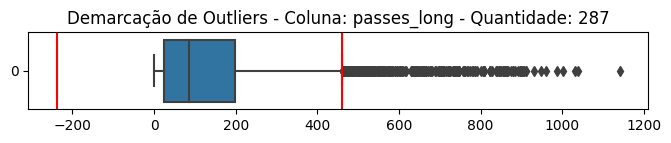



    OUTLIERS DA COLUNA passes_pct_long
Limite Inferior: 14.550 
Limite Superior: 101.350
Outliers da coluna "passes_pct_long": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

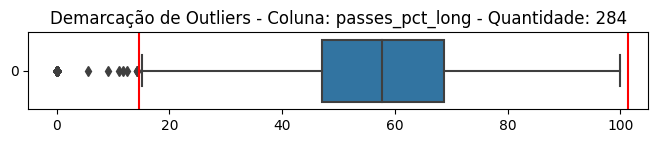



    OUTLIERS DA COLUNA xa_net
Limite Inferior: -1.600 
Limite Superior: 1.600
Outliers da coluna "xa_net": [-6.0, -4.7, -4.4, -4.3, -4.3, -4.0, -4.0, -3.9, -3.9, -3.8, -3.8, -3.7, -3.6, -3.6, -3.6, -3.5, -3.4, -3.4, -3.4, -3.4, -3.3, -3.3, -3.3, -3.2, -3.2, -3.2, -3.2, -3.2, -3.2, -3.2, -3.2, -3.1, -3.1, -3.1, -3.1, -3.1, -3.1, -3.0, -3.0, -3.0, -3.0, -3.0, -2.9, -2.9, -2.9, -2.8, -2.8, -2.8, -2.8, -2.8, -2.7, -2.7, -2.7, -2.7, -2.7, -2.7, -2.6, -2.6, -2.6, -2.6, -2.6, -2.6, -2.6, -2.6, -2.6, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.5, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.4, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.3, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.1, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2

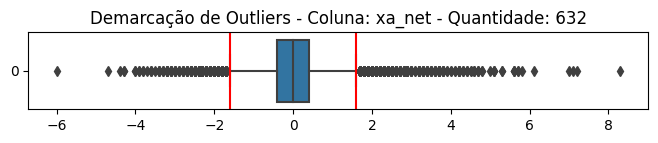



    OUTLIERS DA COLUNA assisted_shots
Limite Inferior: -24.500 
Limite Superior: 43.500
Outliers da coluna "assisted_shots": [44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53

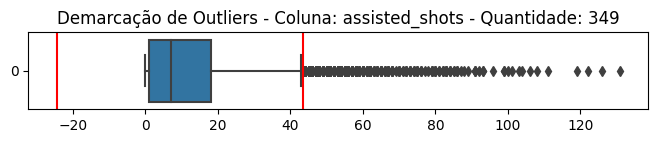



    OUTLIERS DA COLUNA passes_into_final_third
Limite Inferior: -72.500 
Limite Superior: 139.500
Outliers da coluna "passes_into_final_third": [140.0, 140.0, 140.0, 140.0, 141.0, 141.0, 141.0, 141.0, 141.0, 142.0, 142.0, 142.0, 142.0, 142.0, 142.0, 142.0, 143.0, 143.0, 143.0, 143.0, 143.0, 143.0, 143.0, 143.0, 143.0, 144.0, 144.0, 144.0, 144.0, 145.0, 145.0, 145.0, 145.0, 145.0, 146.0, 146.0, 147.0, 147.0, 147.0, 147.0, 147.0, 148.0, 148.0, 148.0, 148.0, 148.0, 148.0, 148.0, 149.0, 149.0, 149.0, 149.0, 149.0, 149.0, 150.0, 150.0, 150.0, 150.0, 150.0, 150.0, 150.0, 151.0, 151.0, 151.0, 151.0, 152.0, 152.0, 153.0, 153.0, 153.0, 153.0, 154.0, 154.0, 154.0, 154.0, 154.0, 155.0, 155.0, 156.0, 156.0, 156.0, 156.0, 156.0, 156.0, 157.0, 157.0, 157.0, 158.0, 158.0, 158.0, 158.0, 158.0, 159.0, 159.0, 159.0, 160.0, 160.0, 160.0, 161.0, 162.0, 162.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 164.0, 165.0, 165.0, 165.0, 165.0, 166.0, 166.0, 167.0, 168.0, 168.0, 168.0, 168.0, 169.0, 169.0, 169.0,

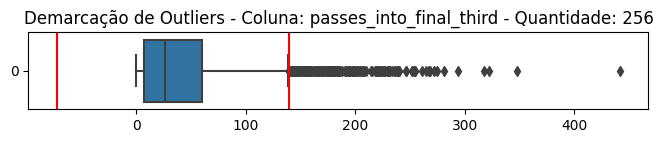



    OUTLIERS DA COLUNA passes_into_penalty_area
Limite Inferior: -21.500 
Limite Superior: 38.500
Outliers da coluna "passes_into_penalty_area": [39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 

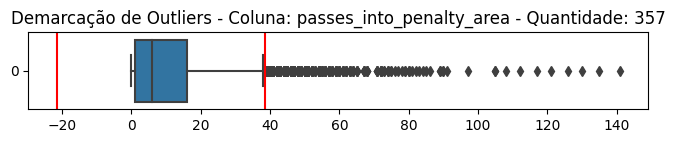



    OUTLIERS DA COLUNA crosses_into_penalty_area
Limite Inferior: -6.000 
Limite Superior: 10.000
Outliers da coluna "crosses_into_penalty_area": [11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0,

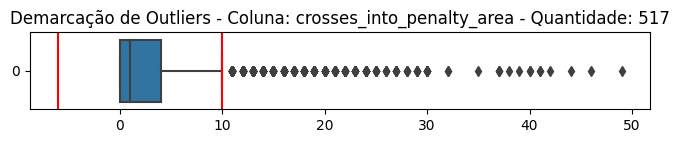



    OUTLIERS DA COLUNA progressive_passes
Limite Inferior: -90.500 
Limite Superior: 169.500
Outliers da coluna "progressive_passes": [170.0, 170.0, 170.0, 171.0, 171.0, 171.0, 171.0, 171.0, 171.0, 171.0, 172.0, 172.0, 172.0, 172.0, 172.0, 173.0, 173.0, 173.0, 173.0, 173.0, 173.0, 173.0, 173.0, 174.0, 175.0, 175.0, 175.0, 175.0, 176.0, 176.0, 176.0, 176.0, 176.0, 177.0, 177.0, 178.0, 178.0, 178.0, 178.0, 178.0, 179.0, 179.0, 179.0, 180.0, 181.0, 181.0, 181.0, 182.0, 182.0, 182.0, 183.0, 184.0, 184.0, 184.0, 185.0, 185.0, 185.0, 185.0, 185.0, 185.0, 185.0, 185.0, 186.0, 186.0, 186.0, 186.0, 187.0, 187.0, 187.0, 187.0, 189.0, 189.0, 190.0, 191.0, 191.0, 191.0, 191.0, 191.0, 192.0, 192.0, 192.0, 193.0, 194.0, 195.0, 196.0, 197.0, 197.0, 197.0, 197.0, 198.0, 198.0, 198.0, 198.0, 200.0, 201.0, 201.0, 203.0, 203.0, 204.0, 207.0, 207.0, 209.0, 210.0, 211.0, 211.0, 211.0, 211.0, 212.0, 212.0, 213.0, 213.0, 213.0, 215.0, 215.0, 216.0, 216.0, 217.0, 217.0, 218.0, 218.0, 219.0, 222.0, 222.0, 22

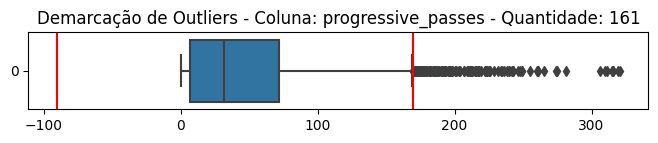



    OUTLIERS DA COLUNA passes_live
Limite Inferior: -958.500 
Limite Superior: 2037.500
Outliers da coluna "passes_live": [2039.0, 2042.0, 2053.0, 2064.0, 2069.0, 2069.0, 2071.0, 2073.0, 2076.0, 2076.0, 2078.0, 2078.0, 2085.0, 2086.0, 2094.0, 2098.0, 2105.0, 2105.0, 2110.0, 2111.0, 2114.0, 2115.0, 2129.0, 2133.0, 2134.0, 2135.0, 2141.0, 2145.0, 2148.0, 2153.0, 2155.0, 2163.0, 2169.0, 2174.0, 2186.0, 2192.0, 2201.0, 2210.0, 2211.0, 2212.0, 2226.0, 2234.0, 2235.0, 2239.0, 2262.0, 2262.0, 2285.0, 2287.0, 2293.0, 2298.0, 2316.0, 2327.0, 2331.0, 2342.0, 2347.0, 2366.0, 2375.0, 2382.0, 2419.0, 2419.0, 2432.0, 2436.0, 2443.0, 2446.0, 2455.0, 2462.0, 2467.0, 2474.0, 2488.0, 2489.0, 2495.0, 2497.0, 2505.0, 2510.0, 2518.0, 2533.0, 2536.0, 2548.0, 2578.0, 2688.0, 2776.0, 2888.0, 2908.0, 2940.0, 2951.0, 2990.0, 3000.0, 3007.0, 3153.0]


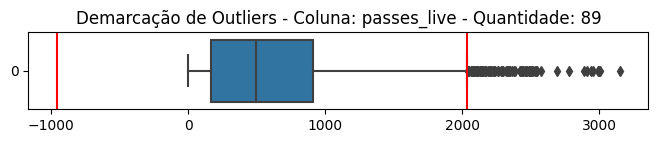



    OUTLIERS DA COLUNA passes_dead
Limite Inferior: -91.500 
Limite Superior: 176.500
Outliers da coluna "passes_dead": [177.0, 177.0, 177.0, 177.0, 177.0, 177.0, 177.0, 178.0, 178.0, 178.0, 178.0, 178.0, 178.0, 178.0, 178.0, 179.0, 180.0, 180.0, 180.0, 181.0, 181.0, 181.0, 181.0, 181.0, 181.0, 181.0, 182.0, 182.0, 182.0, 182.0, 182.0, 182.0, 183.0, 183.0, 183.0, 183.0, 183.0, 183.0, 183.0, 184.0, 184.0, 185.0, 185.0, 185.0, 186.0, 186.0, 186.0, 186.0, 186.0, 187.0, 187.0, 187.0, 187.0, 187.0, 187.0, 188.0, 188.0, 188.0, 188.0, 188.0, 189.0, 189.0, 189.0, 189.0, 189.0, 190.0, 190.0, 191.0, 191.0, 191.0, 192.0, 192.0, 192.0, 192.0, 192.0, 193.0, 193.0, 194.0, 194.0, 194.0, 194.0, 194.0, 194.0, 195.0, 195.0, 195.0, 196.0, 197.0, 197.0, 197.0, 197.0, 197.0, 198.0, 198.0, 198.0, 198.0, 198.0, 198.0, 199.0, 199.0, 199.0, 199.0, 199.0, 199.0, 200.0, 200.0, 200.0, 200.0, 200.0, 200.0, 200.0, 201.0, 201.0, 201.0, 201.0, 201.0, 201.0, 201.0, 202.0, 202.0, 203.0, 203.0, 203.0, 203.0, 203.0, 20

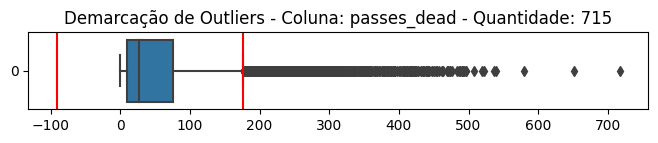



    OUTLIERS DA COLUNA passes_free_kicks
Limite Inferior: -32.000 
Limite Superior: 56.000
Outliers da coluna "passes_free_kicks": [57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 67.0, 67

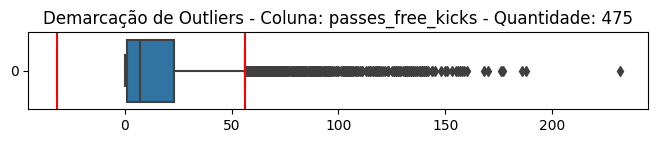



    OUTLIERS DA COLUNA through_balls
Limite Inferior: -3.000 
Limite Superior: 5.000
Outliers da coluna "through_balls": [6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8

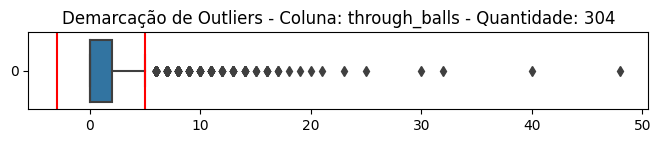



    OUTLIERS DA COLUNA passes_pressure
Limite Inferior: -174.500 
Limite Superior: 373.500
Outliers da coluna "passes_pressure": [374.0, 374.0, 374.0, 376.0, 376.0, 376.0, 378.0, 378.0, 379.0, 380.0, 380.0, 381.0, 382.0, 382.0, 382.0, 383.0, 384.0, 384.0, 385.0, 387.0, 388.0, 390.0, 390.0, 392.0, 392.0, 393.0, 394.0, 394.0, 397.0, 397.0, 398.0, 398.0, 399.0, 399.0, 400.0, 400.0, 401.0, 401.0, 401.0, 402.0, 402.0, 402.0, 403.0, 403.0, 404.0, 413.0, 418.0, 420.0, 422.0, 425.0, 425.0, 426.0, 429.0, 430.0, 432.0, 438.0, 444.0, 449.0, 449.0, 454.0, 466.0, 473.0, 477.0, 488.0, 509.0, 527.0]


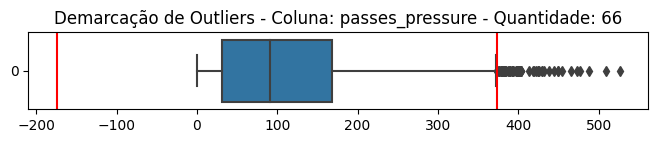



    OUTLIERS DA COLUNA passes_switches
Limite Inferior: -36.000 
Limite Superior: 68.000
Outliers da coluna "passes_switches": [69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 73.0, 73.0, 73.0, 73.0, 73.0, 73.0, 73.0, 73.0, 73.0, 73.0, 73.0, 73.0, 74.0, 74.0, 74.0, 74.0, 74.0, 74.0, 74.0, 74.0, 74.0, 75.0, 75.0, 75.0, 75.0, 75.0, 75.0, 75.0, 75.0, 75.0, 75.0, 76.0, 76.0, 76.0, 76.0, 76.0, 76.0, 76.0, 76.0, 76.0, 76.0, 77.0, 77.0, 77.0, 77.0, 77.0, 77.0, 78.0, 78.0, 78.0, 78.0, 78.0, 78.0, 78.0, 78.0, 78.0, 78.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 81.0, 81.0, 81.0, 81.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 84.0, 84.0, 84.0, 84.0, 84.0, 84.0, 84.0, 84.0, 

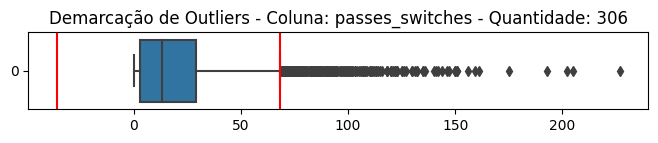



    OUTLIERS DA COLUNA crosses
Limite Inferior: -33.500 
Limite Superior: 58.500
Outliers da coluna "crosses": [59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 68.0, 68.0, 68.0, 68.0

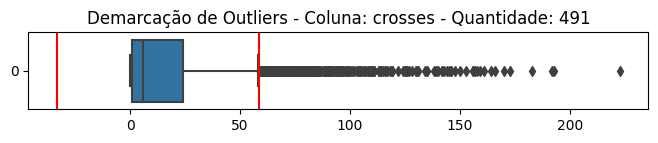



    OUTLIERS DA COLUNA corner_kicks
Limite Inferior: -3.000 
Limite Superior: 5.000
Outliers da coluna "corner_kicks": [6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0

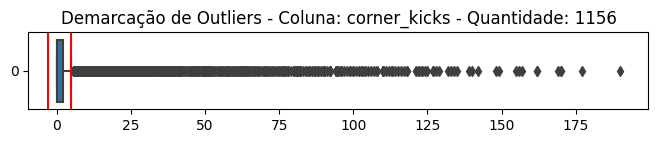



    OUTLIERS DA COLUNA corner_kicks_in
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "corner_kicks_in": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0

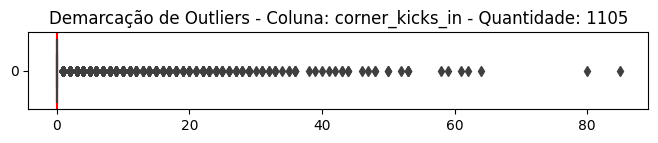



    OUTLIERS DA COLUNA corner_kicks_out
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "corner_kicks_out": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1

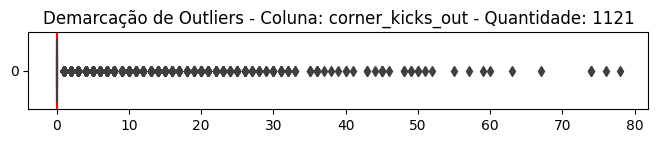



    OUTLIERS DA COLUNA corner_kicks_straight
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "corner_kicks_straight": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1

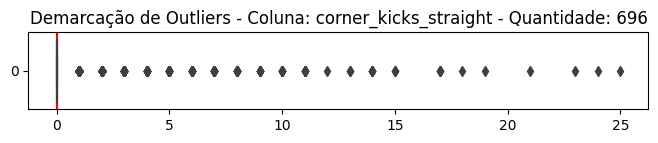



    OUTLIERS DA COLUNA passes_ground
Limite Inferior: -690.000 
Limite Superior: 1446.000
Outliers da coluna "passes_ground": [1449.0, 1451.0, 1454.0, 1454.0, 1460.0, 1460.0, 1463.0, 1464.0, 1468.0, 1469.0, 1470.0, 1471.0, 1472.0, 1472.0, 1475.0, 1475.0, 1475.0, 1480.0, 1483.0, 1483.0, 1484.0, 1488.0, 1491.0, 1495.0, 1495.0, 1500.0, 1505.0, 1507.0, 1508.0, 1511.0, 1513.0, 1514.0, 1514.0, 1514.0, 1514.0, 1515.0, 1521.0, 1523.0, 1526.0, 1526.0, 1528.0, 1529.0, 1533.0, 1534.0, 1539.0, 1543.0, 1544.0, 1544.0, 1545.0, 1546.0, 1547.0, 1550.0, 1551.0, 1551.0, 1553.0, 1554.0, 1555.0, 1565.0, 1565.0, 1567.0, 1568.0, 1571.0, 1571.0, 1572.0, 1573.0, 1578.0, 1579.0, 1579.0, 1586.0, 1589.0, 1591.0, 1594.0, 1613.0, 1616.0, 1629.0, 1629.0, 1637.0, 1639.0, 1643.0, 1652.0, 1654.0, 1655.0, 1665.0, 1670.0, 1673.0, 1674.0, 1680.0, 1702.0, 1706.0, 1706.0, 1706.0, 1709.0, 1709.0, 1710.0, 1711.0, 1713.0, 1714.0, 1715.0, 1716.0, 1721.0, 1736.0, 1739.0, 1750.0, 1751.0, 1752.0, 1753.0, 1755.0, 1758.0, 1762.0,

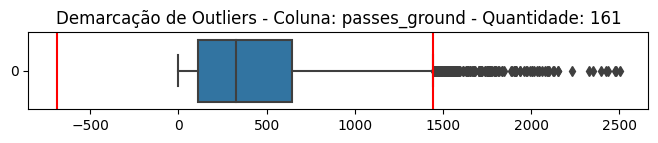



    OUTLIERS DA COLUNA passes_low
Limite Inferior: -143.500 
Limite Superior: 300.500
Outliers da coluna "passes_low": [301.0, 301.0, 301.0, 302.0, 302.0, 302.0, 302.0, 302.0, 303.0, 303.0, 304.0, 305.0, 305.0, 305.0, 306.0, 306.0, 307.0, 307.0, 307.0, 307.0, 309.0, 309.0, 310.0, 310.0, 310.0, 311.0, 311.0, 312.0, 312.0, 312.0, 313.0, 313.0, 313.0, 313.0, 314.0, 314.0, 314.0, 314.0, 315.0, 315.0, 316.0, 316.0, 317.0, 318.0, 319.0, 319.0, 319.0, 320.0, 322.0, 322.0, 322.0, 322.0, 323.0, 323.0, 323.0, 323.0, 324.0, 324.0, 324.0, 325.0, 325.0, 325.0, 326.0, 326.0, 326.0, 327.0, 328.0, 328.0, 329.0, 329.0, 329.0, 331.0, 332.0, 334.0, 334.0, 335.0, 336.0, 337.0, 338.0, 338.0, 339.0, 340.0, 341.0, 342.0, 343.0, 343.0, 343.0, 344.0, 344.0, 345.0, 345.0, 347.0, 348.0, 348.0, 348.0, 348.0, 349.0, 349.0, 350.0, 351.0, 351.0, 352.0, 353.0, 353.0, 354.0, 355.0, 356.0, 357.0, 358.0, 360.0, 360.0, 361.0, 363.0, 363.0, 364.0, 364.0, 365.0, 366.0, 367.0, 367.0, 368.0, 368.0, 369.0, 370.0, 371.0, 371

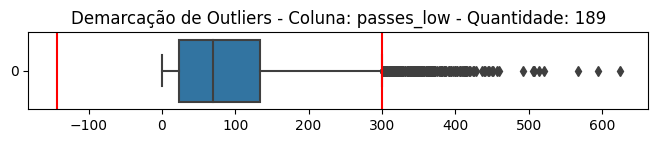



    OUTLIERS DA COLUNA passes_high
Limite Inferior: -237.000 
Limite Superior: 483.000
Outliers da coluna "passes_high": [485.0, 485.0, 485.0, 486.0, 487.0, 487.0, 487.0, 488.0, 488.0, 488.0, 489.0, 490.0, 490.0, 492.0, 492.0, 493.0, 493.0, 494.0, 495.0, 495.0, 496.0, 496.0, 497.0, 497.0, 497.0, 498.0, 498.0, 499.0, 499.0, 501.0, 501.0, 502.0, 502.0, 503.0, 503.0, 504.0, 505.0, 505.0, 507.0, 508.0, 509.0, 512.0, 512.0, 512.0, 512.0, 512.0, 513.0, 513.0, 513.0, 514.0, 515.0, 517.0, 517.0, 518.0, 518.0, 519.0, 519.0, 520.0, 520.0, 521.0, 521.0, 524.0, 525.0, 526.0, 526.0, 528.0, 529.0, 530.0, 537.0, 538.0, 539.0, 539.0, 540.0, 540.0, 542.0, 544.0, 546.0, 547.0, 547.0, 549.0, 550.0, 552.0, 553.0, 553.0, 553.0, 555.0, 555.0, 559.0, 561.0, 562.0, 565.0, 565.0, 565.0, 566.0, 568.0, 569.0, 570.0, 572.0, 572.0, 573.0, 574.0, 574.0, 575.0, 578.0, 579.0, 580.0, 583.0, 585.0, 586.0, 588.0, 590.0, 592.0, 593.0, 593.0, 593.0, 594.0, 595.0, 598.0, 603.0, 603.0, 605.0, 607.0, 608.0, 609.0, 609.0, 6

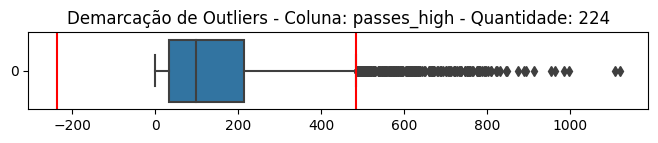



    OUTLIERS DA COLUNA passes_left_foot
Limite Inferior: -229.000 
Limite Superior: 451.000
Outliers da coluna "passes_left_foot": [452.0, 453.0, 454.0, 454.0, 454.0, 454.0, 455.0, 455.0, 456.0, 456.0, 457.0, 457.0, 457.0, 457.0, 457.0, 458.0, 459.0, 459.0, 459.0, 461.0, 461.0, 461.0, 462.0, 462.0, 464.0, 466.0, 466.0, 468.0, 468.0, 468.0, 468.0, 468.0, 469.0, 469.0, 469.0, 470.0, 471.0, 472.0, 472.0, 472.0, 473.0, 473.0, 474.0, 479.0, 479.0, 479.0, 480.0, 480.0, 480.0, 481.0, 482.0, 483.0, 483.0, 483.0, 485.0, 490.0, 492.0, 492.0, 492.0, 493.0, 493.0, 497.0, 497.0, 498.0, 498.0, 499.0, 501.0, 503.0, 505.0, 505.0, 507.0, 508.0, 508.0, 508.0, 509.0, 511.0, 511.0, 511.0, 513.0, 515.0, 516.0, 518.0, 519.0, 519.0, 519.0, 521.0, 523.0, 523.0, 524.0, 524.0, 524.0, 525.0, 527.0, 527.0, 528.0, 528.0, 529.0, 530.0, 530.0, 530.0, 531.0, 532.0, 533.0, 534.0, 535.0, 535.0, 535.0, 538.0, 539.0, 540.0, 540.0, 540.0, 541.0, 541.0, 542.0, 542.0, 543.0, 543.0, 543.0, 543.0, 544.0, 544.0, 545.0, 545.0

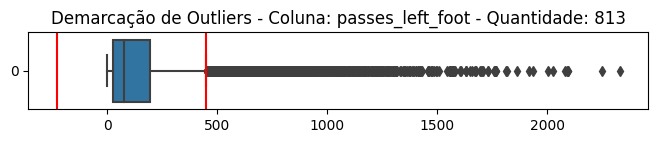



    OUTLIERS DA COLUNA passes_right_foot
Limite Inferior: -757.500 
Limite Superior: 1438.500
Outliers da coluna "passes_right_foot": [1444.0, 1445.0, 1445.0, 1446.0, 1448.0, 1451.0, 1452.0, 1454.0, 1454.0, 1454.0, 1458.0, 1458.0, 1462.0, 1464.0, 1464.0, 1465.0, 1466.0, 1467.0, 1469.0, 1469.0, 1469.0, 1471.0, 1477.0, 1480.0, 1483.0, 1483.0, 1485.0, 1485.0, 1488.0, 1489.0, 1493.0, 1496.0, 1499.0, 1503.0, 1505.0, 1506.0, 1507.0, 1507.0, 1509.0, 1513.0, 1513.0, 1517.0, 1520.0, 1526.0, 1527.0, 1531.0, 1531.0, 1532.0, 1533.0, 1534.0, 1545.0, 1546.0, 1548.0, 1549.0, 1550.0, 1552.0, 1552.0, 1558.0, 1560.0, 1561.0, 1565.0, 1565.0, 1567.0, 1577.0, 1578.0, 1578.0, 1581.0, 1585.0, 1585.0, 1586.0, 1586.0, 1597.0, 1599.0, 1604.0, 1606.0, 1607.0, 1607.0, 1617.0, 1619.0, 1619.0, 1622.0, 1632.0, 1632.0, 1635.0, 1639.0, 1643.0, 1644.0, 1648.0, 1650.0, 1653.0, 1662.0, 1662.0, 1663.0, 1668.0, 1669.0, 1669.0, 1670.0, 1672.0, 1673.0, 1673.0, 1678.0, 1681.0, 1709.0, 1710.0, 1714.0, 1716.0, 1716.0, 1717.0,

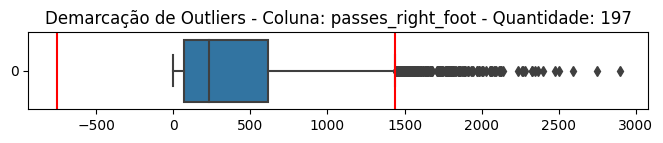



    OUTLIERS DA COLUNA passes_head
Limite Inferior: -57.000 
Limite Superior: 111.000
Outliers da coluna "passes_head": [112.0, 112.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 113.0, 113.0, 113.0, 113.0, 114.0, 114.0, 114.0, 114.0, 114.0, 115.0, 115.0, 115.0, 115.0, 115.0, 115.0, 115.0, 115.0, 115.0, 115.0, 116.0, 116.0, 116.0, 116.0, 116.0, 116.0, 116.0, 116.0, 116.0, 117.0, 117.0, 117.0, 117.0, 117.0, 117.0, 117.0, 117.0, 117.0, 118.0, 118.0, 118.0, 118.0, 118.0, 118.0, 119.0, 119.0, 119.0, 119.0, 120.0, 120.0, 120.0, 120.0, 120.0, 121.0, 121.0, 121.0, 121.0, 121.0, 122.0, 122.0, 122.0, 123.0, 123.0, 123.0, 123.0, 124.0, 124.0, 124.0, 124.0, 125.0, 125.0, 125.0, 125.0, 125.0, 126.0, 126.0, 126.0, 127.0, 127.0, 127.0, 128.0, 128.0, 128.0, 128.0, 128.0, 128.0, 128.0, 129.0, 130.0, 130.0, 130.0, 130.0, 130.0, 131.0, 131.0, 131.0, 132.0, 133.0, 133.0, 134.0, 134.0, 134.0, 134.0, 134.0, 135.0, 135.0, 135.0, 135.0, 136.0, 137.0, 137.0, 137.0, 138.0, 138.0, 139.0, 139.0, 139.0, 139.0, 14

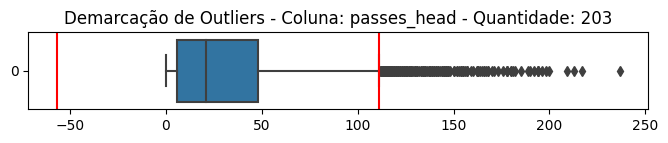



    OUTLIERS DA COLUNA throw_ins
Limite Inferior: -21.000 
Limite Superior: 35.000
Outliers da coluna "throw_ins": [36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 38.0, 38.0, 38.0, 38.0, 38.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 40.0, 40.0, 40.0, 40.0, 40.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 49.0, 49.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 

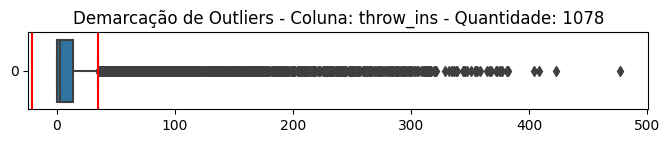



    OUTLIERS DA COLUNA passes_other_body
Limite Inferior: -6.500 
Limite Superior: 13.500
Outliers da coluna "passes_other_body": [14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.

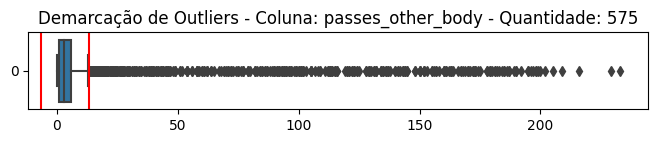



    OUTLIERS DA COLUNA passes_offsides
Limite Inferior: -6.000 
Limite Superior: 10.000
Outliers da coluna "passes_offsides": [11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 17.0, 18.0, 19.0, 19.0, 20.0, 21.0, 21.0, 21.0, 23.0, 34.0]


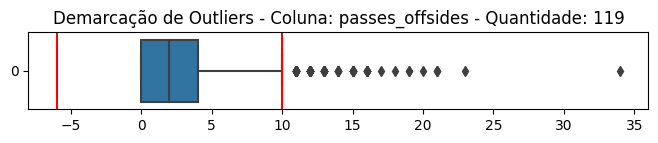



    OUTLIERS DA COLUNA passes_oob
Limite Inferior: -22.500 
Limite Superior: 45.500
Outliers da coluna "passes_oob": [46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 50.0, 50.0, 50.0, 50.0, 50.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 54.0, 54.0, 54.0, 55.0, 55.0, 55.0, 56.0, 56.0, 56.0, 56.0, 57.0, 57.0, 57.0, 57.0, 57.0, 58.0, 58.0, 58.0, 58.0, 58.0, 59.0, 59.0, 59.0, 59.0, 60.0, 60.0, 60.0, 60.0, 60.0, 61.0, 61.0, 61.0, 61.0, 62.0, 62.0, 62.0, 62.0, 63.0, 64.0, 64.0, 65.0, 66.0, 66.0, 66.0, 67.0, 67.0, 67.0, 70.0, 71.0, 73.0, 74.0, 76.0, 80.0, 81.0, 84.0, 87.0, 98.0]


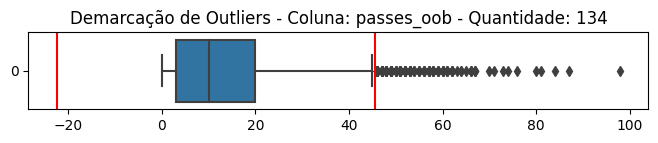



    OUTLIERS DA COLUNA passes_intercepted
Limite Inferior: -20.500 
Limite Superior: 39.500
Outliers da coluna "passes_intercepted": [40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 40.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 41.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 42.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 48.0, 48.0, 48.0, 48.0, 48.0, 49.0, 49.0, 49.0, 49.0, 49.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 51.0, 51.0, 51.0, 51.0, 51.0, 52.0, 52.0, 53.0, 53.0, 54.0, 54.0, 54.0, 55.0, 55.0, 55.0, 55.0, 55.0, 56.0, 56.0, 57.0, 59.0, 59.0, 60.0, 61.0, 61.0, 61.0, 62.0, 62.0, 62.0, 63.0, 64.0, 65.0, 66.0, 72.0, 90.0]


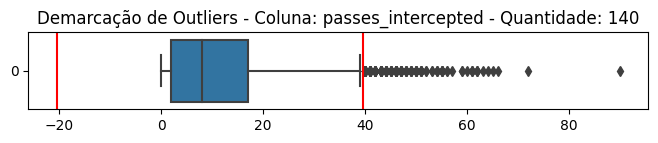



    OUTLIERS DA COLUNA passes_blocked
Limite Inferior: -31.500 
Limite Superior: 60.500
Outliers da coluna "passes_blocked": [61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 69.0, 69.0, 69.0, 69.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 73.0, 73.0, 73.0, 73.0, 73.0, 74.0, 74.0, 74.0, 74.0, 74.0, 74.0, 75.0, 75.0, 75.0, 75.0, 75.0, 76.0, 76.0, 77.0, 78.0, 78.0, 78.0, 78.0, 78.0, 78.0, 78.0, 79.0, 79.0, 79.0, 79.0, 79.0, 80.0, 80

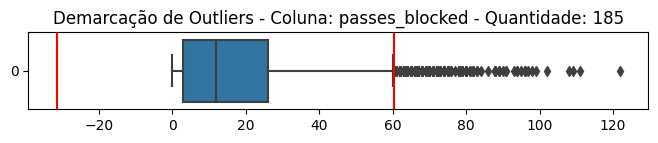



    OUTLIERS DA COLUNA sca
Limite Inferior: -50.000 
Limite Superior: 94.000
Outliers da coluna "sca": [95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 99.0, 99.0, 99.0, 99.0, 99.0, 100.0, 100.0, 100.0, 100.0, 100.0, 101.0, 101.0, 101.0, 101.0, 101.0, 101.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 103.0, 103.0, 103.0, 103.0, 103.0, 103.0, 104.0, 104.0, 104.0, 104.0, 104.0, 104.0, 104.0, 105.0, 105.0, 105.0, 105.0, 105.0, 105.0, 106.0, 106.0, 106.0, 106.0, 107.0, 107.0, 107.0, 107.0, 107.0, 107.0, 108.0, 108.0, 108.0, 108.0, 109.0, 109.0, 109.0, 109.0, 109.0, 109.0, 109.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 113.0, 114.0, 114.0, 114.0, 114.0, 114.0, 114.0, 115.0, 115.0, 115.0, 115.0, 116.0, 116.0, 116.0, 116.0,

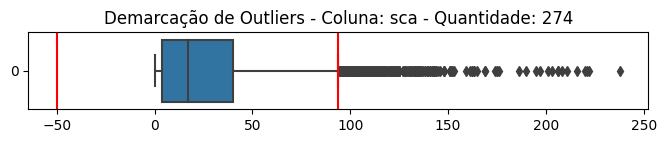



    OUTLIERS DA COLUNA sca_per90
Limite Inferior: -2.480 
Limite Superior: 5.760
Outliers da coluna "sca_per90": [5.78, 5.8, 5.82, 5.84, 5.84, 5.84, 5.87, 5.91, 5.92, 5.94, 5.96, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.02, 6.02, 6.08, 6.12, 6.13, 6.14, 6.17, 6.17, 6.2, 6.2, 6.2, 6.21, 6.29, 6.29, 6.31, 6.34, 6.4, 6.4, 6.43, 6.43, 6.43, 6.43, 6.43, 6.43, 6.43, 6.43, 6.44, 6.44, 6.47, 6.48, 6.49, 6.49, 6.52, 6.56, 6.58, 6.59, 6.69, 6.74, 6.81, 6.87, 6.92, 6.92, 6.92, 7.1, 7.15, 7.16, 7.2, 7.3, 7.33, 7.41, 7.42, 7.5, 7.5, 7.5, 7.5, 7.5, 7.63, 7.68, 7.83, 7.94, 7.94, 8.18, 8.28, 8.44, 8.44, 8.45, 8.57, 8.57, 8.57, 8.57, 8.71, 8.81, 9.0, 9.0, 9.1, 9.11, 9.37, 9.73, 10.0, 10.0, 10.0, 10.0, 10.0, 10.23, 11.25, 11.25, 11.25, 12.0, 12.0, 12.27, 12.27, 12.86, 12.86, 12.86, 12.86, 14.21, 14.21, 15.0, 15.0, 15.0, 16.36, 16.36, 18.0, 18.0, 22.5, 22.5, 30.0, 30.0, 33.75, 90.0]


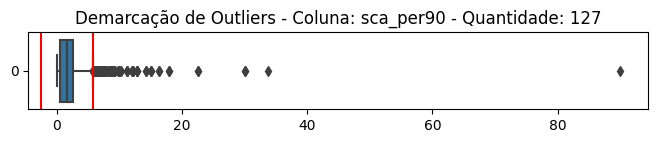



    OUTLIERS DA COLUNA sca_passes_live
Limite Inferior: -36.000 
Limite Superior: 68.000
Outliers da coluna "sca_passes_live": [69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 73.0, 73.0, 73.0, 73.0, 73.0, 73.0, 73.0, 73.0, 74.0, 74.0, 74.0, 74.0, 74.0, 74.0, 75.0, 75.0, 75.0, 75.0, 76.0, 76.0, 76.0, 76.0, 76.0, 76.0, 76.0, 76.0, 76.0, 76.0, 76.0, 77.0, 77.0, 77.0, 77.0, 77.0, 77.0, 77.0, 77.0, 77.0, 77.0, 77.0, 77.0, 78.0, 78.0, 78.0, 78.0, 78.0, 78.0, 78.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 84.0, 84.0, 84.0, 85.0, 85.0, 85.0, 85.0, 86.0, 86.0, 86.0, 86.0, 86.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 

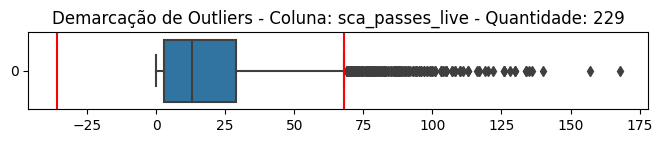



    OUTLIERS DA COLUNA sca_passes_dead
Limite Inferior: -3.000 
Limite Superior: 5.000
Outliers da coluna "sca_passes_dead": [6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.

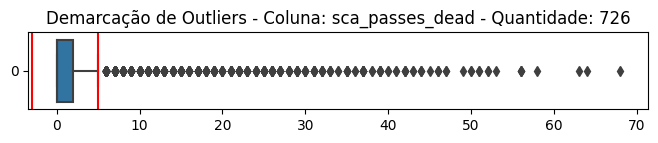



    OUTLIERS DA COLUNA sca_dribbles
Limite Inferior: -3.000 
Limite Superior: 5.000
Outliers da coluna "sca_dribbles": [6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0

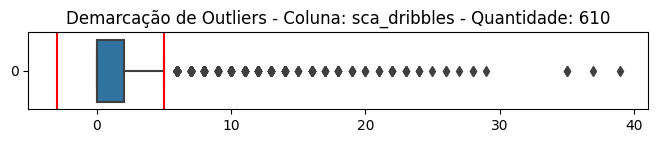



    OUTLIERS DA COLUNA sca_shots
Limite Inferior: -3.000 
Limite Superior: 5.000
Outliers da coluna "sca_shots": [6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0,

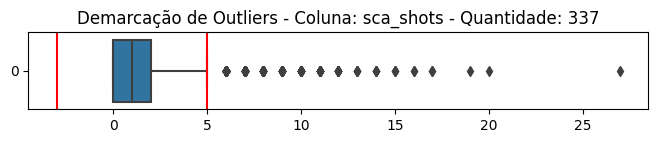



    OUTLIERS DA COLUNA sca_fouled
Limite Inferior: -3.000 
Limite Superior: 5.000
Outliers da coluna "sca_fouled": [6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.

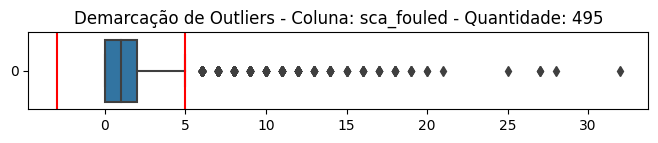



    OUTLIERS DA COLUNA gca
Limite Inferior: -6.000 
Limite Superior: 10.000
Outliers da coluna "gca": [11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 1

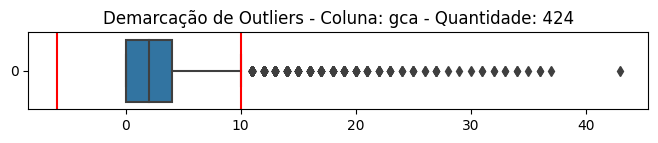



    OUTLIERS DA COLUNA gca_per90
Limite Inferior: -0.450 
Limite Superior: 0.750
Outliers da coluna "gca_per90": [0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.78, 0.78, 0.78, 0.78, 0.78, 0.79, 0.79, 0.79, 0.79, 0.79, 0.79, 0.79, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.81, 0.81, 0.81, 0.82, 0.82, 0.82, 0.82, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.84, 0.85, 0.85, 0.85, 0.85, 0.85, 0.86, 0.86, 0.87, 0.87, 0.87, 0.87, 0.88, 0.88, 0.88, 0.88, 0.88, 0.89, 0.89, 0.89, 0.89, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.91, 0.91, 0.92, 0.92, 0.93, 0.93, 0.94, 0.94, 0.94, 0.94, 0.94, 0.95, 0.95, 0.96, 0.96, 0.96, 0.97, 0.97, 0.98, 0.98, 0.98, 0.99, 0.99, 0.99, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.01, 1.01, 1.01, 1.02, 1.02, 1.03, 1.03, 1.03, 1.04, 1.04, 1.05, 1.06, 1.06, 1.06, 1.07, 1.07, 1.08, 1.1, 1.1, 1.1, 1.1, 1.12, 1.13, 1.13, 1.13, 1.13, 1.13, 1.14, 1.14, 1.15, 1.16, 1.16, 1.18, 1.18, 1.19, 1.19, 1.2, 1.2, 1.21, 1.22, 1.22

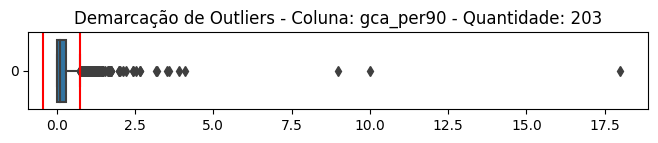



    OUTLIERS DA COLUNA gca_passes_live
Limite Inferior: -4.500 
Limite Superior: 7.500
Outliers da coluna "gca_passes_live": [8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.

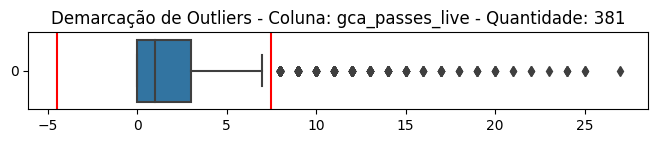



    OUTLIERS DA COLUNA gca_passes_dead
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "gca_passes_dead": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0

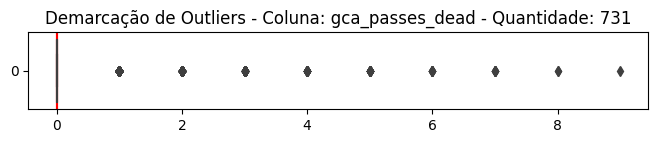



    OUTLIERS DA COLUNA gca_dribbles
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "gca_dribbles": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0,

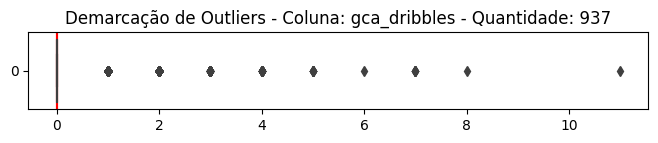



    OUTLIERS DA COLUNA gca_shots
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "gca_shots": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 

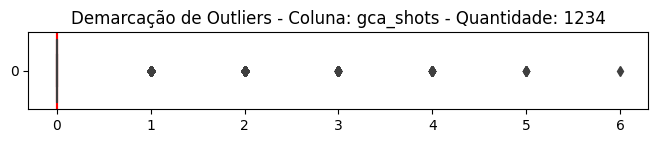



    OUTLIERS DA COLUNA gca_fouled
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "gca_fouled": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0

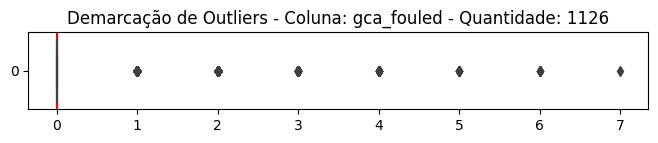



    OUTLIERS DA COLUNA gca_og_for
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "gca_og_for": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0

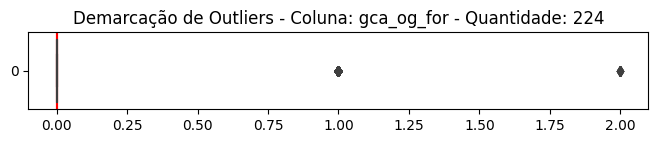



    OUTLIERS DA COLUNA tackles
Limite Inferior: -44.000 
Limite Superior: 84.000
Outliers da coluna "tackles": [85.0, 85.0, 85.0, 85.0, 86.0, 86.0, 86.0, 86.0, 86.0, 86.0, 86.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 88.0, 88.0, 88.0, 88.0, 89.0, 89.0, 89.0, 89.0, 89.0, 89.0, 89.0, 90.0, 90.0, 91.0, 91.0, 91.0, 91.0, 91.0, 91.0, 91.0, 92.0, 92.0, 93.0, 93.0, 93.0, 93.0, 93.0, 93.0, 93.0, 94.0, 94.0, 94.0, 95.0, 96.0, 96.0, 96.0, 96.0, 97.0, 97.0, 97.0, 98.0, 98.0, 98.0, 98.0, 99.0, 99.0, 100.0, 100.0, 101.0, 102.0, 102.0, 102.0, 103.0, 104.0, 104.0, 105.0, 105.0, 107.0, 108.0, 109.0, 110.0, 110.0, 111.0, 112.0, 113.0, 116.0, 116.0, 116.0, 118.0, 119.0, 122.0, 125.0, 129.0, 130.0, 134.0, 138.0, 160.0]


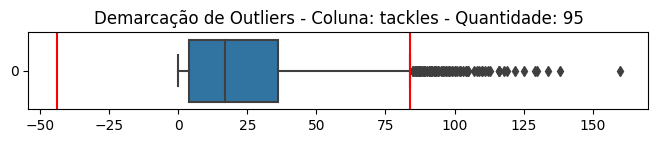



    OUTLIERS DA COLUNA tackles_won
Limite Inferior: -27.000 
Limite Superior: 53.000
Outliers da coluna "tackles_won": [54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 57.0, 57.0, 57.0, 57.0, 57.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 59.0, 59.0, 59.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 62.0, 62.0, 62.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 64.0, 65.0, 65.0, 65.0, 65.0, 65.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 67.0, 67.0, 67.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 69.0, 69.0, 70.0, 70.0, 70.0, 70.0, 70.0, 73.0, 74.0, 75.0, 76.0, 76.0, 77.0, 77.0, 80.0, 80.0, 82.0, 89.0, 89.0, 89.0, 109.0]


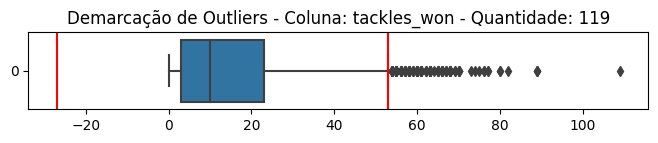



    OUTLIERS DA COLUNA tackles_def_3rd
Limite Inferior: -24.500 
Limite Superior: 43.500
Outliers da coluna "tackles_def_3rd": [44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 49.0, 49.0, 49.0, 49.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 52.0, 52.0, 52.0, 52.0, 53.0, 53.0, 53.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 55.0, 55.0, 55.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 57.0, 58.0, 58.0, 58.0, 58.0, 59.0, 59.0, 59.0, 59.0, 59.0, 60.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 62.0, 62.0, 62.0, 65.0, 67.0, 71.0, 74.0, 75.0, 82.0, 82.0, 98.0]


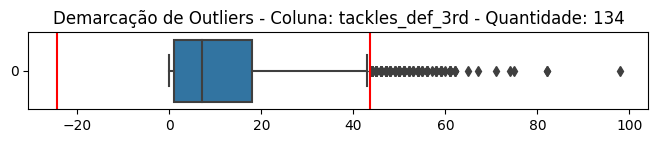



    OUTLIERS DA COLUNA tackles_mid_3rd
Limite Inferior: -17.000 
Limite Superior: 31.000
Outliers da coluna "tackles_mid_3rd": [32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 35.0, 35.0, 35.0, 35.0, 35.0, 35.0, 35.0, 35.0, 35.0, 35.0, 35.0, 35.0, 35.0, 35.0, 35.0, 35.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 38.0, 38.0, 38.0, 38.0, 38.0, 38.0, 38.0, 38.0, 38.0, 38.0, 38.0, 38.0, 38.0, 38.0, 38.0, 38.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 39.0, 40.0, 40.0, 40.0, 40.0, 40.0, 

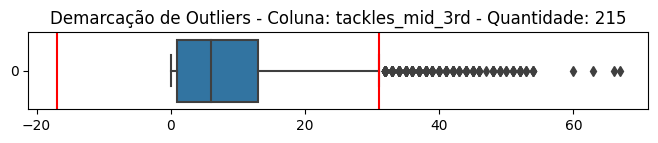



    OUTLIERS DA COLUNA tackles_att_3rd
Limite Inferior: -6.000 
Limite Superior: 10.000
Outliers da coluna "tackles_att_3rd": [11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 1

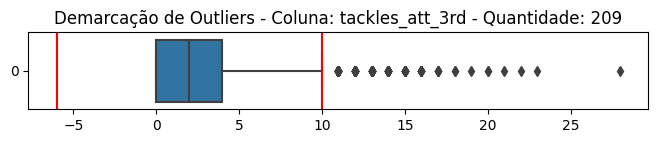



    OUTLIERS DA COLUNA dribble_tackles
Limite Inferior: -15.500 
Limite Superior: 28.500
Outliers da coluna "dribble_tackles": [29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 30.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 31.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 33.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 34.0, 35.0, 35.0, 35.0, 35.0, 35.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 

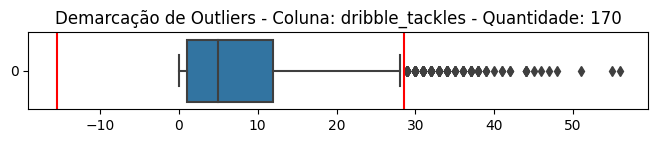



    OUTLIERS DA COLUNA dribbles_vs
Limite Inferior: -41.000 
Limite Superior: 79.000
Outliers da coluna "dribbles_vs": [80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 84.0, 84.0, 84.0, 84.0, 84.0, 85.0, 85.0, 85.0, 85.0, 85.0, 85.0, 86.0, 86.0, 86.0, 86.0, 86.0, 86.0, 86.0, 86.0, 87.0, 87.0, 87.0, 87.0, 87.0, 88.0, 88.0, 88.0, 88.0, 89.0, 89.0, 89.0, 89.0, 89.0, 89.0, 89.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 91.0, 91.0, 91.0, 91.0, 91.0, 91.0, 91.0, 91.0, 92.0, 93.0, 94.0, 94.0, 95.0, 95.0, 96.0, 96.0, 97.0, 97.0, 97.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 99.0, 99.0, 99.0, 99.0, 99.0, 100.0, 100.0, 100.0, 100.0, 100.0, 101.0, 102.0, 102.0, 103.0, 103.0, 103.0, 104.0, 105.0, 106.0, 106.0, 106.0, 107.0, 107.0, 107.0, 108.0, 108.0, 110.0, 110.0, 113.0, 113.0, 113.0, 114.0, 119.0, 121.

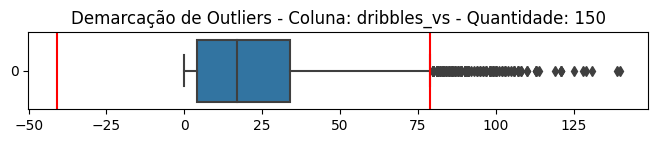



    OUTLIERS DA COLUNA dribble_tackles_pct
Limite Inferior: -31.900 
Limite Superior: 86.500
Outliers da coluna "dribble_tackles_pct": [87.5, 92.9, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]


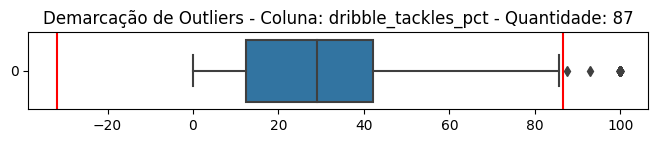



    OUTLIERS DA COLUNA dribbled_past
Limite Inferior: -25.500 
Limite Superior: 50.500
Outliers da coluna "dribbled_past": [51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 62.0, 62.0

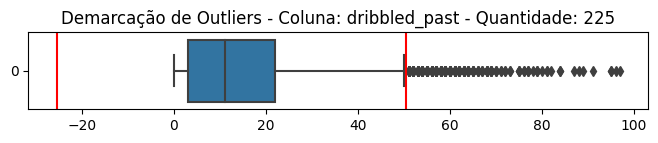



    OUTLIERS DA COLUNA pressures
Limite Inferior: -363.000 
Limite Superior: 741.000
Outliers da coluna "pressures": [743.0, 744.0, 746.0, 748.0, 748.0, 751.0, 752.0, 752.0, 753.0, 753.0, 754.0, 754.0, 755.0, 755.0, 756.0, 758.0, 759.0, 761.0, 762.0, 763.0, 764.0, 764.0, 766.0, 767.0, 770.0, 770.0, 775.0, 776.0, 777.0, 779.0, 781.0, 783.0, 783.0, 788.0, 789.0, 791.0, 791.0, 795.0, 798.0, 799.0, 799.0, 799.0, 800.0, 802.0, 806.0, 809.0, 809.0, 811.0, 813.0, 818.0, 819.0, 821.0, 831.0, 834.0, 841.0, 856.0, 858.0, 861.0, 869.0, 871.0, 873.0, 873.0, 897.0, 899.0, 920.0, 924.0, 925.0, 932.0, 932.0, 938.0, 938.0, 963.0, 985.0, 1001.0, 1018.0, 1018.0, 1056.0]


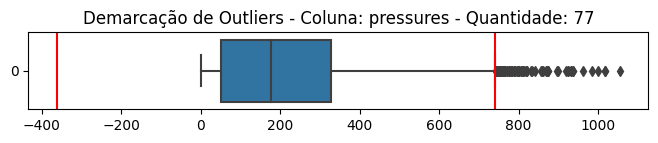



    OUTLIERS DA COLUNA pressure_regains
Limite Inferior: -103.000 
Limite Superior: 209.000
Outliers da coluna "pressure_regains": [210.0, 210.0, 211.0, 212.0, 213.0, 215.0, 216.0, 216.0, 217.0, 218.0, 218.0, 219.0, 219.0, 221.0, 221.0, 221.0, 221.0, 222.0, 222.0, 223.0, 225.0, 225.0, 228.0, 228.0, 229.0, 230.0, 232.0, 232.0, 232.0, 233.0, 235.0, 237.0, 238.0, 242.0, 243.0, 243.0, 244.0, 245.0, 247.0, 250.0, 253.0, 263.0, 266.0, 276.0, 281.0, 286.0, 292.0, 293.0, 294.0, 303.0]


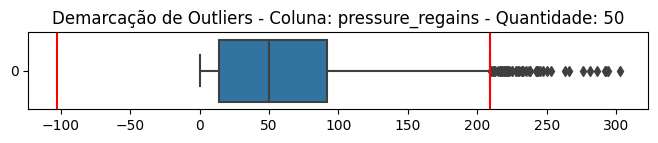



    OUTLIERS DA COLUNA pressure_regain_pct
Limite Inferior: 9.600 
Limite Superior: 44.800
Outliers da coluna "pressure_regain_pct": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

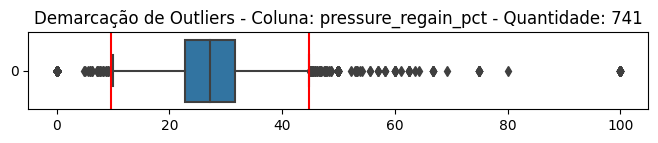



    OUTLIERS DA COLUNA pressures_def_3rd
Limite Inferior: -141.000 
Limite Superior: 267.000
Outliers da coluna "pressures_def_3rd": [268.0, 268.0, 269.0, 269.0, 271.0, 271.0, 272.0, 273.0, 274.0, 274.0, 275.0, 275.0, 275.0, 276.0, 277.0, 277.0, 278.0, 279.0, 281.0, 281.0, 281.0, 281.0, 282.0, 283.0, 285.0, 285.0, 286.0, 289.0, 289.0, 291.0, 291.0, 292.0, 293.0, 293.0, 296.0, 297.0, 297.0, 299.0, 299.0, 300.0, 306.0, 307.0, 308.0, 308.0, 309.0, 311.0, 315.0, 316.0, 316.0, 316.0, 319.0, 323.0, 328.0, 333.0, 337.0, 349.0, 351.0, 351.0, 352.0, 357.0, 364.0, 369.0, 375.0, 380.0, 382.0, 382.0, 395.0, 409.0, 411.0, 428.0, 525.0]


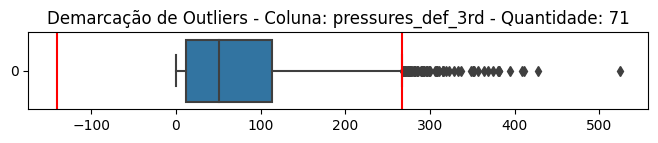



    OUTLIERS DA COLUNA pressures_mid_3rd
Limite Inferior: -170.000 
Limite Superior: 334.000
Outliers da coluna "pressures_mid_3rd": [335.0, 335.0, 335.0, 336.0, 336.0, 337.0, 337.0, 337.0, 337.0, 337.0, 338.0, 338.0, 338.0, 339.0, 339.0, 339.0, 340.0, 341.0, 342.0, 342.0, 342.0, 342.0, 343.0, 343.0, 343.0, 343.0, 344.0, 344.0, 345.0, 345.0, 346.0, 346.0, 347.0, 347.0, 347.0, 347.0, 347.0, 348.0, 348.0, 349.0, 350.0, 350.0, 350.0, 351.0, 351.0, 351.0, 351.0, 352.0, 353.0, 353.0, 353.0, 354.0, 355.0, 355.0, 355.0, 356.0, 357.0, 357.0, 357.0, 358.0, 359.0, 359.0, 359.0, 360.0, 361.0, 361.0, 362.0, 363.0, 363.0, 364.0, 364.0, 364.0, 364.0, 366.0, 366.0, 366.0, 367.0, 367.0, 367.0, 368.0, 368.0, 368.0, 368.0, 369.0, 370.0, 371.0, 371.0, 371.0, 372.0, 372.0, 373.0, 375.0, 376.0, 376.0, 377.0, 377.0, 377.0, 378.0, 380.0, 380.0, 381.0, 382.0, 383.0, 384.0, 385.0, 386.0, 386.0, 388.0, 389.0, 389.0, 389.0, 392.0, 393.0, 394.0, 394.0, 395.0, 395.0, 396.0, 398.0, 400.0, 401.0, 401.0, 401.0, 402

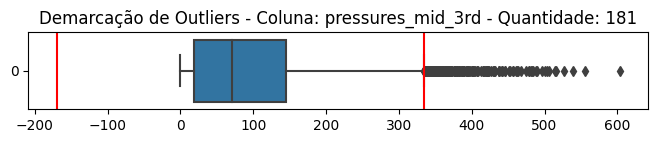



    OUTLIERS DA COLUNA pressures_att_3rd
Limite Inferior: -88.000 
Limite Superior: 160.000
Outliers da coluna "pressures_att_3rd": [161.0, 161.0, 161.0, 161.0, 162.0, 162.0, 162.0, 162.0, 163.0, 163.0, 163.0, 163.0, 164.0, 164.0, 164.0, 164.0, 164.0, 164.0, 164.0, 165.0, 165.0, 166.0, 166.0, 166.0, 166.0, 166.0, 166.0, 166.0, 166.0, 167.0, 167.0, 167.0, 167.0, 167.0, 167.0, 167.0, 168.0, 168.0, 168.0, 168.0, 168.0, 168.0, 168.0, 168.0, 168.0, 168.0, 169.0, 169.0, 169.0, 169.0, 169.0, 169.0, 170.0, 170.0, 170.0, 170.0, 170.0, 171.0, 171.0, 171.0, 171.0, 171.0, 171.0, 171.0, 172.0, 172.0, 172.0, 172.0, 172.0, 172.0, 173.0, 173.0, 173.0, 173.0, 173.0, 173.0, 173.0, 173.0, 173.0, 173.0, 174.0, 175.0, 175.0, 175.0, 175.0, 176.0, 176.0, 176.0, 176.0, 176.0, 176.0, 176.0, 177.0, 177.0, 177.0, 177.0, 178.0, 179.0, 179.0, 179.0, 179.0, 180.0, 180.0, 180.0, 181.0, 181.0, 181.0, 181.0, 182.0, 182.0, 182.0, 182.0, 182.0, 182.0, 182.0, 182.0, 183.0, 183.0, 183.0, 184.0, 184.0, 184.0, 184.0, 184.

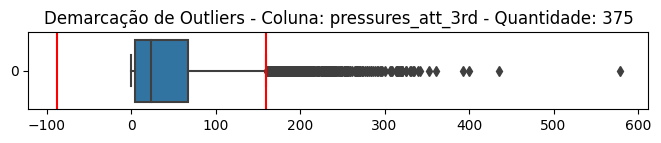



    OUTLIERS DA COLUNA blocks
Limite Inferior: -41.000 
Limite Superior: 79.000
Outliers da coluna "blocks": [80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 82.0, 82.0, 82.0, 82.0, 83.0, 83.0, 83.0, 84.0, 85.0, 85.0, 86.0, 86.0, 88.0, 88.0, 89.0, 90.0, 90.0, 90.0, 93.0, 93.0, 94.0, 95.0, 95.0, 95.0, 96.0, 96.0, 97.0, 99.0, 100.0, 100.0, 101.0, 102.0, 103.0, 103.0, 108.0, 125.0]


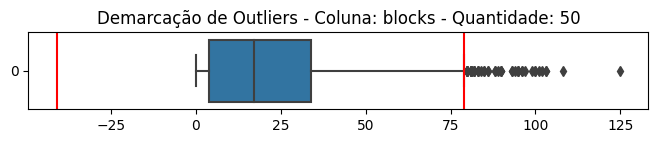



    OUTLIERS DA COLUNA blocked_shots
Limite Inferior: -9.000 
Limite Superior: 15.000
Outliers da coluna "blocked_shots": [16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0,

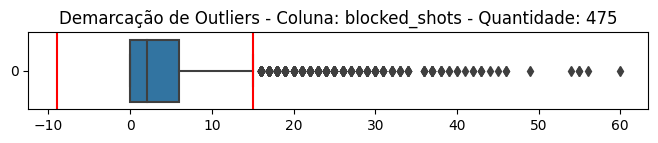



    OUTLIERS DA COLUNA blocked_shots_saves
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "blocked_shots_saves": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 

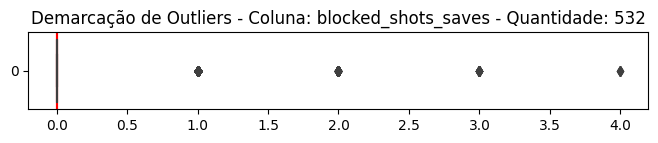



    OUTLIERS DA COLUNA blocked_passes
Limite Inferior: -33.000 
Limite Superior: 63.000
Outliers da coluna "blocked_passes": [64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 66.0, 66.0, 66.0, 66.0, 67.0, 67.0, 67.0, 67.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 69.0, 70.0, 70.0, 70.0, 70.0, 70.0, 71.0, 71.0, 71.0, 71.0, 71.0, 72.0, 72.0, 73.0, 73.0, 73.0, 73.0, 75.0, 75.0, 75.0, 76.0, 78.0, 79.0, 79.0, 80.0, 81.0, 81.0, 84.0, 84.0, 85.0, 85.0, 87.0, 87.0, 94.0, 97.0]


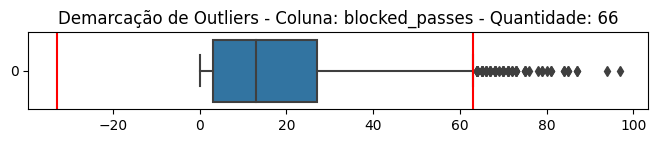



    OUTLIERS DA COLUNA interceptions
Limite Inferior: -22.000 
Limite Superior: 42.000
Outliers da coluna "interceptions": [43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 43.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 44.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 45.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 46.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 47.0, 48.0, 48.0, 48.0, 48.0, 48.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 54.0, 54.0, 54.0, 54.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 56.0, 57.0, 57.0, 57.0, 58.0, 58.0, 59.0, 59.0, 60.0, 60.0

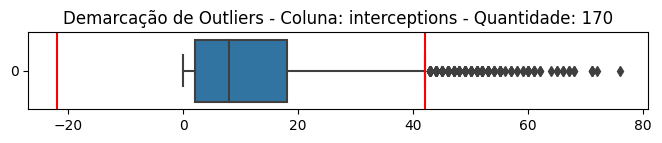



    OUTLIERS DA COLUNA clearances
Limite Inferior: -53.500 
Limite Superior: 94.500
Outliers da coluna "clearances": [95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 100.0, 100.0, 100.0, 100.0, 100.0, 101.0, 101.0, 101.0, 101.0, 101.0, 101.0, 101.0, 101.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 103.0, 103.0, 103.0, 103.0, 103.0, 103.0, 103.0, 103.0, 103.0, 103.0, 103.0, 104.0, 104.0, 104.0, 104.0, 104.0, 104.0, 105.0, 105.0, 105.0, 105.0, 105.0, 105.0, 105.0, 105.0, 105.0, 106.0, 106.0, 106.0, 106.0, 106.0, 106.0, 106.0, 106.0, 106.0, 107.0, 107.0, 107.0, 107.0, 107.0, 107.0, 107.0, 107.0, 107.0, 107.0, 108.0, 108.0, 108.0, 108.0, 108.0, 108.0, 108.0, 109.0, 109.0, 110.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0

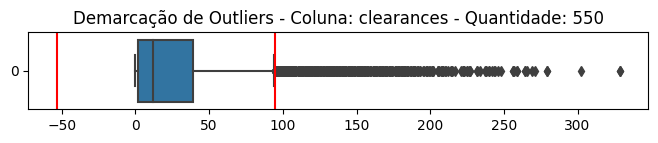



    OUTLIERS DA COLUNA errors
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "errors": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1

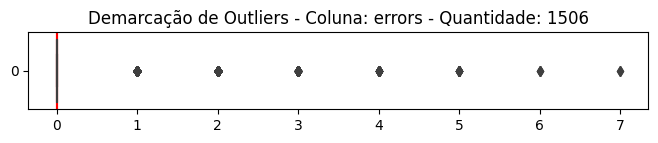



    OUTLIERS DA COLUNA touches
Limite Inferior: -1292.000 
Limite Superior: 2812.000
Outliers da coluna "touches": [2826.0, 2828.0, 2837.0, 2844.0, 2848.0, 2864.0, 2867.0, 2896.0, 2937.0, 2957.0, 2979.0, 2990.0, 2992.0, 2996.0, 3029.0, 3101.0, 3149.0, 3174.0, 3207.0, 3258.0, 3261.0, 3265.0, 3273.0, 3275.0, 3314.0, 3329.0, 3330.0, 3331.0, 3376.0, 3465.0, 3466.0, 3520.0]


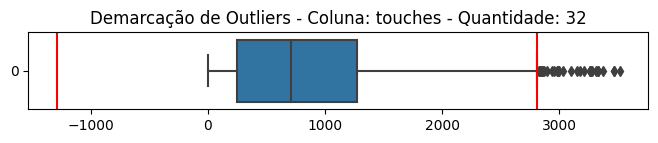



    OUTLIERS DA COLUNA touches_def_pen_area
Limite Inferior: -96.500 
Limite Superior: 179.500
Outliers da coluna "touches_def_pen_area": [180.0, 180.0, 180.0, 180.0, 181.0, 181.0, 181.0, 182.0, 182.0, 183.0, 183.0, 184.0, 184.0, 184.0, 185.0, 185.0, 185.0, 185.0, 185.0, 186.0, 186.0, 186.0, 187.0, 187.0, 187.0, 187.0, 187.0, 187.0, 188.0, 188.0, 188.0, 189.0, 189.0, 189.0, 189.0, 189.0, 190.0, 190.0, 190.0, 190.0, 191.0, 191.0, 192.0, 192.0, 192.0, 192.0, 193.0, 193.0, 193.0, 193.0, 194.0, 194.0, 194.0, 194.0, 194.0, 194.0, 195.0, 195.0, 196.0, 196.0, 197.0, 197.0, 197.0, 198.0, 198.0, 198.0, 199.0, 199.0, 199.0, 200.0, 200.0, 201.0, 201.0, 201.0, 201.0, 201.0, 201.0, 202.0, 202.0, 202.0, 202.0, 202.0, 202.0, 202.0, 202.0, 203.0, 203.0, 203.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 204.0, 205.0, 206.0, 206.0, 207.0, 207.0, 207.0, 207.0, 207.0, 207.0, 208.0, 208.0, 208.0, 209.0, 209.0, 209.0, 209.0, 210.0, 211.0, 211.0, 211.0, 212.0, 212.0, 212.0, 212.0, 213.0, 213.0, 214.0, 214.0

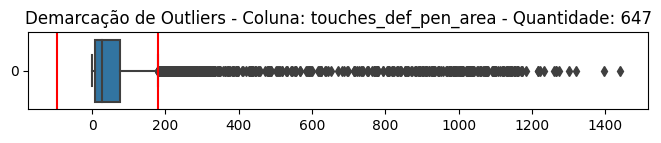



    OUTLIERS DA COLUNA touches_def_3rd
Limite Inferior: -467.500 
Limite Superior: 896.500
Outliers da coluna "touches_def_3rd": [898.0, 898.0, 898.0, 899.0, 899.0, 899.0, 902.0, 902.0, 903.0, 903.0, 903.0, 904.0, 907.0, 909.0, 912.0, 912.0, 915.0, 916.0, 917.0, 919.0, 919.0, 921.0, 921.0, 922.0, 923.0, 923.0, 923.0, 924.0, 927.0, 927.0, 928.0, 929.0, 930.0, 931.0, 932.0, 934.0, 935.0, 936.0, 936.0, 938.0, 938.0, 938.0, 938.0, 941.0, 941.0, 941.0, 944.0, 944.0, 944.0, 946.0, 946.0, 947.0, 947.0, 948.0, 950.0, 951.0, 951.0, 955.0, 956.0, 957.0, 957.0, 958.0, 959.0, 959.0, 960.0, 961.0, 961.0, 961.0, 962.0, 962.0, 966.0, 967.0, 967.0, 970.0, 970.0, 972.0, 972.0, 973.0, 974.0, 975.0, 975.0, 975.0, 976.0, 976.0, 976.0, 978.0, 979.0, 979.0, 980.0, 983.0, 984.0, 985.0, 985.0, 988.0, 990.0, 990.0, 991.0, 993.0, 994.0, 995.0, 995.0, 995.0, 997.0, 998.0, 998.0, 999.0, 1000.0, 1000.0, 1001.0, 1003.0, 1005.0, 1005.0, 1007.0, 1009.0, 1009.0, 1011.0, 1013.0, 1016.0, 1018.0, 1020.0, 1023.0, 1024.0

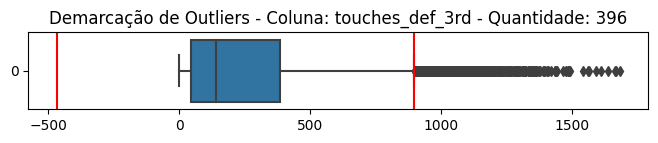



    OUTLIERS DA COLUNA touches_mid_3rd
Limite Inferior: -729.000 
Limite Superior: 1431.000
Outliers da coluna "touches_mid_3rd": [1441.0, 1441.0, 1442.0, 1445.0, 1445.0, 1447.0, 1449.0, 1454.0, 1455.0, 1465.0, 1468.0, 1476.0, 1486.0, 1489.0, 1494.0, 1494.0, 1497.0, 1503.0, 1504.0, 1506.0, 1507.0, 1514.0, 1519.0, 1523.0, 1523.0, 1524.0, 1525.0, 1526.0, 1531.0, 1534.0, 1538.0, 1538.0, 1543.0, 1549.0, 1550.0, 1552.0, 1560.0, 1561.0, 1562.0, 1574.0, 1575.0, 1576.0, 1584.0, 1587.0, 1587.0, 1590.0, 1591.0, 1597.0, 1597.0, 1604.0, 1609.0, 1611.0, 1612.0, 1618.0, 1619.0, 1624.0, 1626.0, 1629.0, 1632.0, 1633.0, 1641.0, 1662.0, 1663.0, 1698.0, 1708.0, 1709.0, 1712.0, 1730.0, 1739.0, 1749.0, 1755.0, 1759.0, 1761.0, 1771.0, 1792.0, 1798.0, 1810.0, 1834.0, 1885.0, 1900.0, 1907.0, 1935.0, 2083.0, 2086.0, 2099.0, 2110.0, 2148.0, 2150.0, 2395.0]


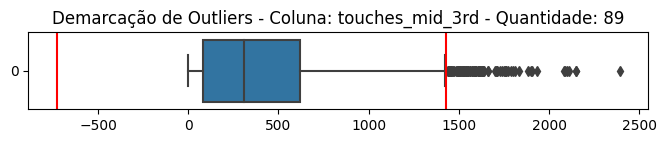



    OUTLIERS DA COLUNA touches_att_3rd
Limite Inferior: -433.000 
Limite Superior: 799.000
Outliers da coluna "touches_att_3rd": [802.0, 804.0, 805.0, 805.0, 806.0, 806.0, 806.0, 807.0, 808.0, 809.0, 809.0, 811.0, 812.0, 812.0, 813.0, 814.0, 815.0, 818.0, 819.0, 819.0, 820.0, 825.0, 825.0, 826.0, 826.0, 829.0, 829.0, 830.0, 831.0, 831.0, 831.0, 836.0, 838.0, 839.0, 840.0, 840.0, 841.0, 843.0, 843.0, 843.0, 845.0, 846.0, 846.0, 847.0, 847.0, 848.0, 848.0, 849.0, 852.0, 852.0, 853.0, 854.0, 859.0, 861.0, 862.0, 862.0, 865.0, 867.0, 868.0, 869.0, 870.0, 871.0, 873.0, 874.0, 876.0, 876.0, 876.0, 876.0, 876.0, 878.0, 878.0, 880.0, 881.0, 885.0, 887.0, 895.0, 895.0, 898.0, 901.0, 903.0, 904.0, 904.0, 909.0, 909.0, 909.0, 911.0, 917.0, 918.0, 920.0, 920.0, 923.0, 924.0, 924.0, 928.0, 930.0, 931.0, 931.0, 932.0, 932.0, 933.0, 937.0, 941.0, 945.0, 946.0, 946.0, 947.0, 952.0, 952.0, 953.0, 959.0, 960.0, 961.0, 962.0, 967.0, 969.0, 970.0, 970.0, 970.0, 970.0, 977.0, 979.0, 981.0, 982.0, 982.0, 

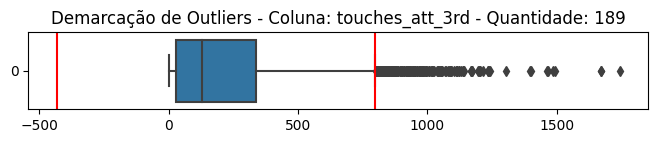



    OUTLIERS DA COLUNA touches_att_pen_area
Limite Inferior: -50.000 
Limite Superior: 94.000
Outliers da coluna "touches_att_pen_area": [95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 96.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 101.0, 101.0, 101.0, 101.0, 101.0, 101.0, 101.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 103.0, 103.0, 103.0, 103.0, 103.0, 103.0, 103.0, 103.0, 103.0, 103.0, 103.0, 104.0, 104.0, 104.0, 104.0, 104.0, 104.0, 104.0, 104.0, 104.0, 104.0, 104.0, 105.0, 105.0, 105.0, 106.0, 106.0, 106.0, 106.0, 106.0, 106.0, 106.0, 106.0, 106.0, 107.0, 107.0, 107.0, 107.0, 107.0, 107.0, 107.0, 107.0, 107.0, 108.0, 108.0, 108.0, 108.0, 108.0, 108.0, 108.0, 108.0, 108.0, 109.0, 109.0, 

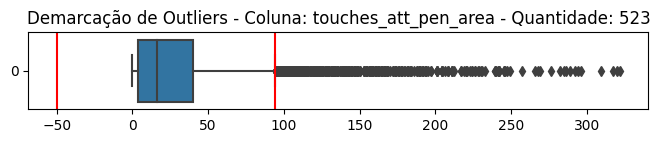



    OUTLIERS DA COLUNA touches_live_ball
Limite Inferior: -1187.000 
Limite Superior: 2589.000
Outliers da coluna "touches_live_ball": [2591.0, 2605.0, 2632.0, 2640.0, 2643.0, 2653.0, 2671.0, 2675.0, 2676.0, 2687.0, 2701.0, 2701.0, 2732.0, 2737.0, 2742.0, 2743.0, 2754.0, 2754.0, 2756.0, 2770.0, 2779.0, 2797.0, 2799.0, 2812.0, 2836.0, 2865.0, 2878.0, 2879.0, 2891.0, 2904.0, 2909.0, 2944.0, 3072.0, 3089.0, 3163.0, 3203.0, 3226.0, 3290.0, 3291.0, 3320.0, 3382.0, 3393.0]


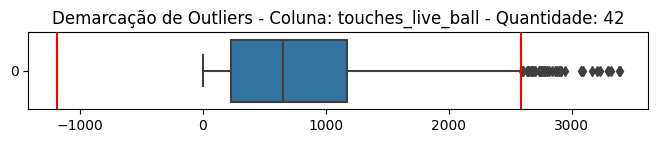



    OUTLIERS DA COLUNA dribbles_completed
Limite Inferior: -25.000 
Limite Superior: 47.000
Outliers da coluna "dribbles_completed": [48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 49.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 

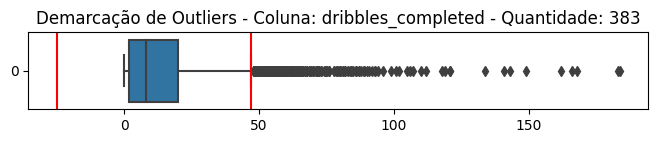



    OUTLIERS DA COLUNA dribbles
Limite Inferior: -42.000 
Limite Superior: 78.000
Outliers da coluna "dribbles": [79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 80.0, 81.0, 81.0, 81.0, 81.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 83.0, 84.0, 84.0, 84.0, 84.0, 84.0, 84.0, 84.0, 84.0, 84.0, 84.0, 84.0, 84.0, 85.0, 85.0, 85.0, 85.0, 85.0, 85.0, 85.0, 85.0, 85.0, 85.0, 86.0, 86.0, 86.0, 86.0, 86.0, 86.0, 86.0, 86.0, 86.0, 86.0, 86.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 87.0, 88.0, 88.0, 88.0, 88.0, 88.0, 88.0, 88.0, 88.0, 88.0, 88.0, 88.0, 89.0, 89.0, 89.0, 89.0, 89.0, 89.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 91.0, 91.0, 91.0, 91.0, 91.0, 91.0, 91.0, 91.0, 91.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 93.0, 93.0, 93.0, 93.0, 93.0, 93.0, 93.0, 93.0, 93

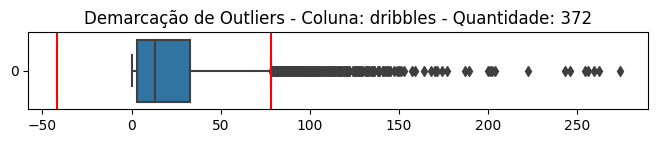



    OUTLIERS DA COLUNA dribbles_completed_pct
Limite Inferior: 3.800 
Limite Superior: 115.000
Outliers da coluna "dribbles_completed_pct": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.

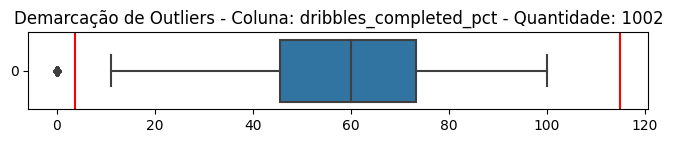



    OUTLIERS DA COLUNA players_dribbled_past
Limite Inferior: -26.500 
Limite Superior: 49.500
Outliers da coluna "players_dribbled_past": [50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 51.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 52.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 53.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 54.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 59.0, 59.0, 

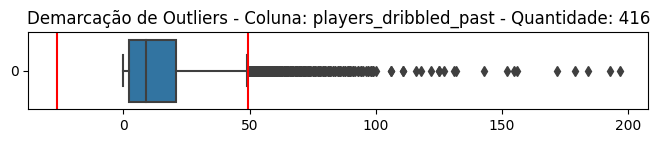



    OUTLIERS DA COLUNA nutmegs
Limite Inferior: -1.500 
Limite Superior: 2.500
Outliers da coluna "nutmegs": [3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0

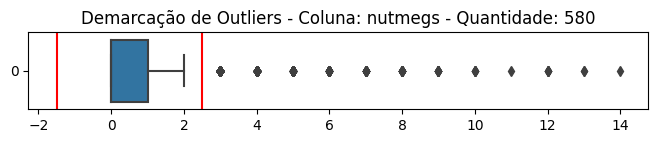



    OUTLIERS DA COLUNA carries
Limite Inferior: -830.000 
Limite Superior: 1802.000
Outliers da coluna "carries": [1807.0, 1808.0, 1811.0, 1813.0, 1815.0, 1815.0, 1816.0, 1822.0, 1825.0, 1830.0, 1830.0, 1832.0, 1833.0, 1834.0, 1844.0, 1846.0, 1854.0, 1856.0, 1857.0, 1861.0, 1880.0, 1881.0, 1885.0, 1892.0, 1897.0, 1898.0, 1898.0, 1900.0, 1902.0, 1902.0, 1905.0, 1905.0, 1910.0, 1912.0, 1915.0, 1915.0, 1927.0, 1940.0, 1947.0, 1960.0, 1964.0, 1986.0, 1987.0, 2001.0, 2020.0, 2021.0, 2026.0, 2044.0, 2048.0, 2049.0, 2052.0, 2054.0, 2067.0, 2069.0, 2071.0, 2072.0, 2072.0, 2076.0, 2083.0, 2084.0, 2087.0, 2102.0, 2108.0, 2114.0, 2115.0, 2135.0, 2150.0, 2155.0, 2160.0, 2164.0, 2174.0, 2185.0, 2193.0, 2197.0, 2206.0, 2226.0, 2226.0, 2321.0, 2335.0, 2342.0, 2346.0, 2414.0, 2438.0, 2446.0, 2490.0, 2511.0, 2546.0, 2617.0]


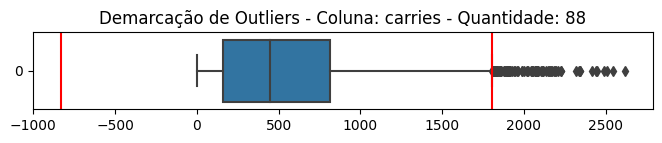



    OUTLIERS DA COLUNA carry_distance
Limite Inferior: -4993.000 
Limite Superior: 10655.000
Outliers da coluna "carry_distance": [10666.0, 10667.0, 10670.0, 10756.0, 10766.0, 10773.0, 10776.0, 10778.0, 10798.0, 10809.0, 10821.0, 10823.0, 10824.0, 10857.0, 10882.0, 10903.0, 10930.0, 10932.0, 10940.0, 10941.0, 10955.0, 10976.0, 11000.0, 11093.0, 11111.0, 11116.0, 11135.0, 11135.0, 11137.0, 11140.0, 11271.0, 11288.0, 11289.0, 11291.0, 11352.0, 11358.0, 11396.0, 11397.0, 11406.0, 11453.0, 11512.0, 11551.0, 11562.0, 11564.0, 11575.0, 11595.0, 11600.0, 11607.0, 11609.0, 11629.0, 11674.0, 11707.0, 11730.0, 11737.0, 11817.0, 11820.0, 11887.0, 11906.0, 11978.0, 11984.0, 12005.0, 12046.0, 12109.0, 12241.0, 12280.0, 12307.0, 12336.0, 12360.0, 12365.0, 12387.0, 12430.0, 12614.0, 12639.0, 12731.0, 12775.0, 12997.0, 13037.0, 13067.0, 13072.0, 13109.0, 13142.0, 13236.0, 13275.0, 13307.0, 13325.0, 13355.0, 13357.0, 13428.0, 13521.0, 13593.0, 13605.0, 13874.0, 13997.0, 14275.0, 14294.0, 14329.0, 143

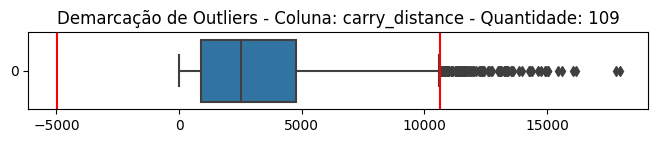



    OUTLIERS DA COLUNA carry_progressive_distance
Limite Inferior: -2770.000 
Limite Superior: 5774.000
Outliers da coluna "carry_progressive_distance": [5804.0, 5835.0, 5837.0, 5842.0, 5850.0, 5857.0, 5858.0, 5859.0, 5859.0, 5872.0, 5877.0, 5878.0, 5882.0, 5883.0, 5891.0, 5906.0, 5916.0, 5917.0, 5923.0, 5924.0, 5933.0, 5940.0, 5945.0, 5948.0, 5950.0, 5961.0, 5973.0, 5978.0, 5980.0, 5996.0, 6000.0, 6001.0, 6005.0, 6026.0, 6031.0, 6037.0, 6042.0, 6052.0, 6067.0, 6084.0, 6088.0, 6114.0, 6141.0, 6143.0, 6144.0, 6172.0, 6222.0, 6225.0, 6229.0, 6232.0, 6255.0, 6263.0, 6263.0, 6315.0, 6316.0, 6340.0, 6341.0, 6360.0, 6361.0, 6368.0, 6394.0, 6456.0, 6459.0, 6466.0, 6466.0, 6510.0, 6511.0, 6525.0, 6553.0, 6558.0, 6597.0, 6616.0, 6625.0, 6630.0, 6705.0, 6720.0, 6731.0, 6762.0, 6763.0, 6780.0, 6781.0, 6799.0, 6866.0, 6893.0, 6920.0, 6935.0, 6936.0, 6937.0, 6943.0, 7010.0, 7022.0, 7026.0, 7060.0, 7073.0, 7081.0, 7083.0, 7107.0, 7108.0, 7138.0, 7162.0, 7182.0, 7216.0, 7235.0, 7290.0, 7331.0, 7353

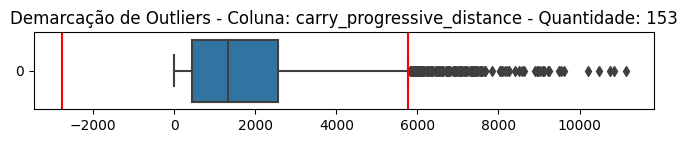



    OUTLIERS DA COLUNA pass_targets
Limite Inferior: -954.000 
Limite Superior: 2086.000
Outliers da coluna "pass_targets": [2095.0, 2099.0, 2102.0, 2107.0, 2111.0, 2112.0, 2124.0, 2125.0, 2128.0, 2129.0, 2138.0, 2150.0, 2155.0, 2159.0, 2160.0, 2171.0, 2176.0, 2180.0, 2184.0, 2187.0, 2199.0, 2207.0, 2209.0, 2211.0, 2231.0, 2254.0, 2258.0, 2259.0, 2266.0, 2271.0, 2307.0, 2322.0, 2328.0, 2341.0, 2341.0, 2345.0, 2359.0, 2363.0, 2379.0, 2437.0, 2438.0, 2441.0, 2445.0, 2474.0, 2479.0, 2486.0, 2517.0, 2547.0, 2568.0, 2579.0, 2616.0, 2647.0, 2711.0, 2749.0, 2936.0, 3096.0]


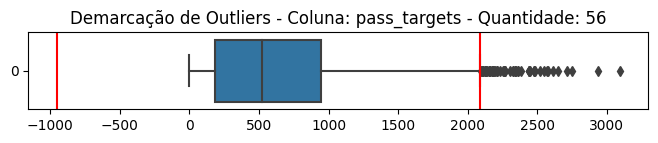



    OUTLIERS DA COLUNA passes_received
Limite Inferior: -820.000 
Limite Superior: 1772.000
Outliers da coluna "passes_received": [1773.0, 1774.0, 1777.0, 1780.0, 1788.0, 1789.0, 1791.0, 1792.0, 1798.0, 1800.0, 1806.0, 1807.0, 1807.0, 1810.0, 1810.0, 1822.0, 1824.0, 1825.0, 1829.0, 1834.0, 1834.0, 1838.0, 1842.0, 1846.0, 1851.0, 1854.0, 1855.0, 1865.0, 1865.0, 1867.0, 1871.0, 1878.0, 1885.0, 1889.0, 1892.0, 1896.0, 1897.0, 1899.0, 1907.0, 1911.0, 1915.0, 1918.0, 1929.0, 1932.0, 1943.0, 1943.0, 1949.0, 1951.0, 1954.0, 1956.0, 1970.0, 1970.0, 1977.0, 1985.0, 2000.0, 2009.0, 2030.0, 2031.0, 2043.0, 2046.0, 2046.0, 2051.0, 2068.0, 2069.0, 2071.0, 2075.0, 2079.0, 2082.0, 2089.0, 2095.0, 2108.0, 2128.0, 2132.0, 2143.0, 2144.0, 2155.0, 2160.0, 2160.0, 2171.0, 2174.0, 2182.0, 2191.0, 2208.0, 2229.0, 2230.0, 2237.0, 2276.0, 2282.0, 2353.0, 2408.0, 2410.0, 2488.0, 2497.0, 2514.0, 2570.0, 2602.0, 2612.0, 2617.0, 2833.0]


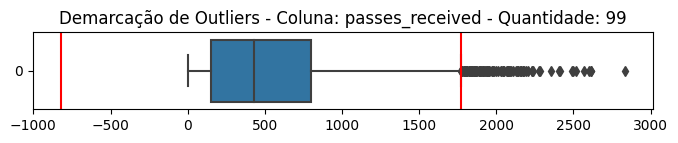



    OUTLIERS DA COLUNA passes_received_pct
Limite Inferior: 46.650 
Limite Superior: 126.250
Outliers da coluna "passes_received_pct": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 11.1, 16.7, 21.4, 24.1, 25.0, 25.0, 25.0, 25.7, 28.6, 31.0, 32.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.8, 35.3, 35.3, 36.4, 36.4, 37.7, 39.1, 39.4, 39.8, 39.8, 40.0, 40.1, 40.2, 40.3, 40.5, 40.7, 40.8, 41.1, 41.1, 41.3, 41.4, 41.4, 41.9, 42.1, 42.2, 42.2, 42.3, 42.7, 42.9, 42.9, 43.1, 43.1, 43.2, 43.3, 43.4, 43.4, 43.5, 43.6, 43.7, 43.8, 43.8, 43.9, 43.9, 44.1, 44.1, 44.2, 44.2, 44.3, 44.4, 44.4, 44.4, 44.5, 44.5, 44.5, 44.7, 44.8, 44.8, 44.8, 45.0, 45.1, 45.2, 45.2, 45.2, 45.3, 45.4, 45.7, 45.8, 45.8, 45.9, 45.9, 45.9, 45.9, 45.9, 46.0, 46.0, 46.0, 46.0, 46.1, 46.2, 46.2, 46.2, 46.4, 46.4, 46.5, 46.5, 46.5, 46.5]


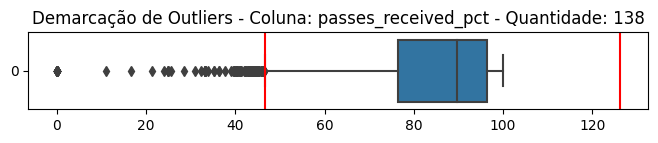



    OUTLIERS DA COLUNA miscontrols
Limite Inferior: -32.500 
Limite Superior: 59.500
Outliers da coluna "miscontrols": [60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 70.0, 70.0, 70

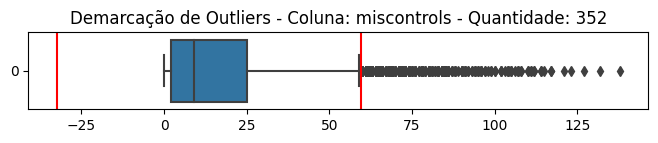



    OUTLIERS DA COLUNA dispossessed
Limite Inferior: -29.500 
Limite Superior: 54.500
Outliers da coluna "dispossessed": [55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 55.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 66.0, 66.0, 66.0, 66.0, 66.0, 67.0, 67.0, 

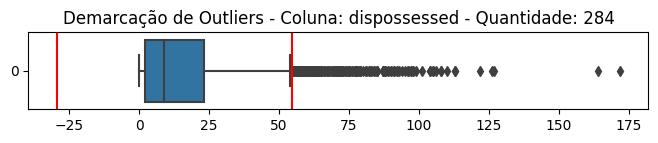



    OUTLIERS DA COLUNA cards_yellow_red
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "cards_yellow_red": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1

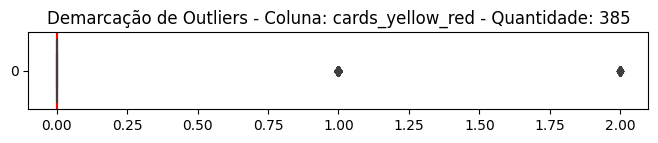



    OUTLIERS DA COLUNA fouls
Limite Inferior: -29.000 
Limite Superior: 59.000
Outliers da coluna "fouls": [60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 64.0, 64.0, 64.0, 64.0, 65.0, 65.0, 65.0, 65.0, 66.0, 66.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 68.0, 68.0, 68.0, 68.0, 69.0, 69.0, 69.0, 69.0, 69.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 72.0, 72.0, 72.0, 73.0, 73.0, 74.0, 76.0, 76.0, 76.0, 77.0, 78.0, 78.0, 78.0, 79.0, 79.0, 79.0, 80.0, 81.0, 81.0, 83.0, 85.0, 87.0, 87.0, 89.0, 91.0, 91.0]


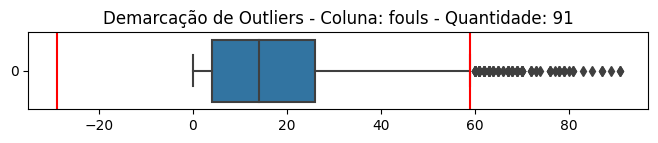



    OUTLIERS DA COLUNA fouled
Limite Inferior: -28.500 
Limite Superior: 55.500
Outliers da coluna "fouled": [56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 56.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 57.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 58.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 59.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 69.0, 69.0, 69.0, 69.0, 69.0, 70.0, 70.0, 70.0, 70.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 71.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 73.0, 

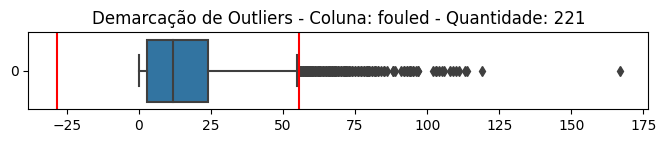



    OUTLIERS DA COLUNA offsides
Limite Inferior: -4.500 
Limite Superior: 7.500
Outliers da coluna "offsides": [8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 1

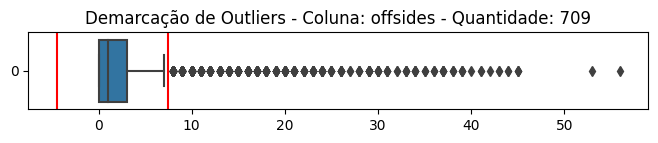



    OUTLIERS DA COLUNA pens_won
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_won": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.

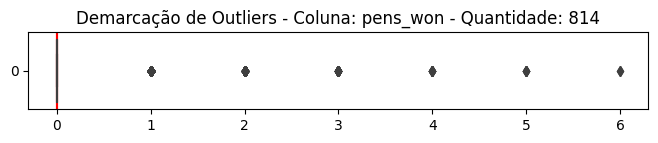



    OUTLIERS DA COLUNA pens_conceded
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_conceded": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.

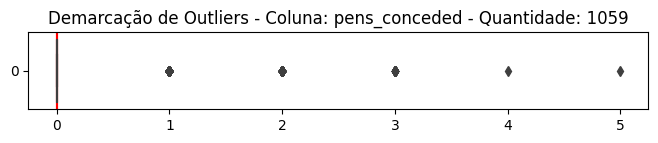



    OUTLIERS DA COLUNA own_goals
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "own_goals": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 

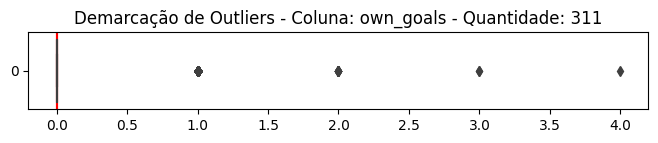



    OUTLIERS DA COLUNA ball_recoveries
Limite Inferior: -202.000 
Limite Superior: 430.000
Outliers da coluna "ball_recoveries": [431.0, 432.0, 434.0, 434.0, 436.0, 437.0, 437.0, 437.0, 437.0, 437.0, 437.0, 438.0, 442.0, 443.0, 445.0, 445.0, 446.0, 446.0, 447.0, 447.0, 448.0, 449.0, 449.0, 451.0, 452.0, 452.0, 455.0, 455.0, 456.0, 458.0, 460.0, 461.0, 462.0, 464.0, 465.0, 465.0, 465.0, 466.0, 473.0, 473.0, 474.0, 476.0, 478.0, 479.0, 485.0, 486.0, 490.0, 490.0, 490.0, 494.0, 496.0, 500.0, 502.0, 503.0, 505.0, 511.0, 511.0, 513.0, 513.0, 517.0, 519.0, 520.0, 528.0, 536.0, 556.0, 579.0, 597.0]


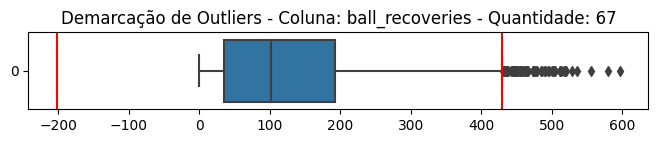



    OUTLIERS DA COLUNA aerials_won
Limite Inferior: -32.500 
Limite Superior: 59.500
Outliers da coluna "aerials_won": [60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 61.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 62.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 63.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 69.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70

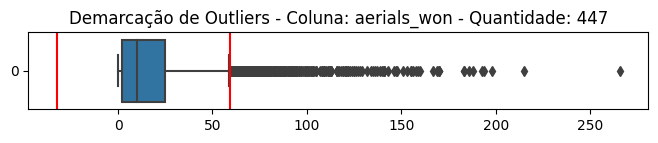



    OUTLIERS DA COLUNA aerials_lost
Limite Inferior: -33.000 
Limite Superior: 63.000
Outliers da coluna "aerials_lost": [64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 64.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 65.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 66.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 69.0, 69.0, 69.0, 69.0, 69.0, 70.0, 70.0, 71.0, 71.0, 71.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 73.0, 73.0, 73.0, 73.0, 73.0, 74.0, 74.0, 74.0, 74.0, 75.0, 75.0, 75.0, 75.0, 75.0, 75.0, 76.0, 76.0, 76.0, 76.0, 76.0, 77.0, 77.0, 77.0, 77.0, 77.0, 77.0, 77.0, 77.0, 77.0, 77.0, 78.0, 78.0, 78.0, 78.0, 78.0, 78.0, 78.0, 79.0, 79.0, 79.0, 79.0, 79.0, 80.0, 80.0, 80.0, 81.0, 81.0, 81.0, 81.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 83.0, 83.0, 83.0, 83.0, 84.0, 84.0, 84.0, 84.0, 84.0, 84.0, 84.0, 85.0, 85.0, 85.0, 85.0, 85.0, 86.0, 86.0, 86.0, 86.0, 86.0, 86.0, 86.0, 87.0, 87.0, 87.0, 

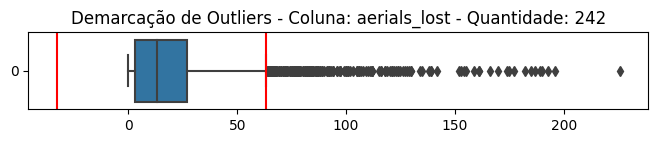



    OUTLIERS DA COLUNA aerials_won_pct
Limite Inferior: -23.150 
Limite Superior: 105.250
Outliers da coluna "aerials_won_pct": []


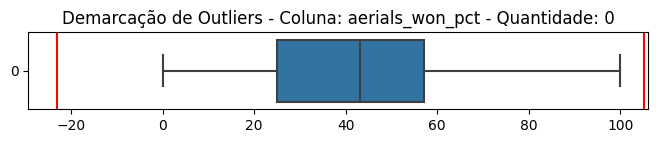



    OUTLIERS DA COLUNA games_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "games_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.

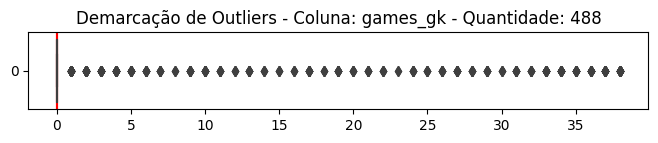



    OUTLIERS DA COLUNA games_starts_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "games_starts_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0

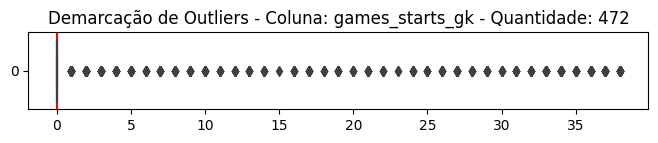



    OUTLIERS DA COLUNA minutes_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "minutes_gk": [1.0, 5.0, 6.0, 8.0, 11.0, 19.0, 21.0, 25.0, 28.0, 37.0, 39.0, 45.0, 45.0, 60.0, 69.0, 71.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 104.0, 121.0, 122.0, 135.0, 135.0, 149.0, 151.0, 159.0, 164.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 180.0, 196.0, 202.0, 225.0, 225.0, 225.0, 226.0, 250.0, 256.0, 270.0, 270.0, 270.0, 270.0, 270.0, 270.0, 270.0, 270.0, 270.0, 270.0, 270.0, 270.0, 270.0, 270.0, 270.0, 270.0, 270.0, 270.0, 272.0, 275.0, 279.0, 280.0, 290.0, 305.0, 305.0, 308.0, 315.0, 316.0, 328.0, 347.0, 360.0, 360.0, 360.0,

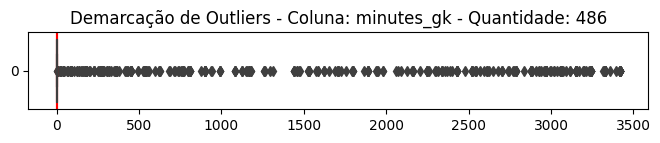



    OUTLIERS DA COLUNA goals_against_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "goals_against_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0

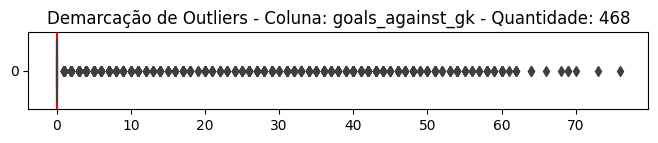



    OUTLIERS DA COLUNA goals_against_per90_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "goals_against_per90_gk": [0.25, 0.31, 0.4, 0.5, 0.5, 0.5, 0.55, 0.55, 0.58, 0.58, 0.59, 0.59, 0.61, 0.67, 0.67, 0.67, 0.67, 0.67, 0.67, 0.68, 0.7, 0.71, 0.72, 0.72, 0.72, 0.73, 0.73, 0.73, 0.74, 0.74, 0.75, 0.76, 0.76, 0.76, 0.78, 0.78, 0.79, 0.79, 0.8, 0.8, 0.8, 0.81, 0.81, 0.82, 0.83, 0.86, 0.86, 0.86, 0.87, 0.87, 0.87, 0.89, 0.89, 0.9, 0.9, 0.91, 0.91, 0.92, 0.92, 0.93, 0.94, 0.94, 0.95, 0.95, 0.96, 0.96, 0.97, 0.97, 0.97, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.01, 1.02, 1.02, 1.03, 1.03, 1.04, 1.05, 1.05, 1.05, 1.06, 1.06, 1.07, 1.07, 1.07, 1.08, 1.08, 1.08, 1.09, 1.1, 1.1, 1.1, 1.11, 1.11, 1.11, 1.11, 1.11, 1.11, 1.11, 1.12, 1.12, 1.13, 1.14, 1.14, 1.14, 1.15, 1.15, 1.17, 1.17, 1.18, 1.18, 1.18, 1.18, 1.19, 1.2, 1.2, 1.2, 1.2, 1.21, 1.21, 1.2

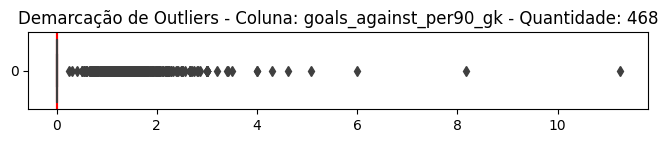



    OUTLIERS DA COLUNA shots_on_target_against
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "shots_on_target_against": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 9.0, 9.0, 9.0, 9.0, 9.0, 10.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 14.0, 14.0, 14.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 16.0, 16.0, 16.0, 16.0, 16.0, 17.0, 17.0, 17.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 19.0, 20.0, 20.0, 20.0, 20.0, 21.0, 21.0, 22.0, 22.0, 22.0, 2

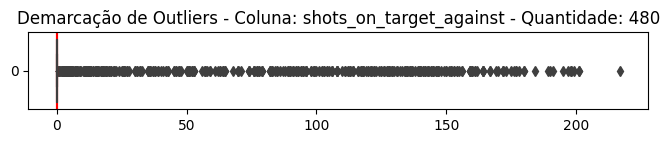



    OUTLIERS DA COLUNA saves
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "saves": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0, 12.0, 12.0, 12.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 15.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 17.0, 17.0, 17.0, 17.0, 17.0, 17.0, 18.0, 18.0, 18.0, 19.0, 19.0, 

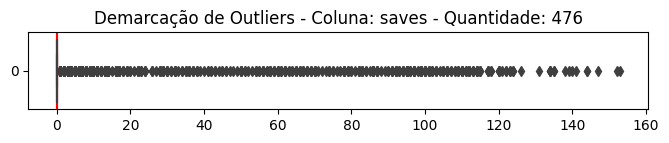



    OUTLIERS DA COLUNA save_pct
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "save_pct": [0.2, 0.333, 0.333, 0.333, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.417, 0.43, 0.44, 0.455, 0.462, 0.47, 0.474, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.514, 0.516, 0.533, 0.538, 0.538, 0.538, 0.54, 0.545, 0.545, 0.545, 0.55, 0.556, 0.556, 0.56, 0.56, 0.563, 0.563, 0.566, 0.571, 0.572, 0.58, 0.58, 0.582, 0.583, 0.584, 0.588, 0.59, 0.59, 0.59, 0.6, 0.6, 0.6, 0.6, 0.602, 0.606, 0.608, 0.609, 0.61, 0.61, 0.61, 0.611, 0.615, 0.618, 0.619, 0.62, 0.62, 0.62, 0.625, 0.626, 0.628, 0.628, 0.63, 0.63, 0.63, 0.63, 0.632, 0.632, 0.632, 0.633, 0.634, 0.635, 0.636, 0.636, 0.636, 0.636, 0.636, 0.638, 0.64, 0.64, 0.64, 0.64, 0.64, 0.64, 0.64, 0.64, 0.641, 0.641, 0.643, 0.644, 0.644, 0.645, 0.646, 0.649, 0.649, 0.65, 0.65, 0.65, 0.65, 0.65, 0.65, 0.65, 0.655, 0.656, 0.656, 0.657, 0.657, 0.658, 0.658, 0.659, 0.66, 0.66, 0.

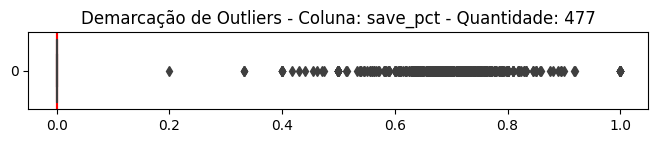



    OUTLIERS DA COLUNA wins_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "wins_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0,

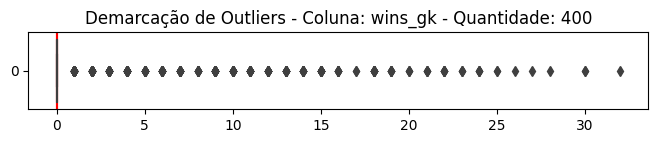



    OUTLIERS DA COLUNA draws_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "draws_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.

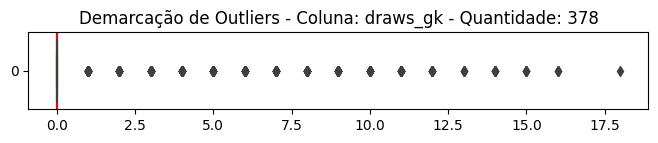



    OUTLIERS DA COLUNA losses_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "losses_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 

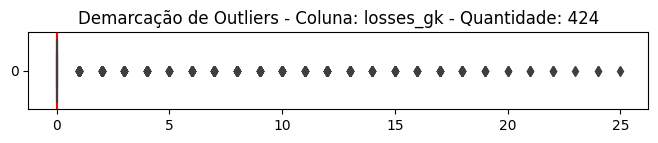



    OUTLIERS DA COLUNA clean_sheets
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "clean_sheets": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0,

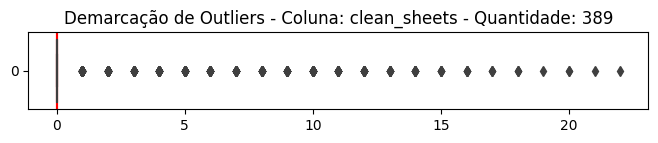



    OUTLIERS DA COLUNA clean_sheets_pct
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "clean_sheets_pct": [5.4, 5.9, 6.9, 7.7, 7.7, 10.0, 10.0, 10.5, 11.1, 11.1, 11.1, 11.8, 11.8, 11.8, 12.0, 12.5, 12.5, 12.5, 12.5, 12.5, 13.2, 13.2, 13.5, 13.6, 13.6, 13.9, 13.9, 13.9, 14.3, 14.3, 14.3, 14.3, 14.3, 14.3, 14.7, 14.7, 14.7, 14.8, 14.8, 15.2, 15.2, 15.2, 15.4, 15.4, 15.4, 15.6, 15.6, 16.0, 16.1, 16.1, 16.7, 16.7, 16.7, 16.7, 16.7, 16.7, 16.7, 16.7, 16.7, 16.7, 17.1, 17.2, 17.2, 17.6, 17.6, 17.6, 17.9, 17.9, 18.2, 18.2, 18.2, 18.2, 18.2, 18.2, 18.2, 18.2, 18.4, 18.4, 18.4, 18.4, 18.8, 18.8, 18.8, 19.4, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.6, 20.8, 20.8, 21.1, 21.1, 21.1, 21.1, 21.2, 21.4, 21.6, 21.6, 22.2, 22.2, 22.2, 22.2, 22.2, 22.2, 22.2, 22.6, 22.6, 22.9, 22.9, 23.1, 23.1, 23.3, 23.3, 23.5, 23.5, 23.5, 23.5, 23.5, 23.7, 23.7, 23.8, 23.8, 23.8, 24.0, 24.0, 24.0, 24.1, 24.1, 24.2, 24.2, 24.2, 24.2, 25.0, 25.0, 25.0, 25.0, 

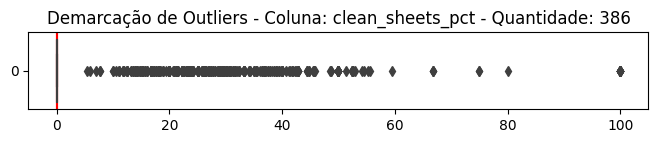



    OUTLIERS DA COLUNA pens_att_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_att_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3

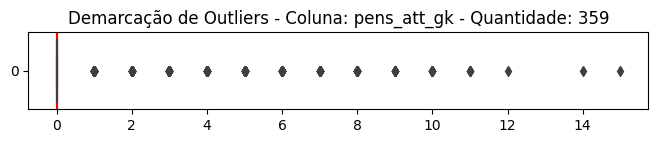



    OUTLIERS DA COLUNA pens_allowed
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_allowed": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0,

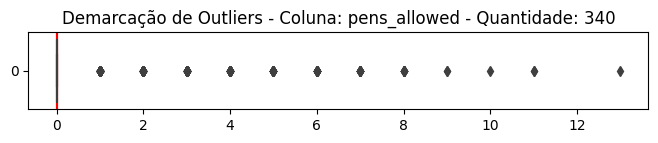



    OUTLIERS DA COLUNA pens_saved
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_saved": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0]


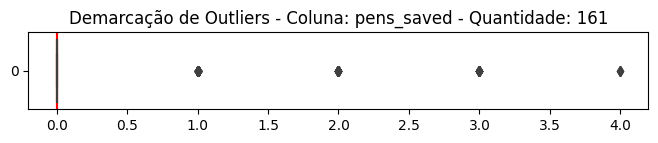



    OUTLIERS DA COLUNA pens_missed_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_missed_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0]


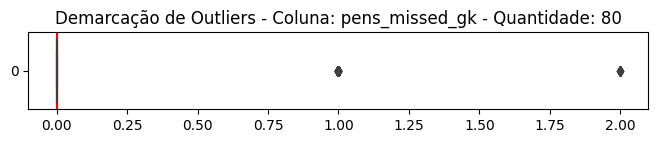



    OUTLIERS DA COLUNA minutes_90s_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "minutes_90s_gk": [0.1, 0.1, 0.1, 0.1, 0.2, 0.2, 0.3, 0.3, 0.4, 0.4, 0.5, 0.5, 0.7, 0.8, 0.8, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.2, 1.3, 1.4, 1.5, 1.5, 1.7, 1.7, 1.8, 1.8, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.2, 2.2, 2.5, 2.5, 2.5, 2.5, 2.8, 2.8, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.1, 3.1, 3.1, 3.2, 3.4, 3.4, 3.4, 3.5, 3.5, 3.6, 3.9, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.2, 4.6, 4.7, 4.7, 4.8, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.5, 5.5, 5.8, 5.9, 5.9, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.1, 6.2, 

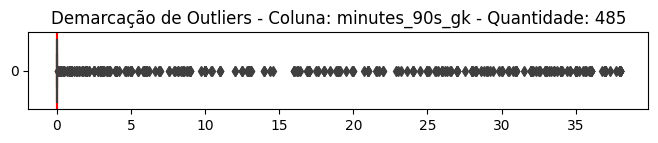



    OUTLIERS DA COLUNA free_kick_goals_against_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "free_kick_goals_against_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3

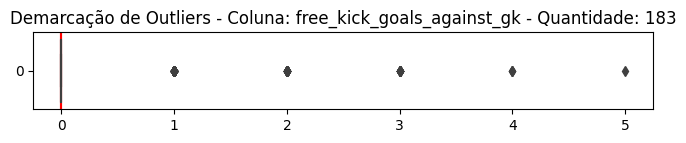



    OUTLIERS DA COLUNA corner_kick_goals_against_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "corner_kick_goals_against_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.

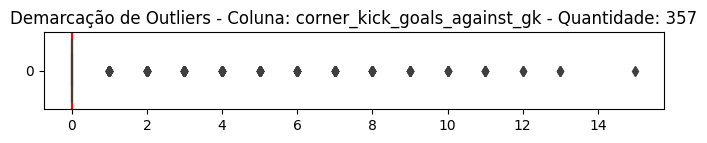



    OUTLIERS DA COLUNA own_goals_against_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "own_goals_against_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0

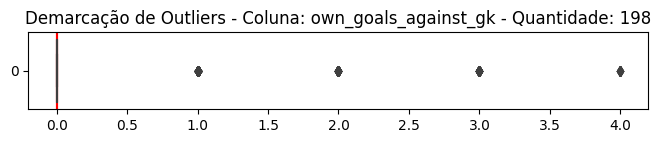



    OUTLIERS DA COLUNA psxg_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "psxg_gk": [0.1, 0.2, 0.3, 0.3, 0.3, 0.4, 0.4, 0.4, 0.5, 0.5, 0.7, 0.7, 0.7, 0.7, 0.7, 0.8, 0.8, 0.8, 0.8, 0.9, 0.9, 0.9, 0.9, 1.0, 1.1, 1.1, 1.1, 1.1, 1.1, 1.1, 1.2, 1.3, 1.3, 1.3, 1.4, 1.4, 1.4, 1.5, 1.5, 1.5, 1.5, 1.5, 1.6, 1.6, 1.6, 1.6, 1.6, 1.6, 1.6, 1.6, 1.7, 1.7, 1.8, 1.8, 1.9, 1.9, 1.9, 1.9, 1.9, 2.0, 2.0, 2.0, 2.0, 2.1, 2.1, 2.1, 2.2, 2.2, 2.4, 2.4, 2.5, 2.5, 2.5, 2.6, 2.6, 2.6, 2.6, 2.7, 2.7, 2.7, 2.9, 2.9, 3.1, 3.1, 3.1, 3.1, 3.2, 3.3, 3.3, 3.4, 3.4, 3.5, 3.5, 3.5, 3.5, 3.6, 3.6, 3.7, 3.7, 3.8, 3.8, 3.8, 3.8, 3.8, 4.0, 4.1, 4.1, 4.2, 4.2, 4.2, 4.2, 4.3, 4.3, 4.5, 4.6, 4.6, 4.7, 4.7, 4.8, 4.8, 4.9, 5.1, 5.3, 5.3, 5.3, 5.4, 5.5, 5.5, 5.5, 5.5, 5.5, 5.6, 5.6, 5.6, 5.7, 5.9, 5.9, 5.9, 5.9, 6.1, 6.1, 6.2, 6.3, 6.3, 6.4, 6.5, 6.7, 6.7, 6.8, 6.9, 6.9, 6.9, 7.0, 7.1, 7.1, 7.1, 7.5, 7.5, 7.5, 7.6, 7.8, 7.8, 8.0, 8.1, 8.2, 8.3, 8.6, 8.6, 8.6, 8.8, 9.0, 9.0, 9.2, 9.4, 9.4, 9.4, 9.6, 9.8,

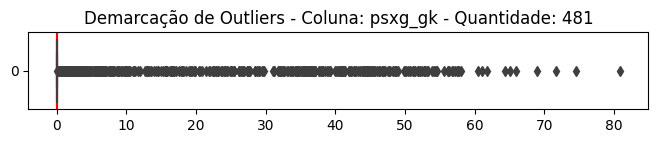



    OUTLIERS DA COLUNA psnpxg_per_shot_on_target_against
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "psnpxg_per_shot_on_target_against": [0.01, 0.08, 0.09, 0.1, 0.14, 0.14, 0.15, 0.16, 0.16, 0.17, 0.17, 0.17, 0.17, 0.18, 0.18, 0.18, 0.18, 0.18, 0.19, 0.19, 0.19, 0.19, 0.19, 0.19, 0.19, 0.2, 0.2, 0.2, 0.21, 0.21, 0.21, 0.21, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.22, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.23, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.26, 0.27, 0.27, 0.27, 0.27, 0.27, 0.27, 0.27, 0.27, 0.27, 0.27, 0.27, 0.27, 0.27, 0.27, 0.27, 0.27, 0

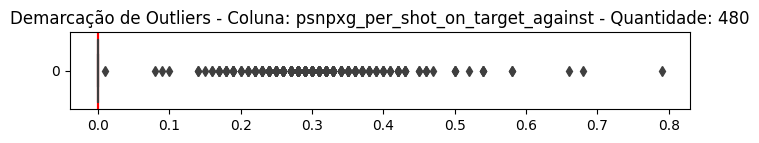



    OUTLIERS DA COLUNA psxg_net_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "psxg_net_gk": [-13.9, -10.5, -9.5, -8.3, -8.2, -7.9, -7.8, -7.3, -7.1, -6.9, -6.9, -6.7, -6.7, -6.6, -6.4, -6.3, -6.1, -6.0, -5.9, -5.8, -5.7, -5.6, -5.6, -5.6, -5.5, -5.5, -5.4, -5.4, -5.3, -5.3, -5.2, -5.0, -4.8, -4.8, -4.7, -4.7, -4.7, -4.6, -4.5, -4.5, -4.4, -4.4, -4.4, -4.3, -4.3, -4.3, -4.2, -4.1, -4.0, -4.0, -4.0, -3.9, -3.9, -3.9, -3.9, -3.8, -3.8, -3.6, -3.6, -3.6, -3.6, -3.5, -3.5, -3.5, -3.5, -3.4, -3.4, -3.4, -3.3, -3.3, -3.3, -3.2, -3.2, -3.2, -3.2, -3.1, -3.1, -3.1, -3.1, -3.1, -3.1, -3.1, -3.0, -3.0, -3.0, -2.9, -2.8, -2.8, -2.8, -2.8, -2.8, -2.8, -2.7, -2.7, -2.7, -2.6, -2.6, -2.5, -2.5, -2.5, -2.5, -2.4, -2.4, -2.4, -2.3, -2.3, -2.3, -2.3, -2.2, -2.2, -2.2, -2.2, -2.2, -2.2, -2.1, -2.1, -2.1, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -1.9, -1.9, -1.9, -1.9, -1.9, -1.9, -1.9, -1.8, -1.8, -1.7, -1.7, -1.7, -1.6, -1.6, -1.6, -1.6, -1.6, -1.6, -1.6, -1.5, -1.5, -1.

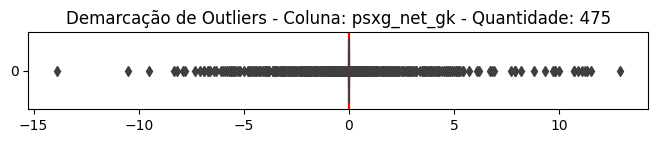



    OUTLIERS DA COLUNA psxg_net_per90_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "psxg_net_per90_gk": [-2.18, -1.76, -1.43, -1.15, -1.14, -1.12, -1.11, -1.08, -0.97, -0.96, -0.95, -0.89, -0.88, -0.86, -0.85, -0.83, -0.83, -0.8, -0.78, -0.78, -0.76, -0.72, -0.72, -0.72, -0.72, -0.72, -0.7, -0.7, -0.69, -0.66, -0.66, -0.64, -0.62, -0.57, -0.57, -0.56, -0.55, -0.52, -0.5, -0.5, -0.48, -0.46, -0.45, -0.45, -0.45, -0.45, -0.44, -0.43, -0.41, -0.41, -0.41, -0.4, -0.39, -0.39, -0.38, -0.38, -0.37, -0.36, -0.35, -0.33, -0.33, -0.33, -0.33, -0.32, -0.32, -0.31, -0.31, -0.3, -0.3, -0.29, -0.29, -0.29, -0.29, -0.28, -0.28, -0.28, -0.28, -0.27, -0.27, -0.27, -0.27, -0.27, -0.26, -0.26, -0.26, -0.25, -0.24, -0.24, -0.24, -0.24, -0.23, -0.23, -0.23, -0.23, -0.23, -0.22, -0.22, -0.22, -0.22, -0.22, -0.22, -0.22, -0.22, -0.21, -0.21, -0.21, -0.2, -0.2, -0.2, -0.2, -0.2, -0.2, -0.2, -0.2, -0.19, -0.19, -0.19, -0.19, -0.19, -0.18, -0.18, -0.18, -0.18, -0.18, -0.18, -0.18, -0.

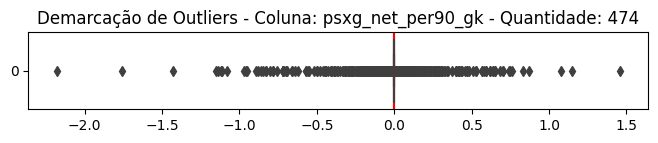



    OUTLIERS DA COLUNA passes_completed_launched_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "passes_completed_launched_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 15.0, 15.0, 15.0, 15.0, 16.0, 16.0, 17.0, 17.0, 18.0, 18.0, 19.0, 19.0, 19.0, 19.0, 19.0, 20.0, 20.0, 21.0, 22.0, 23.0, 23.0, 23.0, 24.0, 24.0, 24.0, 26.0, 26.0, 26.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 28.0, 28.0, 28.0, 29.0, 29.0, 30.0, 31.0,

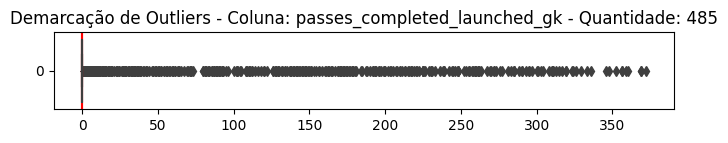



    OUTLIERS DA COLUNA passes_launched_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "passes_launched_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 6.0, 7.0, 7.0, 7.0, 8.0, 9.0, 9.0, 9.0, 10.0, 10.0, 10.0, 10.0, 11.0, 12.0, 12.0, 12.0, 12.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 14.0, 14.0, 14.0, 14.0, 14.0, 15.0, 15.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 17.0, 18.0, 18.0, 18.0, 20.0, 20.0, 21.0, 21.0, 21.0, 21.0, 21.0, 22.0, 22.0, 22.0, 22.0, 22.0, 22.0, 23.0, 23.0, 23.0, 23.0, 23.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 25.0, 26.0, 26.0, 26.0, 28.0, 28.0, 28.0, 29.0, 29.0, 29.0, 30.0, 30.0, 30.0, 30.0, 31.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 33.0, 33.0, 34.0, 35.0, 35.0, 37.0, 38.0, 38.0, 38.0, 39.0, 39.0, 40.0, 40.0, 42.0, 43.0, 43.0, 43.0, 45.0, 45.0, 47.0, 47.0, 47.0, 48.0, 48.0, 49.0, 51.0, 52.0, 54.0, 56.0, 58.0, 59.0, 59.0, 59.0, 59.0, 62.0, 63.0, 63.0, 64.0, 64.0, 65.0, 66.0, 66.

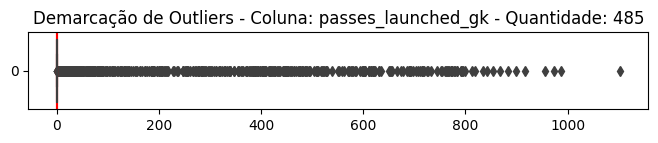



    OUTLIERS DA COLUNA passes_pct_launched_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "passes_pct_launched_gk": [10.0, 11.1, 12.5, 13.0, 13.3, 14.3, 15.4, 16.7, 18.2, 19.2, 20.0, 20.0, 20.8, 21.4, 22.2, 24.2, 25.0, 25.0, 25.0, 25.6, 26.3, 26.5, 26.7, 26.9, 27.3, 27.5, 27.6, 27.6, 27.8, 28.1, 28.1, 28.1, 28.4, 28.5, 28.6, 28.6, 28.6, 28.9, 28.9, 28.9, 28.9, 28.9, 29.0, 29.0, 29.2, 29.3, 29.5, 29.5, 29.7, 29.9, 30.2, 30.3, 30.4, 30.5, 30.7, 30.8, 31.0, 31.1, 31.1, 31.3, 31.4, 31.6, 31.7, 31.8, 32.0, 32.1, 32.2, 32.4, 32.4, 32.4, 32.5, 32.5, 32.6, 32.8, 32.8, 32.9, 33.0, 33.0, 33.2, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.4, 33.6, 33.6, 33.6, 33.6, 33.6, 33.6, 33.8, 33.9, 33.9, 33.9, 34.0, 34.2, 34.3, 34.4, 34.4, 34.4, 34.4, 34.4, 34.4, 34.6, 34.6, 34.6, 34.7, 34.7, 34.7, 34.7, 34.8, 34.9, 35.0, 35.0, 35.2, 35.2, 35.2, 35.3, 35.3, 35.3, 35.3, 35.4, 35.6, 35.6, 35.6, 35.6, 35.6, 35.6, 35.7, 35.8, 36.1, 36.2, 36.2, 36.2, 36.3, 36.3, 36.3, 3

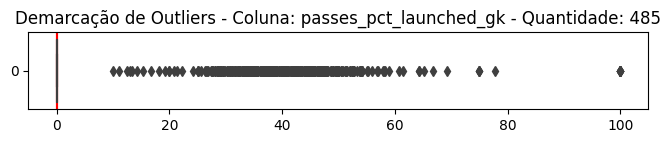



    OUTLIERS DA COLUNA passes_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "passes_gk": [1.0, 1.0, 2.0, 3.0, 3.0, 3.0, 3.0, 5.0, 6.0, 7.0, 8.0, 8.0, 10.0, 11.0, 12.0, 12.0, 13.0, 13.0, 14.0, 14.0, 14.0, 14.0, 14.0, 16.0, 16.0, 16.0, 16.0, 18.0, 18.0, 18.0, 18.0, 19.0, 19.0, 20.0, 20.0, 21.0, 22.0, 22.0, 22.0, 23.0, 23.0, 23.0, 23.0, 24.0, 24.0, 25.0, 25.0, 25.0, 25.0, 26.0, 27.0, 27.0, 28.0, 29.0, 29.0, 29.0, 30.0, 30.0, 31.0, 32.0, 32.0, 33.0, 33.0, 34.0, 34.0, 34.0, 34.0, 35.0, 35.0, 35.0, 35.0, 37.0, 37.0, 37.0, 37.0, 37.0, 39.0, 41.0, 42.0, 43.0, 43.0, 43.0, 44.0, 46.0, 47.0, 47.0, 47.0, 48.0, 48.0, 48.0, 49.0, 49.0, 49.0, 50.0, 51.0, 51.0, 52.0, 53.0, 53.0, 53.0, 53.0, 54.0, 54.0, 54.0, 55.0, 55.0, 55.0, 56.0, 56.0, 56.0, 57.0, 58.0, 59.0, 59.0, 59.0, 61.0, 61.0, 64.0, 64.0, 66.0, 67.0, 68.0, 69.0, 70.0, 70.0, 70.0, 73.0, 73.0, 74.0, 74.0, 75.0, 77.0, 77.0, 79.0, 79.0, 80.0, 82.0, 85.0, 86.0, 88.0, 89.0, 90.0, 90.0, 91.0, 93.0, 94.0, 96.0, 96.0, 97.0, 101

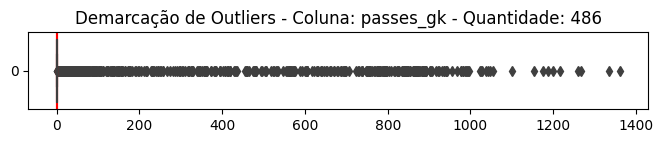



    OUTLIERS DA COLUNA passes_throws_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "passes_throws_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0, 12.0, 12.0, 13.0, 13.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 17.0, 17.0, 17.0, 18.0, 18.0, 18.0, 19.0, 19.0, 19.0, 20.0, 20.0, 21.0, 21.0, 21.0, 21.0, 22.0, 22.0, 23.0, 23

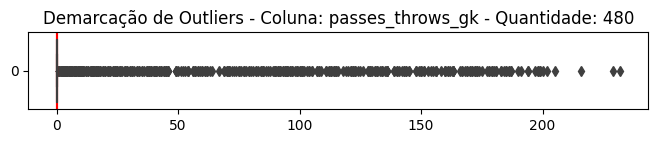



    OUTLIERS DA COLUNA pct_passes_launched_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pct_passes_launched_gk": [1.8, 4.2, 4.2, 8.2, 10.7, 10.9, 13.0, 13.9, 14.3, 14.3, 15.2, 15.7, 17.1, 17.2, 17.6, 17.8, 18.8, 18.9, 20.0, 21.1, 21.5, 21.7, 21.8, 21.9, 22.7, 22.7, 22.8, 22.8, 23.1, 23.5, 23.7, 24.0, 24.2, 24.3, 24.4, 24.6, 24.7, 24.9, 24.9, 25.2, 26.0, 26.0, 26.0, 26.1, 26.2, 26.4, 26.5, 26.6, 26.9, 26.9, 26.9, 27.0, 27.0, 27.1, 27.1, 27.1, 27.2, 27.5, 27.9, 27.9, 27.9, 28.1, 28.2, 28.5, 28.6, 28.6, 29.4, 29.8, 29.8, 29.8, 30.0, 30.2, 30.2, 30.5, 30.5, 30.6, 30.8, 30.9, 31.0, 31.0, 31.1, 31.3, 31.3, 31.6, 31.6, 31.8, 31.9, 32.0, 32.0, 32.1, 32.4, 32.4, 32.4, 32.5, 32.5, 32.7, 32.7, 32.9, 33.0, 33.0, 33.1, 33.3, 33.3, 33.3, 33.3, 33.3, 33.3, 33.7, 33.7, 33.8, 33.8, 33.8, 34.2, 34.2, 34.2, 34.5, 34.7, 34.8, 34.8, 34.8, 35.0, 35.0, 35.0, 35.0, 35.0, 35.1, 35.2, 35.2, 35.2, 35.3, 35.4, 35.6, 35.6, 35.7, 35.7, 36.1, 36.1, 36.4, 36.4, 36.5, 36.5, 36.8, 36.8, 36.8,

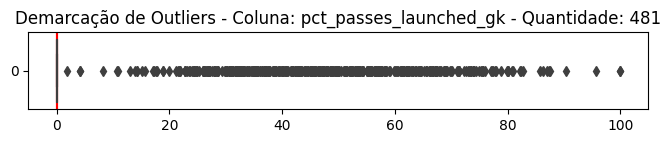



    OUTLIERS DA COLUNA passes_length_avg_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "passes_length_avg_gk": [15.0, 17.7, 20.0, 20.0, 21.0, 21.1, 21.5, 22.5, 23.8, 24.3, 24.6, 25.4, 25.8, 25.9, 26.2, 26.6, 26.6, 26.7, 26.9, 26.9, 27.0, 27.4, 27.5, 27.5, 27.6, 27.7, 27.7, 27.9, 28.1, 28.1, 28.2, 28.3, 28.3, 28.5, 28.8, 28.8, 28.9, 28.9, 29.0, 29.0, 29.4, 29.5, 29.7, 29.7, 29.7, 29.7, 29.9, 29.9, 30.0, 30.1, 30.1, 30.1, 30.1, 30.3, 30.6, 30.8, 30.9, 31.0, 31.0, 31.1, 31.1, 31.1, 31.2, 31.5, 31.5, 31.5, 31.5, 31.7, 31.7, 31.8, 31.8, 31.8, 31.9, 31.9, 31.9, 32.0, 32.1, 32.2, 32.2, 32.3, 32.3, 32.4, 32.5, 32.5, 32.5, 32.6, 32.6, 32.7, 32.7, 32.7, 32.8, 32.8, 32.8, 32.9, 33.0, 33.0, 33.1, 33.1, 33.3, 33.3, 33.3, 33.3, 33.4, 33.5, 33.5, 33.6, 33.6, 33.6, 33.6, 33.7, 33.8, 33.8, 33.9, 34.0, 34.0, 34.0, 34.0, 34.1, 34.1, 34.2, 34.2, 34.3, 34.3, 34.3, 34.3, 34.4, 34.4, 34.4, 34.5, 34.5, 34.6, 34.6, 34.7, 34.7, 34.8, 34.8, 34.8, 34.9, 34.9, 34.9, 35.0, 35.1, 35.2, 35.3,

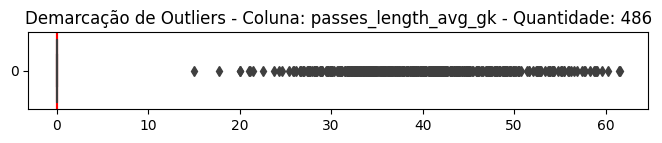



    OUTLIERS DA COLUNA goal_kicks
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "goal_kicks": [1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0, 12.0, 12.0, 12.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 15.0, 15.0, 15.0, 15.0, 15.0, 16.0, 16.0, 16.0, 16.0, 17.0, 18.0, 18.0, 18.0, 19.0, 19.0, 20.0, 20.0, 21.0, 22.0, 22.0, 22.0, 23.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 25.0, 25.0, 25.0, 25.0, 26.0, 26.0, 27.0, 27.0, 27.0, 28.0, 28.0, 28.0, 28.0, 28.0, 29.0, 29.0, 29.0, 29.0, 29.0, 30.0, 30.0, 31.0, 31.0, 33.0, 33.0, 34.0, 34.0, 34.0, 34.0, 35.0, 35.0, 35.0, 35.0, 36.0, 36.0

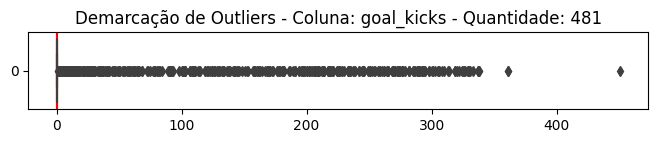



    OUTLIERS DA COLUNA pct_goal_kicks_launched
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pct_goal_kicks_launched": [12.5, 16.8, 18.2, 19.0, 19.4, 19.9, 20.0, 20.0, 20.0, 20.5, 20.7, 20.8, 21.4, 22.3, 22.6, 23.9, 25.0, 25.0, 25.0, 25.0, 25.3, 28.0, 28.6, 28.6, 29.5, 29.7, 30.0, 31.3, 31.3, 31.3, 31.3, 31.9, 32.1, 33.1, 33.3, 33.3, 33.3, 33.3, 33.5, 33.8, 34.0, 34.4, 34.5, 35.4, 35.7, 36.0, 36.2, 36.2, 36.2, 36.4, 37.0, 37.2, 37.5, 37.5, 37.5, 38.8, 38.8, 38.9, 39.0, 39.2, 39.3, 39.4, 40.0, 40.0, 40.9, 41.5, 41.7, 42.1, 42.4, 42.7, 42.9, 42.9, 42.9, 43.4, 43.5, 43.7, 44.0, 44.4, 44.4, 44.6, 44.7, 44.7, 45.0, 45.0, 45.6, 45.8, 45.9, 46.0, 46.2, 46.2, 46.5, 46.7, 46.9, 47.2, 47.5, 47.5, 47.5, 47.6, 47.7, 48.1, 48.3, 48.5, 48.5, 48.6, 48.8, 49.2, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.2, 51.2, 51.5, 51.6, 51.9, 52.1, 52.4, 52.8, 53.3, 53.5, 53.6, 53.7, 54.1, 54.2, 55.3, 55.4, 55.5, 55.6, 55.7, 56.0, 56.0, 56.5, 56.6, 56.9, 57.1, 57.1, 57.3, 57.7,

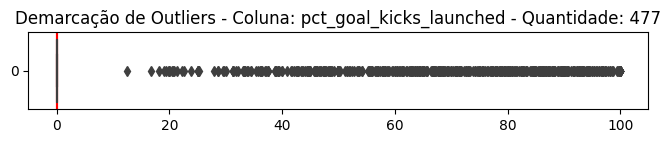



    OUTLIERS DA COLUNA goal_kick_length_avg
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "goal_kick_length_avg": [15.3, 20.4, 21.4, 22.7, 22.9, 23.7, 24.1, 24.4, 24.5, 24.5, 24.6, 25.6, 25.7, 26.4, 26.8, 27.2, 27.9, 29.0, 29.4, 29.4, 29.7, 29.9, 30.0, 30.3, 30.3, 30.7, 31.0, 31.8, 32.1, 32.2, 32.5, 32.6, 32.8, 32.8, 33.1, 33.3, 33.4, 33.9, 34.0, 34.3, 34.4, 34.5, 34.8, 34.8, 35.0, 35.1, 35.2, 35.2, 35.3, 35.4, 35.8, 35.8, 35.8, 35.9, 36.2, 36.2, 36.2, 36.4, 36.7, 36.8, 37.1, 37.1, 37.1, 37.3, 37.5, 38.0, 38.7, 38.8, 38.9, 38.9, 39.0, 39.1, 39.1, 39.3, 39.4, 39.5, 39.5, 39.6, 39.9, 40.0, 40.0, 40.0, 40.2, 40.2, 40.3, 40.3, 40.3, 40.7, 40.7, 40.8, 40.8, 41.0, 41.2, 41.3, 41.4, 41.6, 41.6, 41.7, 41.7, 41.7, 41.8, 41.9, 42.0, 42.0, 42.2, 42.2, 42.2, 42.2, 42.3, 42.6, 42.6, 42.9, 43.0, 43.0, 43.0, 43.0, 43.2, 43.4, 43.4, 43.5, 43.7, 43.7, 43.8, 43.9, 44.0, 44.0, 44.1, 44.2, 44.3, 44.4, 44.5, 44.8, 44.9, 45.0, 45.1, 45.1, 45.2, 45.3, 45.4, 45.4, 45.5, 45.5, 45.6, 45.7,

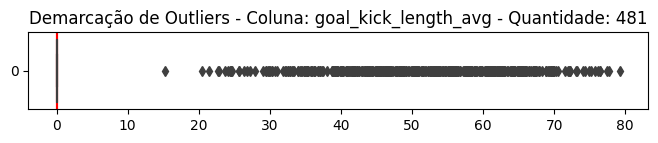



    OUTLIERS DA COLUNA crosses_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "crosses_gk": [2.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 8.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 10.0, 10.0, 10.0, 10.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 12.0, 12.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 16.0, 16.0, 16.0, 16.0, 17.0, 17.0, 18.0, 18.0, 18.0, 18.0, 19.0, 19.0, 20.0, 20.0, 20.0, 21.0, 21.0, 21.0, 21.0, 21.0, 22.0, 22.0, 23.0, 23.0, 23.0, 23.0, 24.0, 24.0, 24.0, 24.0, 25.0, 25.0, 25.0, 26.0, 27.0, 28.0, 28.0, 28.0, 29.0, 30.0, 30.0, 31.0, 32.0, 32.0, 32.0, 33.0, 33.0, 33.0, 34.0, 34.0, 34.0, 35.0, 35.0, 35.0, 36.0, 36.0, 36.0, 37.0, 37.0, 37.0, 37.0, 38.0, 38.0, 39.0, 39.0, 39.0, 40.0, 40.0, 41.0, 41.0, 42.0, 43.0, 44.0, 44.0, 47.0, 47.0, 48.0, 48.0, 49.0, 50.0, 5

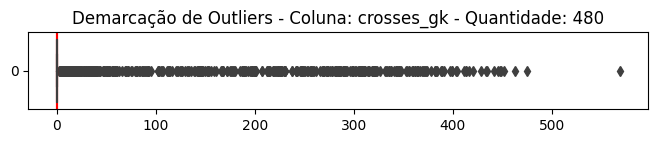



    OUTLIERS DA COLUNA crosses_stopped_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "crosses_stopped_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 9.0, 9.0, 9.0, 9.

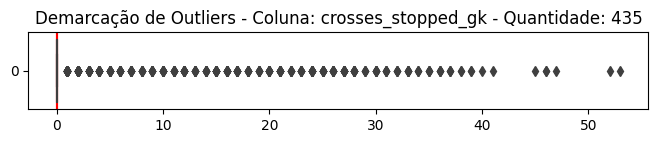



    OUTLIERS DA COLUNA crosses_stopped_pct_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "crosses_stopped_pct_gk": [1.3, 1.7, 1.8, 1.8, 2.0, 2.4, 2.6, 2.7, 2.8, 2.8, 2.9, 3.1, 3.1, 3.1, 3.1, 3.2, 3.2, 3.2, 3.4, 3.5, 3.6, 3.6, 3.6, 3.7, 3.7, 3.7, 3.8, 3.8, 3.8, 3.8, 3.9, 3.9, 3.9, 3.9, 4.0, 4.0, 4.1, 4.2, 4.3, 4.3, 4.4, 4.5, 4.5, 4.5, 4.5, 4.6, 4.6, 4.7, 4.7, 4.7, 4.8, 4.8, 4.8, 4.8, 4.9, 4.9, 4.9, 4.9, 5.0, 5.0, 5.0, 5.0, 5.1, 5.1, 5.2, 5.2, 5.2, 5.2, 5.2, 5.2, 5.3, 5.3, 5.3, 5.3, 5.3, 5.3, 5.4, 5.4, 5.4, 5.4, 5.5, 5.5, 5.5, 5.5, 5.6, 5.6, 5.6, 5.6, 5.6, 5.7, 5.7, 5.8, 5.8, 5.8, 5.8, 5.8, 5.8, 5.9, 5.9, 5.9, 6.0, 6.0, 6.0, 6.1, 6.1, 6.1, 6.2, 6.2, 6.2, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.3, 6.4, 6.4, 6.4, 6.5, 6.5, 6.5, 6.5, 6.5, 6.5, 6.6, 6.6, 6.6, 6.6, 6.6, 6.6, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.7, 6.8, 6.8, 6.8, 6.8, 6.8, 6.8, 6.8, 6.8, 6.8, 6.9, 6.9, 6.9, 6.9, 6.9, 6.9, 6.9, 6.9, 6.9, 7.0, 7.0, 7.0, 7.0, 7.1, 7.1, 7.1, 7.1, 7.1, 7.1,

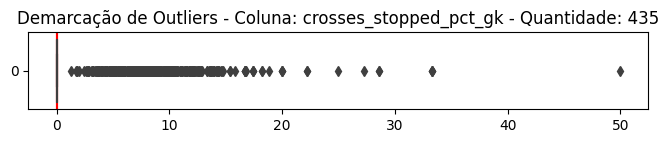



    OUTLIERS DA COLUNA def_actions_outside_pen_area_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "def_actions_outside_pen_area_gk": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7.0, 7

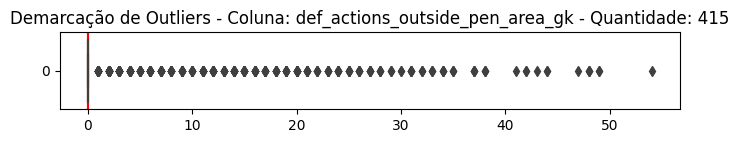



    OUTLIERS DA COLUNA def_actions_outside_pen_area_per90_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "def_actions_outside_pen_area_per90_gk": [0.11, 0.13, 0.16, 0.17, 0.18, 0.2, 0.2, 0.21, 0.21, 0.21, 0.21, 0.21, 0.22, 0.22, 0.23, 0.23, 0.23, 0.23, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.24, 0.25, 0.25, 0.25, 0.26, 0.26, 0.26, 0.27, 0.27, 0.28, 0.28, 0.28, 0.29, 0.29, 0.29, 0.29, 0.29, 0.29, 0.3, 0.3, 0.31, 0.31, 0.31, 0.31, 0.31, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.34, 0.34, 0.34, 0.34, 0.34, 0.35, 0.35, 0.35, 0.35, 0.35, 0.36, 0.36, 0.36, 0.37, 0.37, 0.37, 0.37, 0.37, 0.38, 0.38, 0.38, 0.38, 0.39, 0.39, 0.39, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.42, 0.42, 0.42, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.44, 0.44, 0.44, 0.44, 0.44, 0.44, 0.45, 0.45, 0.45, 0.45, 0.45, 0.45, 0.46, 0.46, 0.46, 0.46, 0.46, 0.46, 0.46, 0.46, 0.47, 0.47, 0.47, 0.47, 0.

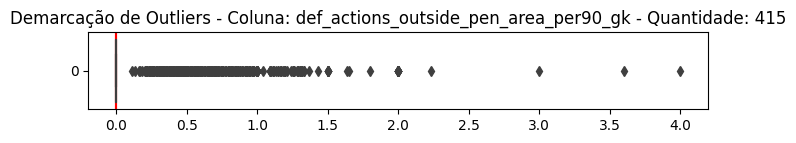



    OUTLIERS DA COLUNA avg_distance_def_actions_gk
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "avg_distance_def_actions_gk": [6.0, 6.0, 7.0, 7.0, 7.0, 7.4, 8.0, 8.7, 8.8, 9.0, 9.3, 9.3, 9.5, 9.6, 9.6, 10.0, 10.2, 10.3, 10.4, 10.5, 10.5, 10.6, 10.6, 10.6, 10.8, 10.9, 10.9, 11.0, 11.0, 11.0, 11.1, 11.2, 11.3, 11.4, 11.5, 11.5, 11.5, 11.5, 11.5, 11.5, 11.6, 11.6, 11.6, 11.7, 11.7, 11.7, 11.7, 11.8, 11.9, 11.9, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.1, 12.1, 12.2, 12.2, 12.2, 12.2, 12.2, 12.2, 12.2, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.3, 12.4, 12.4, 12.4, 12.4, 12.5, 12.5, 12.5, 12.5, 12.5, 12.5, 12.5, 12.6, 12.6, 12.6, 12.6, 12.6, 12.6, 12.7, 12.7, 12.8, 12.8, 12.8, 12.9, 12.9, 12.9, 12.9, 12.9, 12.9, 12.9, 12.9, 12.9, 12.9, 12.9, 12.9, 12.9, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.1, 13.1, 13.1, 13.1, 13.1, 13.1, 13.2, 13.2, 13.2, 13.2, 13.2, 13.2, 13.2, 13.2, 13.3, 13.3, 13.3, 13.3, 13.3, 13.3, 

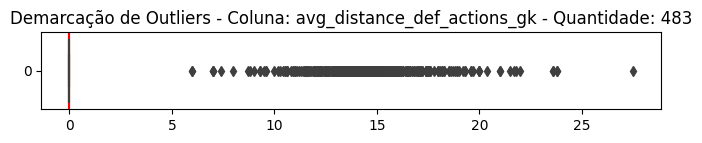



    OUTLIERS DA COLUNA goalsm
Limite Inferior: -0.003 
Limite Superior: 0.004
Outliers da coluna "goalsm": [0.004197272, 0.004197272, 0.004213483, 0.004225893, 0.004225893, 0.00422833, 0.004234528, 0.004239855, 0.004239855, 0.004249292, 0.004252734, 0.004261364, 0.004261364, 0.004273504, 0.004273504, 0.004273504, 0.00428449, 0.00428449, 0.004287245, 0.004291845, 0.004291845, 0.004291845, 0.004291845, 0.004291845, 0.004302926, 0.004310345, 0.004310345, 0.004324684, 0.004324684, 0.004325883, 0.004327563, 0.004327563, 0.004329004, 0.004329004, 0.004329004, 0.004329004, 0.004329004, 0.004329004, 0.004329004, 0.004333694, 0.004354136, 0.004354136, 0.004357298, 0.004357298, 0.004377238, 0.004377736, 0.004382121, 0.004385965, 0.004385965, 0.004391892, 0.004391892, 0.004392387, 0.004398021, 0.004398021, 0.00440044, 0.004407051, 0.004410143, 0.004418262, 0.004424779, 0.004424779, 0.004431315, 0.00443787, 0.004455245, 0.004455245, 0.004464286, 0.004464286, 0.004468275, 0.004479283, 0.004479283

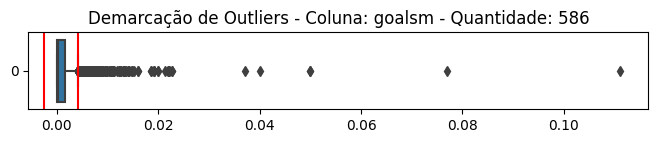



    OUTLIERS DA COLUNA assistsm
Limite Inferior: -0.002 
Limite Superior: 0.003
Outliers da coluna "assistsm": [0.003348214, 0.003348214, 0.00335249, 0.00335249, 0.003352892, 0.003352892, 0.003352892, 0.003352892, 0.003367003, 0.003367003, 0.003373819, 0.003375527, 0.00338001, 0.003389831, 0.003389831, 0.003389831, 0.003389831, 0.003404255, 0.003409091, 0.003409091, 0.003419638, 0.003420398, 0.003420398, 0.00342131, 0.00342131, 0.003428571, 0.003448276, 0.003448276, 0.003448276, 0.003448276, 0.003448276, 0.003448276, 0.003448276, 0.003448276, 0.003448276, 0.003448276, 0.003454231, 0.003454231, 0.003460208, 0.003472222, 0.003472222, 0.003472222, 0.003477051, 0.003507014, 0.003511853, 0.003511853, 0.003511853, 0.003511853, 0.003512293, 0.003521127, 0.003521127, 0.003521127, 0.003521127, 0.003533569, 0.003546099, 0.003546099, 0.003560127, 0.003560127, 0.003561888, 0.003566334, 0.003566334, 0.003581662, 0.003584229, 0.003597122, 0.003597122, 0.003605375, 0.003610108, 0.003616637, 0.00362

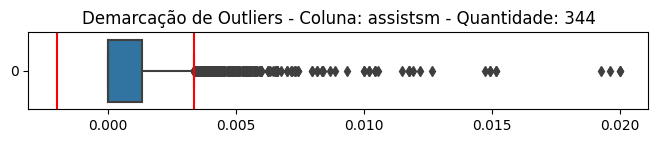



    OUTLIERS DA COLUNA pens_madem
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_madem": [0.000309981, 0.000309981, 0.000316857, 0.000316857, 0.000321234, 0.000323625, 0.000325733, 0.000325733, 0.000326797, 0.000326797, 0.000329056, 0.000332889, 0.000332889, 0.000333667, 0.000333667, 0.000336134, 0.000336134, 0.000337838, 0.000337838, 0.000340252, 0.000341297, 0.00034153, 0.00034153, 0.000342583, 0.000344828, 0.000344828, 0.000345304, 0.000345304, 0.000347826, 0.000347826, 0.000353232, 0.000353232, 0.000354484, 0.000354484, 0.000359454, 0.000361533, 0.000365898, 0.000365898, 0.000367107, 0.000367107, 0.000367647, 0.000369549, 0.000369822, 0.000379075, 0.000379219, 0.000383583, 0.000383583, 0.00038432, 0.000388048, 0.000390625, 0.000392927, 0.000392927, 0.00039557, 0.00039557, 0.000398883, 0.000400802, 0.000400802, 0.000402091, 0.000402091, 0.000407498, 0.000410341, 0.000410509, 0.000419639, 0.000419639, 0.000423729, 0.000423729, 0.000425713, 0.000425713, 0.00

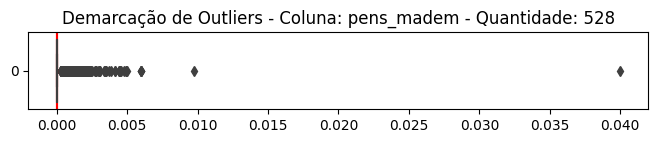



    OUTLIERS DA COLUNA pens_attm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_attm": [0.00030931, 0.000316857, 0.000316857, 0.000321234, 0.000321854, 0.000321854, 0.000323625, 0.000325733, 0.000325733, 0.000329056, 0.000332889, 0.000332889, 0.000333667, 0.000333667, 0.000335008, 0.000335008, 0.000336022, 0.000336022, 0.000336134, 0.000336134, 0.000337838, 0.000337838, 0.000341297, 0.00034188, 0.00034188, 0.000342583, 0.000347826, 0.000347826, 0.000354484, 0.000354484, 0.000359454, 0.000365898, 0.000365898, 0.000367107, 0.000367107, 0.000369549, 0.000369822, 0.000374813, 0.000374813, 0.000374813, 0.000379075, 0.000381098, 0.000383583, 0.000383583, 0.00038432, 0.000388048, 0.000390625, 0.000391236, 0.000391236, 0.000392927, 0.000392927, 0.00039557, 0.00039557, 0.000398565, 0.000398565, 0.000398883, 0.000400802, 0.000400802, 0.000402091, 0.000402091, 0.000402414, 0.000407498, 0.000407664, 0.000407664, 0.000410341, 0.000410509, 0.000412031, 0.000417885, 0.00041

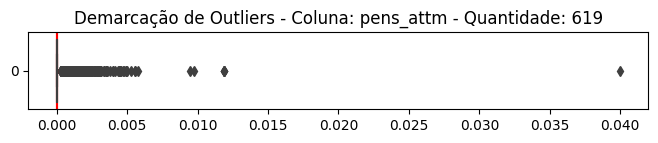



    OUTLIERS DA COLUNA cards_yellowm
Limite Inferior: -0.004 
Limite Superior: 0.007
Outliers da coluna "cards_yellowm": [0.007407407, 0.007407407, 0.007407407, 0.007434944, 0.007434944, 0.00745614, 0.007507508, 0.007518797, 0.007518797, 0.007544582, 0.007567568, 0.007575758, 0.007575758, 0.00770416, 0.007751938, 0.007782101, 0.007782101, 0.007782101, 0.007782101, 0.007792208, 0.007889546, 0.007889546, 0.007936508, 0.007936508, 0.007936508, 0.007978723, 0.008, 0.008007117, 0.008007117, 0.008064516, 0.008086253, 0.008196721, 0.008196721, 0.008196721, 0.008196721, 0.008287293, 0.008319468, 0.008319468, 0.008319468, 0.008319468, 0.008333333, 0.008333333, 0.008347245, 0.008347245, 0.008347245, 0.008356546, 0.008403361, 0.008403361, 0.008403361, 0.008417508, 0.008417508, 0.008417508, 0.008417508, 0.008498584, 0.008510638, 0.008522727, 0.008522727, 0.008547009, 0.008547009, 0.008547009, 0.008578431, 0.008578431, 0.008602151, 0.008604207, 0.008604207, 0.00862069, 0.00862069, 0.008695652, 0.

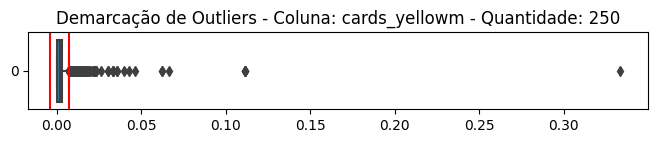



    OUTLIERS DA COLUNA cards_redm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "cards_redm": [0.000295596, 0.000302206, 0.000302206, 0.000303767, 0.000303767, 0.000306748, 0.000306748, 0.000306937, 0.000306937, 0.000308737, 0.000308737, 0.000309406, 0.000311236, 0.000311236, 0.000313775, 0.000315756, 0.000315756, 0.000316456, 0.000316456, 0.000316857, 0.00031736, 0.00031736, 0.000318878, 0.000319081, 0.000319081, 0.000319285, 0.000319285, 0.000319285, 0.000321543, 0.000321543, 0.000323939, 0.000323939, 0.000325627, 0.000325733, 0.000325733, 0.000325839, 0.000329381, 0.000329381, 0.000329381, 0.000330688, 0.000330688, 0.000331345, 0.000331345, 0.000333667, 0.000333667, 0.000334336, 0.000337268, 0.000337268, 0.000337838, 0.000337838, 0.000339674, 0.000339674, 0.000339905, 0.000339905, 0.00034002, 0.00034002, 0.000340483, 0.000340483, 0.000342231, 0.000342231, 0.0003427, 0.0003427, 0.000344116, 0.000344116, 0.00034638, 0.000347343, 0.000347343, 0.000347826, 0.000347

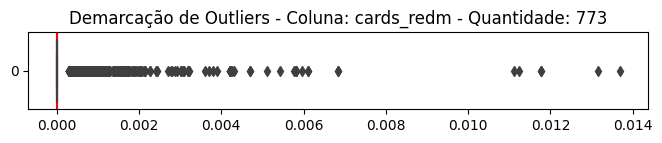



    OUTLIERS DA COLUNA goals_per90m
Limite Inferior: -0.000 
Limite Superior: 0.000
Outliers da coluna "goals_per90m": [0.0002443, 0.0002443, 0.000244444, 0.000245166, 0.000245166, 0.000245353, 0.000245353, 0.00024619, 0.00024619, 0.000246445, 0.000246445, 0.000246479, 0.000246914, 0.000247383, 0.000247383, 0.000247619, 0.000247619, 0.000247619, 0.000247619, 0.000247642, 0.000247934, 0.000247934, 0.000248756, 0.000248815, 0.000248815, 0.000249584, 0.000249584, 0.000250417, 0.000250417, 0.000250417, 0.000250597, 0.000250965, 0.000251256, 0.000251256, 0.000251467, 0.000251467, 0.000251467, 0.000251467, 0.000252525, 0.000252525, 0.000252525, 0.000253165, 0.000253378, 0.000253593, 0.000254237, 0.000254646, 0.000254902, 0.000255172, 0.000255537, 0.000255973, 0.000256137, 0.000256507, 0.000256766, 0.000256766, 0.000256766, 0.000256766, 0.000257097, 0.000257097, 0.000257331, 0.00025888, 0.00025888, 0.00025974, 0.00025974, 0.00025974, 0.00025974, 0.000259901, 0.000259901, 0.000260417, 0.0002

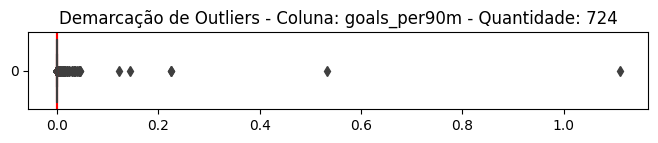



    OUTLIERS DA COLUNA assists_per90m
Limite Inferior: -0.000 
Limite Superior: 0.000
Outliers da coluna "assists_per90m": [0.000176817, 0.00017769, 0.00017769, 0.000178138, 0.000178138, 0.000178218, 0.000178218, 0.000178716, 0.000178716, 0.000179283, 0.000179283, 0.000179398, 0.000179451, 0.000180033, 0.00018018, 0.000180361, 0.000180361, 0.000181269, 0.000181269, 0.000181311, 0.000181311, 0.000181969, 0.000182421, 0.000182724, 0.000183113, 0.000183113, 0.000183299, 0.000184136, 0.000184136, 0.000184136, 0.000184361, 0.000184615, 0.000184615, 0.000184922, 0.000184922, 0.000184995, 0.000184995, 0.000185026, 0.000185026, 0.000185449, 0.000185449, 0.00018598, 0.00018598, 0.00018598, 0.00018598, 0.000186246, 0.000186959, 0.000187097, 0.000187097, 0.000187097, 0.000187185, 0.00018732, 0.00018759, 0.00018759, 0.000188679, 0.000188679, 0.000189048, 0.000189172, 0.000189172, 0.000189504, 0.000189504, 0.000189542, 0.000189643, 0.000189781, 0.000190337, 0.000190896, 0.000191036, 0.000191036, 

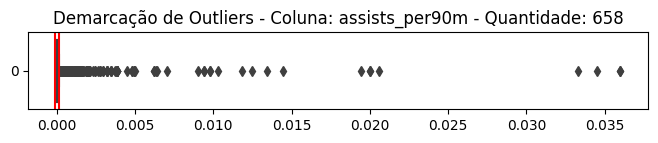



    OUTLIERS DA COLUNA goals_assists_per90m
Limite Inferior: -0.000 
Limite Superior: 0.001
Outliers da coluna "goals_assists_per90m": [0.000509149, 0.000509291, 0.000510096, 0.000510096, 0.000510096, 0.000510096, 0.000510894, 0.000510894, 0.000514194, 0.000514194, 0.000514412, 0.000514768, 0.000518084, 0.000518084, 0.000519591, 0.000519608, 0.000522581, 0.000522581, 0.000523743, 0.000524194, 0.000524194, 0.000526316, 0.000528109, 0.000528134, 0.000529986, 0.000529986, 0.000529986, 0.000529986, 0.00053012, 0.000530822, 0.000532688, 0.000533708, 0.00053407, 0.00053407, 0.00053407, 0.00053407, 0.000534483, 0.000534483, 0.000534483, 0.000534483, 0.000534483, 0.000534483, 0.000534483, 0.000534483, 0.00053528, 0.00053528, 0.000535948, 0.000537262, 0.000537262, 0.000538244, 0.000538244, 0.000539007, 0.00053913, 0.000539143, 0.000540541, 0.000540541, 0.000540541, 0.000541012, 0.000541205, 0.000541872, 0.000544554, 0.000544554, 0.000545596, 0.000546032, 0.000550055, 0.000551005, 0.000551005,

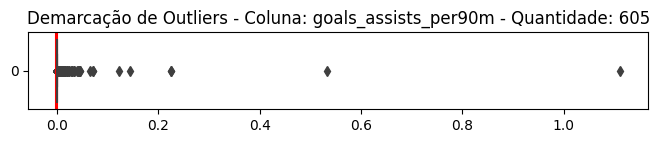



    OUTLIERS DA COLUNA goals_pens_per90m
Limite Inferior: -0.000 
Limite Superior: 0.000
Outliers da coluna "goals_pens_per90m": [0.000223285, 0.000223285, 0.000223285, 0.000223285, 0.000223384, 0.000223384, 0.000223438, 0.000223703, 0.000223928, 0.000223949, 0.000224398, 0.000224398, 0.000224467, 0.000224719, 0.000224972, 0.000224972, 0.000225443, 0.000225443, 0.000225443, 0.000225989, 0.000227001, 0.000227001, 0.000227182, 0.000227182, 0.000227687, 0.00022792, 0.000229508, 0.00023005, 0.000230203, 0.000230203, 0.000230203, 0.000230203, 0.000230863, 0.000231508, 0.000231508, 0.000231508, 0.000231508, 0.000231696, 0.000231696, 0.000232558, 0.000233161, 0.000233161, 0.000234807, 0.000234807, 0.000235768, 0.000235768, 0.000236072, 0.000236072, 0.000236626, 0.000238095, 0.000238764, 0.000238764, 0.000239521, 0.000239826, 0.000242215, 0.000242215, 0.000242326, 0.000243337, 0.000243337, 0.00024366, 0.000243902, 0.000244083, 0.0002443, 0.0002443, 0.000245353, 0.000245353, 0.000245536, 0.00

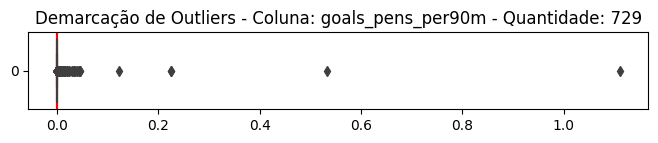



    OUTLIERS DA COLUNA goals_assists_pens_per90m
Limite Inferior: -0.000 
Limite Superior: 0.000
Outliers da coluna "goals_assists_pens_per90m": [0.000481586, 0.000481586, 0.000481928, 0.000481928, 0.000482759, 0.000483871, 0.000483871, 0.000483871, 0.000487239, 0.000487445, 0.000491037, 0.000491803, 0.000492958, 0.000493827, 0.000493827, 0.000494118, 0.000494118, 0.00049505, 0.000495283, 0.000495868, 0.000497512, 0.000497512, 0.000497866, 0.000498339, 0.000498339, 0.0005, 0.0005, 0.000500835, 0.000500835, 0.000501193, 0.000501193, 0.000502934, 0.000502934, 0.000502934, 0.000502934, 0.000503256, 0.000503356, 0.000503356, 0.000503455, 0.000507937, 0.000509291, 0.000510096, 0.000510096, 0.000510096, 0.000510096, 0.000510894, 0.000510894, 0.000514194, 0.000514194, 0.000514412, 0.000514768, 0.000518084, 0.000518084, 0.000519608, 0.000520521, 0.000524194, 0.000524194, 0.000528109, 0.000529986, 0.000529986, 0.000529986, 0.000529986, 0.00053012, 0.000530822, 0.000532688, 0.00053407, 0.00053

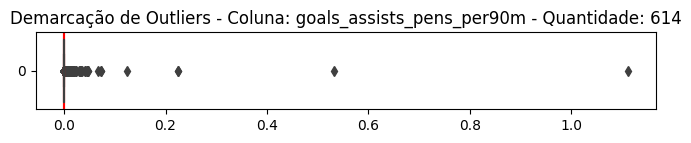



    OUTLIERS DA COLUNA xgm
Limite Inferior: -0.002 
Limite Superior: 0.005
Outliers da coluna "xgm": [0.004521118, 0.004521118, 0.004522613, 0.004526607, 0.004526607, 0.004528096, 0.004528096, 0.004532305, 0.004532305, 0.004535752, 0.004539106, 0.004541326, 0.004542373, 0.004545455, 0.004548685, 0.00455, 0.004571429, 0.004577465, 0.004583333, 0.004587561, 0.004590571, 0.004590571, 0.004590747, 0.004595588, 0.004619565, 0.004619565, 0.004622496, 0.004643449, 0.004643449, 0.004647256, 0.004647256, 0.004658722, 0.004664446, 0.004666667, 0.004666667, 0.004666667, 0.004666667, 0.004668125, 0.004668125, 0.004672897, 0.0046875, 0.004712042, 0.004712042, 0.004716227, 0.004716227, 0.004727535, 0.004727535, 0.004735883, 0.004746318, 0.004761905, 0.004772475, 0.00477327, 0.004778555, 0.004780702, 0.004789172, 0.004802867, 0.004804805, 0.004812207, 0.004814361, 0.004814361, 0.004819277, 0.004821151, 0.004821151, 0.004823686, 0.004823686, 0.004826863, 0.004826863, 0.004840484, 0.00487239, 0.00487

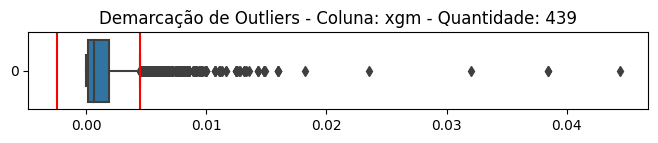



    OUTLIERS DA COLUNA npxgm
Limite Inferior: -0.002 
Limite Superior: 0.004
Outliers da coluna "npxgm": [0.004233227, 0.004233227, 0.004236006, 0.004237609, 0.004240688, 0.004255319, 0.004255319, 0.004287791, 0.004309927, 0.004309927, 0.004313725, 0.004313848, 0.004313848, 0.004322767, 0.004322767, 0.004331271, 0.004344828, 0.004347826, 0.004347826, 0.004355109, 0.004355109, 0.004360228, 0.004360228, 0.004361668, 0.004368359, 0.004368359, 0.004372158, 0.004372158, 0.004372556, 0.004372556, 0.004385965, 0.004385965, 0.004385965, 0.004398021, 0.004398021, 0.004399749, 0.00441989, 0.004426788, 0.004426788, 0.004435484, 0.004446503, 0.004446503, 0.004464286, 0.004464286, 0.004465593, 0.004465593, 0.004470199, 0.004470199, 0.004478898, 0.004478898, 0.004481547, 0.004481547, 0.004486252, 0.004486252, 0.004494382, 0.004505229, 0.004505229, 0.004506438, 0.004506438, 0.004517705, 0.004518072, 0.004520655, 0.004521118, 0.004521118, 0.004522613, 0.004535752, 0.004541326, 0.004542373, 0.0045454

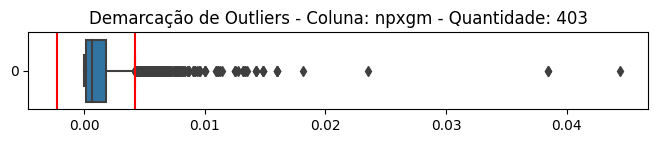



    OUTLIERS DA COLUNA xam
Limite Inferior: -0.002 
Limite Superior: 0.003
Outliers da coluna "xam": [0.003201635, 0.003215874, 0.003215874, 0.003218391, 0.003225806, 0.003227666, 0.003227666, 0.003254438, 0.003265306, 0.003265306, 0.003268482, 0.003280961, 0.003281853, 0.003285544, 0.003285544, 0.003314917, 0.003320101, 0.003320101, 0.003322476, 0.003324641, 0.003324808, 0.003333333, 0.003349282, 0.003370787, 0.003370787, 0.003374778, 0.003374778, 0.003377386, 0.003377386, 0.003409091, 0.003413353, 0.003413353, 0.003418182, 0.003418182, 0.003419689, 0.003439153, 0.003448276, 0.003454231, 0.003454231, 0.003466387, 0.003466387, 0.003469322, 0.003471698, 0.003471698, 0.003509979, 0.003522727, 0.003522727, 0.003531599, 0.003531599, 0.003534031, 0.003535083, 0.003535083, 0.003575298, 0.003589744, 0.003589744, 0.003624208, 0.003664921, 0.003664921, 0.003680982, 0.003680982, 0.003683113, 0.003683113, 0.003703704, 0.00371517, 0.0037271, 0.0037271, 0.003743546, 0.003743546, 0.003748438, 0.00

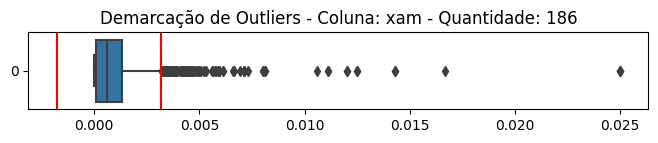



    OUTLIERS DA COLUNA xg_per90m
Limite Inferior: -0.000 
Limite Superior: 0.000
Outliers da coluna "xg_per90m": [0.000404624, 0.000405405, 0.00040553, 0.00040553, 0.00040553, 0.00040553, 0.000406504, 0.000406504, 0.000407125, 0.000407125, 0.000408163, 0.000410959, 0.00041129, 0.00041129, 0.000412044, 0.000412044, 0.000412574, 0.000412574, 0.000412844, 0.000412844, 0.000414079, 0.000414201, 0.000414909, 0.00041543, 0.000417827, 0.000417827, 0.00041847, 0.00041847, 0.000426136, 0.000426136, 0.000427746, 0.000429185, 0.000429185, 0.000430293, 0.00043222, 0.000433763, 0.000433763, 0.000434057, 0.000434783, 0.000434783, 0.000434783, 0.000436137, 0.000440967, 0.000441595, 0.00044226, 0.00044226, 0.000444444, 0.000444444, 0.000444444, 0.000447284, 0.000448143, 0.000448143, 0.000448718, 0.000448718, 0.000448833, 0.000448833, 0.000449294, 0.000449294, 0.000451207, 0.000451207, 0.000453461, 0.000454545, 0.000454545, 0.000454545, 0.000455038, 0.000456026, 0.000456919, 0.000457516, 0.000457516,

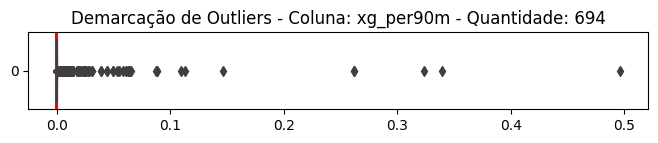



    OUTLIERS DA COLUNA xa_per90m
Limite Inferior: -0.000 
Limite Superior: 0.000
Outliers da coluna "xa_per90m": [0.000234899, 0.000235043, 0.000235641, 0.000235849, 0.000236128, 0.000236128, 0.000236686, 0.000236686, 0.000237288, 0.000238095, 0.000238095, 0.000238908, 0.000239521, 0.000239521, 0.000239521, 0.000239583, 0.000239651, 0.000239651, 0.00024024, 0.000240444, 0.000240444, 0.00024077, 0.00024077, 0.000241228, 0.000241228, 0.000242261, 0.000243085, 0.000243085, 0.000243085, 0.000243085, 0.000243363, 0.000243902, 0.000243902, 0.000243902, 0.000244328, 0.000244957, 0.000244957, 0.000245399, 0.000245399, 0.000245399, 0.000245614, 0.000245614, 0.000245902, 0.000245902, 0.000245902, 0.000246154, 0.000247312, 0.000247934, 0.000248834, 0.000248834, 0.00025, 0.00025, 0.00025, 0.00025, 0.000250329, 0.000251256, 0.000252101, 0.000252809, 0.000253165, 0.000254958, 0.000254958, 0.000255319, 0.000255319, 0.000255319, 0.000255403, 0.000255864, 0.000255864, 0.000256822, 0.000257511, 0.0002

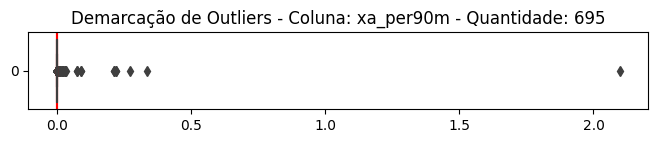



    OUTLIERS DA COLUNA xg_xa_per90m
Limite Inferior: -0.000 
Limite Superior: 0.001
Outliers da coluna "xg_xa_per90m": [0.000704225, 0.000704961, 0.000706522, 0.000706522, 0.000707395, 0.000707395, 0.000708383, 0.000708383, 0.000709677, 0.000710157, 0.000710157, 0.000710723, 0.000710723, 0.000712074, 0.000712074, 0.000714286, 0.000715005, 0.000715775, 0.000715775, 0.000716418, 0.000718016, 0.000718016, 0.000718016, 0.000718016, 0.000718085, 0.000718133, 0.000718133, 0.000718816, 0.000723861, 0.000723861, 0.000724638, 0.000724638, 0.000726172, 0.000727273, 0.000728863, 0.000731707, 0.000732861, 0.000733591, 0.0007393, 0.000740741, 0.000740741, 0.000743494, 0.000749186, 0.00075, 0.00075, 0.000752089, 0.000752089, 0.000752212, 0.000753012, 0.000753012, 0.000755556, 0.000761347, 0.000764706, 0.000765472, 0.000765472, 0.00076555, 0.00076555, 0.000765896, 0.000765896, 0.000766129, 0.000770428, 0.000771277, 0.000771402, 0.000774278, 0.000774818, 0.000777143, 0.000777605, 0.000777605, 0.0007

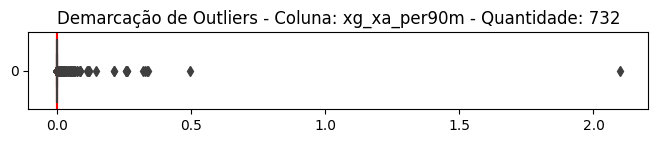



    OUTLIERS DA COLUNA npxg_per90m
Limite Inferior: -0.000 
Limite Superior: 0.000
Outliers da coluna "npxg_per90m": [0.000378378, 0.000378788, 0.000379198, 0.000379747, 0.000381282, 0.000381282, 0.000381558, 0.000381558, 0.000382514, 0.000382514, 0.000383212, 0.000383387, 0.000383387, 0.000385542, 0.000385638, 0.000385638, 0.000385638, 0.000385638, 0.000389105, 0.000389105, 0.000389105, 0.000389163, 0.000389805, 0.000390516, 0.000393701, 0.000393701, 0.000396197, 0.000396601, 0.000396601, 0.000396601, 0.000396601, 0.00039801, 0.00039823, 0.000398293, 0.000398293, 0.0004, 0.0004, 0.000401929, 0.00040404, 0.00040404, 0.000404624, 0.000405405, 0.00040553, 0.00040553, 0.00040553, 0.00040553, 0.000406504, 0.000406504, 0.000407125, 0.000407125, 0.000408163, 0.000408859, 0.000410959, 0.00041129, 0.00041129, 0.000412044, 0.000412044, 0.000412574, 0.000412574, 0.000412844, 0.000412844, 0.000412926, 0.000412926, 0.000413223, 0.000414201, 0.00041543, 0.000417827, 0.000417827, 0.00041847, 0.000

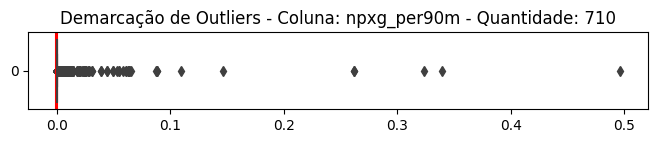



    OUTLIERS DA COLUNA npxg_xa_per90m
Limite Inferior: -0.000 
Limite Superior: 0.001
Outliers da coluna "npxg_xa_per90m": [0.000685413, 0.000685413, 0.000687679, 0.000689655, 0.000689655, 0.000689655, 0.000691489, 0.000691489, 0.000692641, 0.000692641, 0.000697674, 0.000697674, 0.000697674, 0.000697674, 0.000697917, 0.000699223, 0.000702087, 0.000702087, 0.000702447, 0.000704225, 0.000706349, 0.000706522, 0.000706522, 0.000707395, 0.000707395, 0.000708383, 0.000708383, 0.000709677, 0.000710723, 0.000710723, 0.000712074, 0.000712074, 0.000714286, 0.000715005, 0.000716418, 0.000718085, 0.000718133, 0.000718133, 0.000718816, 0.000723861, 0.000723861, 0.000724638, 0.000724638, 0.000725894, 0.000726172, 0.000727273, 0.000728863, 0.000731518, 0.000731707, 0.000732861, 0.000733591, 0.0007393, 0.000740741, 0.000740741, 0.000743494, 0.000749186, 0.00075, 0.00075, 0.000752089, 0.000752089, 0.000752212, 0.000753012, 0.000753012, 0.000754717, 0.000755556, 0.000761347, 0.000764706, 0.000765472, 

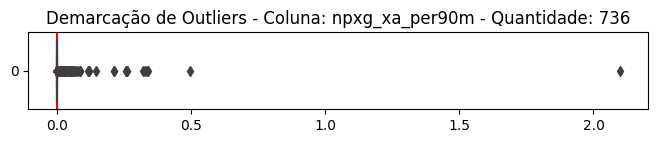



    OUTLIERS DA COLUNA minutes_90sm
Limite Inferior: 0.011 
Limite Superior: 0.011
Outliers da coluna "minutes_90sm": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.74e-05, 9.52e-05, 0.000171013, 0.000391645, 0.00042508, 0.000444444, 0.000716846, 0.000941094, 0.001059002, 0.001140251, 0.001149425, 0.001743679, 0.001886792, 0.002222222, 0.003081664, 0.003937947, 0.004292237, 0.004839765, 0.004956268, 0.005, 0.005467626, 0.006073753, 0.00722135, 0.007692308, 0.007692308, 0.007692308, 0.007692308, 0.007692308, 0.007692308, 0.007692308, 0.007692308, 0.007692308, 0.007692308, 0.007692308, 0.007692308, 0.007692308, 0.008333333, 0.008333333, 0.008333333, 0.008333333, 0.008333333, 0.008333333, 0.008333333, 0.008333333, 0.008333333, 0.008333

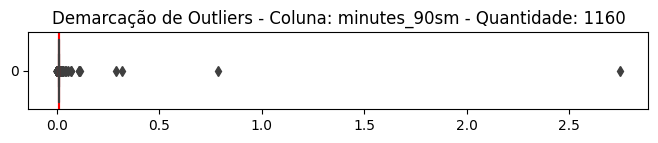



    OUTLIERS DA COLUNA shots_totalm
Limite Inferior: -0.022 
Limite Superior: 0.046
Outliers da coluna "shots_totalm": [0.046129162, 0.046153846, 0.046162104, 0.046162104, 0.046255507, 0.046280992, 0.046403712, 0.046511628, 0.046542553, 0.046542553, 0.046542553, 0.046542553, 0.046666667, 0.046668921, 0.046668921, 0.046744574, 0.046744574, 0.046852123, 0.047029703, 0.047043011, 0.047169811, 0.047619048, 0.047619048, 0.047619048, 0.047619048, 0.047619048, 0.047619048, 0.047619048, 0.047619048, 0.047986987, 0.047986987, 0.048558422, 0.048568322, 0.048707156, 0.048717949, 0.048717949, 0.048744461, 0.048780488, 0.048780488, 0.049586777, 0.049755302, 0.05, 0.05, 0.05, 0.05, 0.050246305, 0.050251256, 0.050275482, 0.050569801, 0.050632911, 0.050814332, 0.051580699, 0.051580699, 0.051643192, 0.051643192, 0.052631579, 0.053472222, 0.053571429, 0.053921569, 0.053921569, 0.054054054, 0.054054054, 0.054054054, 0.055555556, 0.055555556, 0.055957549, 0.055957549, 0.056451613, 0.057142857, 0.0573476

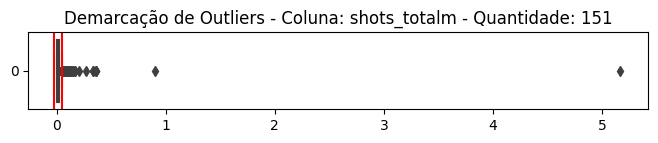



    OUTLIERS DA COLUNA shots_on_targetm
Limite Inferior: -0.010 
Limite Superior: 0.016
Outliers da coluna "shots_on_targetm": [0.016470588, 0.016470588, 0.016483516, 0.016528926, 0.016570849, 0.016570849, 0.01663586, 0.01663586, 0.016650343, 0.016666667, 0.016673444, 0.016673444, 0.016695958, 0.016695958, 0.016806723, 0.016806723, 0.016806723, 0.016806723, 0.016830295, 0.016830295, 0.016835017, 0.016949153, 0.016949153, 0.016970459, 0.017003188, 0.017003188, 0.017003188, 0.017003188, 0.017094017, 0.017128874, 0.017137961, 0.017137961, 0.017142857, 0.017142857, 0.017148982, 0.017191977, 0.017199017, 0.017217631, 0.01727542, 0.017326733, 0.017326733, 0.017326733, 0.017357223, 0.017357223, 0.01754386, 0.01754386, 0.01755618, 0.017589577, 0.017610497, 0.017610497, 0.017647059, 0.017647059, 0.017649418, 0.017665615, 0.017711172, 0.017761989, 0.017761989, 0.017857143, 0.017857143, 0.017870439, 0.017870439, 0.017910448, 0.017910448, 0.017948718, 0.017948718, 0.017964072, 0.01816118, 0.0181

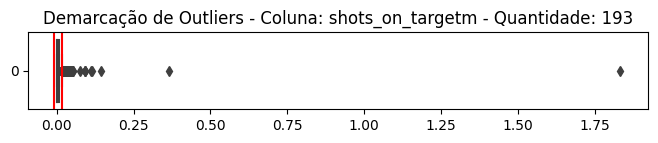



    OUTLIERS DA COLUNA shots_free_kicksm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "shots_free_kicksm": [0.000292398, 0.000295508, 0.000295508, 0.000308642, 0.000308642, 0.000308737, 0.000309215, 0.000309215, 0.00030931, 0.000312989, 0.000312989, 0.00031736, 0.00031736, 0.00031837, 0.000318573, 0.000321854, 0.000321854, 0.000323415, 0.000326691, 0.000326691, 0.000329056, 0.000329815, 0.000329815, 0.000329924, 0.000329924, 0.000330142, 0.000332889, 0.000332889, 0.000333667, 0.000333667, 0.000335683, 0.000335683, 0.00034153, 0.00034153, 0.00034188, 0.00034188, 0.000344828, 0.000344828, 0.000349773, 0.000349773, 0.000354108, 0.000354108, 0.000359454, 0.000359842, 0.000359842, 0.000360881, 0.000360881, 0.000364697, 0.000367512, 0.000367647, 0.00036914, 0.00036914, 0.000371333, 0.000371333, 0.000374111, 0.000374813, 0.000375235, 0.000375235, 0.000377216, 0.000377358, 0.000377358, 0.000386698, 0.000386698, 0.000392311, 0.000392465, 0.000395257, 0.000397931, 0.000399

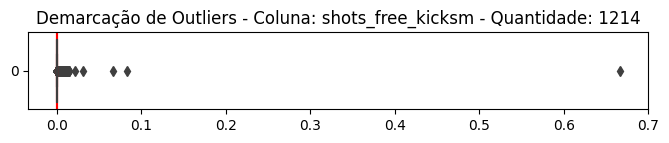



    OUTLIERS DA COLUNA shots_on_target_pctm
Limite Inferior: -0.045 
Limite Superior: 0.075
Outliers da coluna "shots_on_target_pctm": [0.074663677, 0.074663677, 0.075033738, 0.075339367, 0.075757576, 0.075757576, 0.076027397, 0.07629705, 0.076376147, 0.076470588, 0.076513761, 0.076551724, 0.076683087, 0.076804916, 0.076804916, 0.076804916, 0.076804916, 0.077262693, 0.077262693, 0.07744186, 0.07744186, 0.07751938, 0.07751938, 0.077717391, 0.077717391, 0.077758319, 0.077980132, 0.077980132, 0.078492936, 0.078988942, 0.078988942, 0.079239303, 0.079239303, 0.079365079, 0.079365079, 0.079491256, 0.079637378, 0.08, 0.080042017, 0.080042017, 0.080042017, 0.080042017, 0.080434783, 0.080434783, 0.080775444, 0.081008902, 0.08125, 0.081433225, 0.081617647, 0.082183908, 0.082222222, 0.082222222, 0.082341651, 0.08374761, 0.08374761, 0.084033613, 0.084033613, 0.084745763, 0.084745763, 0.084889643, 0.084889643, 0.085076531, 0.085251492, 0.085251492, 0.085470085, 0.085470085, 0.085592011, 0.0855920

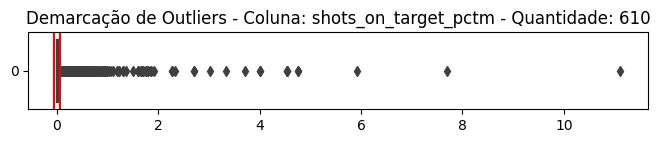



    OUTLIERS DA COLUNA shots_total_per90m
Limite Inferior: -0.002 
Limite Superior: 0.004
Outliers da coluna "shots_total_per90m": [0.004114833, 0.004121622, 0.004121622, 0.004136858, 0.004136858, 0.00414966, 0.00414966, 0.00416, 0.00416, 0.00416, 0.00416, 0.004165029, 0.004178273, 0.004188742, 0.004188742, 0.004202899, 0.004202899, 0.004202899, 0.004202899, 0.004208675, 0.004208675, 0.004208955, 0.004208955, 0.004209486, 0.004209486, 0.004212329, 0.004230288, 0.004246575, 0.004246575, 0.004269663, 0.004275862, 0.004279412, 0.004293948, 0.004293948, 0.004300518, 0.004300518, 0.004303406, 0.004303406, 0.004305556, 0.004305556, 0.004318618, 0.00432, 0.004340278, 0.004340278, 0.004346591, 0.004346591, 0.004368421, 0.004368421, 0.004389881, 0.004405594, 0.004405594, 0.00441331, 0.00441331, 0.00441331, 0.00441331, 0.004438406, 0.004438406, 0.004441687, 0.004442191, 0.004442191, 0.004451697, 0.004451697, 0.004451697, 0.004451697, 0.004454023, 0.004468085, 0.004468085, 0.004471545, 0.004471

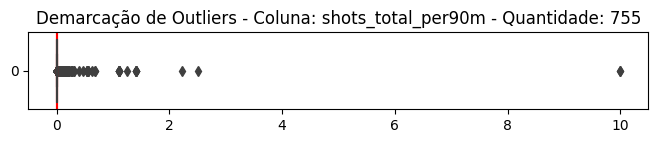



    OUTLIERS DA COLUNA shots_on_target_per90m
Limite Inferior: -0.001 
Limite Superior: 0.001
Outliers da coluna "shots_on_target_per90m": [0.001164875, 0.001164875, 0.001166667, 0.001166667, 0.001166667, 0.001167513, 0.001171171, 0.00117258, 0.001174458, 0.001174458, 0.001175468, 0.001176061, 0.001176061, 0.001176471, 0.001181001, 0.001181001, 0.001183317, 0.001183317, 0.001183432, 0.00119225, 0.001198809, 0.001198809, 0.001199245, 0.001199245, 0.0012, 0.0012, 0.001202346, 0.001202346, 0.00120438, 0.00120438, 0.00120438, 0.001205847, 0.001212575, 0.001212575, 0.001213235, 0.00121547, 0.00121547, 0.001222222, 0.001222222, 0.001222222, 0.001222222, 0.001222222, 0.001222222, 0.001223958, 0.001226766, 0.001247059, 0.001247312, 0.00124792, 0.00124792, 0.00125, 0.00125, 0.001251476, 0.001251476, 0.001251647, 0.001251647, 0.0012527, 0.0012527, 0.001256281, 0.001256281, 0.001256281, 0.001256281, 0.001264205, 0.001264205, 0.001269841, 0.001269841, 0.001275168, 0.001275168, 0.001276596, 0.001

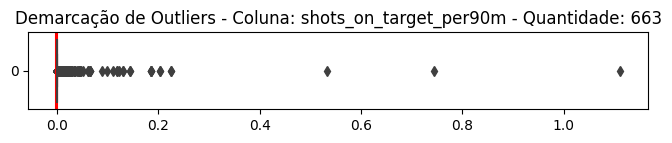



    OUTLIERS DA COLUNA goals_per_shotm
Limite Inferior: -0.000 
Limite Superior: 0.000
Outliers da coluna "goals_per_shotm": [0.000156775, 0.000157005, 0.000157005, 0.000157005, 0.000157005, 0.000157068, 0.000157171, 0.000157218, 0.000157553, 0.000157553, 0.000157807, 0.000157807, 0.000158014, 0.000158014, 0.000158103, 0.000158103, 0.000158192, 0.00015873, 0.00015873, 0.00015873, 0.000159091, 0.000159236, 0.000159236, 0.000159635, 0.000159635, 0.000159872, 0.000159872, 0.000160428, 0.000160772, 0.000160819, 0.000160944, 0.000160944, 0.00016129, 0.00016129, 0.000162602, 0.000162602, 0.000162963, 0.000162963, 0.00016317, 0.000163551, 0.000163652, 0.000163652, 0.000163666, 0.000163666, 0.000164093, 0.000164745, 0.000164745, 0.000165165, 0.00016538, 0.00016558, 0.000165631, 0.000166482, 0.000166667, 0.000166865, 0.000166865, 0.000166865, 0.000166994, 0.000167064, 0.000167939, 0.000167939, 0.000168176, 0.000168986, 0.000169082, 0.000169082, 0.000169082, 0.000169082, 0.000169101, 0.0001694

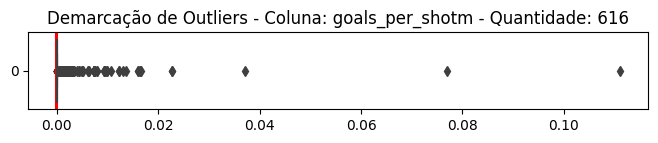



    OUTLIERS DA COLUNA goals_per_shot_on_targetm
Limite Inferior: -0.000 
Limite Superior: 0.000
Outliers da coluna "goals_per_shot_on_targetm": [0.000484027, 0.000484027, 0.000487329, 0.000487329, 0.000488082, 0.000488082, 0.000488166, 0.000488166, 0.000488636, 0.000489796, 0.000489796, 0.000490196, 0.000490196, 0.000490196, 0.000490724, 0.000490724, 0.000491803, 0.000492285, 0.000494012, 0.000494012, 0.000494071, 0.00049505, 0.00049505, 0.00049505, 0.00049505, 0.000495868, 0.000497018, 0.000500373, 0.000500373, 0.000500373, 0.000500373, 0.000500759, 0.000500759, 0.000502513, 0.000502513, 0.000503271, 0.000503271, 0.000505561, 0.000505561, 0.000507099, 0.000507099, 0.000507463, 0.000507463, 0.000507614, 0.000508629, 0.000510204, 0.000510753, 0.000511841, 0.000512821, 0.000512821, 0.000516393, 0.000517241, 0.000517331, 0.000517331, 0.000518672, 0.000518868, 0.000519031, 0.000519031, 0.000521921, 0.00052356, 0.000528808, 0.000528808, 0.000530223, 0.000530547, 0.000531746, 0.000531746,

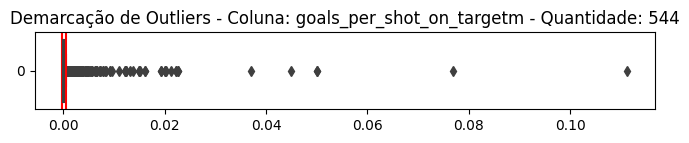



    OUTLIERS DA COLUNA npxg_per_shotm
Limite Inferior: -0.000 
Limite Superior: 0.000
Outliers da coluna "npxg_per_shotm": [0.000218978, 0.000220264, 0.000220588, 0.000220994, 0.000221675, 0.000222222, 0.000222222, 0.000222222, 0.000222222, 0.000222222, 0.000222222, 0.000222222, 0.000222841, 0.000222841, 0.000222841, 0.000223152, 0.000223529, 0.000223642, 0.000225989, 0.000225989, 0.000225989, 0.000226655, 0.000226757, 0.000226757, 0.000227273, 0.000227273, 0.000227273, 0.000227723, 0.000227723, 0.000228013, 0.000228013, 0.000228571, 0.000229167, 0.000229167, 0.000229885, 0.000231214, 0.000231214, 0.000231214, 0.000231214, 0.000233333, 0.000233702, 0.000234375, 0.000234375, 0.000234742, 0.000235294, 0.000235294, 0.000235294, 0.000236686, 0.000238663, 0.000239234, 0.000239234, 0.000240518, 0.000240518, 0.00024055, 0.000240964, 0.000240964, 0.000241546, 0.000241546, 0.000241546, 0.000241546, 0.000242656, 0.000242954, 0.000243363, 0.000243665, 0.000243902, 0.000244328, 0.000245098, 0.00

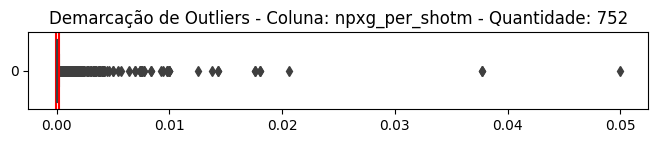



    OUTLIERS DA COLUNA xg_netm
Limite Inferior: -0.001 
Limite Superior: 0.001
Outliers da coluna "xg_netm": [-0.038461538, -0.038461538, -0.028571429, -0.024242424, -0.023529412, -0.018181818, -0.016, -0.016, -0.016, -0.016, -0.014851485, -0.014814815, -0.014285714, -0.014285714, -0.014285714, -0.0125, -0.0125, -0.0125, -0.011111111, -0.011111111, -0.01, -0.01, -0.009473684, -0.009433962, -0.009090909, -0.009090909, -0.009090909, -0.008571429, -0.008333333, -0.008108108, -0.008108108, -0.008108108, -0.007894737, -0.007894737, -0.007885305, -0.0078125, -0.007692308, -0.007692308, -0.007692308, -0.007462687, -0.007462687, -0.006818182, -0.006818182, -0.006382979, -0.00625, -0.00625, -0.006153846, -0.006077348, -0.005950413, -0.005839416, -0.005839416, -0.005785124, -0.00562249, -0.005555556, -0.005555556, -0.005555556, -0.005555556, -0.005555556, -0.005405405, -0.005405405, -0.005084746, -0.005084746, -0.005020921, -0.005017921, -0.004878049, -0.004761905, -0.004761905, -0.004761905, 

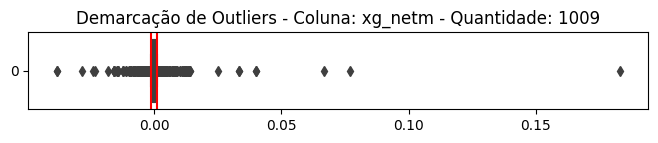



    OUTLIERS DA COLUNA npxg_netm
Limite Inferior: -0.001 
Limite Superior: 0.001
Outliers da coluna "npxg_netm": [-0.038461538, -0.038461538, -0.028571429, -0.024242424, -0.023529412, -0.018181818, -0.016, -0.016, -0.016, -0.016, -0.014851485, -0.014814815, -0.014285714, -0.014285714, -0.014285714, -0.0125, -0.0125, -0.0125, -0.011111111, -0.011111111, -0.01, -0.01, -0.009090909, -0.009090909, -0.009090909, -0.008571429, -0.008333333, -0.008108108, -0.008108108, -0.008108108, -0.007894737, -0.007894737, -0.007885305, -0.0078125, -0.007692308, -0.007692308, -0.007692308, -0.007462687, -0.007462687, -0.006818182, -0.006818182, -0.006446281, -0.006382979, -0.00625, -0.00625, -0.006153846, -0.005839416, -0.005839416, -0.005785124, -0.00562249, -0.005555556, -0.005555556, -0.005555556, -0.005555556, -0.005555556, -0.005405405, -0.005405405, -0.005263158, -0.005084746, -0.005084746, -0.005025126, -0.005020921, -0.004878049, -0.0046875, -0.004577465, -0.004551046, -0.004545455, -0.004494382

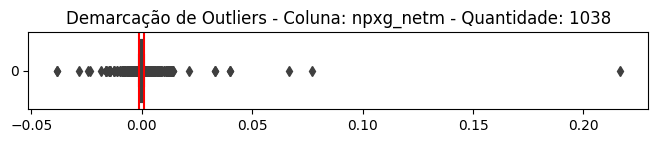



    OUTLIERS DA COLUNA passes_completedm
Limite Inferior: -0.123 
Limite Superior: 0.858
Outliers da coluna "passes_completedm": [0.860962567, 0.863636364, 0.865862314, 0.866122449, 0.866666667, 0.869760479, 0.874366197, 0.874366197, 0.875239006, 0.880693069, 0.880952381, 0.885186853, 0.885186853, 0.888082275, 0.888888889, 0.889235569, 0.8933685, 0.8933685, 0.900720576, 0.904142973, 0.904142973, 0.908045977, 0.908244681, 0.911571025, 0.911571025, 0.913580247, 0.913640824, 0.913640824, 0.916613622, 0.916666667, 0.916666667, 0.916666667, 0.916666667, 0.92, 0.920751634, 0.920751634, 0.927927928, 0.931112366, 0.933106576, 0.933106576, 0.934911243, 0.934911243, 0.935148118, 0.935148118, 0.935275081, 0.935275081, 0.938783729, 0.938871473, 0.945652174, 0.945652174, 0.948951686, 0.950433705, 0.950433705, 0.950522928, 0.954482759, 0.954482759, 0.95463138, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.006578947, 1.010111762, 1.010111762, 1.011

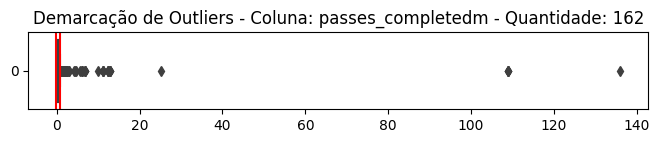



    OUTLIERS DA COLUNA passesm
Limite Inferior: -0.040 
Limite Superior: 0.985
Outliers da coluna "passesm": [0.985888993, 0.985888993, 0.986961451, 0.986961451, 0.988562092, 0.988562092, 0.990196078, 0.990196078, 0.990513575, 0.990513575, 0.991181102, 0.991993595, 0.992117709, 0.99234579, 0.99234579, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.00566343, 1.00566343, 1.010290987, 1.014242116, 1.015496809, 1.015873016, 1.020514883, 1.020833333, 1.033244681, 1.035916824, 1.038961039, 1.040676601, 1.043234588, 1.043234588, 1.044444444, 1.044444444, 1.045517241, 1.045517241, 1.051051051, 1.056426332, 1.056818182, 1.072222222, 1.072222222, 1.072222222, 1.072222222, 1.076086957, 1.076086957, 1.079306072, 1.079306072, 1.088495575, 1.088495575, 1.088495575, 1.088495575, 1.111761575, 1.111761575, 1.121621622, 1.157894737, 1.16246742, 1.16246742, 1.166666667, 1.169365722, 1.195402299, 1.2, 1.25, 1.25, 1.26, 1.327586207, 1.333333333, 1.37

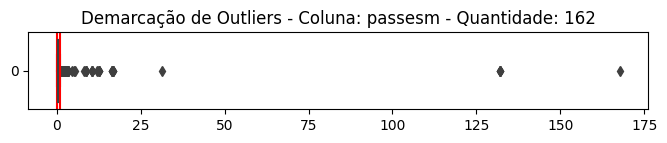



    OUTLIERS DA COLUNA passes_pctm
Limite Inferior: -0.140 
Limite Superior: 0.329
Outliers da coluna "passes_pctm": [0.329186603, 0.329186603, 0.33030303, 0.330487805, 0.331147541, 0.331858407, 0.331858407, 0.332160804, 0.335185185, 0.335576923, 0.335576923, 0.335983264, 0.336956522, 0.336956522, 0.336956522, 0.336956522, 0.337755102, 0.338157895, 0.340277778, 0.340277778, 0.340740741, 0.340772532, 0.340772532, 0.340856031, 0.340856031, 0.341037736, 0.341037736, 0.341401274, 0.341401274, 0.341702128, 0.341949153, 0.342424242, 0.342424242, 0.343461538, 0.343461538, 0.344247788, 0.344247788, 0.348587571, 0.349090909, 0.349090909, 0.35, 0.351923077, 0.353744493, 0.353744493, 0.354237288, 0.354237288, 0.354618474, 0.355, 0.355232558, 0.355232558, 0.355232558, 0.355232558, 0.355510204, 0.355510204, 0.357512953, 0.357512953, 0.357777778, 0.358293839, 0.358293839, 0.36, 0.36, 0.361632653, 0.361632653, 0.362173913, 0.362173913, 0.363035019, 0.364444444, 0.364444444, 0.36504065, 0.36504065, 

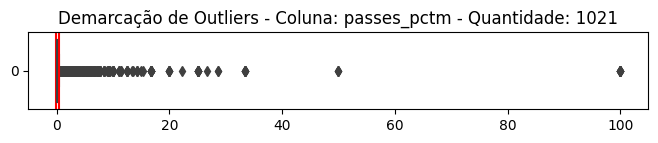



    OUTLIERS DA COLUNA passes_total_distancem
Limite Inferior: -2.697 
Limite Superior: 16.778
Outliers da coluna "passes_total_distancem": [16.83257919, 16.87530477, 16.87530477, 16.87777778, 16.87777778, 16.87777778, 16.87777778, 16.96349206, 16.96349206, 16.96349206, 16.96349206, 16.96349206, 16.96349206, 16.99703012, 17.08858931, 17.08858931, 17.09868421, 17.12199546, 17.12199546, 17.13532018, 17.20282828, 17.22128378, 17.24287485, 17.24287485, 17.25735797, 17.25735797, 17.31641914, 17.38421734, 17.39475219, 17.4244373, 17.4244373, 17.45145019, 17.48837209, 17.5, 17.53333333, 17.59172355, 17.74093567, 17.87766323, 17.87766323, 17.88630905, 17.88630905, 17.96307094, 17.96352994, 17.96352994, 18.05405405, 18.05405405, 18.06666667, 18.12359551, 18.14265436, 18.23167849, 18.23167849, 18.2388664, 18.26257348, 18.28173147, 18.38835795, 18.38835795, 18.425, 18.44764289, 18.45679012, 18.7798574, 18.86589271, 18.88435374, 18.88435374, 19.11578947, 19.19024857, 19.20555556, 19.21485261, 19

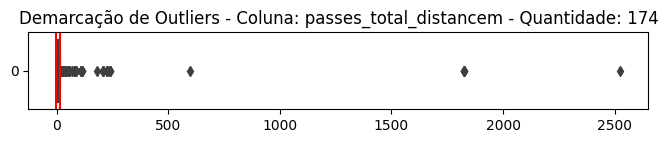



    OUTLIERS DA COLUNA passes_progressive_distancem
Limite Inferior: -2.121 
Limite Superior: 6.703
Outliers da coluna "passes_progressive_distancem": [6.716612378, 6.716612378, 6.716612378, 6.716612378, 6.717647059, 6.762452107, 6.762452107, 6.762858265, 6.766031746, 6.793266391, 6.793266391, 6.797777778, 6.819883041, 6.819883041, 6.849206349, 6.849206349, 6.891830065, 6.909356725, 6.909356725, 6.920353982, 6.920353982, 6.920353982, 6.920353982, 6.946564885, 6.965204678, 6.965204678, 6.977777778, 6.977777778, 6.984126984, 6.984126984, 6.991414141, 7.0, 7.005063291, 7.083333333, 7.083333333, 7.090179123, 7.122222222, 7.137254902, 7.137254902, 7.158479532, 7.158479532, 7.19205298, 7.22, 7.244444444, 7.244444444, 7.245555556, 7.245555556, 7.336213103, 7.336213103, 7.385185185, 7.385185185, 7.4, 7.4, 7.425925926, 7.433333333, 7.434567901, 7.444444444, 7.496296296, 7.633333333, 7.633333333, 7.746153846, 7.746153846, 7.80609319, 7.80609319, 8.012938372, 8.012938372, 8.125, 8.125, 8.288524

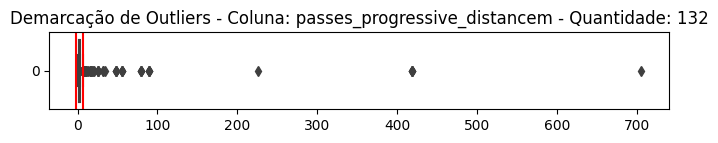



    OUTLIERS DA COLUNA passes_completed_shortm
Limite Inferior: -0.055 
Limite Superior: 0.364
Outliers da coluna "passes_completed_shortm": [0.365813377, 0.366040956, 0.366666667, 0.366666667, 0.366863905, 0.366863905, 0.367549669, 0.368421053, 0.36935167, 0.36935167, 0.370588235, 0.371158392, 0.371391918, 0.371391918, 0.371912491, 0.371912491, 0.37191358, 0.37325529, 0.37325529, 0.373931624, 0.373931624, 0.375, 0.375, 0.375565611, 0.375976563, 0.378422782, 0.378787879, 0.378787879, 0.378787879, 0.378787879, 0.379194631, 0.379194631, 0.381556684, 0.382081686, 0.383173678, 0.383173678, 0.385550304, 0.385777218, 0.386363636, 0.386363636, 0.386633663, 0.386677498, 0.386677498, 0.386925795, 0.386925795, 0.387434555, 0.388888889, 0.388888889, 0.388888889, 0.388888889, 0.392592593, 0.393491124, 0.393915132, 0.393915132, 0.396634615, 0.396634615, 0.4, 0.4, 0.4, 0.400247831, 0.400247831, 0.402453988, 0.403508772, 0.403508772, 0.403574788, 0.403574788, 0.407407407, 0.408163265, 0.408163265, 

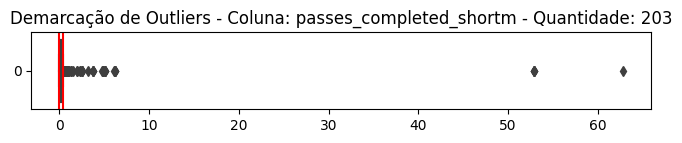



    OUTLIERS DA COLUNA passes_shortm
Limite Inferior: -0.041 
Limite Superior: 0.402
Outliers da coluna "passes_shortm": [0.402006173, 0.402146986, 0.402985075, 0.403508772, 0.403508772, 0.404040404, 0.404170804, 0.404549147, 0.404549147, 0.406996587, 0.407407407, 0.409090909, 0.410519564, 0.410519564, 0.410774411, 0.411111111, 0.411111111, 0.41213832, 0.41213832, 0.413931145, 0.413931145, 0.41442953, 0.41442953, 0.414814815, 0.415259959, 0.416336634, 0.418445429, 0.418467583, 0.418467583, 0.418945313, 0.422275641, 0.422275641, 0.423329682, 0.423791822, 0.423791822, 0.423861852, 0.423861852, 0.424063116, 0.424166142, 0.424242424, 0.425213675, 0.425213675, 0.427777778, 0.427777778, 0.427777778, 0.427777778, 0.428220859, 0.428987922, 0.428987922, 0.429292929, 0.429292929, 0.431372549, 0.431796802, 0.431796802, 0.43639576, 0.43639576, 0.437291369, 0.438228438, 0.443181818, 0.443181818, 0.443181818, 0.443181818, 0.444444444, 0.446153846, 0.450626959, 0.450661241, 0.451086957, 0.451086957

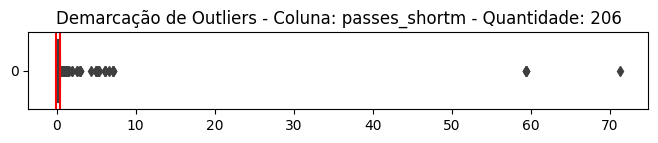



    OUTLIERS DA COLUNA passes_pct_shortm
Limite Inferior: -0.147 
Limite Superior: 0.349
Outliers da coluna "passes_pct_shortm": [0.35037037, 0.351851852, 0.353191489, 0.353191489, 0.354112554, 0.355252918, 0.35678392, 0.357142857, 0.35745614, 0.358050847, 0.358203125, 0.358422939, 0.359116022, 0.360330579, 0.360330579, 0.361032864, 0.361032864, 0.361445783, 0.3628, 0.364285714, 0.365714286, 0.365714286, 0.366122449, 0.366122449, 0.366233766, 0.366233766, 0.367788462, 0.36848249, 0.36848249, 0.369339623, 0.369339623, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.370555556, 0.370555556, 0.370901639, 0.370995671, 0.37133758, 0.37133758, 0.372532189, 0.372532189, 0.374042553, 0.374093264, 0.374093264, 0.374796748, 0.374796748, 0.375221239, 0.378636364, 0.378636364, 0.379146919, 0.379146919, 0.379574468, 0.379574468, 0

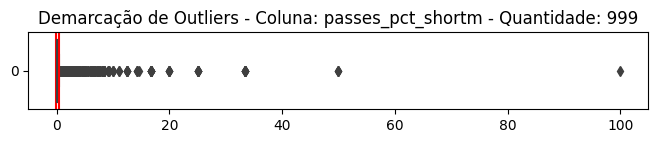



    OUTLIERS DA COLUNA passes_completed_mediumm
Limite Inferior: -0.103 
Limite Superior: 0.408
Outliers da coluna "passes_completed_mediumm": [0.407993339, 0.408232119, 0.409070295, 0.409070295, 0.41135108, 0.41135108, 0.411604714, 0.412399861, 0.412399861, 0.412969283, 0.413580247, 0.413875598, 0.417182131, 0.417182131, 0.417934347, 0.417934347, 0.419230769, 0.419230769, 0.419298246, 0.419491525, 0.419491525, 0.42122449, 0.422257301, 0.422257301, 0.423559983, 0.426155116, 0.427899687, 0.428782506, 0.428782506, 0.428796637, 0.429319372, 0.431203931, 0.431228206, 0.431906615, 0.431906615, 0.432432432, 0.432432432, 0.43308865, 0.43537415, 0.43537415, 0.437037037, 0.437799043, 0.438888889, 0.438888889, 0.438888889, 0.438888889, 0.439564181, 0.439564181, 0.440162272, 0.440162272, 0.440335494, 0.440335494, 0.441176471, 0.441502167, 0.441502167, 0.442176871, 0.443841983, 0.444791667, 0.445652174, 0.445652174, 0.446636481, 0.448275862, 0.449122807, 0.449728828, 0.451304901, 0.454143202, 0.

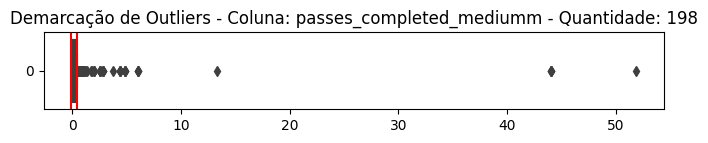



    OUTLIERS DA COLUNA passes_mediumm
Limite Inferior: -0.093 
Limite Superior: 0.456
Outliers da coluna "passes_mediumm": [0.457390467, 0.457390467, 0.459183673, 0.459183673, 0.459375, 0.459397636, 0.459397636, 0.460674157, 0.46188594, 0.462184874, 0.464088398, 0.464088398, 0.464747736, 0.466216216, 0.466216216, 0.466507177, 0.466581795, 0.466666667, 0.466666667, 0.466666667, 0.466666667, 0.467176802, 0.469387755, 0.469387755, 0.469403563, 0.469574037, 0.469574037, 0.470817121, 0.470817121, 0.471569629, 0.471569629, 0.473049075, 0.473282443, 0.473282443, 0.473391813, 0.475218659, 0.476011681, 0.47667087, 0.477777778, 0.477777778, 0.477777778, 0.477777778, 0.479623824, 0.479768786, 0.484650555, 0.4875, 0.4875, 0.487990392, 0.488372093, 0.48966332, 0.48966332, 0.493877551, 0.496666667, 0.498217469, 0.5, 0.5, 0.5, 0.50170068, 0.50170068, 0.502369668, 0.503040834, 0.503040834, 0.503391108, 0.503391108, 0.505747126, 0.508659982, 0.509481038, 0.510869565, 0.510869565, 0.513071895, 0.51307

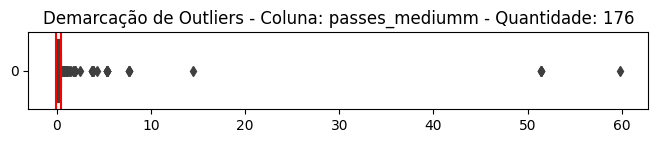



    OUTLIERS DA COLUNA passes_pct_mediumm
Limite Inferior: -0.139 
Limite Superior: 0.331
Outliers da coluna "passes_pct_mediumm": [0.333450704, 0.333450704, 0.3335, 0.3335, 0.33390411, 0.334728033, 0.334728033, 0.334728033, 0.334728033, 0.335175879, 0.335175879, 0.335175879, 0.335175879, 0.335555556, 0.3356, 0.335744681, 0.335744681, 0.336434109, 0.336769759, 0.33677686, 0.337089202, 0.339405204, 0.34025974, 0.340265487, 0.342051282, 0.342687747, 0.344444444, 0.344736842, 0.344827586, 0.345188285, 0.345188285, 0.345188285, 0.345188285, 0.346428571, 0.349344978, 0.349344978, 0.349344978, 0.349344978, 0.352192982, 0.352192982, 0.353921569, 0.353921569, 0.354074074, 0.356809339, 0.356809339, 0.358422939, 0.358461538, 0.358461538, 0.359259259, 0.359259259, 0.360185185, 0.360185185, 0.360240964, 0.360576923, 0.360576923, 0.360606061, 0.361481481, 0.361481481, 0.361481481, 0.363507109, 0.363507109, 0.363983051, 0.364344262, 0.364478764, 0.364646465, 0.364646465, 0.365957447, 0.366956522, 

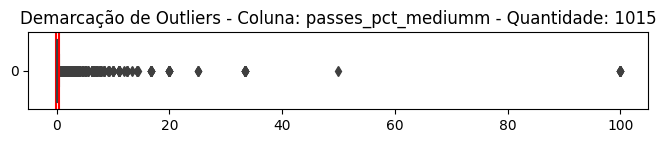



    OUTLIERS DA COLUNA passes_completed_longm
Limite Inferior: -0.059 
Limite Superior: 0.161
Outliers da coluna "passes_completed_longm": [0.161596958, 0.162162162, 0.162162162, 0.162912309, 0.162969283, 0.165240882, 0.165240882, 0.166347992, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.167864141, 0.168080808, 0.168144208, 0.168144208, 0.168253968, 0.168253968, 0.168253968, 0.168253968, 0.168253968, 0.168253968, 0.169117647, 0.169117647, 0.169318905, 0.169934641, 0.169934641, 0.170068027, 0.170068027, 0.170175439, 0.170461179, 0.170461179, 0.170525127, 0.170833333, 0.1716389, 0.17254902, 0.17254902, 0.172576832, 0.17398578, 0.17398578, 0.174111212, 0.174880219, 0.174880219, 0.174969623, 0.175648703, 0.175675676, 0.177319588, 0.177319588, 0.17748538, 0.177777778, 0.177777778, 0.178678679, 0.179458239, 0.179458239, 0.179916318, 0.179916318, 0.182078853, 0.182078853, 0.192093541, 0.196567863, 0.2, 0.2, 0.2, 0.2, 

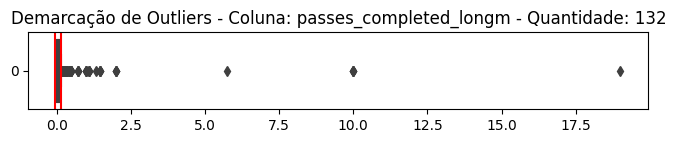



    OUTLIERS DA COLUNA passes_longm
Limite Inferior: -0.075 
Limite Superior: 0.243
Outliers da coluna "passes_longm": [0.24375, 0.24375, 0.243856333, 0.244117647, 0.244117647, 0.244786325, 0.244786325, 0.245252525, 0.245406824, 0.245406824, 0.245502646, 0.246031746, 0.246031746, 0.246031746, 0.246031746, 0.246031746, 0.246031746, 0.246305419, 0.246305419, 0.246659243, 0.247368421, 0.247368421, 0.247660819, 0.247936508, 0.248148148, 0.248148148, 0.248888889, 0.248989899, 0.249074074, 0.249651325, 0.249651325, 0.249707602, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.250660502, 0.250660502, 0.251461988, 0.251461988, 0.251587302, 0.251587302, 0.251679587, 0.252444134, 0.252444134, 0.25440613, 0.25440613, 0.254794521, 0.254794521, 0.254846066, 0.254846066, 0.255255255, 0.255555556, 0.255555556, 0.255555556, 0.255555556, 0.256097561, 0.256097561, 0.258169935, 0.258333333, 0.258333333, 0.259259259, 0.259477124, 0.260018933, 0.260018933, 0.26036036, 0.26036036, 0.261094675, 0.261094675, 0.2

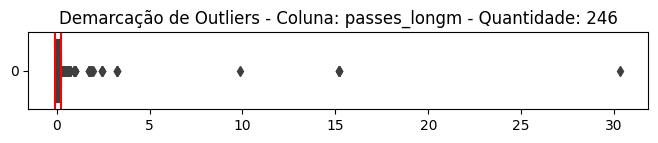



    OUTLIERS DA COLUNA passes_pct_longm
Limite Inferior: -0.078 
Limite Superior: 0.196
Outliers da coluna "passes_pct_longm": [0.196815287, 0.19701897, 0.19701897, 0.197037037, 0.197407407, 0.197407407, 0.198086124, 0.199250936, 0.199380805, 0.199380805, 0.199726027, 0.200246914, 0.201744186, 0.204918033, 0.206185567, 0.206185567, 0.20619469, 0.206666667, 0.206666667, 0.207142857, 0.207806691, 0.207806691, 0.208333333, 0.208333333, 0.208333333, 0.208333333, 0.208333333, 0.208960573, 0.209973753, 0.21, 0.21, 0.21, 0.21, 0.210079576, 0.210294118, 0.210294118, 0.210606061, 0.210606061, 0.211263736, 0.211263736, 0.211953353, 0.212464589, 0.212721893, 0.212721893, 0.213270142, 0.213270142, 0.214521452, 0.216369048, 0.216450216, 0.216450216, 0.216450216, 0.21691974, 0.21691974, 0.217973856, 0.218767507, 0.218767507, 0.219689119, 0.21978022, 0.220588235, 0.2209375, 0.2209375, 0.221296296, 0.221296296, 0.221646341, 0.221646341, 0.222178988, 0.222178988, 0.222222222, 0.222222222, 0.223214286

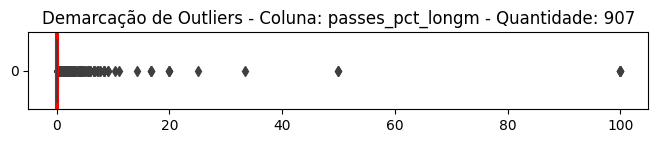



    OUTLIERS DA COLUNA xa_netm
Limite Inferior: -0.001 
Limite Superior: 0.001
Outliers da coluna "xa_netm": [-0.25, -0.061538462, -0.061538462, -0.061538462, -0.061538462, -0.025, -0.025, -0.025, -0.023333333, -0.023333333, -0.023333333, -0.023333333, -0.021666667, -0.016666667, -0.016666667, -0.016666667, -0.016666667, -0.016666667, -0.014285714, -0.014285714, -0.012698413, -0.012698413, -0.012698413, -0.012698413, -0.0125, -0.0125, -0.011111111, -0.011111111, -0.008108108, -0.008108108, -0.008, -0.008, -0.007594937, -0.007142857, -0.007142857, -0.006666667, -0.006122449, -0.006122449, -0.005785124, -0.005555556, -0.004864865, -0.004761905, -0.004705882, -0.004694836, -0.004651163, -0.004545455, -0.004545455, -0.004395604, -0.004273504, -0.004195804, -0.004195804, -0.004166667, -0.004166667, -0.003896104, -0.003846154, -0.003846154, -0.003846154, -0.003797468, -0.003797468, -0.003703704, -0.003531599, -0.003531599, -0.003448276, -0.003409091, -0.003370787, -0.003349282, -0.00333333

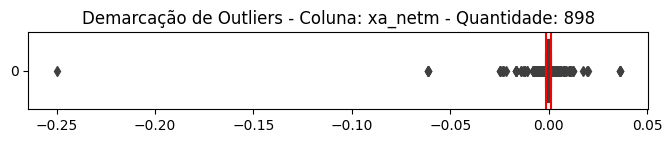



    OUTLIERS DA COLUNA assisted_shotsm
Limite Inferior: -0.017 
Limite Superior: 0.032
Outliers da coluna "assisted_shotsm": [0.032206119, 0.032206119, 0.032258065, 0.032258065, 0.032563647, 0.032803181, 0.032803181, 0.032894737, 0.032934132, 0.032934132, 0.033248082, 0.033333333, 0.033333333, 0.033457249, 0.033457249, 0.033542204, 0.033542204, 0.033707865, 0.033846154, 0.033846154, 0.033898305, 0.033910279, 0.033910279, 0.033912324, 0.033994334, 0.034139403, 0.034521158, 0.034615385, 0.034615385, 0.034693222, 0.034846885, 0.034876729, 0.034883721, 0.035294118, 0.035324675, 0.035714286, 0.035752979, 0.036363636, 0.036585366, 0.036585366, 0.037037037, 0.03712297, 0.037297678, 0.038, 0.038461538, 0.038461538, 0.038461538, 0.038888889, 0.039103481, 0.039103481, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.040201005, 0.040201005, 0.040816327, 0.040816327, 0.041048637, 0.041048637, 0.041147132, 0.041150223, 0.041150223, 0.041666667, 0.041666667, 0.041666667, 0.041666667, 0.041666667, 0.042424242

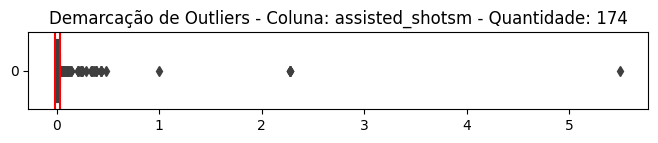



    OUTLIERS DA COLUNA passes_into_final_thirdm
Limite Inferior: -0.028 
Limite Superior: 0.079
Outliers da coluna "passes_into_final_thirdm": [0.07951686, 0.07951686, 0.079787234, 0.079787234, 0.079932923, 0.079932923, 0.08, 0.08056872, 0.080793763, 0.080875782, 0.081081081, 0.081081081, 0.081081081, 0.081081081, 0.081125828, 0.081438392, 0.081438392, 0.081796032, 0.081796032, 0.081914552, 0.082330284, 0.082330284, 0.083333333, 0.083333333, 0.083333333, 0.083333333, 0.083333333, 0.083333333, 0.083333333, 0.083333333, 0.083333333, 0.083333333, 0.083333333, 0.083459788, 0.083484574, 0.083647325, 0.083647325, 0.083663366, 0.083892617, 0.083892617, 0.083989501, 0.083989501, 0.084686775, 0.084696017, 0.084696017, 0.084777228, 0.08490111, 0.084946237, 0.085159674, 0.085159674, 0.085365854, 0.085365854, 0.085448393, 0.085501859, 0.085501859, 0.086956522, 0.086956522, 0.086956522, 0.086956522, 0.087301587, 0.088029466, 0.088029466, 0.088162762, 0.088162762, 0.088235294, 0.088235294, 0.08823

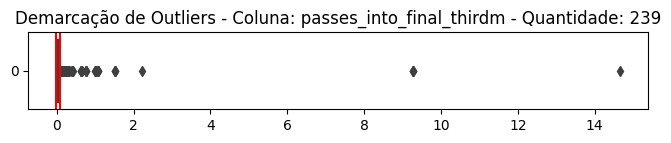



    OUTLIERS DA COLUNA passes_into_penalty_aream
Limite Inferior: -0.016 
Limite Superior: 0.029
Outliers da coluna "passes_into_penalty_aream": [0.029299363, 0.029315961, 0.029394813, 0.029394813, 0.029411765, 0.029411765, 0.029411765, 0.029411765, 0.029545455, 0.029545455, 0.029641186, 0.029772329, 0.029772329, 0.029772329, 0.029772329, 0.029834254, 0.029834254, 0.029850746, 0.029850746, 0.029876977, 0.029876977, 0.029949239, 0.029949239, 0.03, 0.03, 0.030221263, 0.030221263, 0.030221263, 0.030221263, 0.030274361, 0.030274361, 0.03030303, 0.030607125, 0.030612245, 0.030612245, 0.030797101, 0.030797101, 0.030826141, 0.030826141, 0.030864198, 0.031155779, 0.031155779, 0.031159653, 0.031166518, 0.03125, 0.03125, 0.03125, 0.03125, 0.031399317, 0.031399317, 0.031598513, 0.031598513, 0.031635802, 0.032258065, 0.032467532, 0.032467532, 0.032502709, 0.032608696, 0.032608696, 0.032786885, 0.032786885, 0.032894737, 0.033149171, 0.033259424, 0.033333333, 0.033333333, 0.033333333, 0.033507074,

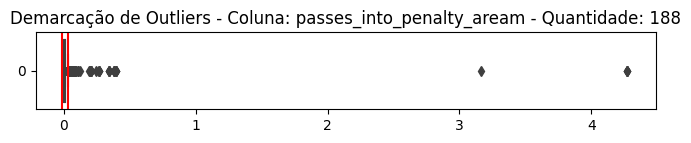



    OUTLIERS DA COLUNA crosses_into_penalty_aream
Limite Inferior: -0.005 
Limite Superior: 0.008
Outliers da coluna "crosses_into_penalty_aream": [0.008278717, 0.008278717, 0.008298755, 0.008298755, 0.008333333, 0.008333333, 0.008333333, 0.008333333, 0.008369868, 0.008381351, 0.008387097, 0.008387097, 0.008403361, 0.008413462, 0.008413462, 0.008431703, 0.008431703, 0.008438819, 0.008438819, 0.008438819, 0.008438819, 0.008443908, 0.008450704, 0.008450704, 0.008474576, 0.008474576, 0.008503401, 0.008504924, 0.008506616, 0.008506616, 0.008518519, 0.008518519, 0.008528785, 0.008528785, 0.00856531, 0.00856531, 0.008571429, 0.008580858, 0.008583691, 0.008583691, 0.00862069, 0.008634223, 0.008635579, 0.008639309, 0.008639309, 0.008646999, 0.00867052, 0.00867052, 0.008671415, 0.008671659, 0.008671659, 0.008678881, 0.008679245, 0.008679245, 0.008687837, 0.008695652, 0.008695652, 0.008695652, 0.008708273, 0.008708273, 0.00874036, 0.008747698, 0.008748318, 0.008748318, 0.008750608, 0.008750608

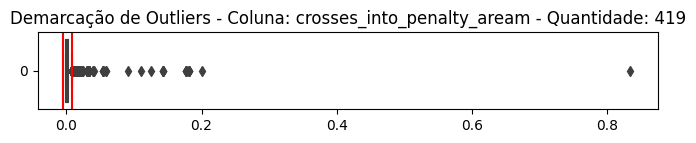



    OUTLIERS DA COLUNA progressive_passesm
Limite Inferior: -0.028 
Limite Superior: 0.090
Outliers da coluna "progressive_passesm": [0.090509666, 0.090509666, 0.090531561, 0.090870846, 0.090870846, 0.090909091, 0.091273018, 0.091273018, 0.091743119, 0.091743119, 0.09273479, 0.09273479, 0.093514869, 0.094043887, 0.094444444, 0.094444444, 0.095238095, 0.095716552, 0.095716552, 0.095979899, 0.095979899, 0.096153846, 0.096153846, 0.098181818, 0.099809886, 0.099809886, 0.1, 0.1, 0.1, 0.1, 0.1, 0.101265823, 0.101726264, 0.101726264, 0.102272727, 0.103115965, 0.103194103, 0.103575378, 0.103575378, 0.106508876, 0.106508876, 0.106583072, 0.109986505, 0.110763889, 0.111111111, 0.111111111, 0.111111111, 0.111111111, 0.111111111, 0.111111111, 0.111111111, 0.111111111, 0.111236589, 0.113050076, 0.113978495, 0.114130435, 0.114130435, 0.12, 0.120833333, 0.120833333, 0.120833333, 0.120833333, 0.124391939, 0.124391939, 0.125, 0.125, 0.125, 0.127727515, 0.127727515, 0.127777778, 0.142857143, 0.142857

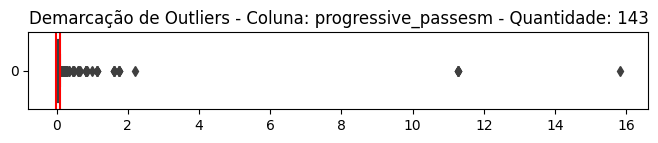



    OUTLIERS DA COLUNA passes_livem
Limite Inferior: -0.054 
Limite Superior: 0.900
Outliers da coluna "passes_livem": [0.90266876, 0.90266876, 0.909090909, 0.909090909, 0.909090909, 0.909090909, 0.909205549, 0.92, 0.923076923, 0.923076923, 0.924832962, 0.927866831, 0.927866831, 0.931253978, 0.932330827, 0.933333333, 0.933649289, 0.938118812, 0.940933255, 0.940933255, 0.944072658, 0.945742276, 0.945742276, 0.947401774, 0.947401774, 0.949634444, 0.949634444, 0.950078003, 0.950344828, 0.950344828, 0.950393224, 0.950433705, 0.950433705, 0.950617284, 0.950760608, 0.953093812, 0.961690141, 0.961690141, 0.965325482, 0.965325482, 0.965517241, 0.970521542, 0.970521542, 0.973659454, 0.973659454, 0.974379504, 0.974379504, 0.976331361, 0.976331361, 0.979166667, 0.986111111, 0.986111111, 0.988888889, 0.989482201, 0.989482201, 0.996353692, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.002416432, 1.003387916, 1.005434783, 1.005434783, 1.0076428, 1

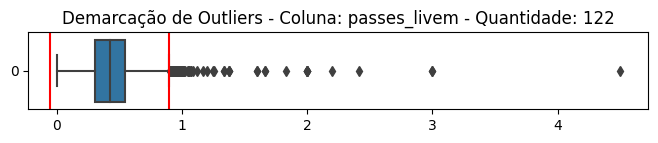



    OUTLIERS DA COLUNA passes_deadm
Limite Inferior: -0.080 
Limite Superior: 0.168
Outliers da coluna "passes_deadm": [0.169565217, 0.17037037, 0.171400264, 0.171400264, 0.171792619, 0.171792619, 0.172413793, 0.172742336, 0.172742336, 0.174174174, 0.174174174, 0.174603175, 0.1754671, 0.1754671, 0.177777778, 0.177777778, 0.177777778, 0.177777778, 0.177887789, 0.178666667, 0.178666667, 0.180555556, 0.180775717, 0.180775717, 0.181818182, 0.181818182, 0.181818182, 0.181818182, 0.182795699, 0.190575916, 0.192292721, 0.192292721, 0.192592593, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.201388889, 0.205354331, 0.208955224, 0.211111111, 0.211111111, 0.21123464, 0.216666667, 0.221604938, 0.221604938, 0.244444444, 0.244444444, 0.25, 0.25, 0.25, 0.266666667, 0.333333333, 0.333333333, 0.333333333, 0.5, 0.5, 0.666666667]


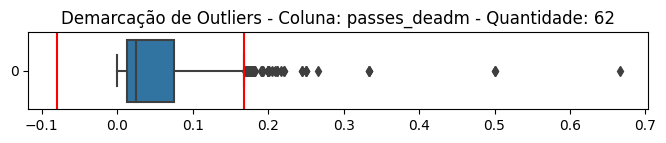



    OUTLIERS DA COLUNA passes_free_kicksm
Limite Inferior: -0.022 
Limite Superior: 0.042
Outliers da coluna "passes_free_kicksm": [0.041633307, 0.041633307, 0.041666667, 0.041666667, 0.041769802, 0.041830065, 0.041830065, 0.04185022, 0.041878173, 0.041878173, 0.042016807, 0.042016807, 0.042042042, 0.042042042, 0.042075736, 0.042075736, 0.042105263, 0.042183623, 0.042352941, 0.042363434, 0.042397661, 0.042397661, 0.042424242, 0.042424242, 0.042735043, 0.042735043, 0.042857143, 0.042857143, 0.043274854, 0.043413174, 0.043413174, 0.043478261, 0.043478261, 0.04375, 0.04375, 0.04375667, 0.04379562, 0.043809524, 0.043809524, 0.043859649, 0.043859649, 0.044207317, 0.044247788, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044463087, 0.044736842, 0.0447

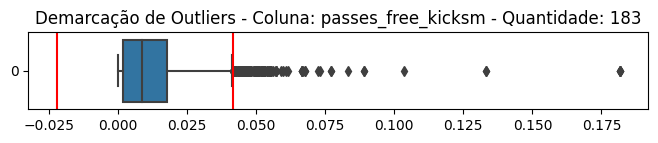



    OUTLIERS DA COLUNA through_ballsm
Limite Inferior: -0.002 
Limite Superior: 0.003
Outliers da coluna "through_ballsm": [0.003350084, 0.003350084, 0.003350084, 0.003350084, 0.003352892, 0.003352892, 0.003352892, 0.003352892, 0.003357113, 0.003357113, 0.003367003, 0.003372681, 0.003372681, 0.003372681, 0.003374578, 0.00338819, 0.00338819, 0.003394433, 0.003394433, 0.003395586, 0.003407155, 0.003424658, 0.003424658, 0.003436426, 0.003436426, 0.003442341, 0.003442341, 0.003442341, 0.003443187, 0.003443187, 0.003443526, 0.003449357, 0.003449357, 0.003469813, 0.003469813, 0.003469813, 0.003469813, 0.003470032, 0.003475239, 0.003475239, 0.003485425, 0.003485425, 0.003502627, 0.003502627, 0.003502627, 0.003502627, 0.003505697, 0.003508772, 0.003516174, 0.003521127, 0.003521127, 0.003521127, 0.003528582, 0.003528582, 0.003533569, 0.003558719, 0.003558719, 0.003579098, 0.003590664, 0.003590664, 0.003593597, 0.003593597, 0.003603604, 0.003630496, 0.003630496, 0.003640335, 0.003649635, 0.003

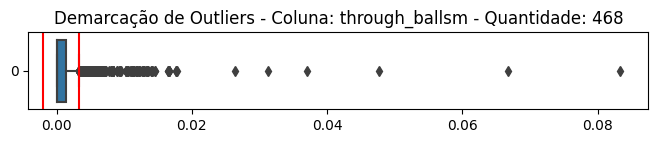



    OUTLIERS DA COLUNA passes_pressurem
Limite Inferior: -0.002 
Limite Superior: 0.160
Outliers da coluna "passes_pressurem": [0.16, 0.160556258, 0.160556258, 0.16069271, 0.16091954, 0.160928743, 0.160928743, 0.161066049, 0.161290323, 0.161392405, 0.161458333, 0.161478599, 0.16159861, 0.16159861, 0.162566329, 0.162962963, 0.163059163, 0.163059163, 0.16318927, 0.163855422, 0.163855422, 0.164473684, 0.165484634, 0.165765766, 0.166339869, 0.166339869, 0.166405024, 0.166405024, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166983523, 0.166983523, 0.167235495, 0.167763158, 0.168032787, 0.169354839, 0.17025641, 0.17025641, 0.170553936, 0.171875, 0.171875, 0.172277228, 0.172413793, 0.173434856, 0.173507463, 0.173728814, 0.173981191, 0.175438596, 0.175438596, 0.177083333, 0.177740864, 0.177777778, 0.177777778, 0.177777778, 0.178041543, 0.178041543, 0.178954903, 0.179066835, 0.1818

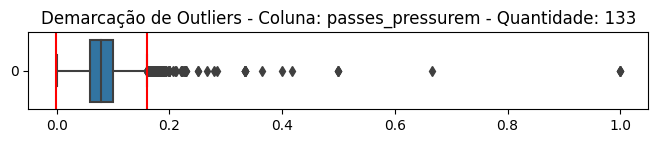



    OUTLIERS DA COLUNA passes_switchesm
Limite Inferior: -0.014 
Limite Superior: 0.039
Outliers da coluna "passes_switchesm": [0.038809344, 0.038809344, 0.038855528, 0.038855528, 0.038961039, 0.039073806, 0.039078156, 0.03935743, 0.03935743, 0.039580353, 0.039638736, 0.039660057, 0.039660057, 0.039660057, 0.039660057, 0.039693593, 0.039693593, 0.039781591, 0.039781591, 0.039893617, 0.039893617, 0.040097205, 0.040114613, 0.040225261, 0.040245947, 0.040245947, 0.040322581, 0.040322581, 0.040447504, 0.04047777, 0.040512821, 0.040512821, 0.040529363, 0.040540541, 0.040540541, 0.040561622, 0.040644453, 0.040816327, 0.040816327, 0.040832666, 0.040832666, 0.040837696, 0.040849673, 0.040849673, 0.040966387, 0.040966387, 0.040972222, 0.040972222, 0.040983607, 0.041016949, 0.041198502, 0.041503268, 0.041503268, 0.041666667, 0.041798107, 0.04224174, 0.04224174, 0.042306252, 0.042578591, 0.042965061, 0.042965061, 0.043062201, 0.043234588, 0.043234588, 0.043247344, 0.043442623, 0.043442623, 0.04

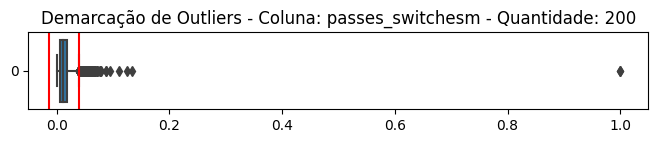



    OUTLIERS DA COLUNA crossesm
Limite Inferior: -0.027 
Limite Superior: 0.048
Outliers da coluna "crossesm": [0.047768699, 0.047768699, 0.04787234, 0.04787234, 0.04787234, 0.04787234, 0.047887324, 0.047887324, 0.047995483, 0.048088293, 0.048088293, 0.048200726, 0.048205128, 0.048205128, 0.048319328, 0.048319328, 0.048496605, 0.048507463, 0.048566413, 0.048589342, 0.048589342, 0.04862119, 0.04862119, 0.048646528, 0.048646528, 0.048651817, 0.048651817, 0.048659384, 0.048689139, 0.048780488, 0.048780488, 0.048888889, 0.048888889, 0.049273531, 0.049273531, 0.049315068, 0.049469965, 0.049833887, 0.049846154, 0.049846154, 0.049904031, 0.050087362, 0.050139276, 0.050139276, 0.050179211, 0.05049505, 0.050719671, 0.050719671, 0.050719671, 0.050719671, 0.05078125, 0.050890585, 0.050890585, 0.050967742, 0.050967742, 0.051044084, 0.051236116, 0.051886792, 0.052067381, 0.052067381, 0.052083333, 0.052664975, 0.05323741, 0.053288364, 0.053288364, 0.053346587, 0.053346587, 0.053571429, 0.053639847

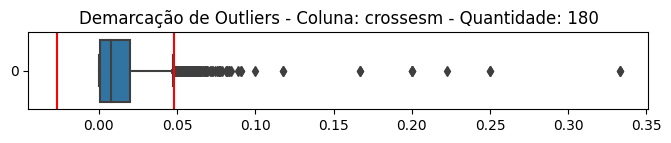



    OUTLIERS DA COLUNA corner_kicksm
Limite Inferior: -0.003 
Limite Superior: 0.005
Outliers da coluna "corner_kicksm": [0.004730369, 0.004739336, 0.004739336, 0.004758128, 0.004758128, 0.004761905, 0.004761905, 0.004761905, 0.004784689, 0.004784689, 0.004796163, 0.004796163, 0.004878049, 0.004887586, 0.004901961, 0.004901961, 0.004918033, 0.004933051, 0.004943154, 0.004943154, 0.004950495, 0.00497265, 0.004987531, 0.005015045, 0.005050505, 0.005070994, 0.005070994, 0.005102041, 0.005102041, 0.00511509, 0.005128205, 0.005134788, 0.005134788, 0.005154639, 0.005181347, 0.005181347, 0.005181347, 0.005219985, 0.005219985, 0.005248533, 0.005263158, 0.005319149, 0.005319149, 0.005319149, 0.005331754, 0.005376344, 0.005376344, 0.005376344, 0.005398111, 0.005398111, 0.005403319, 0.005403319, 0.005424955, 0.005424955, 0.005448242, 0.005476451, 0.005483208, 0.005483208, 0.005483208, 0.005483208, 0.005494505, 0.005508262, 0.005508262, 0.005524862, 0.005524862, 0.005545287, 0.005555556, 0.00555

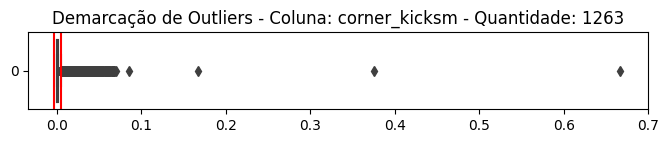



    OUTLIERS DA COLUNA corner_kicks_inm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "corner_kicks_inm": [0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000298864, 0.000298864, 0.000307692, 0.000307692, 0.000308356, 0.000308356, 0.000309789, 0.00031736, 0.000328623, 0.000328623, 0.000330251, 0.000330251, 0.000339098, 0.000339098, 0.000342114, 0.00035524, 0.00035524, 0.000357782, 0.000358166, 0.000358166, 0.000359066, 0.000359066, 0.000365898, 0.000365898, 0.000372578, 0.000374813, 0.000379219, 0.000384025, 0.00038432, 0.000390168, 0.000391389, 0.000391389, 0.000392311, 0.000392773, 0.000392773, 0.000392927, 0.000395257, 0.000396983, 0.000397931, 0.000398883, 0.000398883, 0.000401284, 0.000402576, 0.000419287, 0.000424448, 0.00042517, 0.00042517, 0.00042735, 0.00042735, 0.000428449, 0.000428449, 0.000436491, 0.000436491, 0.000437254, 0.000442282, 0.000442282, 0.000453926, 0.000453926, 0.000455373, 0.000457038, 0.000457038, 0.000458505, 0.000458505, 0.000459

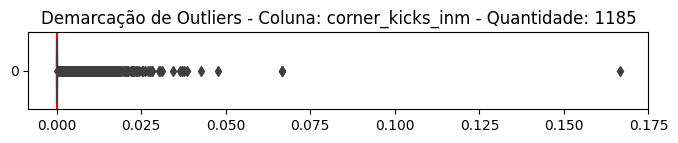



    OUTLIERS DA COLUNA corner_kicks_outm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "corner_kicks_outm": [0.000296824, 0.000308737, 0.000315657, 0.000317158, 0.000317158, 0.00031746, 0.000325733, 0.000328192, 0.000328192, 0.000331016, 0.000332889, 0.000332889, 0.000339098, 0.000339098, 0.000341297, 0.000341997, 0.000345066, 0.000347343, 0.000347343, 0.000350385, 0.000351989, 0.000351989, 0.000352609, 0.000354862, 0.000354862, 0.000356125, 0.000364299, 0.000372578, 0.000373972, 0.000373972, 0.000374813, 0.000375516, 0.000376081, 0.000378358, 0.000380373, 0.000380373, 0.000382848, 0.00038432, 0.000385654, 0.000385654, 0.000390168, 0.000391389, 0.000391389, 0.000392311, 0.000392927, 0.000396825, 0.000396983, 0.00040032, 0.000401768, 0.000401768, 0.000402576, 0.000404204, 0.000409668, 0.000409668, 0.000411184, 0.000413736, 0.000415282, 0.000416493, 0.000416493, 0.00041841, 0.000418585, 0.000418585, 0.000420521, 0.000420521, 0.000424448, 0.000424809, 0.000424809, 0.

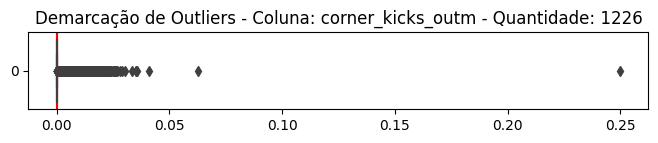



    OUTLIERS DA COLUNA corner_kicks_straightm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "corner_kicks_straightm": [0.000300842, 0.000300842, 0.000308642, 0.000308642, 0.000308737, 0.000308928, 0.000309981, 0.000309981, 0.000318573, 0.000321027, 0.000321027, 0.00032144, 0.000325309, 0.000325309, 0.000332447, 0.000336022, 0.000336022, 0.0003367, 0.000341297, 0.000341997, 0.000344116, 0.000344116, 0.000344828, 0.000344828, 0.000347222, 0.000347222, 0.000348189, 0.000348189, 0.000354108, 0.000354108, 0.000368596, 0.000368596, 0.000369004, 0.000371333, 0.000371333, 0.000389257, 0.000389257, 0.000391389, 0.000391389, 0.000392927, 0.000395257, 0.00040032, 0.00040032, 0.000402414, 0.000405022, 0.000405022, 0.000405022, 0.000406835, 0.000407498, 0.000407498, 0.000407498, 0.000412371, 0.000412371, 0.00041425, 0.00041425, 0.00041841, 0.000420345, 0.000420345, 0.00042735, 0.00042735, 0.000430293, 0.000430293, 0.000432526, 0.000436681, 0.000436681, 0.000442282, 0.000442282

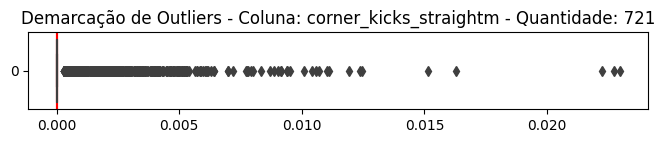



    OUTLIERS DA COLUNA passes_groundm
Limite Inferior: -0.105 
Limite Superior: 0.714
Outliers da coluna "passes_groundm": [0.714092141, 0.714285714, 0.714285714, 0.714583333, 0.714624881, 0.716099773, 0.716099773, 0.716101695, 0.716101695, 0.716216216, 0.716216216, 0.717525773, 0.717525773, 0.718216649, 0.718216649, 0.719482121, 0.719482121, 0.720489978, 0.720812183, 0.722222222, 0.722400857, 0.722400857, 0.725160256, 0.725160256, 0.729372937, 0.731195335, 0.731509192, 0.73253012, 0.733033932, 0.735156531, 0.735156531, 0.735380981, 0.735380981, 0.736745887, 0.737633062, 0.737633062, 0.737955876, 0.737955876, 0.740341107, 0.740341107, 0.743547044, 0.746148202, 0.75, 0.75, 0.75, 0.75, 0.753816794, 0.753816794, 0.754901961, 0.759505703, 0.759505703, 0.76, 0.764705882, 0.765799257, 0.765799257, 0.767453057, 0.767453057, 0.768707483, 0.768707483, 0.769230769, 0.769230769, 0.772727273, 0.77443609, 0.775820657, 0.778680688, 0.78021978, 0.78021978, 0.787610619, 0.787610619, 0.787610619, 0.7

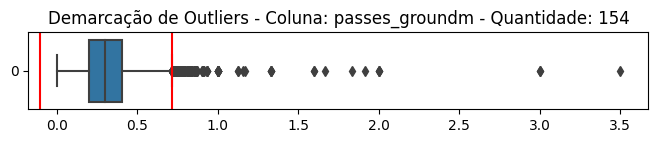



    OUTLIERS DA COLUNA passes_lowm
Limite Inferior: -0.019 
Limite Superior: 0.151
Outliers da coluna "passes_lowm": [0.151012891, 0.151315789, 0.151515152, 0.152094718, 0.152094718, 0.153044872, 0.153044872, 0.153846154, 0.153846154, 0.153846154, 0.153872054, 0.153905646, 0.154217926, 0.154217926, 0.154385965, 0.154639175, 0.154766355, 0.154766355, 0.155136268, 0.155136268, 0.155544405, 0.155783582, 0.15625, 0.15625, 0.156456954, 0.156481481, 0.156481481, 0.156586578, 0.156586578, 0.156744537, 0.156862745, 0.157079646, 0.157079646, 0.15780446, 0.157894737, 0.157894737, 0.158, 0.158, 0.158031088, 0.158333333, 0.158333333, 0.158333333, 0.159182409, 0.159613059, 0.16, 0.16, 0.16, 0.160250671, 0.160353535, 0.160556258, 0.161052632, 0.161538462, 0.162162162, 0.162162162, 0.163009404, 0.163021869, 0.163021869, 0.1639413, 0.1640625, 0.1640625, 0.165491776, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166

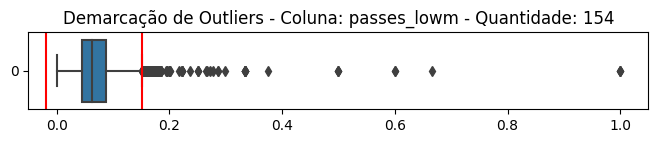



    OUTLIERS DA COLUNA passes_highm
Limite Inferior: -0.047 
Limite Superior: 0.228
Outliers da coluna "passes_highm": [0.228888889, 0.229711142, 0.229711142, 0.230283912, 0.230409357, 0.230987693, 0.230987693, 0.23128655, 0.23128655, 0.231353135, 0.231649832, 0.231649832, 0.23245614, 0.23245614, 0.232539683, 0.232539683, 0.232950192, 0.232950192, 0.233333333, 0.233633634, 0.233633634, 0.23402418, 0.234444444, 0.234567901, 0.234891676, 0.234891676, 0.235330451, 0.237037037, 0.237037037, 0.237113402, 0.237654321, 0.238697318, 0.238697318, 0.23908046, 0.239451477, 0.239451477, 0.24005848, 0.24005848, 0.24019025, 0.24019025, 0.241358025, 0.241358025, 0.24137931, 0.241974126, 0.241974126, 0.242222222, 0.242339833, 0.242424242, 0.242539683, 0.242539683, 0.244444444, 0.244444444, 0.244444444, 0.244444444, 0.244444444, 0.244601492, 0.245762712, 0.246399377, 0.246399377, 0.246808511, 0.246808511, 0.247011952, 0.247011952, 0.247474747, 0.247474747, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.

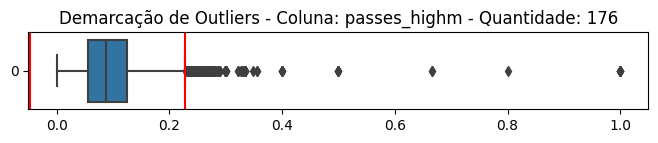



    OUTLIERS DA COLUNA passes_left_footm
Limite Inferior: -0.184 
Limite Superior: 0.405
Outliers da coluna "passes_left_footm": [0.404682274, 0.404682274, 0.404735062, 0.404850746, 0.404850746, 0.405228758, 0.405882353, 0.40625, 0.40625, 0.406504065, 0.40657277, 0.40657277, 0.407407407, 0.407407407, 0.407738095, 0.407816483, 0.408002992, 0.408002992, 0.408083442, 0.408376963, 0.408376963, 0.4086661, 0.4086661, 0.409768212, 0.409768212, 0.409788167, 0.409888357, 0.409888357, 0.41011984, 0.410810811, 0.411044974, 0.411044974, 0.411903637, 0.411903637, 0.411903823, 0.411903823, 0.412022542, 0.412022542, 0.412162162, 0.412371134, 0.412371134, 0.412459721, 0.412541254, 0.412831241, 0.412831241, 0.412831241, 0.412831241, 0.412982456, 0.413043478, 0.413043478, 0.413043478, 0.413043478, 0.413134606, 0.413338997, 0.413421707, 0.413421707, 0.413818449, 0.414035088, 0.414269275, 0.414427861, 0.414427861, 0.415181753, 0.415181753, 0.415533981, 0.415533981, 0.41586624, 0.416137806, 0.416328894, 

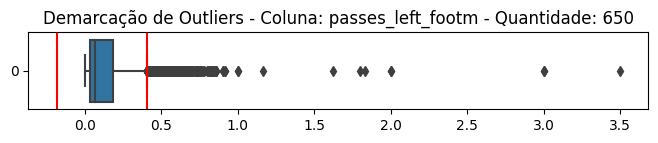



    OUTLIERS DA COLUNA passes_right_footm
Limite Inferior: -0.331 
Limite Superior: 0.849
Outliers da coluna "passes_right_footm": [0.852459016, 0.856624319, 0.867298578, 0.87103929, 0.87103929, 0.871455577, 0.875, 0.889967638, 0.889967638, 0.913398693, 0.913398693, 0.921513269, 0.931034483, 0.960768615, 0.960768615, 0.983333333, 0.983333333, 0.983333333, 0.983333333, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.00982801, 1.016498137, 1.016498137, 1.035087719, 1.137931034, 1.2, 1.2, 1.333333333, 1.333333333, 1.333333333, 1.666666667, 2.0, 2.0, 2.0]


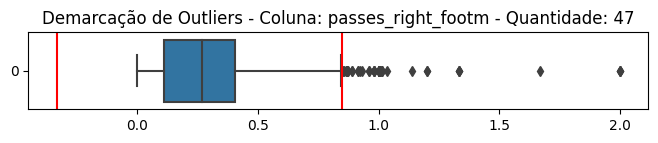



    OUTLIERS DA COLUNA passes_headm
Limite Inferior: -0.017 
Limite Superior: 0.058
Outliers da coluna "passes_headm": [0.058232932, 0.058232932, 0.058394161, 0.058394161, 0.058394161, 0.058394161, 0.058776807, 0.058776807, 0.058823529, 0.058823529, 0.058823529, 0.058823529, 0.058976021, 0.058976021, 0.059088351, 0.059322034, 0.059322034, 0.05952381, 0.05952381, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.060128848, 0.060128848, 0.060526316, 0.060526316, 0.060606061, 0.060606061, 0.060606061, 0.0609319, 0.061093248, 0.061093248, 0.061761229, 0.061761229, 0.06185567, 0.061871616, 0.061871616, 0.062045836, 0.062045836, 0.0625, 0.0625, 0.0625, 0.063626723, 0.063829787, 0.063829787, 0.064393939, 0.064393939, 0.064701653, 0.064814815, 0.064814815, 0.06512425, 0.06512425, 0.065217391, 0.065217391, 0.065789474, 0.065789474, 0.065885798, 0.065885798, 0.066371681, 0.066574202, 0.066574202, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.067961165, 0.0689

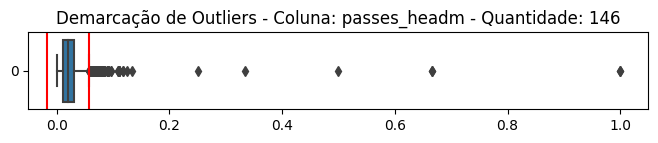



    OUTLIERS DA COLUNA throw_insm
Limite Inferior: -0.020 
Limite Superior: 0.033
Outliers da coluna "throw_insm": [0.033387622, 0.033707865, 0.033707865, 0.033898305, 0.034013605, 0.034351145, 0.034369885, 0.034375, 0.034519957, 0.034732272, 0.034732272, 0.034804754, 0.035087719, 0.035087719, 0.035416667, 0.035714286, 0.035824583, 0.035824583, 0.036036036, 0.036286019, 0.036351619, 0.036601307, 0.036805012, 0.036805012, 0.036809816, 0.036809816, 0.037037037, 0.037037037, 0.037593985, 0.037607891, 0.037607891, 0.037807183, 0.037807183, 0.037878788, 0.037974684, 0.037974684, 0.038570085, 0.038570085, 0.038729667, 0.038729667, 0.038839979, 0.038984587, 0.039179104, 0.03938068, 0.03938068, 0.039393939, 0.039393939, 0.039631336, 0.039631336, 0.04, 0.04, 0.040609137, 0.041025641, 0.041218638, 0.041237113, 0.041237113, 0.041273585, 0.041567696, 0.041666667, 0.041703638, 0.041703638, 0.041710115, 0.041841004, 0.041841004, 0.041841004, 0.041841004, 0.041935484, 0.042016807, 0.042087542, 0.04

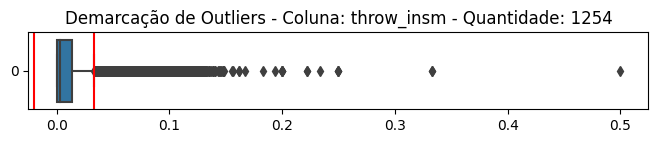



    OUTLIERS DA COLUNA passes_other_bodym
Limite Inferior: -0.005 
Limite Superior: 0.010
Outliers da coluna "passes_other_bodym": [0.009560229, 0.009560229, 0.009661836, 0.009661836, 0.009746589, 0.009746589, 0.009758364, 0.009758364, 0.009797518, 0.009797518, 0.009803922, 0.009803922, 0.009803922, 0.009803922, 0.00982801, 0.00990099, 0.00993926, 0.009966777, 0.009976247, 0.01, 0.01, 0.01, 0.01, 0.010016694, 0.010035842, 0.010050251, 0.010050251, 0.010050251, 0.010143702, 0.010186757, 0.010204082, 0.010204082, 0.010204082, 0.010204082, 0.010235415, 0.01027984, 0.01027984, 0.010309278, 0.010335917, 0.010335917, 0.01038961, 0.010416667, 0.010416667, 0.010416667, 0.010471204, 0.010471204, 0.010471204, 0.010548523, 0.010567515, 0.010567515, 0.010582011, 0.010582011, 0.010638298, 0.010666667, 0.010666667, 0.010666667, 0.010666667, 0.010752688, 0.010790225, 0.010869565, 0.010869565, 0.010894942, 0.011037528, 0.011049724, 0.011049724, 0.011049724, 0.011111111, 0.011111111, 0.011111111, 0.0

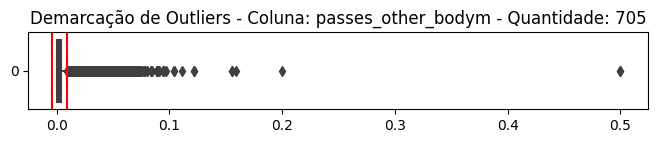



    OUTLIERS DA COLUNA passes_offsidesm
Limite Inferior: -0.003 
Limite Superior: 0.006
Outliers da coluna "passes_offsidesm": [0.005736138, 0.005747126, 0.005780347, 0.005780347, 0.005780347, 0.005780347, 0.005813953, 0.005834306, 0.005838848, 0.005838848, 0.005845817, 0.005845817, 0.005853219, 0.005853219, 0.005928854, 0.005928854, 0.005930319, 0.005936319, 0.005936319, 0.005936319, 0.005936319, 0.005952381, 0.005952381, 0.005952381, 0.005959476, 0.005988024, 0.005988024, 0.006003431, 0.006003431, 0.006111111, 0.006111111, 0.006153846, 0.006153846, 0.006166495, 0.00617284, 0.006349206, 0.006349206, 0.006369427, 0.006402049, 0.006402049, 0.006410256, 0.006410256, 0.006464646, 0.0065, 0.006578947, 0.006578947, 0.006578947, 0.006578947, 0.00659051, 0.00659051, 0.006622517, 0.006679389, 0.006679389, 0.006681514, 0.006711409, 0.006711409, 0.006756757, 0.006781751, 0.006781751, 0.006837607, 0.006837607, 0.006849315, 0.006849315, 0.006908463, 0.006908463, 0.006944444, 0.006944444, 0.00694

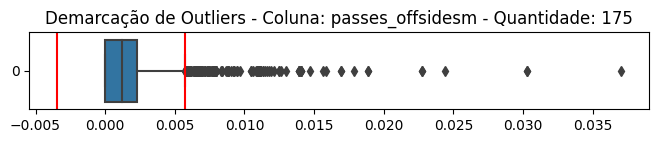



    OUTLIERS DA COLUNA passes_oobm
Limite Inferior: -0.005 
Limite Superior: 0.022
Outliers da coluna "passes_oobm": [0.02189781, 0.02189781, 0.021917808, 0.021929825, 0.021929825, 0.021989529, 0.022058824, 0.022058824, 0.022082019, 0.022082019, 0.022088353, 0.022099448, 0.022123894, 0.022123894, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022466758, 0.022466758, 0.022556391, 0.022698613, 0.022698613, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022977346, 0.022988506, 0.023255814, 0.023255814, 0.0234055, 0.0234375, 0.023509656, 0.023529412, 0.023529412, 0.023584906, 0.

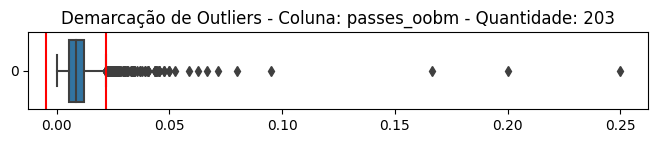



    OUTLIERS DA COLUNA passes_interceptedm
Limite Inferior: -0.007 
Limite Superior: 0.022
Outliers da coluna "passes_interceptedm": [0.022304833, 0.022304833, 0.02247191, 0.02254902, 0.02254902, 0.022665458, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.02288072, 0.02288072, 0.022932592, 0.022932592, 0.022955524, 0.022955524, 0.022988506, 0.023109244, 0.023255814, 0.023255814, 0.023608769, 0.023608769, 0.023809524, 0.023809524, 0.023809524, 0.023880597, 0.023880597, 0.024327313, 0.024327313, 0.024390244, 0.024390244, 0.025, 0.025316456, 0.025316456, 0.025316456, 0.025547445, 0.025547445, 0.025641026, 0.025641026, 0.026058632, 0.026143791, 0.026315789, 0.026315789, 0.026315789, 0.026315789, 0.026315789, 0.026666667, 0.026666667, 0.02688172, 0.027027027, 0.027027027, 0.027777778, 0.027777778, 0.027777778, 0.027

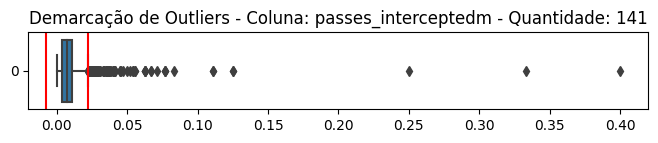



    OUTLIERS DA COLUNA passes_blockedm
Limite Inferior: -0.013 
Limite Superior: 0.036
Outliers da coluna "passes_blockedm": [0.03649635, 0.03649635, 0.036764706, 0.036890646, 0.037037037, 0.037037037, 0.037037037, 0.037313433, 0.037313433, 0.037593985, 0.037974684, 0.037974684, 0.037974684, 0.037974684, 0.038043478, 0.038153846, 0.038153846, 0.038314176, 0.038314176, 0.038461538, 0.038461538, 0.038647343, 0.038647343, 0.0390625, 0.0390625, 0.039130435, 0.039215686, 0.039855072, 0.039855072, 0.04, 0.04, 0.04, 0.04, 0.04, 0.040540541, 0.040540541, 0.040816327, 0.040816327, 0.041244084, 0.041666667, 0.041666667, 0.041958042, 0.042016807, 0.042168675, 0.042168675, 0.043824701, 0.043824701, 0.044444444, 0.044609665, 0.044642857, 0.045092838, 0.045092838, 0.04516129, 0.045454545, 0.045454545, 0.046052632, 0.046153846, 0.046332046, 0.046875, 0.047619048, 0.048634812, 0.05, 0.05, 0.050847458, 0.052287582, 0.052631579, 0.052631579, 0.053763441, 0.054945055, 0.055555556, 0.0625, 0.0625, 0.062

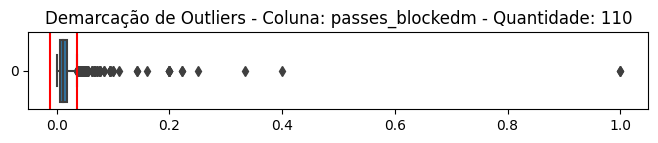



    OUTLIERS DA COLUNA scam
Limite Inferior: -0.028 
Limite Superior: 0.065
Outliers da coluna "scam": [0.064837905, 0.064854554, 0.064854554, 0.064854554, 0.065641026, 0.065641026, 0.065789474, 0.066037736, 0.066037736, 0.066174109, 0.066666667, 0.066666667, 0.066666667, 0.066712995, 0.066712995, 0.066931086, 0.066931086, 0.067567568, 0.067567568, 0.0685, 0.068541301, 0.068541301, 0.069892473, 0.070069606, 0.071058986, 0.071058986, 0.071159767, 0.071159767, 0.071428571, 0.071428571, 0.071428571, 0.071428571, 0.071428571, 0.071428571, 0.071428571, 0.071428571, 0.071428571, 0.071428571, 0.071428571, 0.071505959, 0.071859296, 0.071859296, 0.072016461, 0.072490706, 0.072490706, 0.072837633, 0.073056995, 0.073170732, 0.074918567, 0.076388889, 0.076923077, 0.076923077, 0.076923077, 0.076923077, 0.076923077, 0.078918524, 0.078918524, 0.079541383, 0.079975947, 0.081081081, 0.081459639, 0.081459639, 0.082352941, 0.082352941, 0.083333333, 0.083333333, 0.083333333, 0.086956522, 0.086956522, 0.

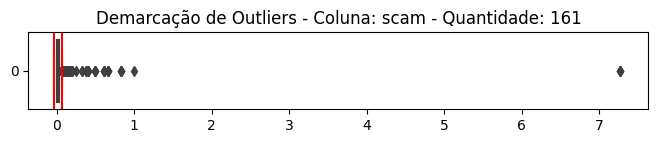



    OUTLIERS DA COLUNA sca_per90m
Limite Inferior: -0.003 
Limite Superior: 0.006
Outliers da coluna "sca_per90m": [0.006104651, 0.006115702, 0.00612, 0.006164921, 0.006185185, 0.006185185, 0.006256281, 0.006291291, 0.006295265, 0.006295265, 0.006335616, 0.006352624, 0.006352624, 0.006352624, 0.006358543, 0.006358543, 0.006358543, 0.006358543, 0.006369048, 0.006386555, 0.006386555, 0.006386555, 0.0064, 0.0064, 0.006410835, 0.006410835, 0.00641791, 0.006452096, 0.006452096, 0.006467066, 0.006470588, 0.006470588, 0.006481802, 0.006481802, 0.006485261, 0.006485261, 0.006505376, 0.006510638, 0.006510638, 0.006510638, 0.006510638, 0.006512821, 0.006512821, 0.006551724, 0.006551724, 0.006554935, 0.006581197, 0.006601179, 0.006608911, 0.006608911, 0.006608911, 0.006648746, 0.006652361, 0.006652361, 0.006677524, 0.006707317, 0.00671875, 0.00671875, 0.006742532, 0.006748466, 0.006749611, 0.006749611, 0.006752412, 0.006753247, 0.006753247, 0.006767896, 0.006767896, 0.006780303, 0.006780303, 0.

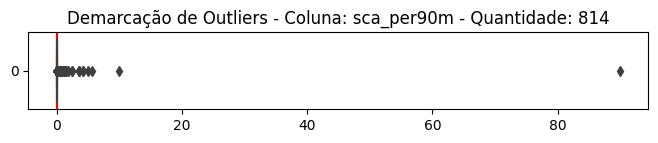



    OUTLIERS DA COLUNA sca_passes_livem
Limite Inferior: -0.019 
Limite Superior: 0.045
Outliers da coluna "sca_passes_livem": [0.045454545, 0.045454545, 0.045454545, 0.045454545, 0.045454545, 0.045503792, 0.045751634, 0.045751634, 0.045843312, 0.045843312, 0.046282246, 0.046296296, 0.046388337, 0.046388337, 0.046572935, 0.046572935, 0.047236181, 0.047236181, 0.047518479, 0.047619048, 0.047619048, 0.047917435, 0.047917435, 0.048192771, 0.048309179, 0.048309179, 0.048313203, 0.048313203, 0.048628429, 0.048721659, 0.048721659, 0.048780488, 0.048780488, 0.049, 0.049180328, 0.049180328, 0.05, 0.05, 0.050185874, 0.050185874, 0.050847458, 0.051020408, 0.051020408, 0.051851852, 0.051851852, 0.051884701, 0.052287582, 0.052631579, 0.052631579, 0.052631579, 0.053571429, 0.053571429, 0.053571429, 0.053571429, 0.054054054, 0.054054054, 0.054054054, 0.055555556, 0.055555556, 0.055923031, 0.056179775, 0.05625, 0.05625, 0.056252239, 0.056603774, 0.056818182, 0.057471264, 0.058823529, 0.058823529, 0

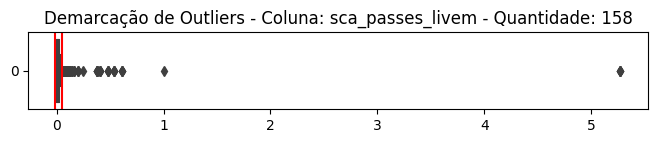



    OUTLIERS DA COLUNA sca_passes_deadm
Limite Inferior: -0.002 
Limite Superior: 0.003
Outliers da coluna "sca_passes_deadm": [0.003174603, 0.00317965, 0.00317965, 0.003210273, 0.003220612, 0.003238866, 0.003257329, 0.00326087, 0.00326087, 0.003267974, 0.003267974, 0.003272251, 0.003278689, 0.003284072, 0.003284072, 0.003294893, 0.003294893, 0.003303965, 0.003304693, 0.003304693, 0.003311258, 0.003311258, 0.003322259, 0.003322259, 0.003324468, 0.003327787, 0.003327787, 0.003327787, 0.003327787, 0.003331945, 0.003331945, 0.003333333, 0.003333333, 0.003336113, 0.003336113, 0.003355705, 0.003355705, 0.003363229, 0.003363229, 0.003372681, 0.003372681, 0.003376749, 0.003376749, 0.003381643, 0.003381643, 0.00338524, 0.003395586, 0.003403014, 0.003403014, 0.003406326, 0.003406326, 0.003409644, 0.003412969, 0.003428571, 0.003466205, 0.003466205, 0.003468781, 0.003468781, 0.003478261, 0.003478261, 0.003478261, 0.003496503, 0.003502627, 0.003502627, 0.003502627, 0.003502627, 0.003502627, 0.00

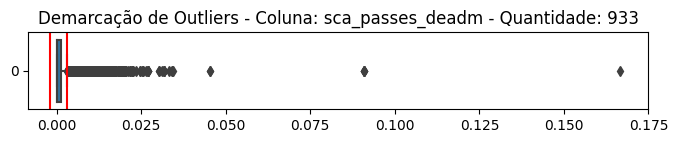



    OUTLIERS DA COLUNA sca_dribblesm
Limite Inferior: -0.003 
Limite Superior: 0.005
Outliers da coluna "sca_dribblesm": [0.004545455, 0.004547177, 0.004547177, 0.004550626, 0.004561003, 0.004561003, 0.004573171, 0.004583652, 0.004591368, 0.004598514, 0.004598514, 0.004614838, 0.004614838, 0.004621072, 0.004634994, 0.004640371, 0.004643963, 0.004643963, 0.004651163, 0.004651163, 0.004652709, 0.004652709, 0.004663212, 0.004703669, 0.004710633, 0.004710633, 0.004748338, 0.004749726, 0.004749726, 0.004752206, 0.004752206, 0.004754358, 0.004761905, 0.004761905, 0.004778157, 0.004778157, 0.004778157, 0.004784689, 0.004784689, 0.004788508, 0.004807692, 0.004807692, 0.004807692, 0.004810583, 0.004815409, 0.004826255, 0.004826255, 0.004830918, 0.004830918, 0.004830918, 0.004830918, 0.004830918, 0.004830918, 0.004849661, 0.004849661, 0.004861449, 0.004884005, 0.004914005, 0.004918033, 0.004926108, 0.004958678, 0.004962779, 0.004966887, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005009107, 0.

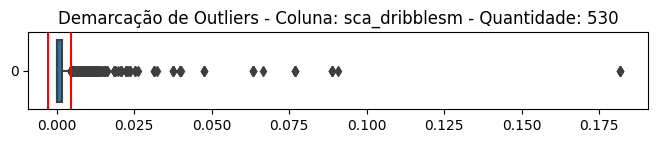



    OUTLIERS DA COLUNA sca_shotsm
Limite Inferior: -0.002 
Limite Superior: 0.004
Outliers da coluna "sca_shotsm": [0.003613836, 0.003624502, 0.003625577, 0.003625577, 0.003629764, 0.003649635, 0.003649635, 0.003660322, 0.003665689, 0.003669725, 0.003676471, 0.003685504, 0.003685504, 0.003692308, 0.003692308, 0.003696858, 0.003696858, 0.003717472, 0.003725025, 0.003725025, 0.003740648, 0.003740648, 0.003741815, 0.003741815, 0.003748438, 0.003748438, 0.00375134, 0.003754693, 0.00375626, 0.00375626, 0.003764115, 0.003784295, 0.003784295, 0.003795066, 0.003795066, 0.003802281, 0.003802281, 0.003809524, 0.003809524, 0.003848268, 0.003848268, 0.003851091, 0.003851091, 0.00385208, 0.003852504, 0.003852504, 0.003854802, 0.003857281, 0.003861004, 0.003861004, 0.003861004, 0.003862868, 0.003865268, 0.003870968, 0.003874092, 0.003874092, 0.003875969, 0.003875969, 0.003887689, 0.003887689, 0.003891051, 0.003897116, 0.003902439, 0.003902439, 0.003913894, 0.003937008, 0.003940887, 0.00396376, 0.0

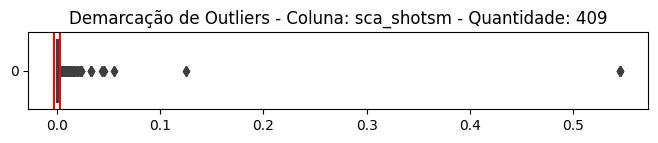



    OUTLIERS DA COLUNA sca_fouledm
Limite Inferior: -0.003 
Limite Superior: 0.004
Outliers da coluna "sca_fouledm": [0.004381161, 0.004399749, 0.004402862, 0.004402862, 0.004405286, 0.004411765, 0.004412355, 0.004415011, 0.00441989, 0.00441989, 0.004424779, 0.004426955, 0.004426955, 0.004444444, 0.004444444, 0.004451039, 0.004451039, 0.004454343, 0.004454343, 0.004461796, 0.004461796, 0.004464286, 0.004475942, 0.004482759, 0.004482759, 0.004489338, 0.004489338, 0.004494382, 0.004494382, 0.004504505, 0.004504505, 0.004514673, 0.004514673, 0.004524887, 0.004524887, 0.004545455, 0.004545455, 0.004545455, 0.004560261, 0.004569688, 0.004573171, 0.004584527, 0.004597701, 0.004597701, 0.004597701, 0.004600345, 0.004600345, 0.004615385, 0.004615385, 0.004618938, 0.004618938, 0.004624277, 0.00462963, 0.00462963, 0.00463392, 0.004642526, 0.004645761, 0.004658385, 0.004658385, 0.004677268, 0.004677268, 0.004689943, 0.004689943, 0.004694836, 0.004702194, 0.004702194, 0.004716981, 0.004716981, 0

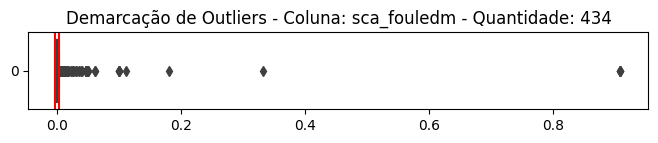



    OUTLIERS DA COLUNA gcam
Limite Inferior: -0.005 
Limite Superior: 0.008
Outliers da coluna "gcam": [0.008474576, 0.008474576, 0.008501594, 0.008501594, 0.008504607, 0.008508509, 0.008510638, 0.008510638, 0.008510638, 0.008513053, 0.008513053, 0.008534851, 0.008547009, 0.008569898, 0.008569898, 0.008595989, 0.008602151, 0.008605852, 0.008624603, 0.008658009, 0.00872818, 0.008733624, 0.008733624, 0.008733624, 0.008733624, 0.008764242, 0.008764242, 0.00877193, 0.008839779, 0.008839779, 0.008849558, 0.008865248, 0.008865248, 0.008879023, 0.00896861, 0.009009009, 0.009009009, 0.009057971, 0.009057971, 0.009315773, 0.009338521, 0.009389671, 0.009389671, 0.009433962, 0.009433962, 0.009478673, 0.009478673, 0.009550761, 0.009550761, 0.009646302, 0.009681881, 0.009743775, 0.009743775, 0.009771987, 0.009803922, 0.00989673, 0.00989673, 0.009920635, 0.01, 0.01, 0.010014306, 0.01010101, 0.010118044, 0.010204082, 0.010204082, 0.010338346, 0.010338346, 0.010404624, 0.010416667, 0.010526316, 0.01

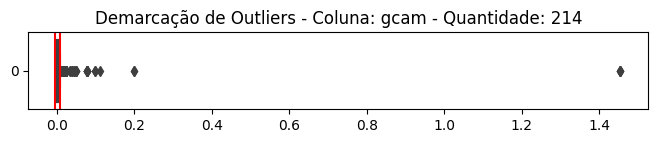



    OUTLIERS DA COLUNA gca_per90m
Limite Inferior: -0.000 
Limite Superior: 0.001
Outliers da coluna "gca_per90m": [0.000526316, 0.000527211, 0.000527578, 0.000527578, 0.000527578, 0.000527578, 0.00052973, 0.00053012, 0.000530822, 0.000532599, 0.000533063, 0.000533188, 0.000533188, 0.000533981, 0.000534483, 0.000534483, 0.000534483, 0.000534483, 0.000534483, 0.000534483, 0.000534483, 0.000534483, 0.000534562, 0.000535065, 0.000539007, 0.000540098, 0.000540541, 0.000541012, 0.000541872, 0.000542169, 0.000545712, 0.000545906, 0.000545906, 0.000550055, 0.000550661, 0.00055094, 0.000553603, 0.000553603, 0.000555033, 0.000555556, 0.000555556, 0.000555973, 0.000555973, 0.00055794, 0.00055794, 0.000558036, 0.000558036, 0.000559541, 0.000559541, 0.000561224, 0.000562771, 0.000562771, 0.000565, 0.000565262, 0.000565371, 0.000565371, 0.000567376, 0.000567376, 0.000567376, 0.000567376, 0.000568513, 0.000568513, 0.000571429, 0.000571429, 0.00057554, 0.00057554, 0.000576271, 0.000576271, 0.000576

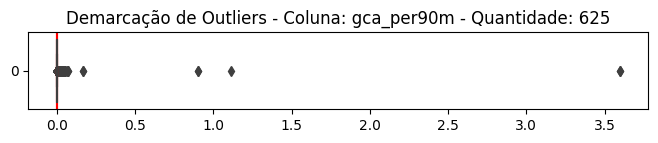



    OUTLIERS DA COLUNA gca_passes_livem
Limite Inferior: -0.003 
Limite Superior: 0.006
Outliers da coluna "gca_passes_livem": [0.005524862, 0.005524862, 0.005524862, 0.005524862, 0.005524862, 0.005524862, 0.005555556, 0.005555556, 0.005555556, 0.005555556, 0.005555556, 0.005555556, 0.005555556, 0.005555556, 0.005567929, 0.005567929, 0.005610098, 0.005610098, 0.005617978, 0.00562249, 0.00562249, 0.005632869, 0.005632869, 0.005639098, 0.005639098, 0.00565971, 0.00565971, 0.005675369, 0.005675369, 0.005714286, 0.005714286, 0.005730659, 0.005758157, 0.005760922, 0.005767013, 0.005804312, 0.005813953, 0.005813953, 0.005818182, 0.005818182, 0.005830904, 0.005830904, 0.005865103, 0.005865103, 0.005882353, 0.005882353, 0.005891016, 0.00589391, 0.00589391, 0.005896226, 0.00590796, 0.00590796, 0.005934718, 0.005948447, 0.005952381, 0.005952381, 0.005952381, 0.005952381, 0.006024096, 0.006024096, 0.006036217, 0.006036217, 0.006044905, 0.006044905, 0.006091371, 0.006091371, 0.006122449, 0.00613

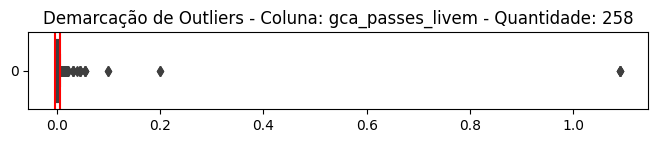



    OUTLIERS DA COLUNA gca_passes_deadm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "gca_passes_deadm": [0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000298864, 0.000298864, 0.000303767, 0.000303767, 0.000307692, 0.000307692, 0.000308642, 0.000308642, 0.000308642, 0.000308642, 0.000308642, 0.000308642, 0.00030931, 0.000309406, 0.000309693, 0.000309789, 0.000312695, 0.000312695, 0.000312989, 0.000312989, 0.00031746, 0.00031746, 0.00031746, 0.000318066, 0.000319081, 0.000319081, 0.00032144, 0.000325521, 0.000325733, 0.000325733, 0.000325839, 0.000326584, 0.000326584, 0.000327011, 0.000327011, 0.000327547, 0.000327547, 0.000327654, 0.000327654, 0.000328623, 0.000328623, 0.000329707, 0.000329707, 0.000330251, 0.000330251, 0.000330907, 0.000330907, 0.000331345, 0.000331345, 0.000332447, 0.000335008, 0.000335008, 0.0003367, 0.0003367, 0.0003367, 0.000337268, 0.000337268, 0.000339098, 0.000339098, 0.00034002, 0.00034002, 0.000340832, 0.000340832, 

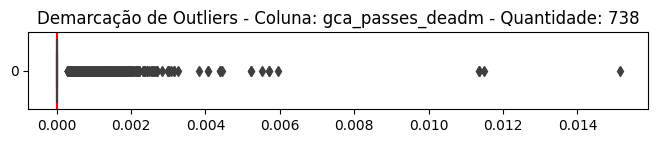



    OUTLIERS DA COLUNA gca_dribblesm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "gca_dribblesm": [0.000292398, 0.000292398, 0.000292398, 0.000298954, 0.000299581, 0.000303122, 0.000303122, 0.000303398, 0.000303398, 0.00030581, 0.00030581, 0.000309789, 0.000309981, 0.000309981, 0.000310945, 0.000310945, 0.000311526, 0.000311526, 0.000312695, 0.000312695, 0.000313087, 0.000313087, 0.000313578, 0.000313578, 0.00031746, 0.00031746, 0.000319285, 0.000319285, 0.000325203, 0.000325203, 0.000325733, 0.000327011, 0.000327011, 0.000327332, 0.000327332, 0.000327976, 0.000327976, 0.000330142, 0.000331345, 0.000331345, 0.000331345, 0.000331345, 0.000331675, 0.000332336, 0.000332336, 0.000332668, 0.000332668, 0.000332668, 0.000332668, 0.000332889, 0.000332889, 0.000335683, 0.000336022, 0.000336022, 0.000336022, 0.000336022, 0.000336134, 0.000336134, 0.000336474, 0.000336474, 0.000336587, 0.000336587, 0.000337268, 0.000337268, 0.000337838, 0.000337838, 0.000338639, 0.00033863

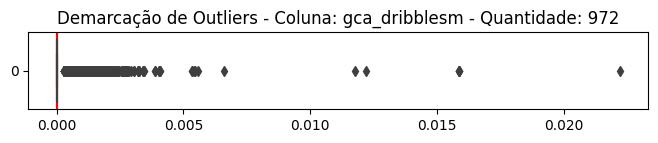



    OUTLIERS DA COLUNA gca_shotsm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "gca_shotsm": [0.000298864, 0.000298864, 0.000299581, 0.0003003, 0.0003003, 0.000301932, 0.000301932, 0.000302206, 0.000302206, 0.000303122, 0.000303122, 0.000303398, 0.000303398, 0.000304878, 0.000305717, 0.000305717, 0.00030581, 0.00030581, 0.000306937, 0.000308642, 0.000308642, 0.000308737, 0.000309789, 0.000309981, 0.000309981, 0.000311526, 0.000311526, 0.000313578, 0.000313578, 0.000313775, 0.000315457, 0.000316156, 0.00031736, 0.000317662, 0.000317662, 0.000318066, 0.000319081, 0.000319081, 0.000319285, 0.00032144, 0.00032144, 0.000321854, 0.000321854, 0.000322997, 0.000322997, 0.000323625, 0.000323625, 0.000323625, 0.000323834, 0.000324044, 0.000324044, 0.000324992, 0.000324992, 0.000325733, 0.000326797, 0.000326797, 0.000326797, 0.000326797, 0.000327011, 0.000327011, 0.000327118, 0.000328407, 0.000328407, 0.000329056, 0.000329056, 0.000329707, 0.000330142, 0.000330142, 0.000330

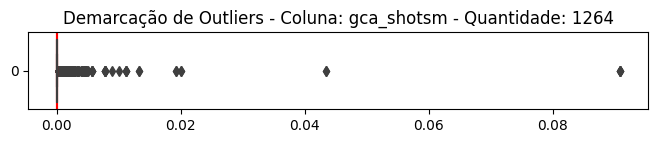



    OUTLIERS DA COLUNA gca_fouledm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "gca_fouledm": [0.000292398, 0.000292398, 0.000293169, 0.000293169, 0.000293945, 0.000293945, 0.000295596, 0.000296824, 0.000299581, 0.000303122, 0.000303122, 0.000305717, 0.000305717, 0.000308356, 0.000308356, 0.000308642, 0.000308928, 0.00030931, 0.000316857, 0.00031736, 0.00031746, 0.00031746, 0.000317662, 0.000318878, 0.000319081, 0.000319081, 0.000321234, 0.00032144, 0.00032144, 0.000323625, 0.000323625, 0.000323834, 0.000323939, 0.000323939, 0.000324992, 0.000324992, 0.000325733, 0.000326797, 0.000326797, 0.000327011, 0.000327011, 0.000327332, 0.000327332, 0.000327761, 0.000329707, 0.000329707, 0.000329924, 0.000329924, 0.000330142, 0.000330142, 0.000331675, 0.000331675, 0.000331895, 0.000332336, 0.000332336, 0.000332889, 0.000332889, 0.000334336, 0.000334336, 0.000335008, 0.000335008, 0.000336022, 0.000336022, 0.0003367, 0.000338639, 0.000338639, 0.000341297, 0.00034188, 0.0003

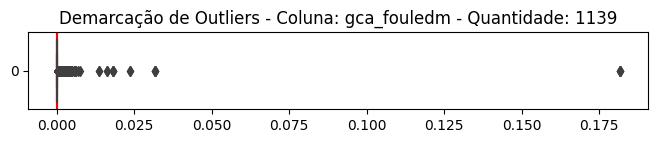



    OUTLIERS DA COLUNA gca_og_form
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "gca_og_form": [0.000292398, 0.000292398, 0.000293169, 0.000293169, 0.000304878, 0.000306748, 0.000306748, 0.000307692, 0.000307692, 0.000308642, 0.000308642, 0.000312989, 0.000312989, 0.000314961, 0.00031746, 0.000318573, 0.000318878, 0.000318878, 0.000320513, 0.000320513, 0.000321234, 0.00032144, 0.00032144, 0.000324992, 0.000324992, 0.000325203, 0.000325203, 0.000325733, 0.000326158, 0.000326158, 0.000326797, 0.000326797, 0.000329381, 0.000329381, 0.000329598, 0.000329598, 0.000329707, 0.000330142, 0.000331345, 0.000331345, 0.000331345, 0.000331345, 0.000333667, 0.000333667, 0.000334336, 0.000334336, 0.000335008, 0.000335008, 0.000338639, 0.000338639, 0.00034188, 0.00034188, 0.000341997, 0.0003465, 0.000346741, 0.000347826, 0.000347826, 0.000354988, 0.000354988, 0.00035524, 0.00035524, 0.000355745, 0.000360881, 0.000360881, 0.000366032, 0.000367107, 0.000367107, 0.000368596, 0.0003

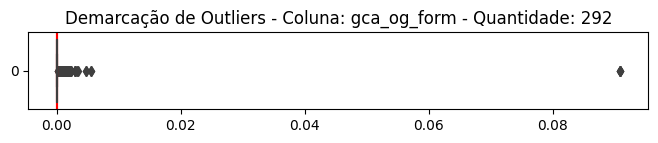



    OUTLIERS DA COLUNA tacklesm
Limite Inferior: -0.014 
Limite Superior: 0.048
Outliers da coluna "tacklesm": [0.048412698, 0.048543689, 0.048543689, 0.048780488, 0.048780488, 0.048780488, 0.048821549, 0.048821549, 0.048821549, 0.048821549, 0.048951049, 0.048951049, 0.049371634, 0.049371634, 0.049963262, 0.049963262, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.050198151, 0.050198151, 0.050473186, 0.050632911, 0.050632911, 0.050632911, 0.050632911, 0.051652893, 0.051652893, 0.051724138, 0.051724138, 0.051724138, 0.05204461, 0.05204461, 0.052083333, 0.052356021, 0.052631579, 0.052631579, 0.052631579, 0.052980132, 0.053370787, 0.054054054, 0.054545455, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.056074766, 0.056074766, 0.058823529, 0.058823529, 0.058823529, 0.058823529, 0.06, 0.06, 0.06, 0.061111111, 0.061728395, 0.0625, 0.0625, 0.0625, 0.0625, 0.063559322, 0.0645161

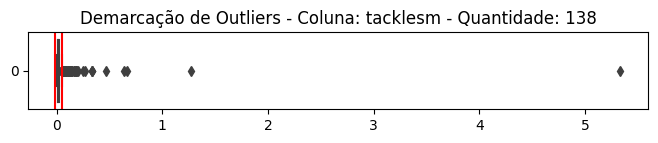



    OUTLIERS DA COLUNA tackles_wonm
Limite Inferior: -0.010 
Limite Superior: 0.031
Outliers da coluna "tackles_wonm": [0.030927835, 0.030927835, 0.030927835, 0.030927835, 0.030991736, 0.030991736, 0.031211998, 0.031211998, 0.031220435, 0.03125, 0.031279621, 0.031279621, 0.031413613, 0.031446541, 0.031446541, 0.031486146, 0.031486146, 0.031545741, 0.031545741, 0.031986532, 0.031986532, 0.031986532, 0.031986532, 0.032026505, 0.032026505, 0.032258065, 0.032258065, 0.032258065, 0.032258065, 0.032541133, 0.032541133, 0.032786885, 0.032786885, 0.032967033, 0.032967033, 0.033025099, 0.033025099, 0.033070388, 0.033070388, 0.033213645, 0.033213645, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033613445, 0.033613445, 0.033613445, 0.033613445, 0.033613445, 0.033613445, 0.034482759, 0.034482759, 0.034482759, 0.034482759, 0.034700315, 0.035087719, 0.035087719, 0.035087719, 0.035087719, 0.035502959, 0.035502959, 0.035714286, 0.035714286, 0.036363636

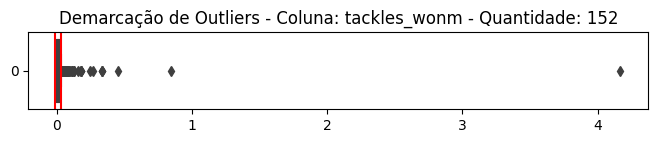



    OUTLIERS DA COLUNA tackles_def_3rdm
Limite Inferior: -0.014 
Limite Superior: 0.029
Outliers da coluna "tackles_def_3rdm": [0.029861111, 0.029861111, 0.03030303, 0.03030303, 0.03030303, 0.030540329, 0.030540329, 0.030927835, 0.030927835, 0.030927835, 0.030927835, 0.031128405, 0.031128405, 0.03125, 0.03125, 0.031269943, 0.031269943, 0.031282051, 0.031282051, 0.032258065, 0.032258065, 0.032258065, 0.032258065, 0.032657658, 0.032657658, 0.032786885, 0.032786885, 0.033057851, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033613445, 0.033613445, 0.033898305, 0.034090909, 0.034090909, 0.034482759, 0.034482759, 0.034482759, 0.034920635, 0.034965035, 0.034965035, 0.035087719, 0.035616438, 0.035714286, 0.036363636, 0.037174721, 0.037174721, 0.037190083, 0.037190083, 0.038461538, 0.038888889, 0.038888889, 0.038888889, 0.038888889, 0.039215686, 0.039473684, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.041666667, 0.042042042, 0.04444

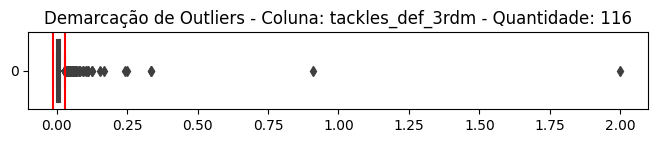



    OUTLIERS DA COLUNA tackles_mid_3rdm
Limite Inferior: -0.008 
Limite Superior: 0.020
Outliers da coluna "tackles_mid_3rdm": [0.020427112, 0.020440252, 0.020599251, 0.020599251, 0.020647149, 0.020647149, 0.020740741, 0.020833333, 0.020833333, 0.020833333, 0.020869565, 0.020869565, 0.020973783, 0.021016949, 0.021016949, 0.021017699, 0.021097046, 0.021097046, 0.021097046, 0.021097046, 0.021097046, 0.021126761, 0.021148036, 0.021159875, 0.021159875, 0.02124834, 0.021276596, 0.021421616, 0.021453287, 0.021505376, 0.021505376, 0.021505376, 0.021505376, 0.021520803, 0.021520803, 0.021538462, 0.021546261, 0.021546261, 0.021759697, 0.021772939, 0.021772939, 0.021885522, 0.021885522, 0.021885522, 0.021885522, 0.021959459, 0.021978022, 0.02202381, 0.022042616, 0.022042616, 0.022044088, 0.022044088, 0.022044088, 0.022044088, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022384428, 0.022384428, 0.02238806, 0.022592792, 0.022592792, 0.

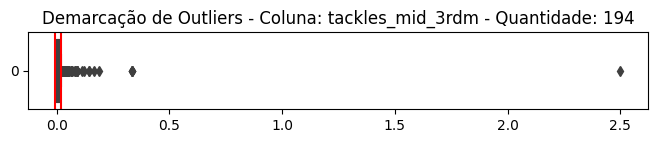



    OUTLIERS DA COLUNA tackles_att_3rdm
Limite Inferior: -0.005 
Limite Superior: 0.008
Outliers da coluna "tackles_att_3rdm": [0.008223684, 0.008241758, 0.008241758, 0.008278146, 0.008278146, 0.008333333, 0.008356546, 0.008368201, 0.008375209, 0.008375209, 0.008426966, 0.008426966, 0.008454106, 0.008474576, 0.008522727, 0.008522727, 0.008534851, 0.008534851, 0.008595989, 0.00862069, 0.00862069, 0.00862069, 0.00862069, 0.008695652, 0.008695652, 0.008695652, 0.008810573, 0.008823529, 0.008833922, 0.008849558, 0.00886918, 0.008928571, 0.009011909, 0.009011909, 0.00907441, 0.009090909, 0.009098101, 0.009098101, 0.009248555, 0.009287926, 0.009411765, 0.009411765, 0.009433962, 0.009478673, 0.009478673, 0.00952381, 0.00952381, 0.009546539, 0.009646302, 0.009803922, 0.009803922, 0.00990099, 0.00990099, 0.01, 0.01010101, 0.010138741, 0.010138741, 0.01025641, 0.01025641, 0.010309278, 0.010309278, 0.010362694, 0.010362694, 0.010416667, 0.010416667, 0.010471204, 0.010471204, 0.01056338, 0.01075

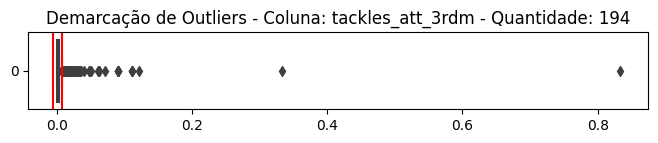



    OUTLIERS DA COLUNA dribble_tacklesm
Limite Inferior: -0.009 
Limite Superior: 0.019
Outliers da coluna "dribble_tacklesm": [0.01953125, 0.019607843, 0.019607843, 0.019607843, 0.019607843, 0.019638649, 0.01965602, 0.019685039, 0.019691325, 0.019691325, 0.01979638, 0.019825535, 0.019826518, 0.019826518, 0.01986755, 0.019900498, 0.02, 0.02034588, 0.020512821, 0.020618557, 0.020618557, 0.020618557, 0.020661157, 0.020661157, 0.020833333, 0.020833333, 0.020866774, 0.020942408, 0.020979021, 0.020979021, 0.021276596, 0.021303258, 0.021459227, 0.021459227, 0.021512838, 0.02173913, 0.021978022, 0.021978022, 0.022012579, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022522523, 0.022727273, 0.022727273, 0.022727273, 0.022727273, 0.023041475, 0.023041475, 0.023560209, 0.023809524, 0.023809524, 0.024024024, 0.024390244, 0.024390244, 0.024390244, 0.024657534, 0.025, 0.025210084, 0.025

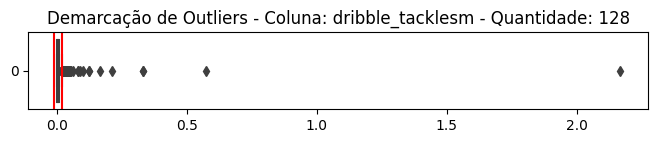



    OUTLIERS DA COLUNA dribbles_vsm
Limite Inferior: -0.014 
Limite Superior: 0.048
Outliers da coluna "dribbles_vsm": [0.048387097, 0.048387097, 0.048387097, 0.048429319, 0.048455804, 0.048685492, 0.048780488, 0.048780488, 0.048837209, 0.048888889, 0.048913043, 0.048913043, 0.048913043, 0.048913043, 0.049019608, 0.04909285, 0.04909285, 0.049180328, 0.049450549, 0.049450549, 0.049847406, 0.05, 0.05, 0.05, 0.05, 0.050139276, 0.050139276, 0.05019305, 0.050434783, 0.050847458, 0.051166966, 0.051166966, 0.051502146, 0.051502146, 0.051519155, 0.051519155, 0.052301255, 0.052301255, 0.052980132, 0.053061224, 0.053149606, 0.054816392, 0.054816392, 0.057471264, 0.057553957, 0.058139535, 0.05840708, 0.058823529, 0.058823529, 0.058823529, 0.059701493, 0.06, 0.06, 0.06, 0.06, 0.06, 0.060606061, 0.060606061, 0.060606061, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.063241107, 0.063241107, 0.063829787, 0.06557377, 0.06557377, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.

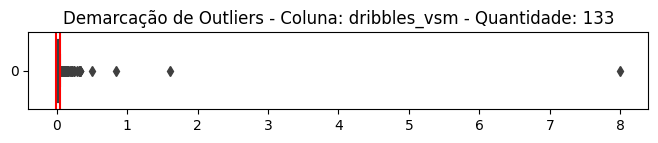



    OUTLIERS DA COLUNA dribble_tackles_pctm
Limite Inferior: -0.035 
Limite Superior: 0.078
Outliers da coluna "dribble_tackles_pctm": [0.078470588, 0.078470588, 0.078616352, 0.079285714, 0.079285714, 0.079365079, 0.079428571, 0.079491256, 0.079637378, 0.079712747, 0.079712747, 0.079734848, 0.079734848, 0.079856115, 0.079856115, 0.079973992, 0.080144404, 0.080256822, 0.080256822, 0.08062954, 0.080808081, 0.080808081, 0.080941176, 0.080941176, 0.081008902, 0.081008902, 0.08101983, 0.08101983, 0.08101983, 0.08101983, 0.08125, 0.08125, 0.081433225, 0.081433225, 0.081433225, 0.081433225, 0.081433225, 0.081433225, 0.081833061, 0.082015504, 0.082015504, 0.082089552, 0.082222222, 0.082264957, 0.082264957, 0.082334869, 0.082334869, 0.082596291, 0.082596291, 0.082644628, 0.082644628, 0.082742317, 0.082795699, 0.082882883, 0.082987552, 0.083194676, 0.083194676, 0.083194676, 0.083194676, 0.083333333, 0.083472454, 0.083472454, 0.083587786, 0.084033613, 0.084033613, 0.084132841, 0.084132841, 0.08

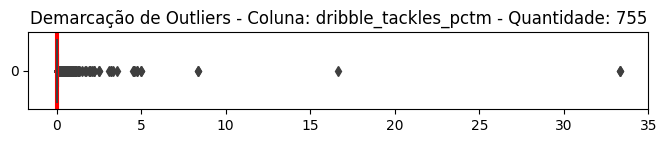



    OUTLIERS DA COLUNA dribbled_pastm
Limite Inferior: -0.010 
Limite Superior: 0.032
Outliers da coluna "dribbled_pastm": [0.032258065, 0.032258065, 0.032258065, 0.032440056, 0.032551098, 0.032551098, 0.032552083, 0.03255814, 0.03255814, 0.03255814, 0.03255814, 0.03257329, 0.032608696, 0.032608696, 0.032608696, 0.032608696, 0.032704403, 0.032704403, 0.032786885, 0.032786885, 0.032786885, 0.03286385, 0.033043478, 0.033043478, 0.033105623, 0.033112583, 0.033119658, 0.033119658, 0.033119658, 0.033119658, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033447099, 0.033464567, 0.033667335, 0.033667335, 0.033738938, 0.033898305, 0.034031414, 0.034090909, 0.034090909, 0.034151547, 0.034151547, 0.034170854, 0.034170854, 0.034212402, 0.034212402, 0.034299517, 0.034299517, 0.034482759, 0.034482759, 0.034482759, 0.034564958, 0.034615385, 0.034615385, 0.034782609, 0.034782609, 0.034883721, 0.034883721, 0.035, 0.035, 0.035008977, 0.035008977, 0.035125067, 0.035125067, 0.035308

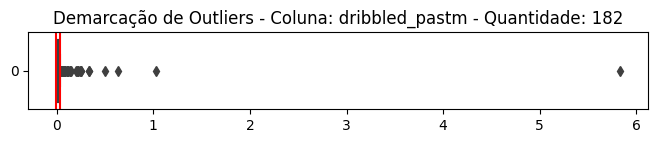



    OUTLIERS DA COLUNA pressuresm
Limite Inferior: -0.064 
Limite Superior: 0.417
Outliers da coluna "pressuresm": [0.417253521, 0.418604651, 0.423611111, 0.423611111, 0.425531915, 0.427792916, 0.431876607, 0.431876607, 0.433333333, 0.442622951, 0.442622951, 0.444444444, 0.444444444, 0.444444444, 0.444444444, 0.445945946, 0.445945946, 0.453125, 0.461538462, 0.464788732, 0.464788732, 0.464788732, 0.464788732, 0.466666667, 0.469026549, 0.470588235, 0.470588235, 0.470588235, 0.479338843, 0.482758621, 0.485714286, 0.486028789, 0.486028789, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.523404255, 0.523404255, 0.523809524, 0.533333333, 0.538461538, 0.545454545, 0.545454545, 0.552631579, 0.552631579, 0.555555556, 0.564705882, 0.583333333, 0.583333333, 0.592592593, 0.636363636, 0.648648649, 0.655555556, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.67881549, 0.714285714, 0.714285714, 0.764705882, 0.8, 0.833

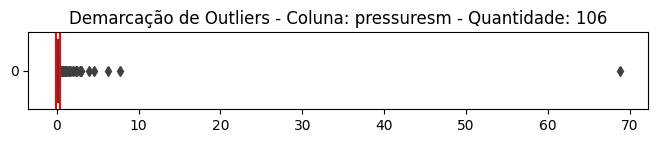



    OUTLIERS DA COLUNA pressure_regainsm
Limite Inferior: -0.011 
Limite Superior: 0.104
Outliers da coluna "pressure_regainsm": [0.103773585, 0.104046243, 0.104055496, 0.104055496, 0.104072398, 0.10411985, 0.104166667, 0.104166667, 0.104436229, 0.104436229, 0.104477612, 0.104477612, 0.105, 0.105263158, 0.105263158, 0.105571848, 0.105571848, 0.106060606, 0.10627268, 0.10627268, 0.107249255, 0.107329843, 0.107714702, 0.107714702, 0.108108108, 0.108490566, 0.108490566, 0.109375, 0.111111111, 0.111111111, 0.111111111, 0.111111111, 0.111111111, 0.111111111, 0.111111111, 0.111111111, 0.112343967, 0.112343967, 0.112903226, 0.112903226, 0.113247863, 0.113247863, 0.114893617, 0.116071429, 0.116883117, 0.116883117, 0.116883117, 0.116883117, 0.116883117, 0.116883117, 0.117696867, 0.117696867, 0.117957746, 0.11820331, 0.118644068, 0.119148936, 0.119148936, 0.12, 0.120603015, 0.121212121, 0.121212121, 0.12173913, 0.122222222, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.12567714, 0.12567714, 0.12

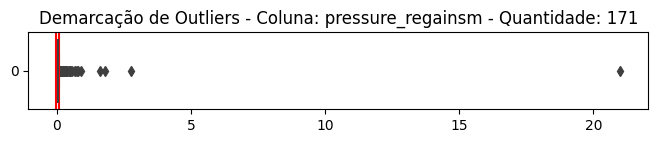



    OUTLIERS DA COLUNA pressure_regain_pctm
Limite Inferior: -0.036 
Limite Superior: 0.091
Outliers da coluna "pressure_regain_pctm": [0.091428571, 0.091860465, 0.092173913, 0.092173913, 0.092592593, 0.092592593, 0.092600897, 0.092600897, 0.092901235, 0.092920354, 0.093061224, 0.093061224, 0.093144208, 0.093292683, 0.093292683, 0.093362832, 0.093375394, 0.093375394, 0.093382353, 0.093382353, 0.093632959, 0.093655589, 0.093655589, 0.093846154, 0.094161959, 0.094339623, 0.094413408, 0.094413408, 0.094413408, 0.094413408, 0.094642857, 0.09469697, 0.09469697, 0.095111111, 0.095238095, 0.095454545, 0.095454545, 0.0956, 0.09569378, 0.095754717, 0.095754717, 0.095925926, 0.096, 0.096, 0.096153846, 0.096153846, 0.096296296, 0.096428571, 0.096899225, 0.097009967, 0.097021277, 0.097021277, 0.097183099, 0.097276265, 0.097943445, 0.097945205, 0.098245614, 0.098245614, 0.098275862, 0.098698885, 0.098698885, 0.09874477, 0.098809524, 0.098809524, 0.098963731, 0.099122807, 0.09939577, 0.099404762, 

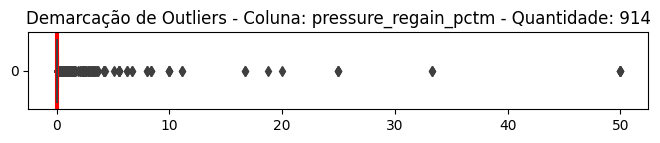



    OUTLIERS DA COLUNA pressures_def_3rdm
Limite Inferior: -0.044 
Limite Superior: 0.153
Outliers da coluna "pressures_def_3rdm": [0.153191489, 0.153191489, 0.153846154, 0.153846154, 0.153846154, 0.153846154, 0.155555556, 0.155555556, 0.155555556, 0.155555556, 0.156637168, 0.156862745, 0.157894737, 0.157894737, 0.158730159, 0.159851301, 0.159851301, 0.162162162, 0.162162162, 0.162162162, 0.163793103, 0.163793103, 0.163967611, 0.163967611, 0.165165165, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.167517549, 0.167517549, 0.168874172, 0.168874172, 0.169625247, 0.169625247, 0.169658887, 0.169658887, 0.170347003, 0.172413793, 0.173913043, 0.173913043, 0.174468085, 0.174468085, 0.175, 0.177777778, 0.177777778, 0.181818182, 0.185185185, 0.186813187, 0.187096774, 0.1875, 0.189189189, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.205714286, 0.205714286, 0.214285714, 0.21875, 0.222222222, 0.233333333, 0.235294118, 0.25, 0.25, 0.266666667, 0.266666667, 0.269230769, 0.27777777

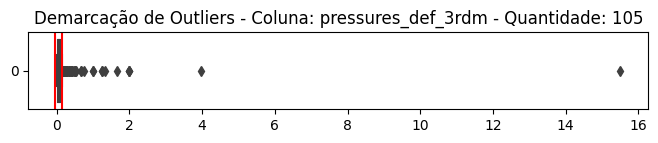



    OUTLIERS DA COLUNA pressures_mid_3rdm
Limite Inferior: -0.074 
Limite Superior: 0.229
Outliers da coluna "pressures_mid_3rdm": [0.231638418, 0.235294118, 0.235449735, 0.235449735, 0.236363636, 0.236363636, 0.236363636, 0.236363636, 0.23655914, 0.23655914, 0.23655914, 0.23655914, 0.23907455, 0.23907455, 0.23943662, 0.23943662, 0.23943662, 0.23943662, 0.239782016, 0.24, 0.242424242, 0.244117647, 0.245901639, 0.245901639, 0.246575342, 0.246575342, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.254237288, 0.255555556, 0.255555556, 0.255813953, 0.259259259, 0.261904762, 0.264367816, 0.272727273, 0.272727273, 0.272727273, 0.272727273, 0.272727273, 0.280851064, 0.280851064, 0.285351397, 0.285351397, 0.285714286, 0.285714286, 0.288888889, 0.288888889, 0.297297297, 0.309734513, 0.317647059, 0.317647059, 0.318181818, 0.333333333, 0.333333333, 0.333333333, 0.333333333, 0.333333333, 0.375, 0.375, 0.375, 0.4, 0.4, 0.4, 0.4, 0.416666667, 0.416666667, 0.41

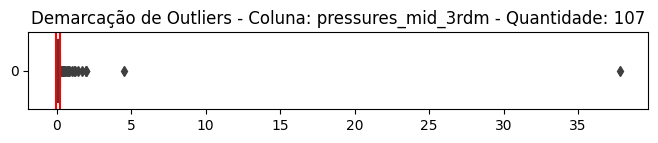



    OUTLIERS DA COLUNA pressures_att_3rdm
Limite Inferior: -0.075 
Limite Superior: 0.144
Outliers da coluna "pressures_att_3rdm": [0.143884892, 0.143884892, 0.144155058, 0.144462279, 0.145833333, 0.146214099, 0.146214099, 0.146214099, 0.146214099, 0.146666667, 0.147058824, 0.147138965, 0.148179509, 0.148179509, 0.148717949, 0.148717949, 0.148774303, 0.14893617, 0.149253731, 0.149253731, 0.150384843, 0.150855365, 0.150855365, 0.151020408, 0.153439153, 0.153439153, 0.153846154, 0.154918668, 0.154918668, 0.155405405, 0.156626506, 0.156626506, 0.156626506, 0.156626506, 0.158730159, 0.158730159, 0.16, 0.16, 0.162162162, 0.162790698, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.166666667, 0.172222222, 0.173134328, 0.173134328, 0.176470588, 0.176470588, 0.178571429, 0.180555556, 0.180555556, 0.181818182, 0.181818182, 0.181818182, 0.182119205, 0.182119205, 0.182795699, 0.185185185, 0.1875, 0.1875, 0.188552189, 0.19597

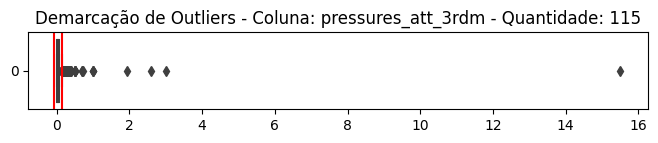



    OUTLIERS DA COLUNA blocksm
Limite Inferior: -0.008 
Limite Superior: 0.039
Outliers da coluna "blocksm": [0.038932949, 0.038932949, 0.038932949, 0.038932949, 0.038961039, 0.038961039, 0.039215686, 0.039473684, 0.039494471, 0.039494471, 0.03968254, 0.039735099, 0.039735099, 0.039772727, 0.04, 0.04, 0.04, 0.04, 0.04, 0.040160643, 0.040816327, 0.040816327, 0.040816327, 0.040816327, 0.04109589, 0.04109589, 0.041269841, 0.042253521, 0.042857143, 0.043478261, 0.043478261, 0.043478261, 0.044088176, 0.044088176, 0.044088176, 0.044088176, 0.044117647, 0.044444444, 0.044609665, 0.04519774, 0.045454545, 0.045454545, 0.046728972, 0.046875, 0.047619048, 0.05, 0.05, 0.050420168, 0.050761421, 0.050847458, 0.051282051, 0.054054054, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.056603774, 0.056603774, 0.058823529, 0.058823529, 0.058823529, 0.058823529, 0.060606061, 0.060606061, 0.0625, 0.066666667, 

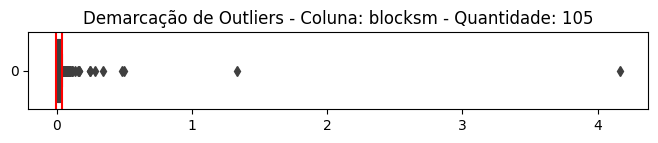



    OUTLIERS DA COLUNA blocked_shotsm
Limite Inferior: -0.007 
Limite Superior: 0.011
Outliers da coluna "blocked_shotsm": [0.011455108, 0.011462206, 0.011472275, 0.011472275, 0.011494253, 0.011532125, 0.011538462, 0.011538462, 0.01156515, 0.01156515, 0.011579818, 0.011594203, 0.011594203, 0.01161919, 0.011622501, 0.011622501, 0.011627907, 0.011627907, 0.011627907, 0.011666667, 0.011666667, 0.011673152, 0.011717545, 0.011717545, 0.011805556, 0.01181767, 0.011832061, 0.01183432, 0.011851852, 0.011875512, 0.011877395, 0.011880165, 0.011880165, 0.011961722, 0.011985617, 0.011986301, 0.011986301, 0.011991435, 0.011991435, 0.011995638, 0.012012012, 0.012048193, 0.012048193, 0.012048193, 0.012084592, 0.012084592, 0.01210121, 0.01210121, 0.012102874, 0.012116892, 0.012116892, 0.012121212, 0.012126112, 0.012126112, 0.012207528, 0.012218045, 0.012218045, 0.012345679, 0.012345679, 0.012371134, 0.012378426, 0.012378426, 0.012446774, 0.012480499, 0.012519562, 0.012559809, 0.012605042, 0.01262433

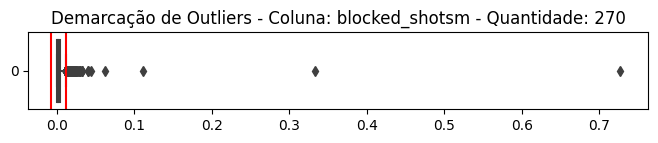



    OUTLIERS DA COLUNA blocked_shots_savesm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "blocked_shots_savesm": [0.000292398, 0.000292398, 0.000292398, 0.000293945, 0.000293945, 0.000296824, 0.000299581, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.000308452, 0.000308737, 0.000308833, 0.000308833, 0.000308928, 0.000309789, 0.000309789, 0.000315657, 0.000315856, 0.000315856, 0.000319285, 0.000319489, 0.000319489, 0.000321337, 0.000321337, 0.000322997, 0.000322997, 0.000323625, 0.000323834, 0.000326797, 0.000326797, 0.000326904, 0.000326904, 0.000327011, 0.000327011, 0.000327976, 0.000327976, 0.000328407, 0.000328407, 0.000330142, 0.000330251, 0.000330251, 0.000330688, 0.000330688, 0.000333, 0.000333, 0.000334001, 0.000334001, 0.000335683, 0.000336134, 0.000336134, 0.000336247, 0.000336247, 0.0003367, 0.000336814, 0.000336814, 0.000336927, 0.000339674, 0.000339674, 0.000339905, 0.000339905, 0.00034153, 0.00034153, 0.00034153, 0.00034153, 0.00034188, 0.00034188, 0

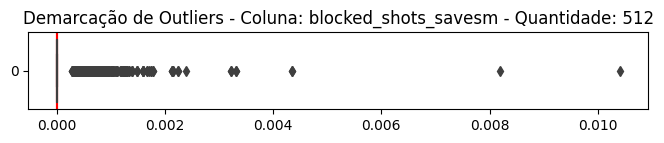



    OUTLIERS DA COLUNA blocked_passesm
Limite Inferior: -0.007 
Limite Superior: 0.031
Outliers da coluna "blocked_passesm": [0.031460674, 0.031595577, 0.031595577, 0.031746032, 0.031746032, 0.031746032, 0.031746032, 0.031746032, 0.031746032, 0.031746032, 0.031746032, 0.031746032, 0.032258065, 0.032258065, 0.032258065, 0.032326444, 0.032550694, 0.032550694, 0.032590051, 0.032608696, 0.032608696, 0.032663317, 0.032667877, 0.032738095, 0.032786885, 0.032786885, 0.032894737, 0.032967033, 0.032967033, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033444816, 0.033444816, 0.033613445, 0.033678756, 0.033898305, 0.034016572, 0.034031414, 0.034068136, 0.034068136, 0.034068136, 0.034068136, 0.034188034, 0.034188034, 0.034188034, 0.034482759, 0.034482759, 0.034482759, 0.034482759, 0.034700315, 0.034700315, 0.035087719, 0.035294118, 0.035294118, 0.035353535, 0.035353535, 0.035555556, 0.035555556, 0.035714286, 0.035714286, 0.035761589, 0.035761589, 0.036036036, 0.036048064, 0.036585366, 0

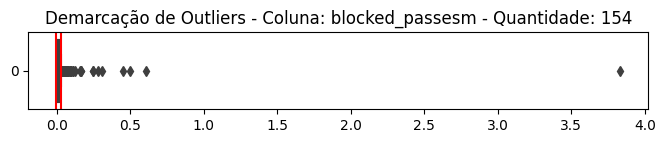



    OUTLIERS DA COLUNA interceptionsm
Limite Inferior: -0.011 
Limite Superior: 0.025
Outliers da coluna "interceptionsm": [0.025137112, 0.025137112, 0.025210084, 0.025210084, 0.025210084, 0.025210084, 0.025477707, 0.025477707, 0.025659301, 0.025659301, 0.025787966, 0.025862069, 0.025862069, 0.025862069, 0.025862069, 0.025869038, 0.025869038, 0.025914634, 0.025914634, 0.025925926, 0.025925926, 0.026470588, 0.026470588, 0.026470588, 0.026548673, 0.026548673, 0.026548673, 0.027027027, 0.027027027, 0.027027027, 0.027027027, 0.027027027, 0.027710843, 0.028037383, 0.028392959, 0.028392959, 0.028514257, 0.028514257, 0.028571429, 0.029411765, 0.029661017, 0.029673591, 0.029673591, 0.03030303, 0.03030303, 0.030357143, 0.030357143, 0.030769231, 0.03125, 0.03125, 0.03125, 0.031313131, 0.031313131, 0.031746032, 0.031746032, 0.031746032, 0.031746032, 0.031746032, 0.031746032, 0.031746032, 0.031862745, 0.031862745, 0.032258065, 0.032258065, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.03

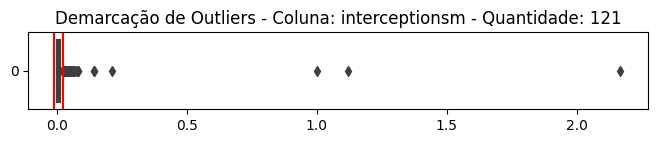



    OUTLIERS DA COLUNA clearancesm
Limite Inferior: -0.039 
Limite Superior: 0.076
Outliers da coluna "clearancesm": [0.075801749, 0.075816993, 0.075862069, 0.075970737, 0.076109937, 0.076251723, 0.076416337, 0.076479076, 0.076495726, 0.076547231, 0.076547231, 0.076574536, 0.076579451, 0.076585695, 0.076585695, 0.076710435, 0.076712329, 0.076712329, 0.076779026, 0.076779026, 0.076843556, 0.076923077, 0.076923077, 0.076923077, 0.077025232, 0.077060134, 0.077060134, 0.077120823, 0.077154309, 0.077154309, 0.07721843, 0.077239113, 0.077348066, 0.077380952, 0.077452668, 0.077561328, 0.077660594, 0.077777778, 0.077777778, 0.07793345, 0.077933847, 0.078114478, 0.078114478, 0.078187251, 0.078187251, 0.078567302, 0.078665077, 0.078665077, 0.078947368, 0.078965758, 0.079012346, 0.079012346, 0.079228243, 0.079516539, 0.07957958, 0.079710145, 0.079961464, 0.079962808, 0.079962808, 0.079978237, 0.080078125, 0.080078125, 0.080106414, 0.08044164, 0.080794702, 0.081041437, 0.081041437, 0.08115942, 0

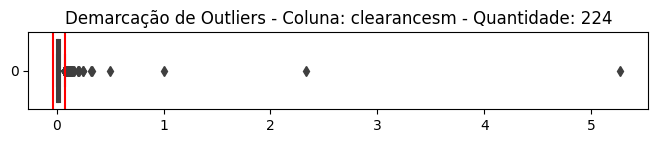



    OUTLIERS DA COLUNA errorsm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "errorsm": [0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000296824, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.000300842, 0.000300842, 0.000305717, 0.000305717, 0.000306748, 0.000306748, 0.000306937, 0.000308356, 0.000308356, 0.000308642, 0.00030931, 0.000309406, 0.000309598, 0.000309789, 0.000310945, 0.000310945, 0.000311236, 0.000311236, 0.000312989, 0.000312989, 0.000313087, 0.000313087, 0.00031407, 0.00031407, 0.000314268, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.000318066, 0.00031837, 0.000319081, 0.000319081, 0.000320513, 0.000320513, 0.000323415, 0.000323415, 0.000323415, 0.000323625

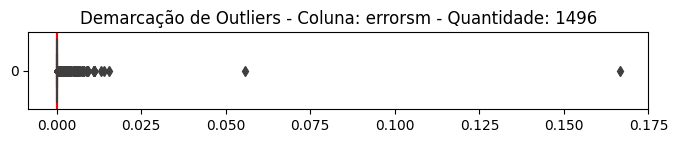



    OUTLIERS DA COLUNA touchesm
Limite Inferior: 0.086 
Limite Superior: 1.100
Outliers da coluna "touchesm": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.08, 0.08, 0.081081081, 1.108661417, 1.111111111, 1.117055511, 1.117459191, 1.118932039, 1.118932039, 1.122963741, 1.125, 1.126501201, 1.126501201, 1.127659574, 1.128687691, 1.136551724, 1.136551724, 1.139469226, 1.145388643, 1.148148148, 1.14968652, 1.15, 1.153119093, 1.157608696, 1.157608696, 1.158730159, 1.159763314, 1.159763314, 1.164179104, 1.181818182, 1.181818182, 1.181818182, 1.181818182, 1.181818182, 1.194690265, 1.194690265, 1.194690265, 1.194690265, 1.2, 1.205555556, 1.205555556, 1.205555556, 1.205555556, 1.215613383, 1.215613383, 1.219265567, 1.219265567, 1.230958231, 1.25, 1.261808367, 1.264986968, 1.264986968, 1.272727273, 1.333333333, 1.333333333, 1.333333333, 1.333333333, 1.425287356, 1.431034483, 1.5, 1.6, 1.6, 1.666666667, 1.666666667, 1.75, 1.888888889, 2.0, 2.0

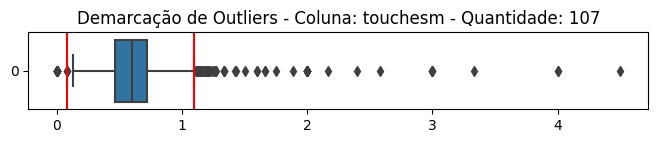



    OUTLIERS DA COLUNA touches_def_pen_aream
Limite Inferior: -0.064 
Limite Superior: 0.132
Outliers da coluna "touches_def_pen_aream": [0.132605304, 0.133011716, 0.133333333, 0.133639044, 0.134075908, 0.134246575, 0.134453782, 0.134791455, 0.135294118, 0.135472371, 0.137426901, 0.137818419, 0.137992039, 0.138098318, 0.138655462, 0.139254386, 0.13990744, 0.140028289, 0.14091471, 0.141955836, 0.14229249, 0.142857143, 0.142857143, 0.144578313, 0.14589372, 0.146919431, 0.148234381, 0.148260212, 0.149171271, 0.149390244, 0.151515152, 0.153333333, 0.155810983, 0.158730159, 0.16, 0.16, 0.162886598, 0.166666667, 0.168831169, 0.172839506, 0.177777778, 0.177777778, 0.185840708, 0.188888889, 0.188888889, 0.2, 0.2, 0.2, 0.211111111, 0.211111111, 0.214814815, 0.214814815, 0.222222222, 0.222222222, 0.225925926, 0.225925926, 0.230769231, 0.230769231, 0.234513274, 0.234513274, 0.239869281, 0.239869281, 0.244444444, 0.247311828, 0.248148148, 0.25, 0.25, 0.250925926, 0.250925926, 0.253153153, 0.2531

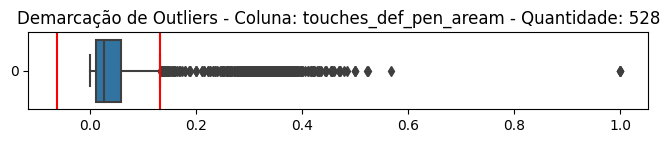



    OUTLIERS DA COLUNA touches_def_3rdm
Limite Inferior: -0.234 
Limite Superior: 0.580
Outliers da coluna "touches_def_3rdm": [0.580783939, 0.588888889, 0.6, 0.600624025, 0.608695652, 0.622222222, 0.645833333, 0.655009452, 0.66, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.75, 0.8, 0.8, 0.8, 0.8, 1.0, 1.0, 1.0, 1.0, 1.5, 2.0, 3.0]


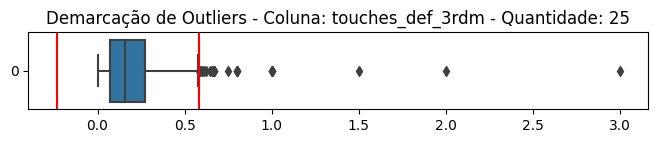



    OUTLIERS DA COLUNA touches_mid_3rdm
Limite Inferior: -0.061 
Limite Superior: 0.654
Outliers da coluna "touches_mid_3rdm": [0.653976311, 0.654028436, 0.657018813, 0.660036832, 0.660036832, 0.661016949, 0.662179218, 0.662179218, 0.662871287, 0.663766098, 0.663766098, 0.664050235, 0.664050235, 0.664611591, 0.664611591, 0.664727657, 0.664727657, 0.665082383, 0.665082383, 0.665181413, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.670658683, 0.670751634, 0.670751634, 0.67125861, 0.67125861, 0.671919192, 0.67562724, 0.676300578, 0.680926019, 0.680926019, 0.680970149, 0.681818182, 0.682639765, 0.683184403, 0.683184403, 0.6875, 0.6875, 0.6875, 0.689189189, 0.689189189, 0.694444444, 0.69924812, 0.702386312, 0.702386312, 0.702649657, 0.702649657, 0.705080545, 0.705080545, 0.707383774, 0.70807993, 0.70807993, 0.722222222, 0.727272727, 0.727272727, 0.72727

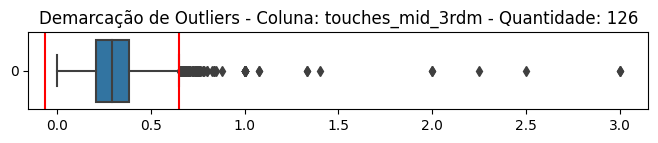



    OUTLIERS DA COLUNA touches_att_3rdm
Limite Inferior: -0.216 
Limite Superior: 0.519
Outliers da coluna "touches_att_3rdm": [0.52238806, 0.522727273, 0.522727273, 0.52276176, 0.524390244, 0.526785714, 0.528735632, 0.529230769, 0.529230769, 0.539624032, 0.539624032, 0.572357167, 0.572357167, 0.583333333, 0.596638655, 0.6, 0.602150538, 0.62962963, 0.666666667, 0.666666667, 0.666666667, 0.666666667, 0.675675676, 0.727272727, 0.733333333, 0.75, 0.8, 0.8, 0.833333333, 0.833333333, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.333333333, 1.375, 1.375, 1.375, 1.666666667, 2.0, 2.0]


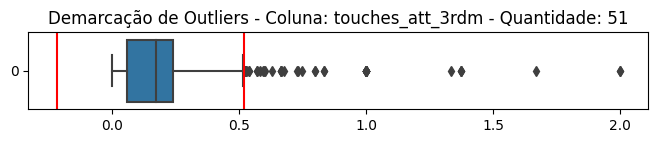



    OUTLIERS DA COLUNA touches_att_pen_aream
Limite Inferior: -0.043 
Limite Superior: 0.089
Outliers da coluna "touches_att_pen_aream": [0.089256198, 0.089285714, 0.089552239, 0.089552239, 0.089574156, 0.089866157, 0.089866157, 0.090778098, 0.090778098, 0.090909091, 0.091210614, 0.091686623, 0.091686623, 0.091940976, 0.091940976, 0.092105263, 0.092105263, 0.092857143, 0.092877968, 0.092877968, 0.09293524, 0.09293524, 0.093149692, 0.093337842, 0.093337842, 0.09375, 0.09375, 0.09375, 0.09375, 0.094594595, 0.094594595, 0.095169946, 0.095238095, 0.09554482, 0.09554482, 0.095681063, 0.095890411, 0.096564531, 0.097471452, 0.09800732, 0.09800732, 0.098576123, 0.099009901, 0.099009901, 0.099076923, 0.099076923, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.100319197, 0.100492611, 0.101587302, 0.102189781, 0.102189781, 0.102228511, 0.102228511, 0.102316602, 0.102316602, 0.102432778, 0.102432778, 0.102564103, 0.102564103, 0.102941176, 0.102941176, 0.104146101, 0.105527638, 0.106060606, 0.106098881, 0.10609

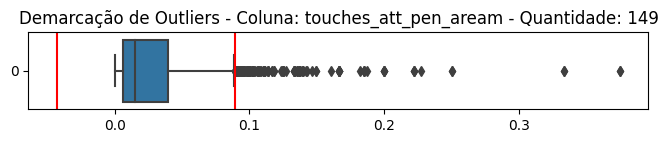



    OUTLIERS DA COLUNA touches_live_ballm
Limite Inferior: 0.100 
Limite Superior: 1.012
Outliers da coluna "touches_live_ballm": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.052631579, 0.052631579, 0.052631579, 0.08, 0.08, 0.081081081, 1.01169265, 1.013585351, 1.013585351, 1.014184397, 1.016393443, 1.018316832, 1.018957346, 1.02, 1.022818255, 1.025089606, 1.026687598, 1.026687598, 1.031273549, 1.031273549, 1.031548056, 1.037593985, 1.037634409, 1.038192234, 1.042775665, 1.042775665, 1.04377312, 1.04377312, 1.044217687, 1.044217687, 1.046407186, 1.046896552, 1.046896552, 1.047759241, 1.047759241, 1.048740861, 1.048740861, 1.054647887, 1.054647887, 1.055555556, 1.055555556, 1.056162246, 1.058823529, 1.060344828, 1.064542484, 1.064542484, 1.064851882, 1.064851882, 1.066666667, 1.068368277, 1.076481836, 1.076923077, 1.076923077, 1.076923077, 1.076923077, 1.080903104, 1.080903104, 1.083333333, 1.084694495, 1.089219331, 1.089219331, 1.0

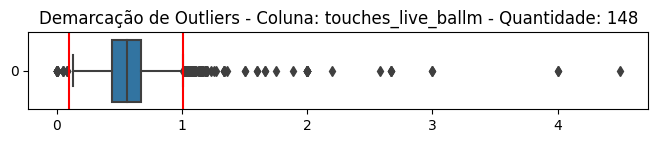



    OUTLIERS DA COLUNA dribbles_completedm
Limite Inferior: -0.018 
Limite Superior: 0.037
Outliers da coluna "dribbles_completedm": [0.03746594, 0.0375, 0.037735849, 0.037735849, 0.037883343, 0.037974684, 0.037974684, 0.038068709, 0.03807947, 0.038333333, 0.038333333, 0.038461538, 0.038495188, 0.038495188, 0.038575668, 0.038632046, 0.038856305, 0.038961039, 0.038961039, 0.038995373, 0.039087948, 0.039115646, 0.039215686, 0.039215686, 0.039215686, 0.039397451, 0.039449541, 0.039548023, 0.03960396, 0.039793662, 0.03986711, 0.039933444, 0.039933444, 0.040160643, 0.040160643, 0.040248811, 0.040248811, 0.040286482, 0.040450928, 0.040540541, 0.040540541, 0.040654997, 0.040664626, 0.040816327, 0.040816327, 0.040877368, 0.041050903, 0.041163946, 0.041666667, 0.041666667, 0.041666667, 0.041666667, 0.041860465, 0.041860465, 0.041860465, 0.041860465, 0.041916168, 0.041958042, 0.042089985, 0.042089985, 0.042145594, 0.042253521, 0.042253521, 0.042253521, 0.042253521, 0.042253521, 0.042553191, 0.

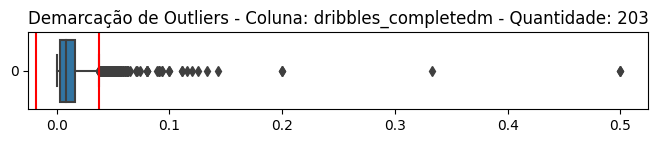



    OUTLIERS DA COLUNA dribblesm
Limite Inferior: -0.030 
Limite Superior: 0.062
Outliers da coluna "dribblesm": [0.0625, 0.0625, 0.0625, 0.062572422, 0.062937063, 0.063227953, 0.063227953, 0.063291139, 0.063291139, 0.063660477, 0.063660477, 0.06372549, 0.06372549, 0.063829787, 0.064724919, 0.064724919, 0.064848931, 0.064905998, 0.065055762, 0.065055762, 0.065088757, 0.065202927, 0.065544197, 0.065671642, 0.06606437, 0.066510172, 0.066510172, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.066757493, 0.066976127, 0.066985646, 0.066985646, 0.067109635, 0.067423705, 0.067889908, 0.067988669, 0.067988669, 0.068, 0.068142361, 0.068142361, 0.068181818, 0.068249258, 0.068376068, 0.068965517, 0.068965517, 0.069306931, 0.069767442, 0.06979131, 0.06979131, 0.070175439, 0.070175439, 0.070261438, 0.070261438, 0.070261438, 0.070261438, 0.070281124, 0.070281124, 0.071428571, 0.071428571, 0.071428571, 0.071709663, 0.071888412, 0.071888412, 0.071895425, 0.072368421, 0.072368421, 

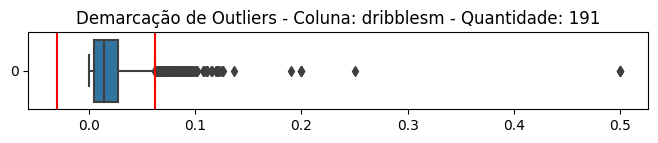



    OUTLIERS DA COLUNA dribbles_completed_pctm
Limite Inferior: -0.059 
Limite Superior: 0.159
Outliers da coluna "dribbles_completed_pctm": [0.159188544, 0.159188544, 0.159744409, 0.159744409, 0.16025641, 0.16025641, 0.160311284, 0.161721068, 0.161743772, 0.162271805, 0.162271805, 0.162337662, 0.162337662, 0.162396694, 0.162396694, 0.162601626, 0.16286645, 0.16286645, 0.163487738, 0.163654224, 0.163654224, 0.165016502, 0.165151515, 0.165562914, 0.165562914, 0.166389351, 0.166389351, 0.166389351, 0.166389351, 0.166666667, 0.166666667, 0.166731518, 0.167655786, 0.168181818, 0.168181818, 0.168350168, 0.168350168, 0.168350168, 0.168350168, 0.169482289, 0.170575693, 0.170575693, 0.170940171, 0.170940171, 0.171232877, 0.171232877, 0.171568627, 0.1716, 0.172797927, 0.172990354, 0.174216028, 0.17452007, 0.175131349, 0.175131349, 0.175153374, 0.175153374, 0.175746924, 0.176109937, 0.177304965, 0.177304965, 0.177304965, 0.177991453, 0.178890877, 0.178890877, 0.179104478, 0.179104478, 0.179166

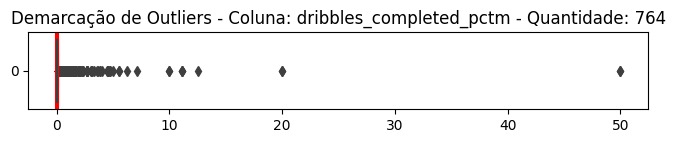



    OUTLIERS DA COLUNA players_dribbled_pastm
Limite Inferior: -0.020 
Limite Superior: 0.040
Outliers da coluna "players_dribbled_pastm": [0.04, 0.040366972, 0.040540541, 0.040540541, 0.040562914, 0.040816327, 0.040854225, 0.040871935, 0.041114058, 0.04111986, 0.04111986, 0.041491281, 0.041543027, 0.041958042, 0.042, 0.042168675, 0.042168675, 0.042253521, 0.042253521, 0.042253521, 0.042253521, 0.042253521, 0.042492918, 0.042492918, 0.042521994, 0.042692939, 0.042741341, 0.042815675, 0.042815675, 0.042871386, 0.042873696, 0.043062201, 0.043062201, 0.043165468, 0.043165468, 0.043189369, 0.043422733, 0.043725404, 0.043867502, 0.044002839, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044577512, 0.045048701, 0.045307443, 0.045307443, 0.045343137, 0.045343137, 0.045454545, 0.045454545, 0.045454545, 0.045454545, 0.045736872, 0.045737285, 0.045737285, 0.046052632, 0.046153846, 0.046265697, 0.046511628, 0.046511628, 0.046511628, 0.046511628, 0.046589018, 0.

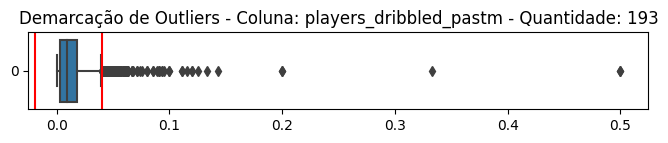



    OUTLIERS DA COLUNA nutmegsm
Limite Inferior: -0.001 
Limite Superior: 0.002
Outliers da coluna "nutmegsm": [0.001797484, 0.001801802, 0.001801802, 0.001806685, 0.001811594, 0.001811594, 0.001813237, 0.001814882, 0.001814882, 0.00181653, 0.001821494, 0.001824818, 0.001824818, 0.001828154, 0.001828154, 0.001834862, 0.001843318, 0.001846154, 0.001846154, 0.001848429, 0.001848429, 0.001848429, 0.001849283, 0.00185701, 0.001858736, 0.001862197, 0.001862197, 0.001871783, 0.001871783, 0.001875, 0.001875, 0.001878522, 0.001883239, 0.001883239, 0.001883239, 0.001886792, 0.00188798, 0.001888931, 0.001888931, 0.001893939, 0.001893939, 0.001895735, 0.001895735, 0.001896094, 0.001899335, 0.00190295, 0.001906941, 0.001906941, 0.001908397, 0.001908397, 0.001908397, 0.001909308, 0.001909308, 0.001915709, 0.001915709, 0.001917913, 0.001917913, 0.001920307, 0.00192123, 0.00192123, 0.001921845, 0.001926782, 0.001926782, 0.001926782, 0.001939864, 0.001939864, 0.001939864, 0.001939864, 0.001941748, 0

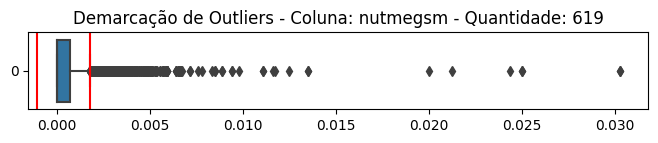



    OUTLIERS DA COLUNA carriesm
Limite Inferior: -0.016 
Limite Superior: 0.805
Outliers da coluna "carriesm": [0.808112324, 0.80952381, 0.810979847, 0.810979847, 0.811048839, 0.813672111, 0.813865863, 0.813865863, 0.814524043, 0.814524043, 0.815398469, 0.815398469, 0.816690786, 0.817204301, 0.822222222, 0.82300885, 0.82300885, 0.82300885, 0.82300885, 0.823154057, 0.825963719, 0.825963719, 0.827067669, 0.82885906, 0.82885906, 0.829214195, 0.829214195, 0.830882353, 0.830882353, 0.830906149, 0.830906149, 0.83226066, 0.833333333, 0.833333333, 0.838342811, 0.838342811, 0.839908953, 0.845177665, 0.846153846, 0.848341232, 0.851851852, 0.851851852, 0.852651048, 0.852651048, 0.853482786, 0.853482786, 0.857277883, 0.866666667, 0.867306606, 0.868965517, 0.868965517, 0.869888476, 0.869888476, 0.880434783, 0.880434783, 0.882352941, 0.887096774, 0.888792354, 0.888792354, 0.888888889, 0.896389325, 0.896389325, 0.90780809, 0.90780809, 0.909090909, 0.911242604, 0.911242604, 0.92014742, 0.920634921, 

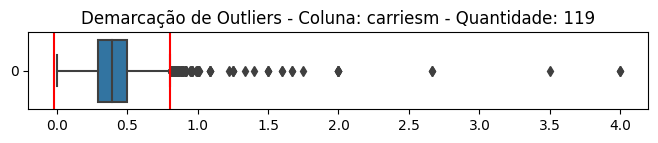



    OUTLIERS DA COLUNA carry_distancem
Limite Inferior: -0.605 
Limite Superior: 5.122
Outliers da coluna "carry_distancem": [5.134146341, 5.158878505, 5.166398972, 5.182926829, 5.182926829, 5.227272727, 5.25, 5.25, 5.282285714, 5.283889283, 5.295774648, 5.295774648, 5.295774648, 5.295774648, 5.356321839, 5.391859262, 5.391859262, 5.394957983, 5.430107527, 5.436645397, 5.443365696, 5.443365696, 5.444015444, 5.454545455, 5.454545455, 5.5, 5.5, 5.603282626, 5.625, 5.666666667, 5.666666667, 5.694933146, 5.7, 5.711864407, 5.711864407, 5.72, 5.738461538, 5.746835443, 5.770674079, 5.770674079, 5.796460177, 5.796460177, 5.796460177, 5.796460177, 5.811853246, 5.811853246, 5.847826087, 5.847826087, 5.862068966, 5.862068966, 5.873544093, 5.873544093, 5.930756844, 5.930756844, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.0, 6.111111111, 6.155661991, 6.155661991, 6.183006536, 6.1875, 6.365705615, 6.5, 6.5, 6.5, 6.76, 6.833333333, 6.945945946, 7.0, 7.0, 7.0, 7.25, 7.25, 7.727272727, 7.727272727, 8.0, 9.0, 9.0

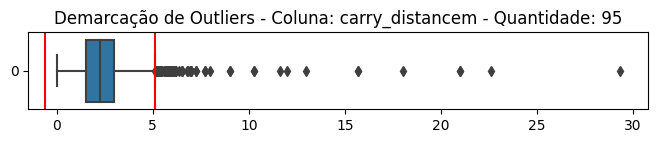



    OUTLIERS DA COLUNA carry_progressive_distancem
Limite Inferior: -0.643 
Limite Superior: 3.063
Outliers da coluna "carry_progressive_distancem": [3.06402439, 3.06402439, 3.070056045, 3.072423398, 3.081768878, 3.09375, 3.09375, 3.110550652, 3.110550652, 3.115740741, 3.130434783, 3.130434783, 3.137931034, 3.137931034, 3.149171271, 3.163830497, 3.163830497, 3.169014085, 3.169014085, 3.169014085, 3.169014085, 3.2, 3.202148826, 3.207986111, 3.209090909, 3.223021583, 3.223021583, 3.227428571, 3.249027237, 3.249027237, 3.24973545, 3.24973545, 3.25, 3.260471204, 3.269794721, 3.270319085, 3.270319085, 3.272727273, 3.272727273, 3.316660918, 3.316660918, 3.32, 3.334989354, 3.352750809, 3.352750809, 3.37886341, 3.387267905, 3.387267905, 3.432122996, 3.432122996, 3.43902439, 3.43902439, 3.43977591, 3.443085607, 3.443085607, 3.444444444, 3.455830389, 3.457943925, 3.486312399, 3.486312399, 3.5, 3.5, 3.5, 3.537174721, 3.537174721, 3.558026407, 3.558026407, 3.569620253, 3.589725545, 3.69644485, 3

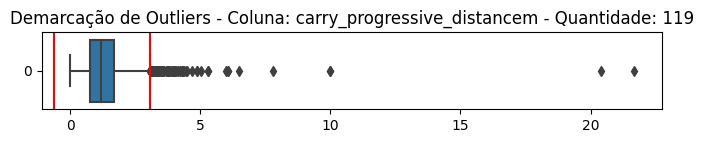



    OUTLIERS DA COLUNA pass_targetsm
Limite Inferior: 0.074 
Limite Superior: 0.877
Outliers da coluna "pass_targetsm": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.027027027, 0.04, 0.044444444, 0.048964218, 0.052631579, 0.052777778, 0.052777778, 0.055555556, 0.05978836, 0.05978836, 0.061111111, 0.0625, 0.069934641, 0.069934641, 0.071428571, 0.071428571, 0.072222222, 0.072222222, 0.880952381, 0.880952381, 0.880952381, 0.880952381, 0.882312692, 0.882312692, 0.882352941, 0.883351588, 0.884304207, 0.884304207, 0.885148515, 0.88627451, 0.886363636, 0.886363636, 0.889867841, 0.889892716, 0.890610757, 0.890625, 0.893416928, 0.895768025, 0.897156685, 0.8982676, 0.8982676, 0.898456539, 0.898456539, 0.899625156, 0.899625156, 0.904761905, 0.904761905, 0.906040268, 0.906040268, 0.907772855, 0.908333333, 0.909090909, 0.909090909, 0.909090909, 0.909090909, 0.911504425, 0.912790698, 0.913043478, 0.913043478, 0.92, 0.920037629

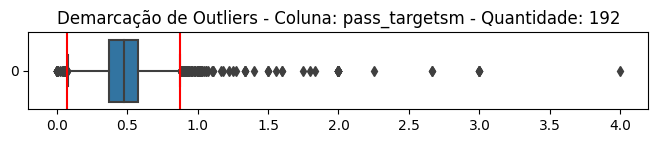



    OUTLIERS DA COLUNA passes_receivedm
Limite Inferior: 0.011 
Limite Superior: 0.760
Outliers da coluna "passes_receivedm": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.761675494, 0.761675494, 0.761904762, 0.761904762, 0.762799263, 0.763513514, 0.763513514, 0.765743073, 0.765743073, 0.768163265, 0.768893757, 0.768954248, 0.768954248, 0.769946809, 0.770509978, 0.770695364, 0.770833333, 0.770833333, 0.771130104, 0.772727273, 0.772727273, 0.772727273, 0.772727273, 0.773195876, 0.773466834, 0.773958333, 0.775392238, 0.776093294, 0.777777778, 0.777777778, 0.777777778, 0.78, 0.781437126, 0.781512605, 0.783964365, 0.784313725, 0.793606671, 0.793606671, 0.793825408, 0.794018331, 0.795918367, 0.795918367, 0.797349295, 0.8, 0.80033557, 0.80033557, 0.800669216, 0.803278689, 0.803921569, 0.804511278, 0.805669867, 0.805670408, 0.805670408, 0.809985097, 0.810874704, 0.811764706, 0.813559322, 0.81386

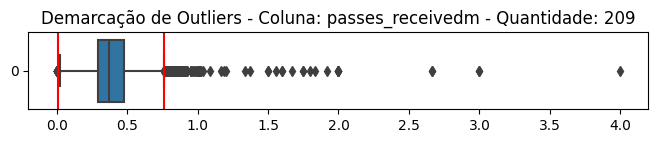



    OUTLIERS DA COLUNA passes_received_pctm
Limite Inferior: -0.155 
Limite Superior: 0.362
Outliers da coluna "passes_received_pctm": [0.363333333, 0.364550265, 0.364550265, 0.366542751, 0.366542751, 0.366666667, 0.366666667, 0.366964286, 0.369064748, 0.369064748, 0.36928839, 0.369934641, 0.369934641, 0.370281124, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.37037037, 0.371186441, 0.372373541, 0.37244898, 0.373170732, 0.377777778, 0.377777778, 0.37797619, 0.37797619, 0.37797619, 0.37797619, 0.378076923, 0.378076923, 0.378151261, 0.379326923, 0.380434783, 0.380544747, 0.380544747, 0.381538462, 0.383111111, 0.383111111, 0.385062241, 0.385492228, 0.385492228, 0.38583691, 0.38583691, 0.386153846, 0.388085106, 0.388085106, 0.389795918, 0.389795918, 0.39138756, 0.39138756, 0.391803279, 0.394117647, 0.394117647, 0.397309417, 0.397309417, 0.397309417, 0.397309417, 0.398406375, 0.

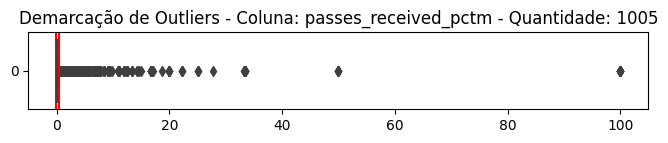



    OUTLIERS DA COLUNA miscontrolsm
Limite Inferior: -0.026 
Limite Superior: 0.051
Outliers da coluna "miscontrolsm": [0.051282051, 0.051282051, 0.051554828, 0.051724138, 0.052631579, 0.052631579, 0.052631579, 0.053244592, 0.053244592, 0.053763441, 0.054054054, 0.054054054, 0.054054054, 0.054054054, 0.055214724, 0.055555556, 0.055803571, 0.055900621, 0.056399132, 0.056399132, 0.056603774, 0.05734767, 0.057471264, 0.058823529, 0.058823529, 0.058823529, 0.06, 0.060185185, 0.060185185, 0.060402685, 0.06097561, 0.06097561, 0.06122449, 0.06122449, 0.06122449, 0.06122449, 0.061320755, 0.061320755, 0.061538462, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.06372549, 0.064516129, 0.064655172, 0.064655172, 0.066115702, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.068181818, 0.068181818, 0.068493151, 0.068965517, 0.068965517, 0.071428571, 0.073529412, 0.074074074, 0.076086957, 0.076086957, 0.076923077, 0.076923077, 0.076923077, 0.076923077, 0.

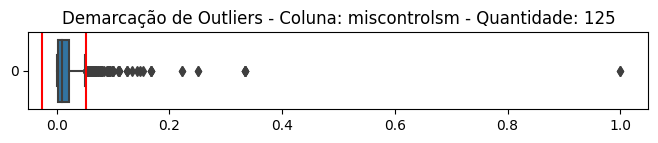



    OUTLIERS DA COLUNA dispossessedm
Limite Inferior: -0.023 
Limite Superior: 0.045
Outliers da coluna "dispossessedm": [0.045238095, 0.045454545, 0.045454545, 0.045454545, 0.045454545, 0.045620438, 0.045977011, 0.046075085, 0.04610951, 0.04610951, 0.046153846, 0.047058824, 0.047368421, 0.047543582, 0.047619048, 0.047619048, 0.047619048, 0.047619048, 0.047976012, 0.048611111, 0.048611111, 0.049019608, 0.049180328, 0.049180328, 0.049382716, 0.049382716, 0.04950495, 0.05, 0.05, 0.05, 0.050034746, 0.050034746, 0.050075873, 0.051282051, 0.051282051, 0.051557465, 0.051557465, 0.051557465, 0.051557465, 0.051724138, 0.051724138, 0.052287582, 0.052401747, 0.052401747, 0.052401747, 0.052401747, 0.052439024, 0.052575107, 0.052575107, 0.05257732, 0.05257732, 0.05257732, 0.05257732, 0.053664921, 0.054018445, 0.054018445, 0.054054054, 0.054054054, 0.054545455, 0.054545455, 0.054545455, 0.054545455, 0.054794521, 0.054794521, 0.057377049, 0.057377049, 0.057742782, 0.058823529, 0.058823529, 0.05882

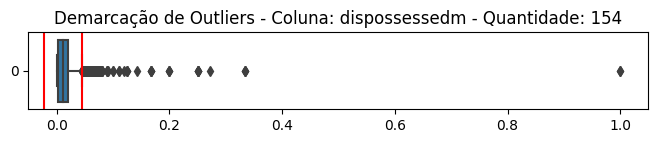



    OUTLIERS DA COLUNA cards_yellow_redm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "cards_yellow_redm": [0.000302206, 0.000302206, 0.000306748, 0.000306748, 0.000309406, 0.000313775, 0.000316857, 0.00031736, 0.00031736, 0.000319285, 0.000319285, 0.000325839, 0.000329381, 0.000329381, 0.000330688, 0.000330688, 0.000331345, 0.000331345, 0.000333667, 0.000333667, 0.000336022, 0.000336022, 0.000337838, 0.000337838, 0.000342231, 0.000342231, 0.000344116, 0.000344116, 0.000347343, 0.000347343, 0.000353232, 0.000353232, 0.00035791, 0.00035791, 0.00036036, 0.000364299, 0.000364964, 0.00036914, 0.00036914, 0.000369959, 0.000373972, 0.000373972, 0.000374813, 0.000374953, 0.000374953, 0.000379075, 0.000379219, 0.000379219, 0.000380662, 0.000382848, 0.000382848, 0.000383142, 0.000383142, 0.000384763, 0.000384763, 0.000386698, 0.000386698, 0.000387447, 0.000388048, 0.000389257, 0.000389257, 0.000389408, 0.000390016, 0.000390016, 0.000391389, 0.000391389, 0.000392465, 0.000

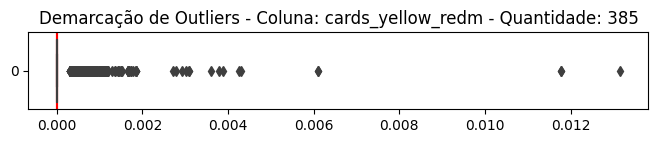



    OUTLIERS DA COLUNA foulsm
Limite Inferior: -0.008 
Limite Superior: 0.035
Outliers da coluna "foulsm": [0.035, 0.035087719, 0.035087719, 0.035175879, 0.035211268, 0.03539823, 0.035714286, 0.035714286, 0.035714286, 0.035714286, 0.035797665, 0.035797665, 0.035830619, 0.035971223, 0.035971223, 0.036036036, 0.036036036, 0.036458333, 0.036585366, 0.036585366, 0.036764706, 0.036958067, 0.037037037, 0.037037037, 0.037037037, 0.037037037, 0.037037037, 0.037037037, 0.037037037, 0.037593985, 0.037735849, 0.037735849, 0.037735849, 0.037735849, 0.037735849, 0.037837838, 0.037914692, 0.037914692, 0.037931034, 0.037931034, 0.037944664, 0.037944664, 0.038095238, 0.038095238, 0.03814262, 0.038394415, 0.038429054, 0.038461538, 0.038461538, 0.038636364, 0.038686987, 0.038686987, 0.038709677, 0.038720539, 0.038720539, 0.038720539, 0.038720539, 0.039215686, 0.039215686, 0.039215686, 0.039215686, 0.039215686, 0.039215686, 0.039215686, 0.039215686, 0.03960396, 0.03960396, 0.03968254, 0.03968254, 0.04,

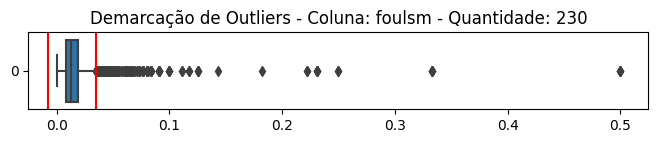



    OUTLIERS DA COLUNA fouledm
Limite Inferior: -0.013 
Limite Superior: 0.035
Outliers da coluna "fouledm": [0.035294118, 0.035294118, 0.03539823, 0.035425101, 0.035425101, 0.035433071, 0.035478052, 0.035519126, 0.035529716, 0.035529716, 0.035579884, 0.035579884, 0.035598706, 0.035598706, 0.035714286, 0.035714286, 0.035714286, 0.035752979, 0.035781544, 0.035781544, 0.035830619, 0.035874439, 0.035874439, 0.035874439, 0.035874439, 0.035874439, 0.036036036, 0.036036036, 0.036053131, 0.036053131, 0.036144578, 0.036267319, 0.036267319, 0.036280488, 0.036324786, 0.036619718, 0.036626344, 0.036626344, 0.036697248, 0.036745407, 0.036842105, 0.036876356, 0.036876356, 0.037037037, 0.037037037, 0.037037037, 0.037037037, 0.037037037, 0.037209302, 0.037209302, 0.037209302, 0.037209302, 0.037225042, 0.037234043, 0.037234043, 0.037243948, 0.037369915, 0.037383178, 0.037383178, 0.0375, 0.037656904, 0.037656904, 0.037656904, 0.037656904, 0.037735849, 0.037777778, 0.037777778, 0.038461538, 0.03896103

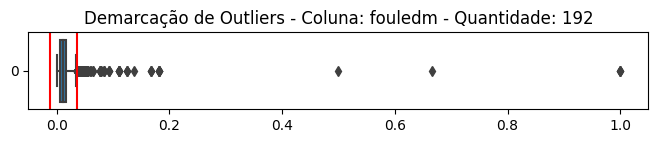



    OUTLIERS DA COLUNA offsidesm
Limite Inferior: -0.004 
Limite Superior: 0.006
Outliers da coluna "offsidesm": [0.005850804, 0.005853659, 0.005861665, 0.005861665, 0.005861665, 0.005861665, 0.005865103, 0.005865103, 0.005870841, 0.005870841, 0.005882353, 0.005882353, 0.005882353, 0.005882353, 0.005882353, 0.005882353, 0.005890506, 0.005891016, 0.005891016, 0.005901639, 0.005908419, 0.005923001, 0.00592718, 0.005940594, 0.005940594, 0.005952381, 0.005952381, 0.005952381, 0.005952381, 0.005952381, 0.005952381, 0.005952381, 0.005954744, 0.005988024, 0.006004003, 0.006006006, 0.006006006, 0.006006006, 0.006053935, 0.006053935, 0.006079027, 0.006085193, 0.006085193, 0.006101695, 0.006102877, 0.006112469, 0.006112469, 0.006122449, 0.006131208, 0.006134969, 0.006134969, 0.006144393, 0.006144393, 0.006144393, 0.006144393, 0.006146281, 0.006146281, 0.006153846, 0.006174745, 0.006185567, 0.006185567, 0.006185567, 0.006185567, 0.006186727, 0.006206362, 0.006206362, 0.00621118, 0.00621118, 0.0

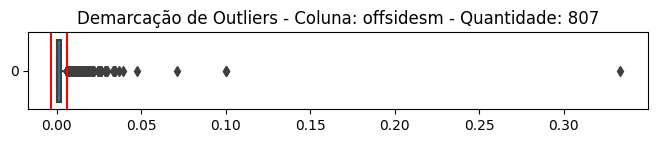



    OUTLIERS DA COLUNA pens_wonm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_wonm": [0.000292398, 0.000293169, 0.000293169, 0.000293945, 0.000293945, 0.000295596, 0.000303122, 0.000303122, 0.000304878, 0.000305717, 0.000305717, 0.000308642, 0.000308928, 0.000315856, 0.000315856, 0.000316256, 0.000317158, 0.000317158, 0.00031736, 0.00031746, 0.00031746, 0.000318066, 0.000318066, 0.000318066, 0.000318573, 0.000320205, 0.000320205, 0.00032144, 0.00032144, 0.000323625, 0.000324992, 0.000324992, 0.000326797, 0.000326797, 0.000329707, 0.000329924, 0.000329924, 0.000330142, 0.000330907, 0.000330907, 0.000331895, 0.000332336, 0.000332336, 0.000332668, 0.000332668, 0.000334336, 0.000334336, 0.000336022, 0.000336022, 0.0003367, 0.000338181, 0.000338181, 0.000338639, 0.000338639, 0.000341297, 0.00034188, 0.00034188, 0.000341997, 0.000342114, 0.000342114, 0.000342583, 0.000346021, 0.000346021, 0.000347222, 0.000347464, 0.000347464, 0.000347705, 0.000348189, 0.00034818

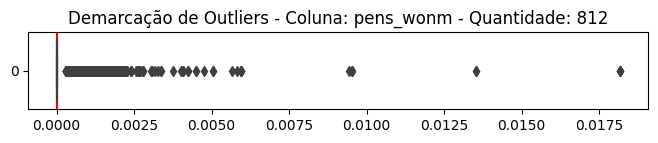



    OUTLIERS DA COLUNA pens_concededm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_concededm": [0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000293169, 0.000293169, 0.000293945, 0.000293945, 0.000295508, 0.000295508, 0.000295596, 0.000298864, 0.000298864, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.000306748, 0.000306748, 0.000308452, 0.000308642, 0.000308642, 0.000308642, 0.000308642, 0.000308642, 0.000308642, 0.000308737, 0.000308737, 0.000308737, 0.000309789, 0.000309981, 0.000309981, 0.000311526, 0.000311526, 0.000313578, 0.000313578, 0.000313775, 0.000315457, 0.000315557, 0.000315557, 0.000316156, 0.000316857, 0.00031736, 0.00031746, 0.000317662, 0.000317662, 0.000319081, 0.000319081, 0.000319081, 0.000319285, 0.000319285, 0.000320205, 0.000320205, 0.000323415, 0.000323415, 0.00032352, 0.000323625, 0.000325733, 0.000325733, 0.000326371, 0.000326371, 0.00032679

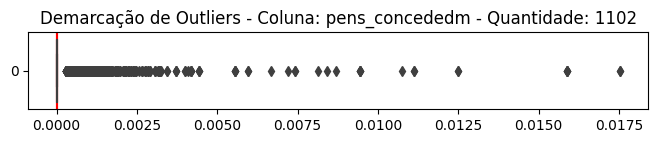



    OUTLIERS DA COLUNA own_goalsm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "own_goalsm": [0.000292398, 0.000292398, 0.000295596, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.000308642, 0.000308642, 0.000308642, 0.000308642, 0.000315657, 0.000317158, 0.000317158, 0.00031746, 0.000318066, 0.000318066, 0.000319081, 0.000319285, 0.000323415, 0.000326584, 0.000326584, 0.000326797, 0.000326797, 0.000326797, 0.000327118, 0.000328407, 0.000328407, 0.000330033, 0.000330688, 0.000330688, 0.000331675, 0.000331675, 0.000333667, 0.000334001, 0.000334001, 0.0003367, 0.0003367, 0.0003367, 0.0003367, 0.0003367, 0.000337268, 0.000337268, 0.00034188, 0.00034188, 0.000342231, 0.000342231, 0.000342231, 0.000342231, 0.000344471, 0.000350877, 0.000350877, 0.000351247, 0.000351247, 0.000351989, 0.000351989, 0.000354988, 0.00035791, 0.00035791, 0.000358423, 0.000358423, 0.000358423, 0.000358938, 0.000358938, 0.000359066, 0.000359066, 0.000359066, 0.000367512, 0.000367512, 0.0003676

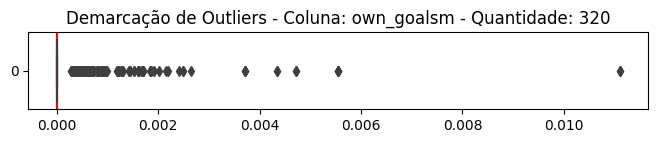



    OUTLIERS DA COLUNA ball_recoveriesm
Limite Inferior: -0.011 
Limite Superior: 0.188
Outliers da coluna "ball_recoveriesm": [0.188362069, 0.188405797, 0.188405797, 0.188888889, 0.188888889, 0.188888889, 0.189285714, 0.189285714, 0.19047619, 0.19047619, 0.19047619, 0.19095902, 0.19095902, 0.192307692, 0.193877551, 0.193877551, 0.196374622, 0.2, 0.2, 0.2, 0.2, 0.2, 0.203125, 0.203389831, 0.203389831, 0.206896552, 0.208333333, 0.208333333, 0.210526316, 0.210526316, 0.212962963, 0.212962963, 0.214285714, 0.214285714, 0.216216216, 0.216216216, 0.222222222, 0.222222222, 0.222222222, 0.222222222, 0.242424242, 0.25, 0.25, 0.25, 0.25, 0.263157895, 0.263157895, 0.307692308, 0.333333333, 0.333333333, 0.333333333, 0.333333333, 0.333333333, 0.384615385, 0.384615385, 0.384615385, 0.384615385, 0.384615385, 0.384615385, 0.4, 0.4, 0.4, 0.416666667, 0.428571429, 0.428571429, 0.5, 0.5, 0.5, 0.5, 0.5, 0.666666667, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


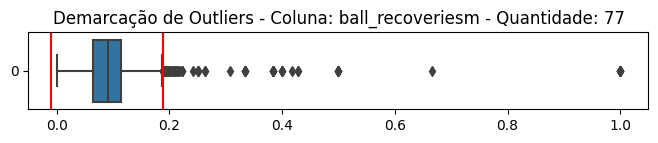



    OUTLIERS DA COLUNA aerials_wonm
Limite Inferior: -0.020 
Limite Superior: 0.044
Outliers da coluna "aerials_wonm": [0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044481054, 0.044554455, 0.044554455, 0.044585987, 0.044602699, 0.044801352, 0.044801352, 0.04494382, 0.04494382, 0.04495114, 0.04495114, 0.045023697, 0.045081967, 0.045081967, 0.045086705, 0.045109212, 0.045109212, 0.045152722, 0.045152722, 0.04526749, 0.045307443, 0.045346062, 0.045474231, 0.045560748, 0.045582442, 0.04587156, 0.045918367, 0.046216584, 0.046345811, 0.046368486, 0.046482412, 0.046492986, 0.046492986, 0.046641791, 0.046740467, 0.046850599, 0.047058824, 0.047058824, 0.047079337, 0.047204969, 0.047302032, 0.047408344, 0.047569444, 0.047619048, 0.047619048, 0.047619048, 0.047619048, 0.047682119, 0.047752809, 0.047752809, 0.047945205, 0.048029557, 0.048206278, 0.048206278, 

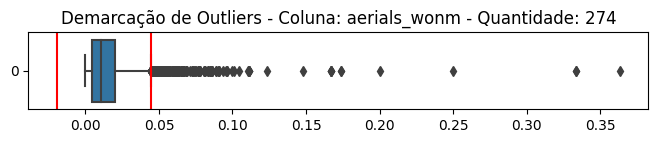



    OUTLIERS DA COLUNA aerials_lostm
Limite Inferior: -0.010 
Limite Superior: 0.037
Outliers da coluna "aerials_lostm": [0.037037037, 0.037037037, 0.037037037, 0.037037037, 0.037037037, 0.037037037, 0.037037037, 0.037037037, 0.037399822, 0.037399822, 0.037439614, 0.037439614, 0.037453184, 0.037483266, 0.037483266, 0.0375357, 0.0375357, 0.037671233, 0.037711313, 0.037711313, 0.037735849, 0.037811746, 0.037811746, 0.038095238, 0.038095238, 0.038155803, 0.038251366, 0.03825682, 0.03825682, 0.038274182, 0.038274182, 0.038406828, 0.038461538, 0.038461538, 0.03857868, 0.03857868, 0.038674033, 0.038709677, 0.038793103, 0.038793103, 0.03887689, 0.03887689, 0.038888889, 0.039017341, 0.039017341, 0.039026863, 0.039026863, 0.039101498, 0.039165329, 0.039165329, 0.039185751, 0.039185751, 0.039215686, 0.039215686, 0.039215686, 0.039215686, 0.039215686, 0.039225182, 0.039341263, 0.039473684, 0.039568345, 0.039568345, 0.03962704, 0.039660057, 0.03969129, 0.03988604, 0.039915966, 0.039915966, 0.039

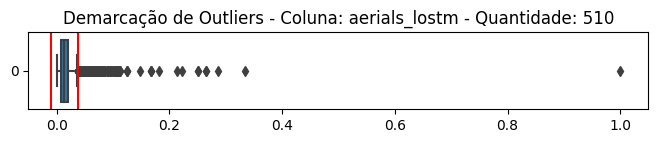



    OUTLIERS DA COLUNA aerials_won_pctm
Limite Inferior: -0.047 
Limite Superior: 0.118
Outliers da coluna "aerials_won_pctm": [0.118577075, 0.118577982, 0.118694362, 0.118694362, 0.118914956, 0.118980668, 0.119047619, 0.119349005, 0.119665272, 0.119832402, 0.119832402, 0.119832402, 0.119832402, 0.119968799, 0.119968799, 0.120143885, 0.120143885, 0.120481928, 0.120481928, 0.120608108, 0.120722135, 0.121136063, 0.121136063, 0.121212121, 0.121212121, 0.121548822, 0.121548822, 0.122149837, 0.122149837, 0.122222222, 0.122511485, 0.122511485, 0.122610294, 0.122610294, 0.122699387, 0.122699387, 0.123003195, 0.123197492, 0.123197492, 0.123333333, 0.123416507, 0.123416507, 0.123492063, 0.123518519, 0.123518519, 0.123762376, 0.123839009, 0.124045802, 0.124045802, 0.124104235, 0.124347826, 0.124347826, 0.125, 0.125, 0.125628141, 0.125779037, 0.126071429, 0.126071429, 0.126582278, 0.126703499, 0.126862745, 0.126862745, 0.127533461, 0.127533461, 0.127678571, 0.127762803, 0.127826087, 0.128026906

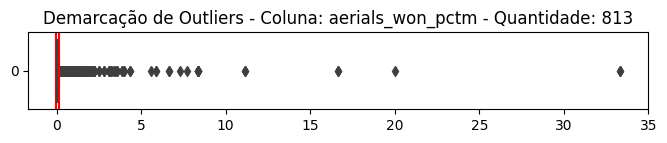



    OUTLIERS DA COLUNA games_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "games_gkm": [0.003487358, 0.008333333, 0.008571429, 0.010126582, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0

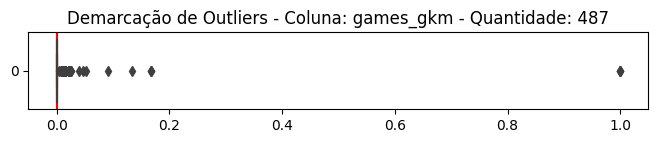



    OUTLIERS DA COLUNA games_starts_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "games_starts_gkm": [0.003487358, 0.006060606, 0.006060606, 0.006289308, 0.006622517, 0.006666667, 0.007142857, 0.007352941, 0.007407407, 0.007407407, 0.007968127, 0.007968127, 0.008130081, 0.008333333, 0.008645533, 0.008849558, 0.008849558, 0.008860759, 0.009276438, 0.009411765, 0.009416196, 0.009416196, 0.009456265, 0.009463722, 0.00952381, 0.00952381, 0.00952381, 0.009817672, 0.009817672, 0.009852217, 0.009852217, 0.009988901, 0.01010101, 0.01026393, 0.01026393, 0.010285714, 0.010344828, 0.010376135, 0.010457516, 0.010457516, 0.01055409, 0.01055409, 0.010638298, 0.010638298, 0.010666667, 0.010678871, 0.010678871, 0.01068999, 0.01068999, 0.010714286, 0.010733453, 0.010733453, 0.010763711, 0.010781671, 0.010786802, 0.010786802, 0.010799136, 0.010799136, 0.010930889, 0.010930889, 0.010958904, 0.010958904, 0.010981469, 0.010981469, 0.010989011, 0.010989011, 0.011013216, 0.01102088

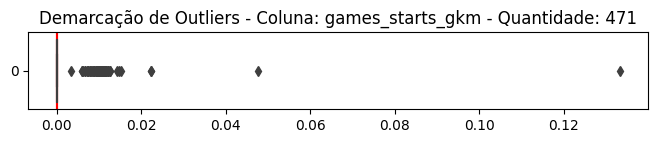



    OUTLIERS DA COLUNA minutes_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "minutes_gkm": [0.156931125, 0.648571429, 0.75, 0.833333333, 0.833333333, 0.869620253, 0.973684211, 0.973684211, 0.986111111, 0.989010989, 0.989010989, 0.991869919, 0.992647059, 0.993333333, 0.993939394, 0.993939394, 0.995073892, 0.995073892, 0.995575221, 0.995575221, 0.996015936, 0.996015936, 0.996845426, 0.997067449, 0.997067449, 0.997260274, 0.997260274, 0.998211091, 0.998211091, 0.998597475, 0.998597475, 0.998680739, 0.998680739, 0.998890122, 0.99893617, 0.99893617, 0.99913119, 0.99913119, 0.999237223, 0.999237223, 0.999365482, 0.999365482, 0.999419954, 0.999419954, 0.999514091, 0.999514091, 0.999640029, 0.999640029, 0.999647391, 0.999647391, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.

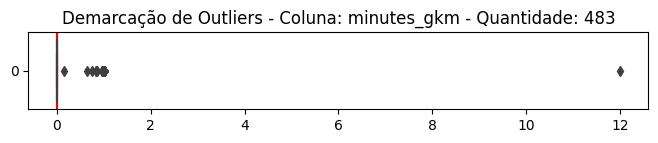



    OUTLIERS DA COLUNA goals_against_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "goals_against_gkm": [0.00087184, 0.002777778, 0.002777778, 0.003448276, 0.005555556, 0.005555556, 0.005555556, 0.005555556, 0.005571031, 0.006060606, 0.006060606, 0.006060606, 0.006432749, 0.006432749, 0.006535948, 0.006725146, 0.006725146, 0.007407407, 0.007407407, 0.007407407, 0.007407407, 0.007819288, 0.007819288, 0.007952872, 0.007968127, 0.007968127, 0.008012821, 0.008080808, 0.008080808, 0.008108108, 0.008108108, 0.008641975, 0.008641975, 0.008796296, 0.008888889, 0.008888889, 0.008888889, 0.008888889, 0.008994709, 0.008994709, 0.009044436, 0.009117551, 0.009206349, 0.009206349, 0.00952381, 0.00952381, 0.00957265, 0.00957265, 0.009695754, 0.009876543, 0.009876543, 0.00994152, 0.00994152, 0.009991312, 0.009991312, 0.01015873, 0.01015873, 0.01015873, 0.010185185, 0.01021021, 0.01021021, 0.010355987, 0.010355987, 0.01043771, 0.010526316, 0.010598291, 0.010683761, 0.010714286

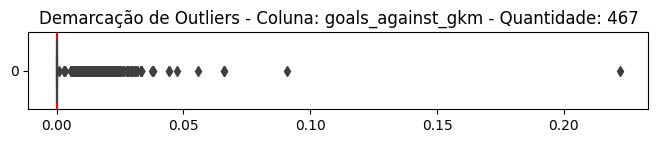



    OUTLIERS DA COLUNA goals_against_per90_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "goals_against_per90_gkm": [0.000169591, 0.000169591, 0.000178363, 0.000178363, 0.00019281, 0.000212077, 0.000219219, 0.000219219, 0.000260234, 0.000260234, 0.000263492, 0.000263492, 0.000267014, 0.00027572, 0.000276276, 0.000276276, 0.000277778, 0.000283626, 0.000283951, 0.000288889, 0.000288889, 0.000288889, 0.000290873, 0.000294017, 0.000294017, 0.000300971, 0.000300971, 0.000308642, 0.000315789, 0.000316498, 0.000318521, 0.000321868, 0.000321868, 0.000324324, 0.000324324, 0.000324561, 0.000324561, 0.000324561, 0.000324786, 0.000326797, 0.000326797, 0.0003367, 0.0003367, 0.000342342, 0.000342342, 0.000342342, 0.000342342, 0.000352381, 0.000353801, 0.000353801, 0.000365741, 0.000366612, 0.000366612, 0.000368056, 0.000368421, 0.000368421, 0.000368635, 0.000369176, 0.000369176, 0.000372484, 0.000372484, 0.000380952, 0.000380952, 0.000380952, 0.000385621, 0.000385965, 0.000

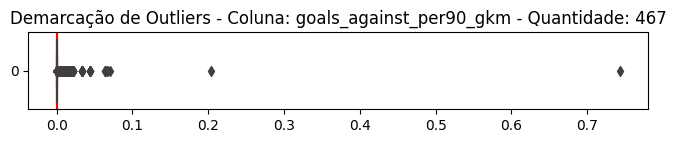



    OUTLIERS DA COLUNA shots_on_target_againstm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "shots_on_target_againstm": [0.003487358, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.014814815, 0.014814815, 0.016666667, 0.016666667, 0.021428571, 0.022154648, 0.022154648, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.024137931, 0.026385224, 0.026385224, 0.027777778, 0.027777778, 0.027777778, 0.028070175, 0.028070175, 0.029824561, 0.029957669, 0.030448718, 0.03046595, 0.03046595, 0.030612245, 0.030640669, 0.030864198, 0.030864198, 0.030927835, 0.030952381, 0.031045752, 0.03106567, 0.03187251, 0.03187251, 0.032, 0.032098765, 0.032098765, 0.032217309, 0.032258065, 0.032258065, 0.032820513, 0.032978723, 0.032978723, 0.033039648, 0.033333333, 0.033333333, 0.033333333, 0.033333

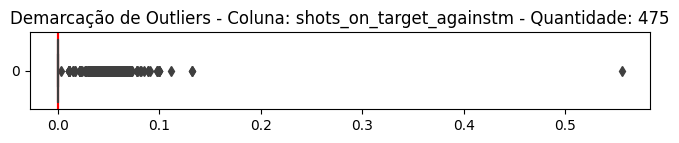



    OUTLIERS DA COLUNA savesm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "savesm": [0.002615519, 0.005555556, 0.005555556, 0.005555556, 0.007407407, 0.007407407, 0.008571429, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.011111111, 0.013215859, 0.013900956, 0.013900956, 0.014705882, 0.014814815, 0.014814815, 0.015306122, 0.016666667, 0.016666667, 0.016666667, 0.016666667, 0.016666667, 0.016666667, 0.016666667, 0.017021277, 0.017021277, 0.017150396, 0.017150396, 0.018319646, 0.018518519, 0.019047619, 0.019047619, 0.019428571, 0.020071685, 0.020071685, 0.020467836, 0.020527859, 0.020527859, 0.020634921, 0.020634921, 0.020689655, 0.021165744, 0.021176471, 0.021269841, 0.021299639, 0.021367521, 0.021428571, 0.021637427, 0.021637427, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.02222

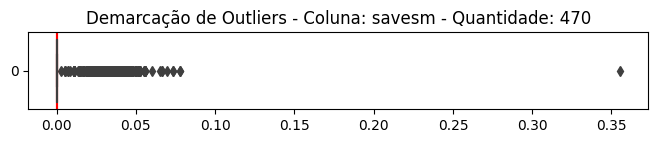



    OUTLIERS DA COLUNA save_pctm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "save_pctm": [0.000183502, 0.00018538, 0.000185397, 0.000186928, 0.000191813, 0.000191813, 0.000196701, 0.000196701, 0.000197953, 0.000197953, 0.000199415, 0.000199415, 0.000199708, 0.000200585, 0.000201754, 0.000201754, 0.000202047, 0.000202047, 0.000202469, 0.000203216, 0.000203216, 0.000203604, 0.000203604, 0.000204208, 0.00020614, 0.000206481, 0.000206669, 0.000206669, 0.000207895, 0.000209357, 0.000209357, 0.000209942, 0.000209942, 0.000212963, 0.000212963, 0.000214114, 0.000214114, 0.000215205, 0.000215789, 0.000216993, 0.000216993, 0.000217329, 0.000218619, 0.000218619, 0.000218619, 0.000218619, 0.000219298, 0.000219298, 0.000219821, 0.000219821, 0.000220062, 0.000221277, 0.000221277, 0.00022193, 0.000222807, 0.000222807, 0.000222857, 0.000222857, 0.000223099, 0.000223099, 0.000223392, 0.000223392, 0.00022368, 0.000224383, 0.000225439, 0.000225439, 0.000226126, 0.000226126, 0.000

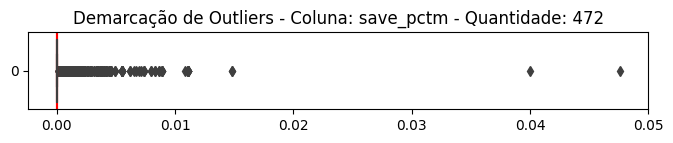



    OUTLIERS DA COLUNA wins_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "wins_gkm": [0.000358551, 0.000358551, 0.00087184, 0.001079914, 0.001079914, 0.001109878, 0.001237624, 0.00130719, 0.00130719, 0.001347709, 0.001388889, 0.001428571, 0.00154321, 0.001587302, 0.001587302, 0.001587302, 0.001587302, 0.001587302, 0.001587302, 0.001587302, 0.001587302, 0.001587302, 0.001587302, 0.001709402, 0.001709402, 0.001740139, 0.001740139, 0.001754386, 0.001754386, 0.001788909, 0.001788909, 0.001851852, 0.001851852, 0.001883239, 0.001915709, 0.001943635, 0.001943635, 0.001960784, 0.001960784, 0.002002002, 0.002020202, 0.002020202, 0.002027027, 0.002202643, 0.002218935, 0.002218935, 0.002222222, 0.002222222, 0.002222222, 0.00228833, 0.00228833, 0.002298851, 0.002298851, 0.002356902, 0.002356902, 0.002430556, 0.002430556, 0.002469136, 0.002469136, 0.002469136, 0.002518892, 0.002518892, 0.002538071, 0.002538071, 0.002564103, 0.002564103, 0.002564103, 0.002564103, 0.0026143

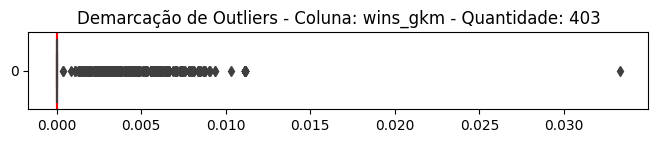



    OUTLIERS DA COLUNA draws_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "draws_gkm": [0.000584795, 0.000584795, 0.000653595, 0.000653595, 0.000673401, 0.000673401, 0.00086881, 0.00086881, 0.00087184, 0.00097688, 0.001033592, 0.001058201, 0.001149425, 0.001149425, 0.001169591, 0.001169591, 0.001179709, 0.001234568, 0.001234568, 0.001234568, 0.001234568, 0.001234568, 0.001265823, 0.001297017, 0.001303215, 0.001303215, 0.00130719, 0.00130719, 0.001346801, 0.001346801, 0.001388889, 0.001388889, 0.001428571, 0.001515152, 0.00154321, 0.00154321, 0.001543805, 0.001587302, 0.001587302, 0.001587302, 0.001602564, 0.001633987, 0.001646091, 0.001672241, 0.001709402, 0.001709402, 0.001736111, 0.001736111, 0.001754386, 0.001754386, 0.001754386, 0.001777778, 0.001777778, 0.001792115, 0.001799856, 0.001799856, 0.001805054, 0.001811594, 0.001811594, 0.001815706, 0.001828154, 0.001828154, 0.001851852, 0.001851852, 0.001851852, 0.001851852, 0.001851852, 0.001851852, 0.0018518

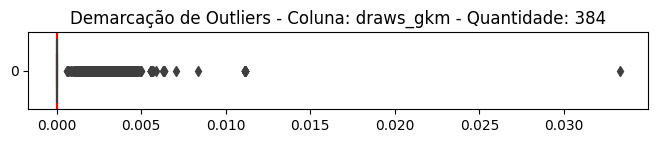



    OUTLIERS DA COLUNA losses_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "losses_gkm": [0.000292398, 0.000292398, 0.000634921, 0.000634921, 0.000952381, 0.000980392, 0.001010101, 0.001010101, 0.001058201, 0.001058201, 0.001058201, 0.001169591, 0.001169591, 0.001178203, 0.001179709, 0.001234568, 0.001234568, 0.001234568, 0.001303215, 0.001303215, 0.001319261, 0.001319261, 0.001346801, 0.001388889, 0.001388889, 0.001388889, 0.001466276, 0.001466276, 0.001602564, 0.001667593, 0.001667593, 0.001687764, 0.001709402, 0.001709402, 0.001733703, 0.001801802, 0.001801802, 0.001851852, 0.001851852, 0.001851852, 0.001904762, 0.001960784, 0.001960784, 0.002020202, 0.002020202, 0.002046784, 0.002046784, 0.002051282, 0.002059025, 0.002059025, 0.00212766, 0.00212766, 0.002208899, 0.002208899, 0.002222222, 0.002222222, 0.002222222, 0.002222222, 0.002222222, 0.002222222, 0.002222222, 0.002265372, 0.002265372, 0.002287582, 0.002287582, 0.002287582, 0.002287582, 0.002315708, 0

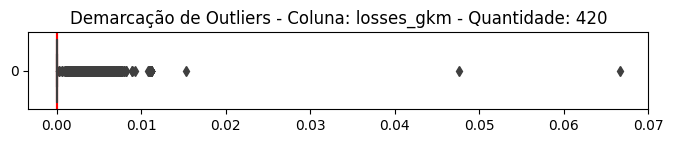



    OUTLIERS DA COLUNA clean_sheetsm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "clean_sheetsm": [0.000600601, 0.000667334, 0.000854701, 0.000854701, 0.00106383, 0.00106383, 0.001234568, 0.001234568, 0.001237624, 0.00130719, 0.00130719, 0.00130719, 0.00130719, 0.00130719, 0.001388889, 0.001388889, 0.001501502, 0.001515152, 0.001525553, 0.001525553, 0.001537673, 0.00154321, 0.00154321, 0.00154321, 0.001550388, 0.001587302, 0.001587302, 0.001633987, 0.001646091, 0.001646091, 0.001683502, 0.001683502, 0.001683502, 0.001683502, 0.001709402, 0.001709402, 0.001709402, 0.001709402, 0.001709402, 0.001731902, 0.001736111, 0.001736111, 0.001736111, 0.001743679, 0.001777778, 0.001777778, 0.001777778, 0.001788909, 0.001788909, 0.001792115, 0.001792757, 0.001792757, 0.001799856, 0.001799856, 0.001811594, 0.001811594, 0.001851852, 0.001851852, 0.001855288, 0.001883239, 0.00191296, 0.001915709, 0.001915709, 0.001915709, 0.001943635, 0.001943635, 0.001960784, 0.001960784, 0.00

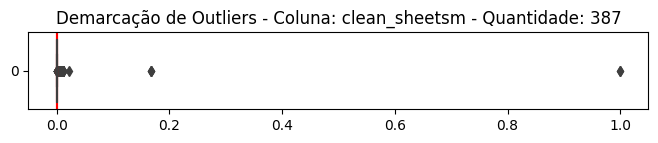



    OUTLIERS DA COLUNA clean_sheets_pctm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "clean_sheets_pctm": [0.001621622, 0.001968635, 0.003434406, 0.004054054, 0.004290123, 0.004290123, 0.004290123, 0.004803922, 0.005117845, 0.005117845, 0.005117845, 0.005117845, 0.005264981, 0.005380117, 0.005380117, 0.005380117, 0.005380117, 0.005380117, 0.005380117, 0.005416667, 0.005416667, 0.005416667, 0.005751634, 0.005751634, 0.005751634, 0.005770609, 0.005772678, 0.005772678, 0.006011519, 0.006011519, 0.006090535, 0.006090535, 0.006127946, 0.006127946, 0.006486486, 0.006486486, 0.006488435, 0.006488435, 0.006581197, 0.006581197, 0.006581197, 0.006590038, 0.006590038, 0.006590038, 0.006732026, 0.006868687, 0.006929825, 0.006929825, 0.007028424, 0.007103175, 0.007103175, 0.007111111, 0.007111111, 0.007174556, 0.007174556, 0.007269841, 0.007269841, 0.007269841, 0.007269841, 0.007329575, 0.007566138, 0.007566138, 0.007690058, 0.007690058, 0.007690058, 0.007690058, 0.007690058

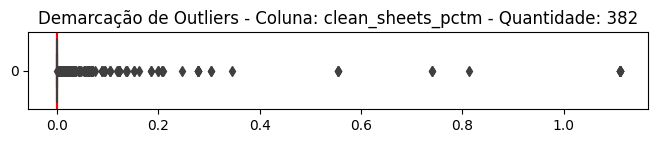



    OUTLIERS DA COLUNA pens_att_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_att_gkm": [0.000292398, 0.000292398, 0.00031746, 0.00031746, 0.00031746, 0.000340483, 0.000340483, 0.000393236, 0.000396825, 0.000462963, 0.000505051, 0.000570125, 0.000570125, 0.000580046, 0.000580046, 0.000584795, 0.000584795, 0.000584795, 0.000584795, 0.000617665, 0.000653595, 0.000653595, 0.000654664, 0.000654664, 0.000673401, 0.000686342, 0.000686342, 0.000694444, 0.000823384, 0.000854701, 0.000854701, 0.000854701, 0.000877193, 0.000888889, 0.000888889, 0.000888889, 0.000888889, 0.000925926, 0.000925926, 0.000925926, 0.000952381, 0.00097688, 0.000980392, 0.000980392, 0.001010101, 0.001010101, 0.001025641, 0.001033592, 0.001058201, 0.001075269, 0.001075269, 0.001083032, 0.001111111, 0.001169591, 0.001169591, 0.001169591, 0.001169591, 0.001169591, 0.001178203, 0.001190476, 0.001201562, 0.001201562, 0.001234568, 0.001234568, 0.001234568, 0.001234568, 0.001234568, 0.001234568,

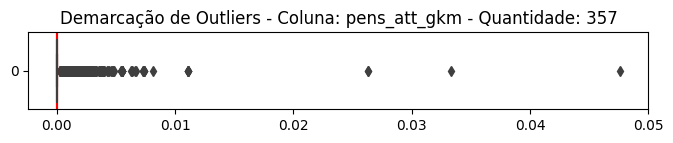



    OUTLIERS DA COLUNA pens_allowedm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_allowedm": [0.000308642, 0.00031746, 0.00031746, 0.000326797, 0.000340483, 0.000340483, 0.000393236, 0.000396825, 0.000411523, 0.000411692, 0.000505051, 0.000516796, 0.000529101, 0.000570125, 0.000570125, 0.000580046, 0.000580046, 0.000584795, 0.000584795, 0.000584795, 0.000584795, 0.000584795, 0.000584795, 0.000584795, 0.000584795, 0.000617284, 0.000617284, 0.000617665, 0.000631114, 0.000631114, 0.000634921, 0.000634921, 0.000634921, 0.000653595, 0.000653595, 0.000653595, 0.000653595, 0.000653595, 0.000653595, 0.000654664, 0.000654664, 0.000673401, 0.000683761, 0.000686342, 0.000686342, 0.000694444, 0.000694444, 0.000694444, 0.000694444, 0.000717103, 0.000717103, 0.000728597, 0.000728597, 0.000793651, 0.000854701, 0.000854701, 0.000854701, 0.000877193, 0.000877193, 0.000883652, 0.000888889, 0.000888889, 0.000888889, 0.000888889, 0.000900901, 0.000900901, 0.000901172, 0.000901

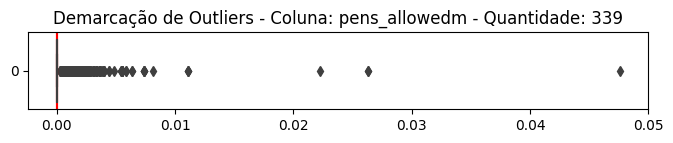



    OUTLIERS DA COLUNA pens_savedm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_savedm": [0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.000308642, 0.000308642, 0.000308642, 0.000308642, 0.000308642, 0.000309406, 0.00031746, 0.00031746, 0.00031746, 0.000323625, 0.000323625, 0.000326797, 0.000326797, 0.000326797, 0.000331675, 0.000331675, 0.0003367, 0.0003367, 0.0003367, 0.0003367, 0.0003367, 0.0003367, 0.0003367, 0.00034188, 0.000347222, 0.000347222, 0.000347222, 0.000358423, 0.000359971, 0.000359971, 0.000364299, 0.000364299, 0.000365631, 0.000365631, 0.000369822, 0.000369822, 0.000377501, 0.000383142, 0.000385951, 0.000396825, 0.000396825, 0.000396825, 0.000411523, 0.000411523, 0.000411692, 0.000417188, 0.00042735, 0.00043573, 0.00043573, 0.000444444, 0.000444444, 0.000462963, 0.000462963, 0.000512558, 0.000516796, 0.000529

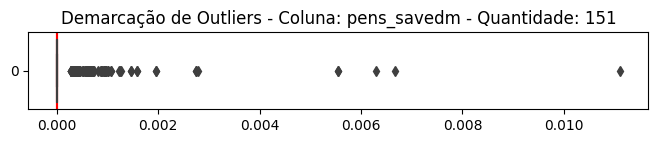



    OUTLIERS DA COLUNA pens_missed_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pens_missed_gkm": [0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000294551, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.000300391, 0.000300391, 0.000308642, 0.000308642, 0.000311236, 0.000311236, 0.00031746, 0.00034188, 0.00034188, 0.000347222, 0.000347222, 0.000364299, 0.000364299, 0.000385951, 0.000396825, 0.000411523, 0.000411523, 0.000411523, 0.000411523, 0.000417188, 0.00042735, 0.00042735, 0.000444444, 0.000444444, 0.000444444, 0.000462963, 0.000462963, 0.000505051, 0.000529101, 0.000584795, 0.000584795, 0.000617284, 0.000617284, 0.000653595, 0.000668673, 0.000694444, 0.000694444, 0.000823045, 0.000823045, 0.000854701, 0.001111111, 0.001234568, 0.00130719, 0.00130719, 0.001319261, 0.001319261, 0.001428571, 0.001587302, 0.001587302, 0.001883239, 0.002202643, 0.002777778, 0.005555556, 0.005555556]


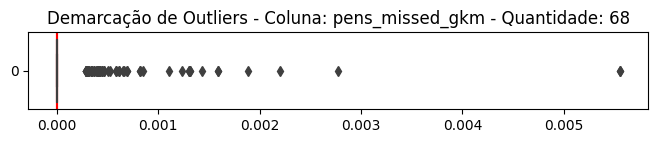



    OUTLIERS DA COLUNA minutes_90s_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "minutes_90s_gkm": [0.000925926, 0.001743679, 0.007142857, 0.008333333, 0.009090909, 0.00952381, 0.009620253, 0.010526316, 0.010526316, 0.010526316, 0.010837438, 0.010837438, 0.010909091, 0.010909091, 0.010958904, 0.010958904, 0.01097561, 0.01097561, 0.010989011, 0.010989011, 0.011013216, 0.011029412, 0.011034483, 0.011041009, 0.011047619, 0.011050725, 0.011050725, 0.011051213, 0.011057692, 0.011058824, 0.011061947, 0.011061947, 0.01106383, 0.01106383, 0.011071429, 0.011078886, 0.011078886, 0.011079944, 0.011079944, 0.011081794, 0.011081794, 0.011083123, 0.011083123, 0.011085714, 0.011089239, 0.011089239, 0.011089239, 0.011091234, 0.011091234, 0.011092531, 0.011094675, 0.011094675, 0.01109517, 0.0110957, 0.011095984, 0.011097046, 0.011097205, 0.011098528, 0.011098779, 0.011099762, 0.011099762, 0.011099967, 0.011101512, 0.011103875, 0.011104061, 0.011104061, 0.011104566, 0.01110719

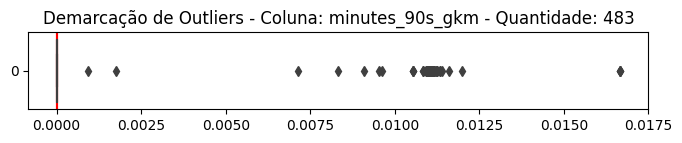



    OUTLIERS DA COLUNA free_kick_goals_against_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "free_kick_goals_against_gkm": [0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.000294551, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.0003003, 0.000300391, 0.000300391, 0.000308642, 0.000308642, 0.00031746, 0.00031746, 0.000323625, 0.000323625, 0.000325627, 0.000326797, 0.000326797, 0.000326797, 0.000326797, 0.000326797, 0.000326797, 0.000326797, 0.000326797, 0.000331675, 0.000331675, 0.000333667, 0.000334336, 0.0003367, 0.0003367, 0.000340483, 0.000340483, 0.00034188, 0.00034188, 0.00034638, 0.000347222, 0.000347222, 0.000347222, 0.000347222, 0.000347222, 0.000352609, 0.000352609, 0.000358423, 0.000359971, 0.000359971, 0.000364299, 0.000364299, 0.000385951, 0.000396825, 0.000396825, 0.000411523, 0.000411692, 0.00042735, 0.00

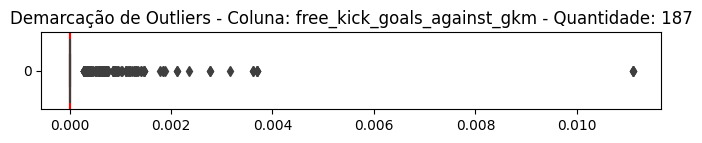



    OUTLIERS DA COLUNA corner_kick_goals_against_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "corner_kick_goals_against_gkm": [0.000308642, 0.00031746, 0.00031746, 0.000393236, 0.000396825, 0.00042735, 0.000529101, 0.000529101, 0.000555864, 0.000555864, 0.000584795, 0.000600601, 0.000600601, 0.000617284, 0.000631712, 0.000653595, 0.000653595, 0.000654664, 0.000654664, 0.000656168, 0.000731261, 0.000731261, 0.000823045, 0.000843882, 0.000848176, 0.000854701, 0.000854701, 0.00086881, 0.00086881, 0.00086881, 0.00086881, 0.00087146, 0.00087146, 0.000877193, 0.000877193, 0.000888889, 0.000900901, 0.000900901, 0.000952381, 0.000952381, 0.000952381, 0.000980392, 0.000980392, 0.000980392, 0.001003009, 0.001010101, 0.001010101, 0.001010101, 0.001013514, 0.001025641, 0.001039141, 0.001111111, 0.001111111, 0.001140251, 0.001140251, 0.001142857, 0.001169591, 0.001169591, 0.001169591, 0.001169591, 0.001169591, 0.001169591, 0.001178203, 0.001201201, 0.001201201, 0.0012345

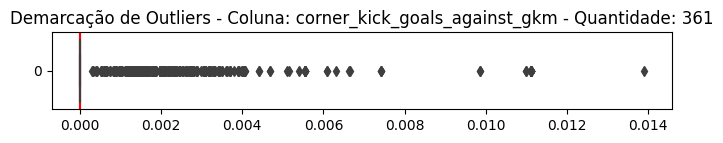



    OUTLIERS DA COLUNA own_goals_against_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "own_goals_against_gkm": [0.000292398, 0.000292398, 0.000292398, 0.000292398, 0.0003003, 0.0003003, 0.0003003, 0.000308642, 0.000308642, 0.000308642, 0.000308737, 0.000308737, 0.000312402, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.00031746, 0.000323625, 0.000323625, 0.000325627, 0.000327332, 0.000327332, 0.0003367, 0.0003367, 0.0003367, 0.0003367, 0.0003367, 0.000340483, 0.000340483, 0.00034188, 0.00034188, 0.00034188, 0.00034638, 0.000383142, 0.000383142, 0.000393236, 0.000396825, 0.000396825, 0.000396825, 0.000411523, 0.000411523, 0.00042735, 0.000434405, 0.000434405, 0.000444444, 0.000453926, 0.000462963, 0.000485909, 0.000485909, 0.000512558, 0.000516796, 0.000529101, 0.000529101, 0.000529101, 0.000529101, 0.000529101, 0.000529101, 0.000555556, 0.000555556, 0.000557414, 0.000570125, 0.000570125, 0.000584

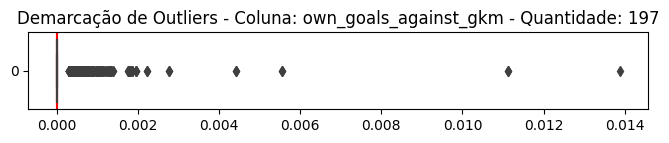



    OUTLIERS DA COLUNA psxg_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "psxg_gkm": [0.000959024, 0.001111111, 0.001111111, 0.001481481, 0.002222222, 0.002222222, 0.002222222, 0.002222222, 0.002222222, 0.003333333, 0.005, 0.005555556, 0.005555556, 0.005555556, 0.005555556, 0.006111111, 0.006666667, 0.00712424, 0.00712424, 0.007168459, 0.007222222, 0.007222222, 0.00742268, 0.00745098, 0.007676768, 0.007777778, 0.007777778, 0.007777778, 0.007777778, 0.007777778, 0.007777778, 0.007836257, 0.007836257, 0.007865497, 0.007865497, 0.008163265, 0.008201058, 0.008683761, 0.008761905, 0.008765432, 0.008765432, 0.008887141, 0.008888889, 0.008888889, 0.008888889, 0.008888889, 0.00912037, 0.009234828, 0.009234828, 0.009310345, 0.009382716, 0.009555556, 0.009555556, 0.009603175, 0.009605992, 0.00962963, 0.00969697, 0.00969697, 0.009722222, 0.009722222, 0.00981755, 0.00981755, 0.009856631, 0.009856631, 0.009935897, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01020202, 0.01020202, 0.01

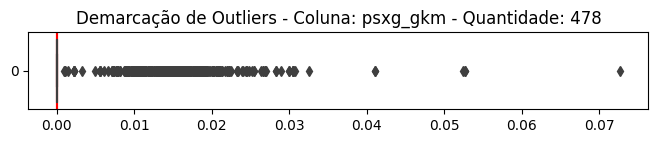



    OUTLIERS DA COLUNA psnpxg_per_shot_on_target_againstm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "psnpxg_per_shot_on_target_againstm": [6.48e-05, 7.21e-05, 7.21e-05, 7.31e-05, 7.31e-05, 7.31e-05, 7.31e-05, 7.51e-05, 7.51e-05, 7.81e-05, 7.81e-05, 7.81e-05, 7.81e-05, 7.84e-05, 7.84e-05, 7.84e-05, 7.89e-05, 7.89e-05, 7.89e-05, 7.89e-05, 7.94e-05, 7.94e-05, 7.96e-05, 7.96e-05, 8.11e-05, 8.11e-05, 8.11e-05, 8.11e-05, 8.17e-05, 8.17e-05, 8.19e-05, 8.19e-05, 8.19e-05, 8.19e-05, 8.19e-05, 8.19e-05, 8.19e-05, 8.19e-05, 8.19e-05, 8.19e-05, 8.21e-05, 8.33e-05, 8.33e-05, 8.41e-05, 8.41e-05, 8.41e-05, 8.41e-05, 8.49e-05, 8.5e-05, 8.57e-05, 8.57e-05, 8.57e-05, 8.57e-05, 8.64e-05, 8.64e-05, 8.64e-05, 8.74e-05, 8.74e-05, 8.77e-05, 8.77e-05, 8.89e-05, 8.89e-05, 8.89e-05, 8.89e-05, 8.95e-05, 9.01e-05, 9.06e-05, 9.09e-05, 9.15e-05, 9.21e-05, 9.21e-05, 9.21e-05, 9.21e-05, 9.23e-05, 9.23e-05, 9.26e-05, 9.28e-05, 9.33e-05, 9.34e-05, 9.34e-05, 9.36e-05, 9.36e-05, 9.36e-05, 9.36e-

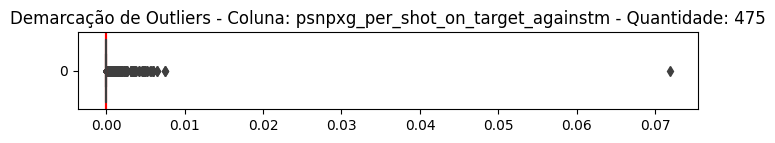



    OUTLIERS DA COLUNA psxg_net_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "psxg_net_gkm": [-0.024175824, -0.024175824, -0.018181818, -0.015277778, -0.012380952, -0.012380952, -0.012222222, -0.012222222, -0.011111111, -0.011111111, -0.010294118, -0.01, -0.01, -0.009814815, -0.009444444, -0.009259259, -0.009259259, -0.008888889, -0.008611111, -0.008611111, -0.008069164, -0.007971014, -0.007971014, -0.007964602, -0.007964602, -0.007909605, -0.007777778, -0.007777778, -0.007666667, -0.007168459, -0.007142857, -0.006918239, -0.006352941, -0.006307978, -0.006111111, -0.006111111, -0.005649718, -0.005277778, -0.005263158, -0.005263158, -0.005, -0.005, -0.005, -0.004920635, -0.004920635, -0.004814815, -0.004542484, -0.004444444, -0.004444444, -0.004444444, -0.004444444, -0.004444444, -0.004444444, -0.004444444, -0.004361702, -0.004361702, -0.004166667, -0.004166667, -0.004166667, -0.004166667, -0.004166667, -0.004166667, -0.004065041, -0.003688889, -0.003688889, -

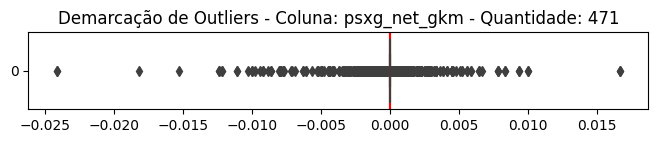



    OUTLIERS DA COLUNA psxg_net_per90_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "psxg_net_per90_gkm": [-0.16, -0.023956044, -0.023956044, -0.021333333, -0.021333333, -0.019861111, -0.012, -0.012, -0.011842105, -0.011842105, -0.008888889, -0.008, -0.006985294, -0.005, -0.004777778, -0.004333333, -0.004333333, -0.004333333, -0.003899371, -0.003888889, -0.003555556, -0.003555556, -0.003555556, -0.003555556, -0.003367347, -0.003333333, -0.003333333, -0.003296296, -0.003296296, -0.003222222, -0.003222222, -0.003222222, -0.003222222, -0.003185841, -0.003185841, -0.003111111, -0.003111111, -0.003111111, -0.003111111, -0.003037037, -0.003037037, -0.003, -0.003, -0.002682927, -0.002666667, -0.002666667, -0.002555556, -0.002555556, -0.0025, -0.002365591, -0.002166667, -0.002166667, -0.002074928, -0.001666667, -0.001666667, -0.00162963, -0.001592593, -0.001555556, -0.001537037, -0.001537037, -0.001518519, -0.001355932, -0.001341463, -0.001341463, -0.001341176, -0.001

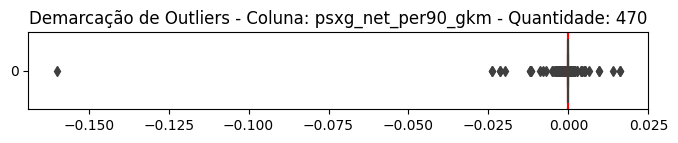



    OUTLIERS DA COLUNA passes_completed_launched_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "passes_completed_launched_gkm": [0.003703704, 0.003703704, 0.005555556, 0.006974717, 0.008333333, 0.010185185, 0.011111111, 0.013333333, 0.014492754, 0.016666667, 0.020952381, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.025115325, 0.026315789, 0.026315789, 0.027160494, 0.027777778, 0.027777778, 0.027777778, 0.028104575, 0.028104575, 0.029411765, 0.030555556, 0.031034483, 0.03127715, 0.03127715, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033975085, 0.034300792, 0.034300792, 0.034444444, 0.034444444, 0.035087719, 0.03539823, 0.03539823, 0.035449735, 0.0367597, 0.037037037, 0.037037037, 0.037037037, 0.037179487, 0.038888889, 0.038888889, 0.038888889, 0.039426523, 0.04, 0.04005848, 0.04005848, 0.040740741, 0.040740741, 0.040740741, 0.040740741, 0.041354608, 0.

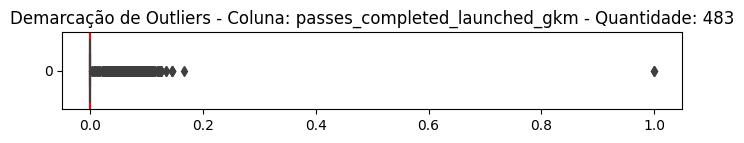



    OUTLIERS DA COLUNA passes_launched_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "passes_launched_gkm": [0.003703704, 0.003703704, 0.011111111, 0.014814815, 0.019180471, 0.019444444, 0.026315789, 0.026315789, 0.033333333, 0.044444444, 0.044444444, 0.04691358, 0.048366013, 0.048366013, 0.052631579, 0.055555556, 0.058333333, 0.058333333, 0.060952381, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.067195767, 0.067195767, 0.068170169, 0.06984127, 0.074200136, 0.077190274, 0.077777778, 0.077777778, 0.080755454, 0.080994152, 0.080994152, 0.081794195, 0.081794195, 0.082758621, 0.086666667, 0.086666667, 0.086752137, 0.087619048, 0.087619048, 0.088888889, 0.088888889, 0.088888889, 0.088888889, 0.088888889, 0.088888889, 0.09015873, 0.090909091, 0.090935673, 0.097345133, 0.097345133, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.100275265, 0.101633987, 0.103703704, 0.103703704, 0.104320988, 0.107732407, 0.107732407, 0.108442004, 0.108442004, 0.108641975, 0.108641975, 0.1111

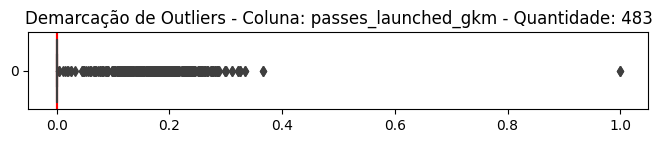



    OUTLIERS DA COLUNA passes_pct_launched_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "passes_pct_launched_gkm": [0.008539683, 0.008830409, 0.008830409, 0.009093567, 0.009104938, 0.009129129, 0.009444444, 0.00951952, 0.00951952, 0.009824561, 0.009824561, 0.010086634, 0.010116959, 0.010116959, 0.010285714, 0.01031746, 0.01031746, 0.01037037, 0.01037037, 0.010412698, 0.010412698, 0.010543018, 0.010543018, 0.010603175, 0.010607777, 0.010760234, 0.010760234, 0.010818713, 0.010818713, 0.010906433, 0.010906433, 0.010935673, 0.010942761, 0.010942761, 0.010987654, 0.011081871, 0.011171171, 0.011171171, 0.011234568, 0.01128655, 0.011388889, 0.011419753, 0.011531532, 0.011531532, 0.011651652, 0.011651652, 0.011666667, 0.011752577, 0.011830065, 0.011830065, 0.011973466, 0.011973466, 0.012222222, 0.012222222, 0.012280702, 0.012280702, 0.01231746, 0.012397661, 0.012397661, 0.012567568, 0.012706518, 0.012706518, 0.012781434, 0.012888889, 0.012888889, 0.013040936, 0.01310

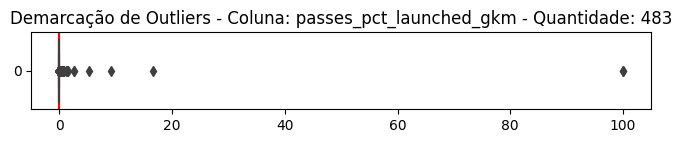



    OUTLIERS DA COLUNA passes_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "passes_gkm": [0.027777778, 0.029642546, 0.052631579, 0.078947368, 0.078947368, 0.122222222, 0.133333333, 0.151428571, 0.155555556, 0.155555556, 0.155555556, 0.155555556, 0.155555556, 0.155555556, 0.163888889, 0.168218684, 0.168218684, 0.170570571, 0.170570571, 0.174074074, 0.177777778, 0.177777778, 0.177777778, 0.177777778, 0.177777778, 0.1826742, 0.182795699, 0.1829653, 0.183068783, 0.183068783, 0.185185185, 0.185185185, 0.18627451, 0.18627451, 0.187037037, 0.187037037, 0.188888889, 0.190279823, 0.192361111, 0.192361111, 0.19382716, 0.19382716, 0.19382716, 0.194444444, 0.195424837, 0.195424837, 0.195614035, 0.196666667, 0.197802198, 0.197802198, 0.197883598, 0.197883598, 0.199074074, 0.199074074, 0.2, 0.202777778, 0.202777778, 0.202777778, 0.202777778, 0.203703704, 0.203703704, 0.204444444, 0.204444444, 0.205555556, 0.205555556, 0.205555556, 0.205555556, 0.207407407, 0.207407407, 0.2

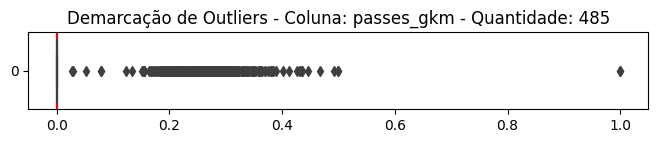



    OUTLIERS DA COLUNA passes_throws_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "passes_throws_gkm": [0.004359198, 0.005555556, 0.011111111, 0.011111111, 0.011988304, 0.013888889, 0.013888889, 0.014327485, 0.014327485, 0.015772871, 0.015915916, 0.015915916, 0.018115942, 0.018115942, 0.021428571, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022222222, 0.022857143, 0.024761905, 0.024853801, 0.024853801, 0.025, 0.025, 0.025, 0.025146199, 0.025146199, 0.025925926, 0.025925926, 0.026315789, 0.026315789, 0.026666667, 0.026902887, 0.026902887, 0.027777778, 0.027777778, 0.027777778, 0.027777778, 0.027777778, 0.027936508, 0.027936508, 0.028673835, 0.028888889, 0.028947368, 0.028947368, 0.029411765, 0.02962963, 0.02962963, 0.03003003, 0.03003003, 0.030114566, 0.030114566, 0.03046595, 0.03046595, 0.030555556, 0.031578947, 0.031578947, 0.032141784, 0.032141784, 0.032352941, 0.032679739, 0.032679739, 0.03269514, 0.03291139

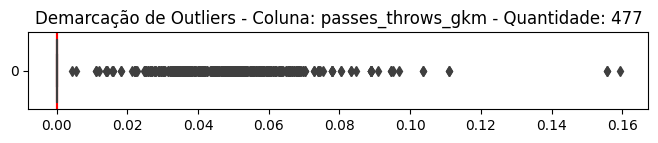



    OUTLIERS DA COLUNA pct_passes_launched_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pct_passes_launched_gkm": [0.00628655, 0.00628655, 0.006666667, 0.006666667, 0.006920635, 0.006920635, 0.007037037, 0.007131228, 0.00768254, 0.007894737, 0.007894737, 0.008383838, 0.008383838, 0.008496732, 0.008496732, 0.008529412, 0.008634921, 0.008634921, 0.008754209, 0.008899676, 0.008899676, 0.009494949, 0.009700855, 0.009791585, 0.009869281, 0.009883041, 0.009883041, 0.009907407, 0.009907407, 0.010326797, 0.010326797, 0.010588235, 0.010588235, 0.010590278, 0.010607777, 0.010758123, 0.010942761, 0.010942761, 0.010999614, 0.011321321, 0.011666667, 0.011666667, 0.01174189, 0.01174189, 0.011851852, 0.011900585, 0.011996251, 0.012010582, 0.012010582, 0.012045379, 0.012083333, 0.012091503, 0.012147617, 0.012258065, 0.01234127, 0.012457912, 0.012457912, 0.012631579, 0.012631579, 0.012757202, 0.012757202, 0.012825397, 0.012825397, 0.012864078, 0.012905983, 0.012910053, 0.013

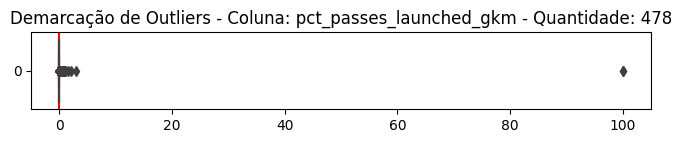



    OUTLIERS DA COLUNA passes_length_avg_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "passes_length_avg_gkm": [0.008684211, 0.008684211, 0.008888889, 0.009206349, 0.009206349, 0.009333333, 0.009473684, 0.009473684, 0.009671117, 0.00973064, 0.00973064, 0.0097411, 0.0097411, 0.009814815, 0.009814815, 0.00984127, 0.00984127, 0.009883041, 0.01002924, 0.010087719, 0.01013468, 0.010600601, 0.010707071, 0.010746642, 0.010784314, 0.010816993, 0.010915033, 0.010915033, 0.010935673, 0.010976431, 0.010976431, 0.010980392, 0.010980392, 0.01122807, 0.01122807, 0.011422347, 0.011422347, 0.011493056, 0.011644978, 0.011666667, 0.011666667, 0.01172043, 0.011783626, 0.011783626, 0.011794872, 0.011841155, 0.01204228, 0.012102102, 0.012102102, 0.012111111, 0.012121212, 0.012121212, 0.012126984, 0.012126984, 0.01215873, 0.012251462, 0.012251462, 0.012280702, 0.012280702, 0.012282282, 0.012282282, 0.012283951, 0.012465592, 0.01251763, 0.01251763, 0.01254342, 0.012673611, 0.012673

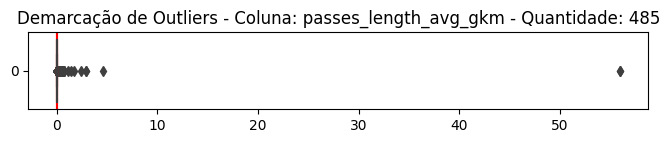



    OUTLIERS DA COLUNA goal_kicksm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "goal_kicksm": [0.006481481, 0.016564952, 0.021978022, 0.021978022, 0.025925926, 0.025925926, 0.027777778, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.033333333, 0.037037037, 0.04, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.04526213, 0.047493404, 0.047493404, 0.048780488, 0.049707602, 0.049707602, 0.05, 0.05, 0.050632911, 0.051428571, 0.051851852, 0.052128584, 0.052128584, 0.052631579, 0.052631579, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.057181756, 0.058888889, 0.058888889, 0.059915612, 0.06026936, 0.060818713, 0.060818713, 0.061111111, 0.061111111, 0.061111111, 0.061111111, 0.061111111, 0.061946903, 0.061946903, 0.062222222, 0.062222222, 0.062222222, 0.062539683, 0.062539683, 0.062698413, 0.062698413, 0.063555556, 0.063888889, 0.063888889, 0.064444444, 0.066666667, 0.066666667, 0.066666667, 0.06666

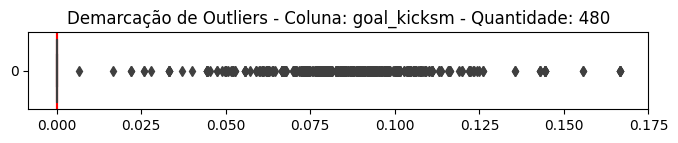



    OUTLIERS DA COLUNA pct_goal_kicks_launchedm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "pct_goal_kicks_launchedm": [0.007397661, 0.007508418, 0.007680432, 0.008610969, 0.009035621, 0.009035621, 0.009166667, 0.009365079, 0.009385965, 0.010778248, 0.012007168, 0.012078745, 0.012156863, 0.012202166, 0.012291667, 0.012418301, 0.012642643, 0.012645503, 0.01265873, 0.012679739, 0.012843137, 0.012843137, 0.013020833, 0.013333333, 0.013888889, 0.013954248, 0.014040404, 0.014190476, 0.014190476, 0.014269006, 0.014269006, 0.014276094, 0.014276094, 0.014518519, 0.014700855, 0.014705882, 0.014705882, 0.014705882, 0.014845679, 0.014854369, 0.014854369, 0.01513682, 0.015321637, 0.015321637, 0.015384615, 0.015493512, 0.01556178, 0.01556178, 0.015620119, 0.015723906, 0.015723906, 0.015802469, 0.015802469, 0.016339869, 0.016539683, 0.016560847, 0.016560847, 0.016836542, 0.017067901, 0.017478632, 0.018063492, 0.018063492, 0.018421053, 0.01864831, 0.018950617, 0.019004975, 0.

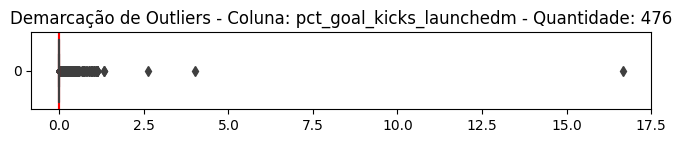



    OUTLIERS DA COLUNA goal_kick_length_avgm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "goal_kick_length_avgm": [0.007953216, 0.009567901, 0.009619048, 0.00976431, 0.009912281, 0.010343497, 0.01045045, 0.010610611, 0.010716846, 0.011315789, 0.011396939, 0.011535948, 0.011895425, 0.011929825, 0.012214933, 0.012222222, 0.012291667, 0.012382671, 0.012506407, 0.012667289, 0.012667289, 0.012712418, 0.012777778, 0.012783172, 0.012783172, 0.012793651, 0.012793651, 0.012896825, 0.012932099, 0.012932099, 0.013164983, 0.013169935, 0.013169935, 0.013169935, 0.013299663, 0.013299663, 0.013300654, 0.013538012, 0.013538012, 0.013592593, 0.013716661, 0.01379085, 0.01379085, 0.013919753, 0.014253968, 0.014378801, 0.014378801, 0.014444444, 0.014444444, 0.014444444, 0.014444444, 0.014444444, 0.014444444, 0.014444444, 0.014504505, 0.014504505, 0.014529915, 0.014707602, 0.014707602, 0.015100038, 0.01525757, 0.015555556, 0.015614035, 0.015675676, 0.015675676, 0.015714286, 0.015858

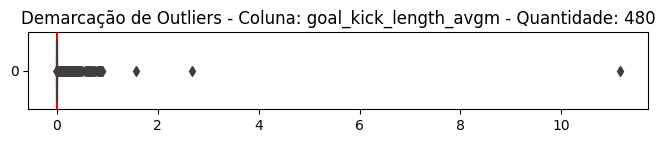



    OUTLIERS DA COLUNA crosses_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "crosses_gkm": [0.010185185, 0.02092415, 0.027777778, 0.033333333, 0.033333333, 0.038888889, 0.041666667, 0.041666667, 0.04353562, 0.04353562, 0.044117647, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.044444444, 0.05, 0.05, 0.051754386, 0.051754386, 0.051851852, 0.054945055, 0.054945055, 0.055169418, 0.055169418, 0.055555556, 0.055555556, 0.055555556, 0.055555556, 0.056007815, 0.057142857, 0.057142857, 0.059047619, 0.059259259, 0.064039409, 0.064039409, 0.065656566, 0.066326531, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.066666667, 0.067320261, 0.067320261, 0.068627451, 0.07124183, 0.07166362, 0.07166362, 0.071775312, 0.072222222, 0.072222222, 0.072413793, 0.073170732, 0.073170732, 0.074683544, 0.074747475, 0.074747475, 0.075221239, 0.075221239, 0.075351793, 0.076608187, 0.076767677, 0.077366255, 0.07

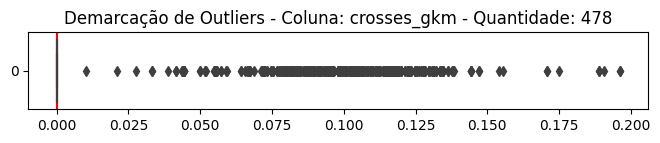



    OUTLIERS DA COLUNA crosses_stopped_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "crosses_stopped_gkm": [0.001234568, 0.001743679, 0.001851852, 0.001851852, 0.001851852, 0.001883239, 0.002222222, 0.002469136, 0.002469136, 0.002614379, 0.002614379, 0.002614379, 0.002777778, 0.002777778, 0.002777778, 0.002777778, 0.002923977, 0.003030303, 0.003174603, 0.003174603, 0.003174603, 0.003174603, 0.003240741, 0.003240741, 0.003333333, 0.003703704, 0.003703704, 0.003703704, 0.003703704, 0.003703704, 0.003703704, 0.003703704, 0.003703704, 0.003703704, 0.003703704, 0.003703704, 0.003703704, 0.003710575, 0.003797468, 0.003813883, 0.003813883, 0.003907522, 0.003909644, 0.003909644, 0.003921569, 0.003921569, 0.003921569, 0.003968254, 0.004, 0.004, 0.004012346, 0.004100461, 0.004115226, 0.004115226, 0.004245465, 0.004255319, 0.004255319, 0.004302617, 0.004302617, 0.004319654, 0.004377104, 0.004385965, 0.004385965, 0.004398827, 0.004398827, 0.004444444, 0.004444444, 0.0044

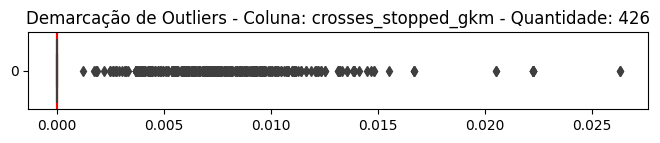



    OUTLIERS DA COLUNA crosses_stopped_pct_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "crosses_stopped_pct_gkm": [0.000994152, 0.001013072, 0.001321321, 0.001321321, 0.001362496, 0.001362496, 0.001435185, 0.001435185, 0.001460317, 0.001460317, 0.001460317, 0.001512346, 0.001520468, 0.001547619, 0.001549708, 0.001549708, 0.001568627, 0.001568627, 0.001582492, 0.001582492, 0.0016, 0.0016, 0.001601307, 0.001604938, 0.001620029, 0.001646091, 0.001646091, 0.001683502, 0.001683502, 0.001746032, 0.001746032, 0.001783626, 0.001783626, 0.001830065, 0.001830065, 0.001835169, 0.001851852, 0.001851852, 0.001861862, 0.001925926, 0.001929757, 0.001929825, 0.001929825, 0.001929825, 0.001929825, 0.001952538, 0.001952538, 0.001969697, 0.002, 0.002006173, 0.002012012, 0.002012012, 0.002012012, 0.002012012, 0.002013889, 0.002013889, 0.002023031, 0.002023031, 0.002030238, 0.002119658, 0.002119658, 0.002128378, 0.002134503, 0.002134503, 0.002154882, 0.002154882, 0.00215873, 0.0

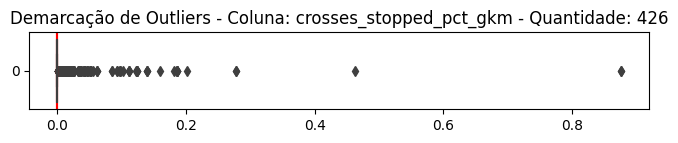



    OUTLIERS DA COLUNA def_actions_outside_pen_area_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "def_actions_outside_pen_area_gkm": [0.001234568, 0.001234568, 0.001388889, 0.001388889, 0.001754386, 0.001754386, 0.001851852, 0.002222222, 0.002222222, 0.002280502, 0.002280502, 0.002287582, 0.002287582, 0.002364066, 0.002469136, 0.002469136, 0.00250986, 0.00250986, 0.002614379, 0.002614379, 0.002614379, 0.002614379, 0.002624672, 0.002624672, 0.002624672, 0.002745367, 0.002745367, 0.002777778, 0.002777778, 0.002857143, 0.002857143, 0.002881844, 0.002915452, 0.002915452, 0.003003003, 0.003003003, 0.003075346, 0.003088326, 0.003148615, 0.003148615, 0.003174603, 0.003174603, 0.003174603, 0.003174603, 0.003174603, 0.003174603, 0.003216374, 0.003216374, 0.003216374, 0.003418803, 0.003418803, 0.003418803, 0.003418803, 0.003472222, 0.003492063, 0.003492063, 0.003571429, 0.003577818, 0.003577818, 0.003594771, 0.003594771, 0.003603604, 0.003603604, 0.003623188, 0.0036231

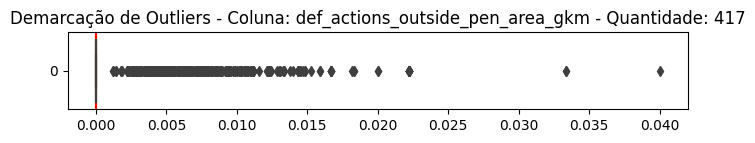



    OUTLIERS DA COLUNA def_actions_outside_pen_area_per90_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "def_actions_outside_pen_area_per90_gkm": [4.51e-05, 4.51e-05, 4.68e-05, 4.68e-05, 6.86e-05, 6.86e-05, 7.84e-05, 8.11e-05, 8.11e-05, 8.25e-05, 8.25e-05, 8.25e-05, 8.48e-05, 8.48e-05, 8.48e-05, 9.21e-05, 9.21e-05, 9.61e-05, 9.61e-05, 9.84e-05, 9.84e-05, 9.94e-05, 9.94e-05, 0.000104575, 0.000104575, 0.000105137, 0.000105137, 0.000107937, 0.000108187, 0.000111486, 0.000114035, 0.000114035, 0.00011746, 0.00011746, 0.000119726, 0.000119726, 0.00012012, 0.000122807, 0.000122807, 0.000123123, 0.000123123, 0.000123123, 0.000126336, 0.000126336, 0.000126984, 0.000130268, 0.000131313, 0.000131313, 0.000131579, 0.000132548, 0.000132686, 0.000132686, 0.000133987, 0.000135802, 0.000135802, 0.000138138, 0.000143516, 0.000143791, 0.000143791, 0.000145062, 0.000145062, 0.000145594, 0.000145594, 0.000146032, 0.000146199, 0.000149573, 0.000152263, 0.000152263, 0.000154762, 0.

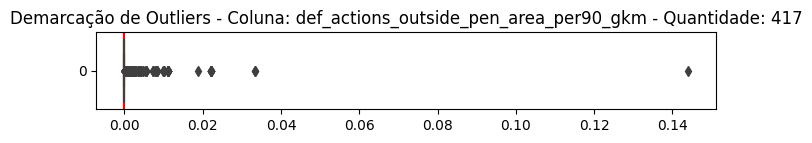



    OUTLIERS DA COLUNA avg_distance_def_actions_gkm
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "avg_distance_def_actions_gkm": [0.003393393, 0.003393393, 0.003596491, 0.003654971, 0.003654971, 0.003684211, 0.003684211, 0.00377193, 0.00377193, 0.003809524, 0.003809524, 0.003844998, 0.003844998, 0.003873874, 0.003888889, 0.003888889, 0.003888889, 0.003904762, 0.003904762, 0.003904762, 0.003904762, 0.004054054, 0.004054054, 0.004064327, 0.004064327, 0.004095238, 0.004095238, 0.004123711, 0.004126984, 0.004152047, 0.004152047, 0.004204204, 0.004204204, 0.004215686, 0.004215686, 0.004234234, 0.004234234, 0.004234234, 0.004234234, 0.004248366, 0.004259259, 0.004259259, 0.004264264, 0.004269006, 0.004269006, 0.004269006, 0.004298246, 0.004298246, 0.004302617, 0.004302617, 0.004320988, 0.004320988, 0.004327485, 0.004327485, 0.004346405, 0.004346405, 0.004382716, 0.004388422, 0.004388422, 0.004409722, 0.004409722, 0.004410774, 0.004410774, 0.004466019, 0.004466019, 0.00

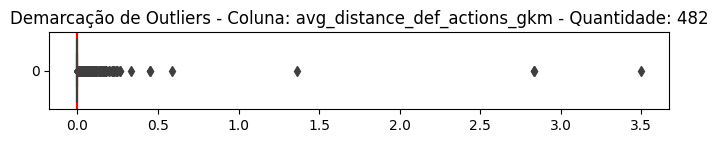



    OUTLIERS DA COLUNA LgRk
Limite Inferior: -10.000 
Limite Superior: 30.000
Outliers da coluna "LgRk": []


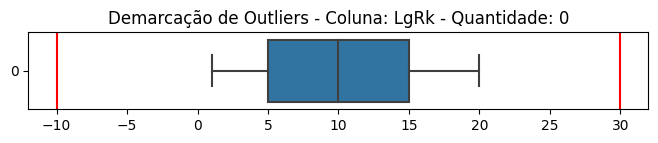



    OUTLIERS DA COLUNA MP
Limite Inferior: 38.000 
Limite Superior: 38.000
Outliers da coluna "MP": [27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 27.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.

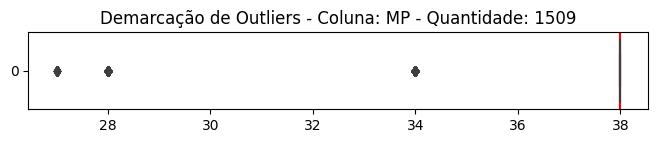



    OUTLIERS DA COLUNA W
Limite Inferior: -2.000 
Limite Superior: 30.000
Outliers da coluna "W": [32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0, 32.0]


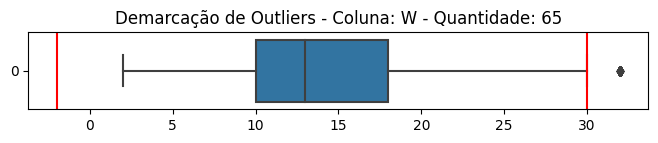



    OUTLIERS DA COLUNA D
Limite Inferior: 1.000 
Limite Superior: 17.000
Outliers da coluna "D": [18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0, 18.0]


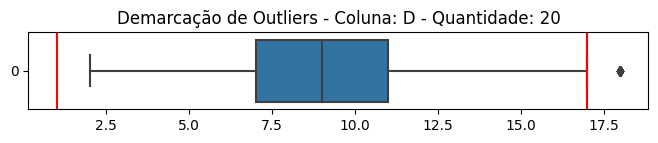



    OUTLIERS DA COLUNA L
Limite Inferior: -0.500 
Limite Superior: 27.500
Outliers da coluna "L": [28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 28.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0, 29.0]


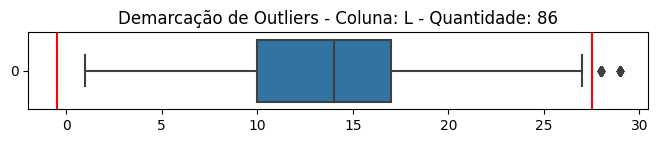



    OUTLIERS DA COLUNA GF
Limite Inferior: 6.500 
Limite Superior: 90.500
Outliers da coluna "GF": [92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 92.0, 94.0, 94.0, 94.0, 94.0, 94.0, 94.0, 94.0, 94.0, 94.0, 94.0, 94.0, 94.0, 94.0, 94.0, 94.0, 94.0, 94.0, 94.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 102.0, 102.0, 102.0, 102.0, 102.0, 102.0, 10

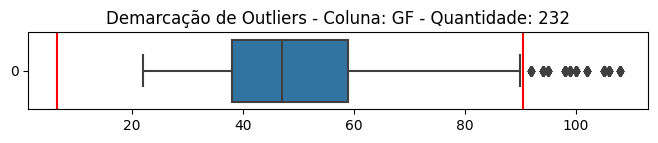



    OUTLIERS DA COLUNA GA
Limite Inferior: 14.000 
Limite Superior: 86.000
Outliers da coluna "GA": []


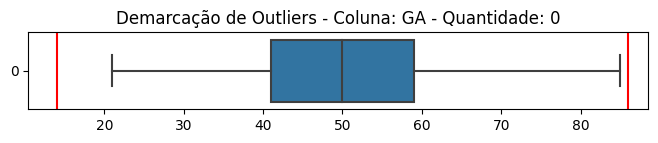



    OUTLIERS DA COLUNA GDiff
Limite Inferior: -67.500 
Limite Superior: 64.500
Outliers da coluna "GDiff": [67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 67.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 68.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 70.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 72.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79.0, 79

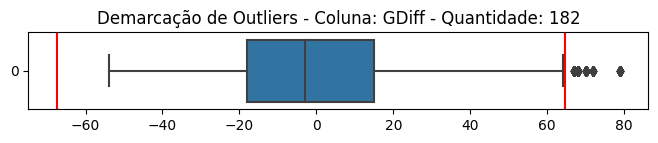



    OUTLIERS DA COLUNA Pts
Limite Inferior: 6.000 
Limite Superior: 94.000
Outliers da coluna "Pts": [95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 95.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 97.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 98.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 99.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]


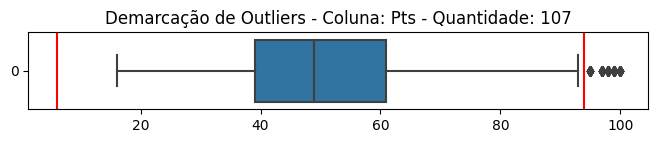



    OUTLIERS DA COLUNA Pts/G
Limite Inferior: 0.205 
Limite Superior: 2.485
Outliers da coluna "Pts/G": [2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.52, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.55, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.58, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.61, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63, 2.63]


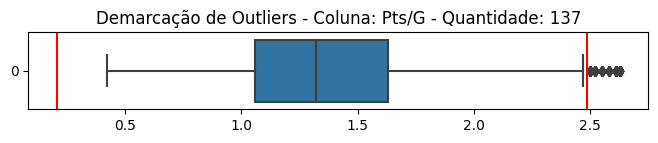



    OUTLIERS DA COLUNA xG
Limite Inferior: 15.850 
Limite Superior: 79.450
Outliers da coluna "xG": [80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 80.1, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.0, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 81.9, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.0, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 82.3, 83.3, 83.3, 83.3, 83.3, 83.3, 83.3, 83.3, 83.3, 83.3, 83.3, 83.3, 83.3, 83.3, 83.3, 83.3, 83.3, 83.3, 83.3, 89.1, 89.1, 89.1, 89.1, 89.1, 89.1, 89.1, 89.1, 89.1, 89.1, 89.1, 89.1, 89.1, 89.1, 89.1, 89.1, 89.1, 89.

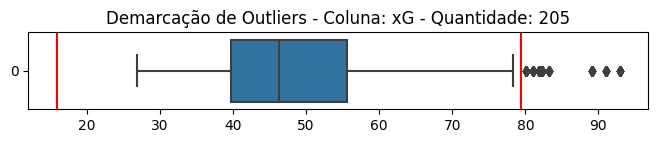



    OUTLIERS DA COLUNA xGA
Limite Inferior: 20.900 
Limite Superior: 75.300
Outliers da coluna "xGA": [75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 75.9, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 77.7, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1, 84.1]


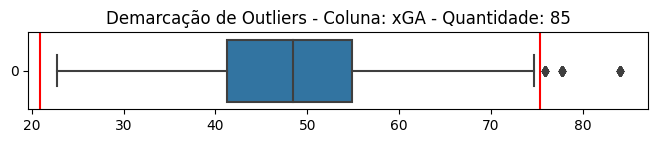



    OUTLIERS DA COLUNA xGDiff
Limite Inferior: -50.050 
Limite Superior: 47.950
Outliers da coluna "xGDiff": [48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.0, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 48.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 55.2, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.4, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 56.9, 57.1, 57.1, 57.1, 57.1, 

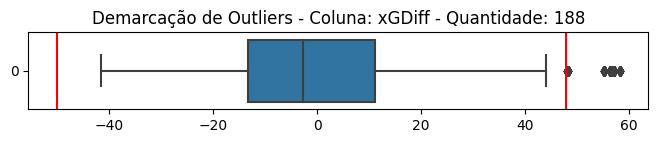



    OUTLIERS DA COLUNA xGDiff/90
Limite Inferior: -1.350 
Limite Superior: 1.290
Outliers da coluna "xGDiff/90": [1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.3, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.41, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.45, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.49, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.53, 1.53, 1.53, 1.53, 1.53, 1.53, 1.53, 1.53, 1.53, 1.53, 1.53, 1.53, 1.53, 1.53, 1.53, 1.53, 1.53, 1.53

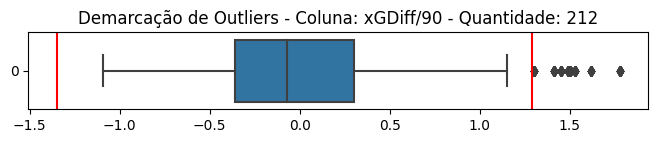



    OUTLIERS DA COLUNA Attendance
Limite Inferior: -24220.000 
Limite Superior: 74252.000
Outliers da coluna "Attendance": [74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74498.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 74976.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 75000.0, 76104.0, 76104.0, 76104.0, 76104.0, 76104.0, 76104.0, 76104.0, 76104.0, 7

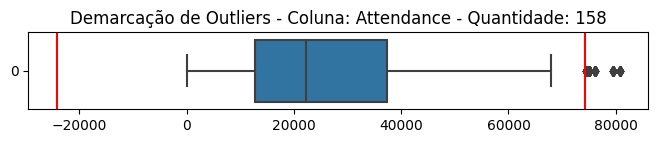



    OUTLIERS DA COLUNA CL
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "CL": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0,

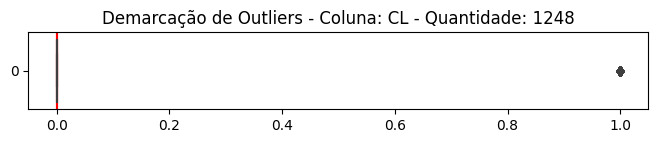



    OUTLIERS DA COLUNA WinCL
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "WinCL": [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


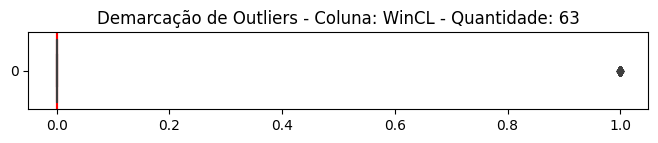



    OUTLIERS DA COLUNA CLBestScorer
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "CLBestScorer": [1.0, 1.0, 1.0]


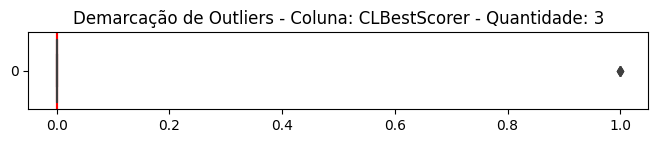



    OUTLIERS DA COLUNA Season
Limite Inferior: -3.000 
Limite Superior: 5.000
Outliers da coluna "Season": []


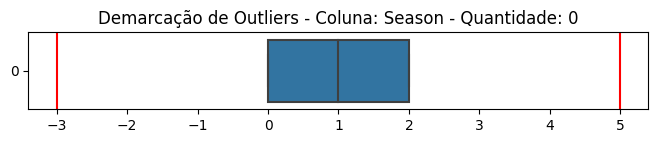



    OUTLIERS DA COLUNA DF
Limite Inferior: -1.500 
Limite Superior: 2.500
Outliers da coluna "DF": []


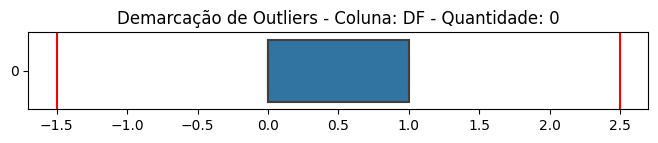



    OUTLIERS DA COLUNA FW
Limite Inferior: -1.500 
Limite Superior: 2.500
Outliers da coluna "FW": []


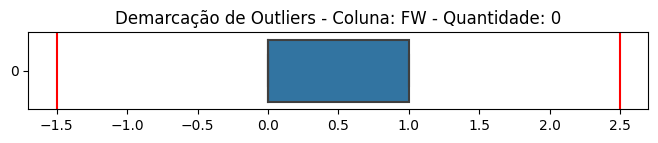



    OUTLIERS DA COLUNA GK
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "GK": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

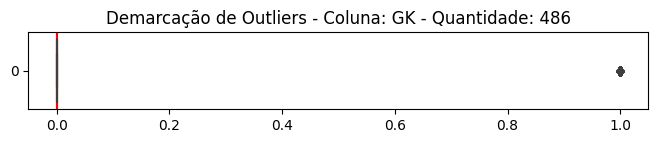



    OUTLIERS DA COLUNA MF
Limite Inferior: -1.500 
Limite Superior: 2.500
Outliers da coluna "MF": []


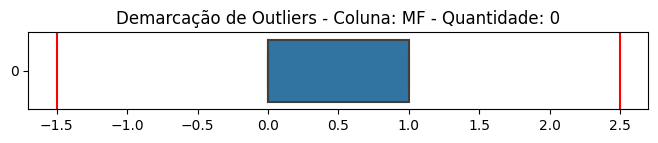



    OUTLIERS DA COLUNA Central Midfield
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Central Midfield": [1]


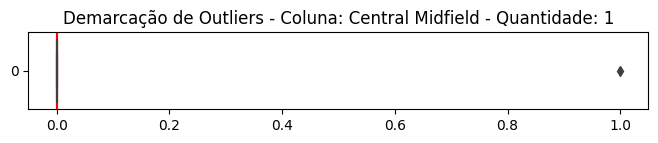



    OUTLIERS DA COLUNA Defender - Centre-Back
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Defender - Centre-Back": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

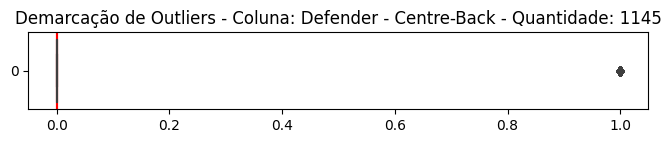



    OUTLIERS DA COLUNA Defender - Left-Back
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Defender - Left-Back": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

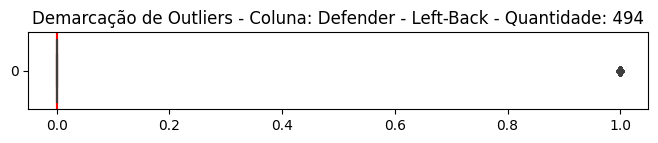



    OUTLIERS DA COLUNA Defender - Right-Back
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Defender - Right-Back": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

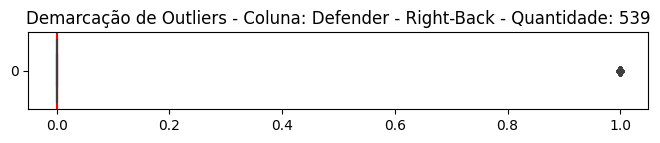



    OUTLIERS DA COLUNA Forward - Centre-Forward
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Forward - Centre-Forward": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

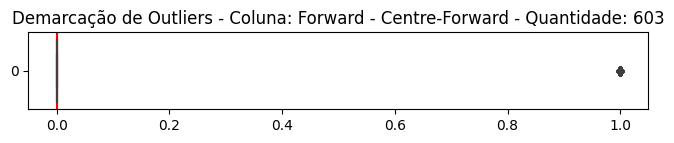



    OUTLIERS DA COLUNA Forward - Left Winger
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Forward - Left Winger": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


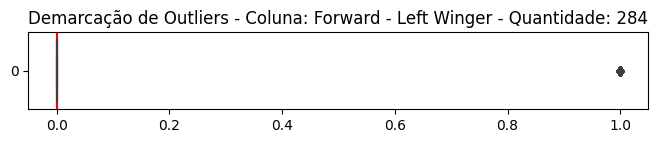



    OUTLIERS DA COLUNA Forward - Right Winger
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Forward - Right Winger": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

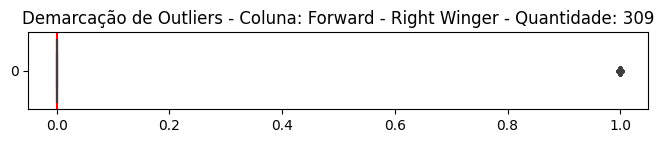



    OUTLIERS DA COLUNA Forward - Second Striker
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Forward - Second Striker": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


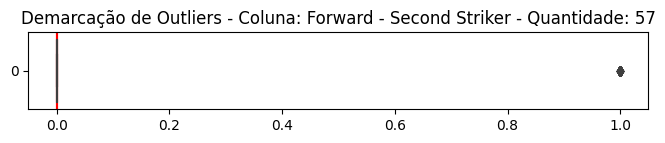



    OUTLIERS DA COLUNA Goalkeeper
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Goalkeeper": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

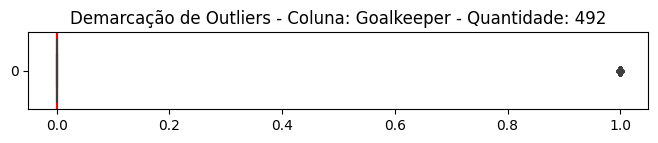



    OUTLIERS DA COLUNA Midfielder - Attacking Midfield
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Midfielder - Attacking Midfield": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


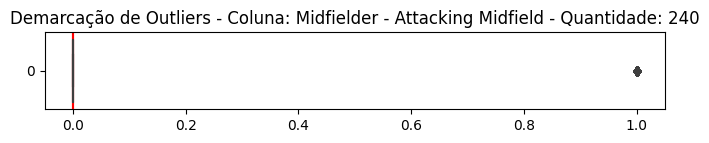



    OUTLIERS DA COLUNA Midfielder - Central Midfield
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Midfielder - Central Midfield": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

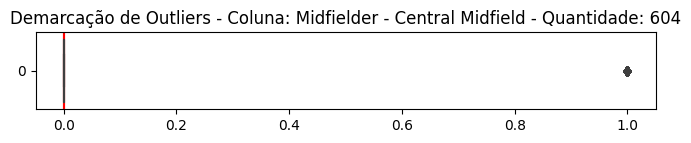



    OUTLIERS DA COLUNA Midfielder - Defensive Midfield
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Midfielder - Defensive Midfield": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

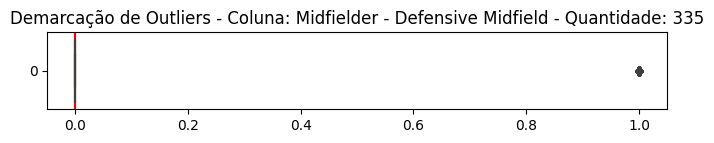



    OUTLIERS DA COLUNA Midfielder - Left Midfield
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Midfielder - Left Midfield": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


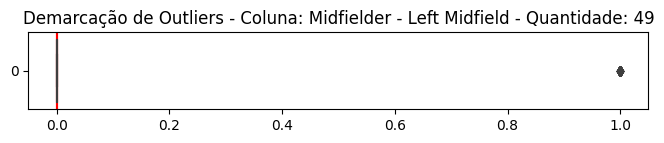



    OUTLIERS DA COLUNA Midfielder - Right Midfield
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "Midfielder - Right Midfield": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


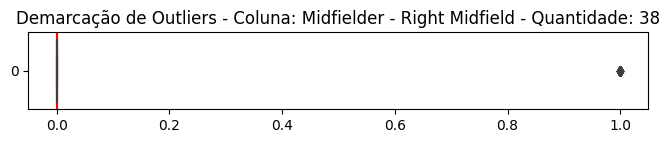



    OUTLIERS DA COLUNA attack - Centre-Forward
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "attack - Centre-Forward": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

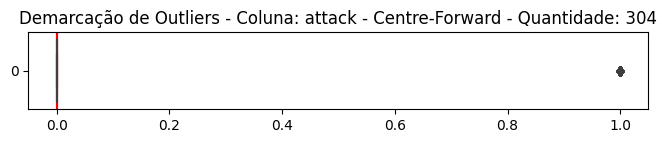



    OUTLIERS DA COLUNA attack - Left Winger
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "attack - Left Winger": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


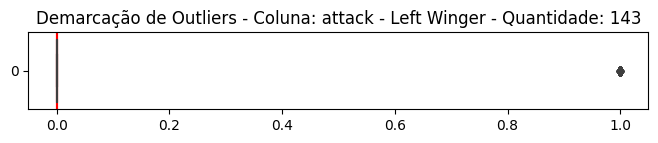



    OUTLIERS DA COLUNA attack - Right Winger
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "attack - Right Winger": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


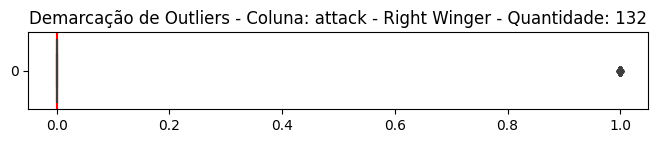



    OUTLIERS DA COLUNA attack - Second Striker
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "attack - Second Striker": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


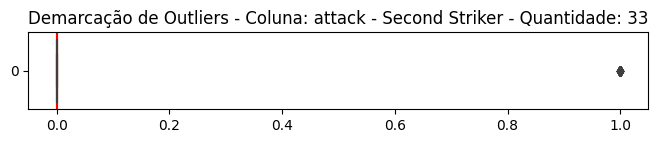



    OUTLIERS DA COLUNA midfield - Attacking Midfield
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "midfield - Attacking Midfield": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


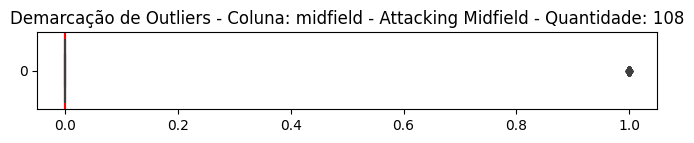



    OUTLIERS DA COLUNA midfield - Central Midfield
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "midfield - Central Midfield": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

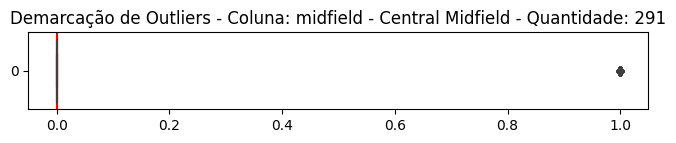



    OUTLIERS DA COLUNA midfield - Defensive Midfield
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "midfield - Defensive Midfield": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


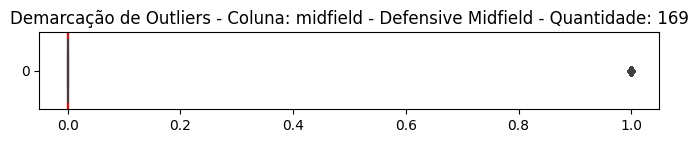



    OUTLIERS DA COLUNA midfield - Left Midfield
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "midfield - Left Midfield": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


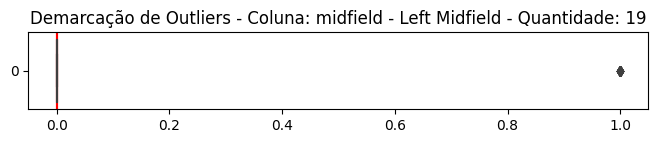



    OUTLIERS DA COLUNA midfield - Right Midfield
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "midfield - Right Midfield": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


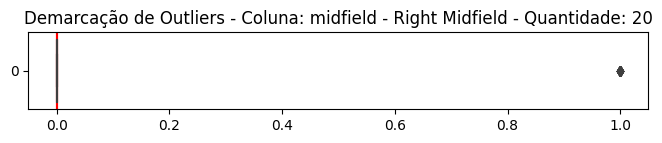



    OUTLIERS DA COLUNA both
Limite Inferior: 0.000 
Limite Superior: 0.000
Outliers da coluna "both": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


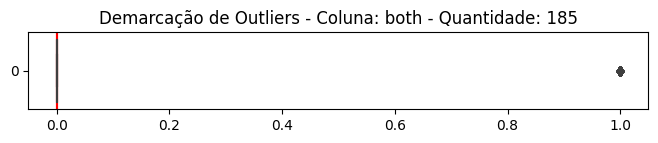



    OUTLIERS DA COLUNA left
Limite Inferior: -1.500 
Limite Superior: 2.500
Outliers da coluna "left": []


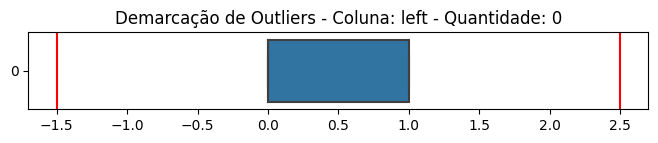



    OUTLIERS DA COLUNA right
Limite Inferior: -1.500 
Limite Superior: 2.500
Outliers da coluna "right": []


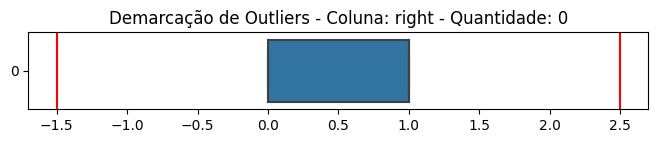

In [ ]:
for column in numerics:
  plot_outliers(column)

Apesar da maioria dos dados apresentar outliers em sua computação, isto não significa que sejam prejudiciais para o modelo. Pelo contrário, jogadores que possuem status mais elevado tendem a ter um valor superior, o que justifica a presença de outliers. Porém, após uma análise gráfica detalhada, concluímos que os verdadeiros outliers estão presentes nas colunas de `age`, `height` e variáveis dentro de jogo (como `gca_per90`, `gca_goal_per_90`, `gca_assist_per90`, entre outras).

Para garantir a precisão, abordaremos cada outlier individualmente, removendo ou corrigindo-os, assegurando a integridade dos dados e a eficácia dos modelos preditivos de valoração de jogadores de futebol.

### 4.6.2 Aboragem de outliers

#### 4.6.2.1 `age`

    OUTLIERS DA COLUNA age
Limite Inferior: 11.500 
Limite Superior: 39.500
Outliers da coluna "age": [0.0, 0.0, 0.0, 40.0, 40.0, 41.0, 41.0]


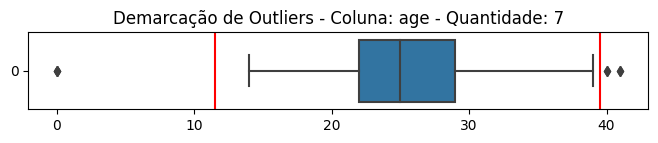

In [ ]:
plot_outliers('age')

Para preservar a integridade dos dados, os jogadores com idade zero serão removidos, enquanto aqueles acima do limite superior serão mantidos, já que correspondem às suas idades reais, garantindo a precisão na análise dos outliers.

In [ ]:
df_pre['age'] = df_pre['age'].astype(int)

In [ ]:
df_pre[df_pre['age'] == 0]

,nationality,squad,age,birth_year,value,height,league,games,games_starts,minutes,...,attack - Right Winger,attack - Second Striker,midfield - Attacking Midfield,midfield - Central Midfield,midfield - Defensive Midfield,midfield - Left Midfield,midfield - Right Midfield,both,left,right
944.0,57,18,0,0.0,15000.0,0.0,4,5.0,0.0,37.0,...,0,0,0,0,0,0,0,0,0,1
133.0,39,34,0,0.0,15000.0,186.0,1,3.0,0.0,30.0,...,0,0,0,0,0,0,0,0,0,1
2544.0,57,105,0,0.0,30000.0,188.0,4,2.0,2.0,180.0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
print(f'Before all:\t{df_pre.shape}')

df_pre = df_pre[df_pre['age'] != 0]

print(f'After all:\t{df_pre.shape}')

Before all:	 (6409, 425)
After all:	 (6406, 425)


    OUTLIERS DA COLUNA age
Limite Inferior: 11.500 
Limite Superior: 39.500
Outliers da coluna "age": [40, 40, 41, 41]


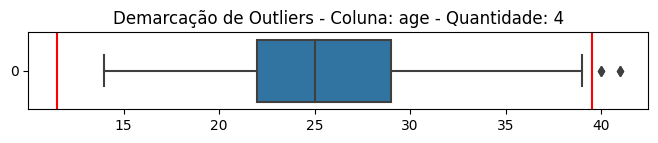

In [ ]:
plot_outliers('age')

#### 4.6.2.2 `height`

    OUTLIERS DA COLUNA height
Limite Inferior: 164.500 
Limite Superior: 200.500
Outliers da coluna "height": [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 162.0, 162.0, 162.0, 162.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 164.0, 164.0, 164.0, 164.0, 164.0, 201.0, 201.0, 201.0, 201.0, 201.0, 202.0, 202.0, 203.0]


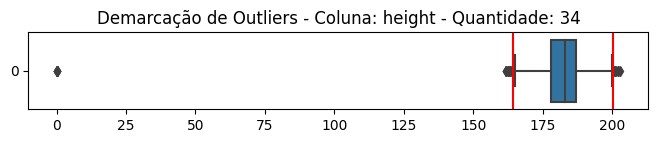

In [ ]:
plot_outliers('height')

In [ ]:
df_pre.loc[df_pre['height'] == 0, 'height'] = df_pre['height'].median()

Os jogadores com altura zero terão seus valores ajustados para a mediana da altura, evitando sensibilidade a dados irreais e mantendo a consistência na análise.

    OUTLIERS DA COLUNA height
Limite Inferior: 164.500 
Limite Superior: 200.500
Outliers da coluna "height": [162.0, 162.0, 162.0, 162.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 163.0, 164.0, 164.0, 164.0, 164.0, 164.0, 201.0, 201.0, 201.0, 201.0, 201.0, 202.0, 202.0, 203.0]


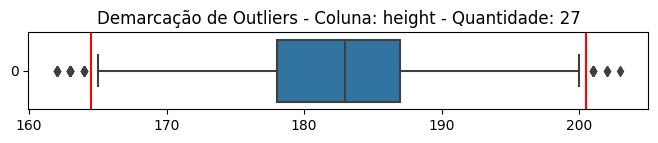

In [ ]:
plot_outliers('height')

#### 4.6.2.3 Variáveis `per90`

As variáveis de média por partida terão um limite estabelecido em 3, refletindo uma marca considerável dentro da realidade, embora possa ser influenciada por um número reduzido de partidas. No entanto, valores acima de 3 indicariam situações impossíveis em cenários reais.

In [ ]:
per90 = ['goals_per90', 'assists_per90', 'goals_assists_per90', 'goals_pens_per90', 'goals_assists_pens_per90']

######################################### goals_per90 #########################################
    OUTLIERS DA COLUNA goals_per90
Limite Inferior: -0.225 
Limite Superior: 0.375
Outliers da coluna "goals_per90": [0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0

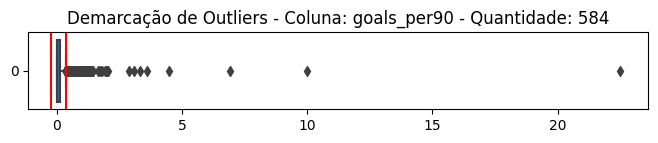



    OUTLIERS DA COLUNA goals_per90
Limite Inferior: -0.225 
Limite Superior: 0.375
Outliers da coluna "goals_per90": [0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.42, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43, 0.43,

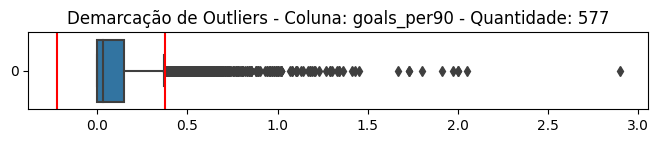



######################################### assists_per90 #########################################
    OUTLIERS DA COLUNA assists_per90
Limite Inferior: -0.180 
Limite Superior: 0.300
Outliers da coluna "assists_per90": [0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37

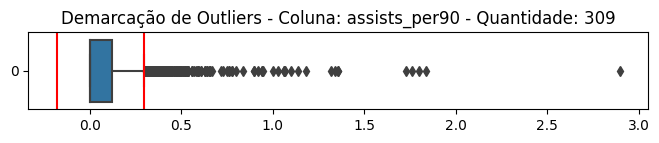



    OUTLIERS DA COLUNA assists_per90
Limite Inferior: -0.180 
Limite Superior: 0.300
Outliers da coluna "assists_per90": [0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.31, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.32, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.34, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 

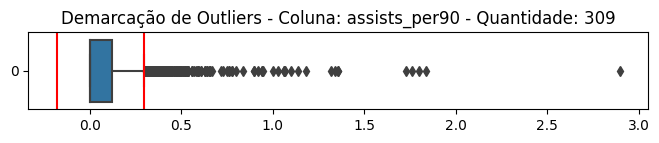



######################################### goals_assists_per90 #########################################
    OUTLIERS DA COLUNA goals_assists_per90
Limite Inferior: -0.435 
Limite Superior: 0.725
Outliers da coluna "goals_assists_per90": [0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.78, 0.78, 0.78, 0.78, 0.78, 0.78, 0.79, 0.79, 0.79, 0.79, 0.79, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.81, 0.81, 0.81, 0.81, 0.81, 0.81, 0.81, 0.82, 0.82, 0.82, 0.82, 0.82, 0.82, 0.82, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.85, 0.85, 0.85, 0.85, 0.85, 0.86, 0.86, 0.86, 0.86, 0.86, 0.86, 0.86, 0.87, 0.87, 0.88, 0.88, 0.88, 0.89

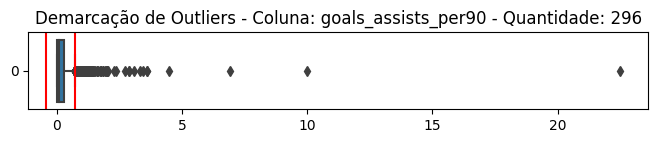



    OUTLIERS DA COLUNA goals_assists_per90
Limite Inferior: -0.420 
Limite Superior: 0.700
Outliers da coluna "goals_assists_per90": [0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.78, 0.78, 0.78, 0.78, 0.78, 0.78, 0.79, 0.79, 0.79, 0.79, 0.79, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.81, 0.81, 0.81, 0.81, 0.81, 0.81, 0.81, 0.82, 0.82, 0.82, 0.82, 0.82, 0.82, 0.82, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.85, 0.85, 0.85, 0.85, 0.85, 0.86, 0.86, 0.86, 0.86, 0.86, 0.86, 0.86, 0.87, 0.87, 0.88, 0.88, 0.88, 0.89, 0.89, 

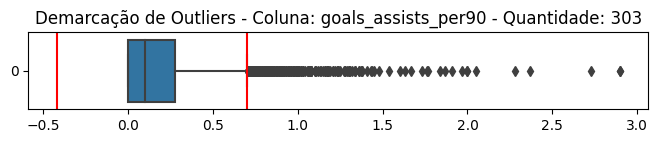



######################################### goals_pens_per90 #########################################
    OUTLIERS DA COLUNA goals_pens_per90
Limite Inferior: -0.210 
Limite Superior: 0.350
Outliers da coluna "goals_pens_per90": [0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.41, 0.41, 0.41, 0.4

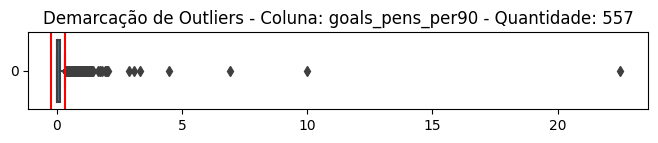



    OUTLIERS DA COLUNA goals_pens_per90
Limite Inferior: -0.210 
Limite Superior: 0.350
Outliers da coluna "goals_pens_per90": [0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.36, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.37, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.38, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.39, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.41, 0.

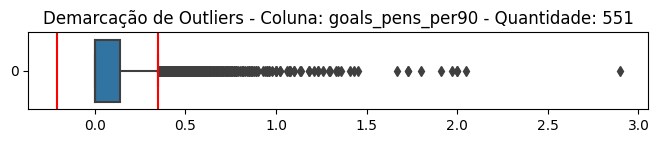



######################################### goals_assists_pens_per90 #########################################
    OUTLIERS DA COLUNA goals_assists_pens_per90
Limite Inferior: -0.405 
Limite Superior: 0.675
Outliers da coluna "goals_assists_pens_per90": [0.68, 0.68, 0.68, 0.68, 0.68, 0.68, 0.68, 0.69, 0.69, 0.69, 0.69, 0.69, 0.69, 0.69, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.71, 0.71, 0.71, 0.71, 0.71, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.78, 0.78, 0.78, 0.78, 0.78, 0.78, 0.79, 0.79, 0.79, 0.79, 0.79, 0.79, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.81, 0.81, 0.81, 0.81, 0.81, 0.82, 0.82, 0.82, 0.83, 0.83, 0.83,

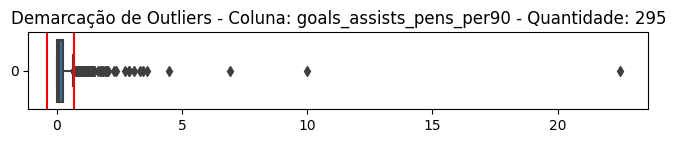



    OUTLIERS DA COLUNA goals_assists_pens_per90
Limite Inferior: -0.405 
Limite Superior: 0.675
Outliers da coluna "goals_assists_pens_per90": [0.68, 0.68, 0.68, 0.68, 0.68, 0.68, 0.68, 0.69, 0.69, 0.69, 0.69, 0.69, 0.69, 0.69, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.71, 0.71, 0.71, 0.71, 0.71, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.72, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.73, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.74, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.75, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.76, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.77, 0.78, 0.78, 0.78, 0.78, 0.78, 0.78, 0.79, 0.79, 0.79, 0.79, 0.79, 0.79, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.8, 0.81, 0.81, 0.81, 0.81, 0.81, 0.82, 0.82, 0.82, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.83, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.84, 0.85, 0.85, 0.85, 0.85, 0.85, 

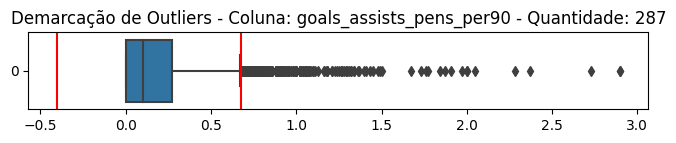

In [ ]:
high_limit = 3

for var in per90:
  print(f'######################################### {var} #########################################')
  plot_outliers(var)
  df_pre.loc[df_pre[var] >= high_limit, var] = df_pre[var].median()
  plot_outliers(var)

# 5.0 Processamento

---

## 5.1 Divisão entre Treino e Teste

In [ ]:
X, Y = df_pre.drop('value', axis=1), df_pre['value']

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, shuffle=True, random_state=42)

print(f'(X train, Y train): {X_train.shape} {Y_train.shape}')
print(f'(X test, Y test):   {X_test.shape} {Y_test.shape}')

(X train, Y train): (5124, 424) (5124,)
(X test, Y test):   (1282, 424) (1282,)


## 5.2 Redimensionamento de dados

redimensionar os dados é essencial para garantir que todas as variáveis tenham influência equilibrada durante o treinamento dos modelos de previsão de valores de jogadores. Isso evita que uma única característica com valores maiores domine a análise, melhorando a precisão das previsões e a eficiência dos algoritmos utilizados.

In [ ]:
scaler = MinMaxScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## 5.3 Modelos

Esses modelos abrangem uma variedade de algoritmos de regressão. Alguns, como Linear Regression, Ridge, Lasso e ElasticNet, são variações de regressão linear com diferentes formas de regularização. Outros, como Decision Tree, Random Forest e Gradient Boosting, são baseados em árvores de decisão, cada um com ajustes específicos. Há também modelos baseados em redes neurais, como MLPRegressor, e métodos mais avançados, como SVR (Support Vector Regression), XGBRegressor (XGBoost) e LGBMRegressor (LightGBM), que oferecem flexibilidade e desempenho robusto com ajustes em parâmetros chave, como número de estimadores, profundidade máxima, taxas de aprendizado e mais.

In [ ]:
model_params = {
    'LinearRegression': {
        'model': LinearRegression(),
        'params': {}
    },
    'Ridge': {
        'model': Ridge(),
        'params': {
            'alpha': [10.0, 30.0, 50.0]
            }
    },
    'Lasso': {
        'model': Lasso(),
        'params': {
            'alpha': [10.0, 30.0, 50.0]
            }
    },
    'ElasticNet': {
        'model': ElasticNet(),
        'params': {
            'alpha': [0.1, 1.0, 10.0],
            'l1_ratio': [0.5, 0.75, 1]
            }
    },
    'HuberRegressor': {
        'model': HuberRegressor(),
        'params': {
            'epsilon': [2.0, 2.5, 3]
            }
    },
    'SVR': {
        'model': SVR(),
        'params': {
            'kernel': ['linear', 'rbf'],
            'C': [1000, 10000]
            }
    },
    'DecisionTreeRegressor': {
        'model': DecisionTreeRegressor(),
        'params': {
            'max_depth': [None, 5, 10]
            }
    },
    'RandomForestRegressor': {
        'model': RandomForestRegressor(),
        'params': {
            'n_estimators': [200, 400, 600]
            }
    },
    'GradientBoostingRegressor': {
        'model': GradientBoostingRegressor(),
        'params': {
            'n_estimators': [100, 200],
            'learning_rate': [0.01, 0.1, 0.5]
            }
    },
    'MLPRegressor': {
        'model': MLPRegressor(),
        'params': {
            'hidden_layer_sizes': [(50,), (100,), (50, 50)],
            'activation': ['relu', 'tanh']
            }
    },
    'XGBRegressor': {
        'model': xgb.XGBRegressor(),
        'params': {
            'n_estimators': [600, 700, 800],
            'learning_rate': [1e-2, 1e-1, 0.5],
            'subsample': [0.5, 0.7, 0.9, 1.0],
            }
    },
    'LGBMRegressor': {
        'model': lgb.LGBMRegressor(),
        'params': {
            'n_estimators': [50, 100, 200],
            'learning_rate': [0.01, 0.1, 0.5]
            }
    }
}

### 5.3.1 GridSearch com CrossValidation

Os modelos mencionados passarão por um processo de fine-tuning utilizando GridSearch com validação cruzada (CV) 5. Isso significa que serão exploradas combinações específicas de hiperparâmetros para cada modelo, usando uma validação cruzada de 5 folds para determinar a configuração ótima que melhor se ajusta aos dados. Essa abordagem visa encontrar os melhores conjuntos de parâmetros para otimizar o desempenho preditivo de cada modelo.

In [ ]:
model_best_params = {}

for model_name, config in model_params.items():
  print(f'Running GridSearchCV for {model_name}...')
  grid_search = GridSearchCV(config['model'], config['params'], cv=5, scoring='neg_mean_squared_error')
  grid_search.fit(X_train, Y_train)

  best_score = np.sqrt(-grid_search.best_score_)

  print(f'Best Parameters: {grid_search.best_params_}')
  print(f'Best Score (RMSE): {best_score:e}\n\n')

  model_best_params[model_name] = {
      'model': config['model'],
      'best_param': grid_search.best_params_,
      'best_score': best_score
  }

Devido a demora de execução do colab, o código foi executado de forma separada e seus resultados salvos no formato csv.

In [ ]:
df_best_params = pd.read_csv('/content/drive/MyDrive/Kaggle/PlayerValue/best_paramns.csv', header=0)

model_best_params = df_best_params.to_dict()

for model_name, config in model_best_params.items():
    print(f'Running GridSearchCV for {model_name}...')
    print(f'Best Parameters: {config["best_param"]}')
    print(f'Best Score (RMSE): {float(config["best_score"]):e}\n')

Running GridSearchCV for LinearRegression...
Best Parameters: {}
Best Score (RMSE): 1.665353e+11

Running GridSearchCV for Ridge...
Best Parameters: {'alpha': 10.0}
Best Score (RMSE): 1.050350e+07

Running GridSearchCV for Lasso...
Best Parameters: {'alpha': 50.0}
Best Score (RMSE): 1.248685e+07

Running GridSearchCV for ElasticNet...
Best Parameters: {'alpha': 0.1, 'l1_ratio': 0.75}
Best Score (RMSE): 1.099239e+07

Running GridSearchCV for HuberRegressor...
Best Parameters: {'epsilon': 2.5}
Best Score (RMSE): 1.298696e+07

Running GridSearchCV for SVR...
Best Parameters: {'C': 10000, 'kernel': 'linear'}
Best Score (RMSE): 1.437412e+07

Running GridSearchCV for DecisionTreeRegressor...
Best Parameters: {'max_depth': 10}
Best Score (RMSE): 1.262520e+07

Running GridSearchCV for RandomForestRegressor...
Best Parameters: {'n_estimators': 200}
Best Score (RMSE): 9.374836e+06

Running GridSearchCV for GradientBoostingRegressor...
Best Parameters: {'learning_rate': 0.1, 'n_estimators': 200}


# 6.0 Avaliação do melhor desempenho (`best_params`)

---

## 6.1 Qual o melhor modelo?

Após a busca por diversos algoritmos e a otimização de parâmetros por meio do GridSearch com validação cruzada 5-fold, a avaliação se concentrará no modelo que demonstrou o melhor desempenho. A seleção se baseará nos resultados da validação cruzada, identificando o algoritmo com os parâmetros mais adequados para atender aos critérios de performance definidos.

In [ ]:
min_best_score = float('inf')
min_best_score_attribute = None

for attribute, model_params in model_best_params.items():
    best_score = float(model_params['best_score'])
    if best_score < min_best_score:
        min_best_score = best_score
        min_best_score_attribute = attribute

print(f'Minimum best_score: {min_best_score:e}')
print(f'Attribute name with minimum best_score: {min_best_score_attribute}')

Minimum best_score: 8.782069e+06
Attribute name with minimum best_score: LGBMRegressor


## 6.2 Predição de `X_test`

In [ ]:
best_model = eval(model_best_params[min_best_score_attribute]['model'])

new_param = eval(model_best_params[min_best_score_attribute]['best_param'])

best_model.set_params(**new_param)

best_model.fit(X_train, Y_train)

predictions = best_model.predict(X_test)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 62570
[LightGBM] [Info] Number of data points in the train set: 5124, number of used features: 420
[LightGBM] [Info] Start training from score 10408840.524980


## 6.3 Avaliação por métricas

Métricas que serão utilizadas para a avaliação:

1. **Mean Absolute Error (MAE)**: Calcula a média das diferenças absolutas entre as previsões e os valores reais.
2. **Mean Squared Error (MSE):** Calcula a média das diferenças quadradas entre as previsões e os valores reais.
3. **Root Mean Squared Error (RMSE)**: Raiz quadrada do MSE. Oferece uma interpretação na mesma unidade que o alvo.
4. **R² Score (R-squared)**: Indica a proporção da variância nos valores da variável dependente que é previsível a partir dos recursos independentes. Varia de 0 a 1, onde 1 indica um ajuste perfeito.

In [ ]:
print(f'############################ {min_best_score_attribute} ############################')
print(f'Mean Absolute Error (MAE):\t{mean_absolute_error(Y_test, predictions):e}')
print(f'Mean Squared Error (MSE):\t{mean_squared_error(Y_test, predictions):e}')
print(f'Root Mean Squared Error (RMSE):\t{np.sqrt(mean_squared_error(Y_test, predictions)):e}')
print(f'R² Score (R-squared):\t{r2_score(Y_test, predictions)}')

############################ LGBMRegressor ############################
Mean Absolute Error (MAE):	4.232256e+06
Mean Squared Error (MSE):	5.416315e+13
Root Mean Squared Error (RMSE):	7.359562e+06
R² Score (R-squared):	0.8114547460702778


O modelo mostrou robustez ao exibir desempenho superior nos dados de teste em relação aos dados de treinamento, indicando uma capacidade consistente de generalização sem sinais de overfitting.

## 6.4 Visualização das predições

Ao plotarmos os pontos de Y_test e predictions, visualizaremos a discrepância entre as previsões do modelo e os valores reais. Essa representação gráfica revelará instantaneamente onde o modelo acerta em cheio ou falha, proporcionando insights visuais sobre a performance e precisão do mesmo.

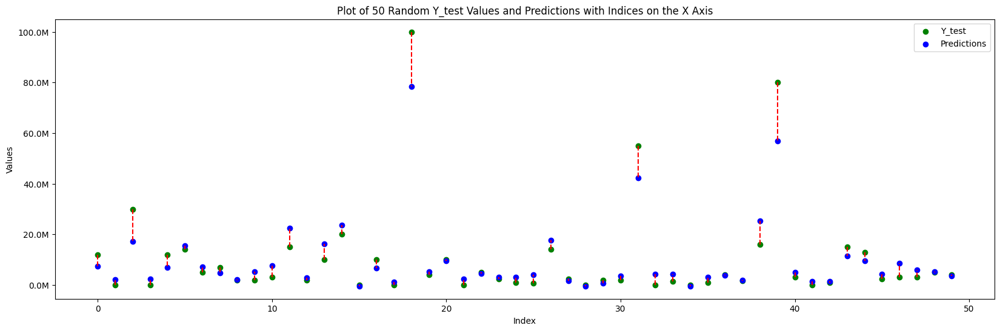

In [ ]:
n = 50

inds = [i for i in range(n)]

y1 = Y_test.values[:n]
y2 = predictions[:n]

plt.figure(figsize=(20, 6))

plt.scatter(inds, y1, color='green', label='Y_test')
plt.scatter(inds, y2, color='blue', label='Predictions')

for i in range(n):
    plt.plot([inds[i], inds[i]], [y1[i], y2[i]], color='red', linestyle='--')

plt.xlabel('Index')
plt.ylabel('Values')
plt.title('Plot of 50 Random Y_test Values and Predictions with Indices on the X Axis')

plt.gca().yaxis.set_major_formatter(formatter)
plt.legend()
plt.show()

# 7.0 Conclusão

---

Explorar o pipeline da inteligência de dados foi fundamental neste projetos. Este estudo mergulha na valoração de jogadores no futebol europeu, usando dados do Kaggle, ressaltando o LGBMRegressor como a ferramenta mais precisa, com MAE de 4.23e+06, MSE de 5.42e+13, RMSE de 7.36e+06 e R² de 0.81. Isso não só revela a precisão do modelo, mas também destaca a importância dos dados na estratégia de times e transferências. Essa fusão entre análise de dados e futebol delineia o cenário contemporâneo, onde insights preditivos moldam o futuro esportivo.